<a href="https://colab.research.google.com/github/dimna21/ML_Final_Project/blob/main/model_experiment_XGB.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# import tables

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

import pandas as pd
import numpy as np
features = pd.read_csv('/content/drive/MyDrive/ML_Final_Project/features.csv')
stores = pd.read_csv('/content/drive/MyDrive/ML_Final_Project/stores.csv')
train = pd.read_csv('/content/drive/MyDrive/ML_Final_Project/train.csv')
test = pd.read_csv('/content/drive/MyDrive/ML_Final_Project/test.csv')

Mounted at /content/drive


In [ ]:
features.columns, stores.columns, train.columns, test.columns

(Index(['Store', 'Date', 'Temperature', 'Fuel_Price', 'MarkDown1', 'MarkDown2',
        'MarkDown3', 'MarkDown4', 'MarkDown5', 'CPI', 'Unemployment',
        'IsHoliday'],
       dtype='object'),
 Index(['Store', 'Type', 'Size'], dtype='object'),
 Index(['Store', 'Dept', 'Date', 'Weekly_Sales', 'IsHoliday'], dtype='object'),
 Index(['Store', 'Dept', 'Date', 'IsHoliday'], dtype='object'))

# preprocessors

# merger clean

In [ ]:
from sklearn.base import BaseEstimator, TransformerMixin

class BaseMerger(BaseEstimator, TransformerMixin):
    def __init__(self, features, stores):
        self.feature_store = features.merge(stores, how='inner', on='Store')
        self.feature_store['Date'] = pd.to_datetime(self.feature_store['Date'])

    def fit(self, X, y=None):
        return self

    def transform(self, X):
        X = X.copy()
        X['Date'] = pd.to_datetime(X['Date'])
        merged = X.merge(self.feature_store, how='inner', on=['Store', 'Date', 'IsHoliday'])
        merged = merged.sort_values(by=['Store', 'Dept', 'Date']).reset_index(drop=True)
        return merged

# encoder clean

In [ ]:
class CategoricalEncoder(BaseEstimator, TransformerMixin):
    def __init__(self):
        self.type_mapping = {'A': 3, 'B': 2, 'C': 1}
        self.holiday_mapping = {False: 0, True: 1}

    def fit(self, X, y=None):
        return self

    def transform(self, X):
        X = X.copy()

        if 'Type' in X.columns:
            X['Type'] = X['Type'].map(self.type_mapping)

        if 'IsHoliday' in X.columns:
            X['IsHoliday'] = X['IsHoliday'].map(self.holiday_mapping)

        return X

# markdown filler clean

In [ ]:
class MarkdownFiller(BaseEstimator, TransformerMixin):
    def __init__(self):
        self.markdown_cols = ['MarkDown1', 'MarkDown2', 'MarkDown3', 'MarkDown4', 'MarkDown5']
        self.mean_values = {}

    def fit(self, X, y=None):
        return self

    def transform(self, X):
        X = X.copy()

        # Fill markdowns with 0
        for col in self.markdown_cols:
            if col in X.columns:
                X[col] = X[col].fillna(0.0)


        return X

# cpi/unemploymnet interpolator fe

In [ ]:
from scipy import stats
from sklearn.base import BaseEstimator, TransformerMixin
import pandas as pd

class TrendInterpolator(BaseEstimator, TransformerMixin):
    """
    Interpolates missing CPI and Unemployment using a recent N‑month linear trend per Store.
    """
    def __init__(self, lookback_months: int = 12):
        self.lookback_months = lookback_months

    def fit(self, X, y=None):
        # Nothing to learn—just return self
        return self

    def transform(self, df: pd.DataFrame) -> pd.DataFrame:
        data = df.copy()

        # If no date column, bail out
        if 'Date' not in data.columns:
            return data

        # Ensure datetime
        data['Date'] = pd.to_datetime(data['Date'])

        # Only try to interpolate if those columns exist
        do_cpi = 'CPI' in data.columns
        do_unemp = 'Unemployment' in data.columns

        # If neither exists, skip
        if not (do_cpi or do_unemp):
            return data

        out_frames = []
        # Group by store (or the whole DF if Store missing)
        group_key = ['Store'] if 'Store' in data.columns else []
        for _, group in data.groupby(group_key, as_index=False):
            block = group.sort_values('Date').copy()
            # Numeric time for regression
            block['date_num'] = block['Date'].astype('int64')

            # Helper to interpolate a single column
            def _interp(col):
                mask = block[col].isna()
                if not mask.any():
                    return

                known = block.loc[~mask, ['Date', 'date_num', col]]
                if len(known) < 2:
                    return

                # Only use recent lookback_months
                cutoff = known['Date'].max() - pd.DateOffset(months=self.lookback_months)
                recent = known[known['Date'] >= cutoff]
                if len(recent) < 2:
                    return

                slope, intercept, *_ = stats.linregress(
                    recent['date_num'], recent[col]
                )
                block.loc[mask, col] = (
                    slope * block.loc[mask, 'date_num'] + intercept
                )

            if do_cpi:
                _interp('CPI')
            if do_unemp:
                _interp('Unemployment')

            block.drop(columns='date_num', inplace=True)
            out_frames.append(block)

        # Re‑concatenate in original order
        filled = pd.concat(out_frames, ignore_index=True)
        # If original df had a different order, reindex to match
        return filled.loc[df.index].reset_index(drop=True)

# from scipy import stats

# def cpi_unemp_interpolate(features_df, lookback_months=12):
#     """
#     Alternative approach: Use only recent trend (last N months) for extrapolation.
#     This might be more accurate for economic indicators.
#     """
#     features_interpolated = features_df.copy()

#     interpolated_dfs = []

#     for store_id in features_interpolated['Store'].unique():
#         store_data = features_interpolated[features_interpolated['Store'] == store_id].copy()
#         store_data = store_data.sort_values(by='Date')

#         # Convert dates to numeric
#         store_data['date_numeric'] = pd.to_numeric(store_data['Date'])

#         # Handle CPI
#         cpi_missing_mask = store_data['CPI'].isna()
#         if cpi_missing_mask.any():
#             # Use only recent non-missing values
#             cpi_known = store_data[~cpi_missing_mask]

#             if len(cpi_known) > 1:
#                 # Use only last lookback_months for trend calculation
#                 lookback_cutoff = cpi_known['Date'].max() - pd.DateOffset(months=lookback_months)
#                 recent_cpi = cpi_known[cpi_known['Date'] >= lookback_cutoff]

#                 if len(recent_cpi) > 1:
#                     slope_cpi, intercept_cpi, _, _, _ = stats.linregress(
#                         recent_cpi['date_numeric'], recent_cpi['CPI']
#                     )

#                     missing_dates = store_data.loc[cpi_missing_mask, 'date_numeric']
#                     store_data.loc[cpi_missing_mask, 'CPI'] = (
#                         slope_cpi * missing_dates + intercept_cpi
#                     )

#         # Handle Unemployment
#         unemp_missing_mask = store_data['Unemployment'].isna()
#         if unemp_missing_mask.any():
#             unemp_known = store_data[~unemp_missing_mask]

#             if len(unemp_known) > 1:
#                 # Use only recent data for trend
#                 lookback_cutoff = unemp_known['Date'].max() - pd.DateOffset(months=lookback_months)
#                 recent_unemp = unemp_known[unemp_known['Date'] >= lookback_cutoff]

#                 if len(recent_unemp) > 1:
#                     slope_unemp, intercept_unemp, _, _, _ = stats.linregress(
#                         recent_unemp['date_numeric'], recent_unemp['Unemployment']
#                     )

#                     missing_dates = store_data.loc[unemp_missing_mask, 'date_numeric']
#                     store_data.loc[unemp_missing_mask, 'Unemployment'] = (
#                         slope_unemp * missing_dates + intercept_unemp
#                     )

#         store_data = store_data.drop('date_numeric', axis=1)
#         interpolated_dfs.append(store_data)

#     features_interpolated = pd.concat(interpolated_dfs, ignore_index=True)
#     features_interpolated = features_interpolated.sort_values(['Store', 'Date']).reset_index(drop=True)

#     return features_interpolated

# seasonal fe

In [ ]:
class AdvancedSeasonalFeatures(BaseEstimator, TransformerMixin):
    """
    Creates sophisticated seasonal and cyclical features
    """
    def __init__(self):
        # Define holiday periods more precisely
        self.holiday_periods = {
            'thanksgiving_period': [
                ('2010-11-19', '2010-11-26'),
                ('2011-11-18', '2011-11-25'),
                ('2012-11-16', '2012-11-23'),
                ('2013-11-22', '2013-11-29')
            ],
            'christmas_period': [
                ('2010-12-17', '2010-12-31'),
                ('2011-12-16', '2011-12-30'),
                ('2012-12-21', '2012-12-28'),
                ('2013-12-20', '2013-12-27')
            ],
            'superbowl_period': [
                ('2010-02-05', '2010-02-12'),
                ('2011-02-04', '2011-02-11'),
                ('2012-02-03', '2012-02-10'),
                ('2013-02-01', '2013-02-08')
            ],
            'labor_day_period': [
                ('2010-09-03', '2010-09-10'),
                ('2011-09-02', '2011-09-09'),
                ('2012-08-31', '2012-09-07'),
                ('2013-08-30', '2013-09-06')
            ]
        }

    def fit(self, X, y=None):
        return self

    def transform(self, X):
        df = X.copy()
        df['Date'] = pd.to_datetime(df['Date'])

        # Basic date parts
        df['Day'] = df['Date'].dt.day
        df['Month'] = df['Date'].dt.month
        df['Year'] = df['Date'].dt.year
        df['week_of_year'] = df['Date'].dt.isocalendar().week

        # Cyclical encoding of month
        df['month_sin'] = np.sin(2 * np.pi * df['Month'] / 12)
        df['month_cos'] = np.cos(2 * np.pi * df['Month'] / 12)

        # Cyclical encoding of week
        df['week_sin'] = np.sin(2 * np.pi * df['week_of_year'] / 52)
        df['week_cos'] = np.cos(2 * np.pi * df['week_of_year'] / 52)

        # Compute days to and since holidays per year
        df['Days_to_Thanksgiving'] = np.nan
        df['Days_to_Christmas'] = np.nan
        df['days_since_thanksgiving'] = np.nan
        df['days_since_christmas'] = np.nan

        for year in [2010, 2011, 2012, 2013]:
            mask = df['Year'] == year
            if not mask.any():
                continue
            thanksgiving = pd.to_datetime(f'{year}-11-24')
            christmas = pd.to_datetime(f'{year}-12-25')

            df.loc[mask, 'Days_to_Thanksgiving'] = (thanksgiving - df.loc[mask, 'Date']).dt.days
            df.loc[mask, 'Days_to_Christmas'] = (christmas - df.loc[mask, 'Date']).dt.days
            df.loc[mask, 'days_since_thanksgiving'] = (df.loc[mask, 'Date'] - thanksgiving).dt.days
            df.loc[mask, 'days_since_christmas'] = (df.loc[mask, 'Date'] - christmas).dt.days

        # Advanced holiday period flags
        for holiday_name, periods in self.holiday_periods.items():
            df[f'{holiday_name}_flag'] = 0
            for start, end in periods:
                mask = (df['Date'] >= start) & (df['Date'] <= end)
                df.loc[mask, f'{holiday_name}_flag'] = 1

        # Pre- and post-holiday intensity
        df['pre_thanksgiving_intensity'] = np.where(
            (df['Days_to_Thanksgiving'] <= 14) & (df['Days_to_Thanksgiving'] > 0),
            15 - df['Days_to_Thanksgiving'], 0
        )
        df['pre_christmas_intensity'] = np.where(
            (df['Days_to_Christmas'] <= 21) & (df['Days_to_Christmas'] > 0),
            22 - df['Days_to_Christmas'], 0
        )
        df['post_holiday_effect'] = np.where(
            ((df['days_since_thanksgiving'] > 0) & (df['days_since_thanksgiving'] <= 7)) |
            ((df['days_since_christmas'] > 0) & (df['days_since_christmas'] <= 14)),
            1, 0
        )

        # Drop intermediate columns
        df = df.drop(columns=['week_of_year'], errors='ignore')
#        df = df.drop('Date', axis=1)

        return df


# statistical fe

In [ ]:
class StatisticalSalesFeatures(BaseEstimator, TransformerMixin):
    """
    Computes and attaches statistical sales features:
      - Mean, std, median per Store
      - Mean, std, median per Dept
      - Mean, std, median per (Store, Dept)
    Fallback logic for unseen combos:
      sd_* → store_* → global
      dept_* → global
    """
    def fit(self, X, y=None):
        df = X.copy()
        # 1) Store-level
        self.store_stats_ = (
            df.groupby('Store')['Weekly_Sales']
              .agg(['mean', 'std', 'median'])
              .rename(columns={
                  'mean': 'store_mean_sales',
                  'std':  'store_std_sales',
                  'median':'store_median_sales'
              })
        )
        # 2) Dept-level
        self.dept_stats_ = (
            df.groupby('Dept')['Weekly_Sales']
              .agg(['mean', 'std', 'median'])
              .rename(columns={
                  'mean': 'dept_mean_sales',
                  'std':  'dept_std_sales',
                  'median':'dept_median_sales'
              })
        )
        # 3) Store-Dept level
        self.store_dept_stats_ = (
            df.groupby(['Store','Dept'])['Weekly_Sales']
              .agg(['mean','std','median'])
              .rename(columns={
                  'mean': 'sd_mean_sales',
                  'std':  'sd_std_sales',
                  'median':'sd_median_sales'
              })
        )
        # 4) Global fallbacks (for dept-level only)
        global_mean   = df['Weekly_Sales'].mean()
        global_std    = df['Weekly_Sales'].std()
        global_median = df['Weekly_Sales'].median()
        self.global_stats_ = {
            'dept_mean_sales':   global_mean,
            'dept_std_sales':    global_std,
            'dept_median_sales': global_median
        }
        return self

    def transform(self, X):
        df = X.copy()
        # Merge in all three levels
        df = df.merge(self.store_stats_,
                      how='left',
                      left_on='Store',
                      right_index=True)
        df = df.merge(self.dept_stats_,
                      how='left',
                      left_on='Dept',
                      right_index=True)
        df = df.merge(self.store_dept_stats_,
                      how='left',
                      left_on=['Store','Dept'],
                      right_index=True)

        # Fallback sd_* → store_*
        for stat in ['mean','std','median']:
            sd_col    = f'sd_{stat}_sales'
            store_col = f'store_{stat}_sales'
            df[sd_col] = df[sd_col].fillna(df[store_col])

        # Fallback dept_* → global
        for col, global_val in self.global_stats_.items():
            df[col] = df[col].fillna(global_val)

        return df


# lag fe

In [ ]:
# class ImprovedLagFeatureTransformer(BaseEstimator, TransformerMixin):
#     """
#     Enhanced lag features with robust handling for unseen Store-Dept combos.
#     """
#     def __init__(self,
#                  lags=[1, 2, 3, 5, 26, 52],
#                  rolling_windows=[4, 8],
#                  ewm_spans=[4, 8],
#                  drop_na=False):  # no dropping
#         self.lags = lags
#         self.rolling_windows = rolling_windows
#         self.ewm_spans = ewm_spans
#         self.drop_na = drop_na
#         self.lag_stats_ = {}
#         self.global_mean_ = None
#         self.store_means_ = {}

#     def fit(self, X, y=None):
#         df = X.copy()
#         df['Date'] = pd.to_datetime(df['Date'])
#         df = df.sort_values(['Store', 'Dept', 'Date'])

#         # global mean
#         self.global_mean_ = df['Weekly_Sales'].mean()
#         # store-level mean
#         self.store_means_ = df.groupby('Store')['Weekly_Sales'].mean().to_dict()

#         # compute history for each group
#         for (store, dept), group in df.groupby(['Store', 'Dept']):
#             grp = group.sort_values('Date')
#             sales = grp['Weekly_Sales']
#             stats = {
#                 'mean': sales.mean(),
#                 'std': sales.std(),
#                 'median': sales.median(),
#             }
#             self.lag_stats_[(store, dept)] = stats
#         return self

#     def transform(self, X):
#         df = X.copy()
#         df['Date'] = pd.to_datetime(df['Date'])
#         df = df.sort_values(['Store', 'Dept', 'Date']).reset_index(drop=True)

#         # create empty lag and rolling cols
#         for lag in self.lags:
#             df[f'lag_{lag}'] = np.nan
#         for w in self.rolling_windows:
#             df[f'rolling_mean_{w}'] = np.nan
#         for span in self.ewm_spans:
#             df[f'ewm_{span}'] = np.nan

#         # fill for groups present
#         for (store, dept), grp in df.groupby(['Store', 'Dept'], as_index=False):
#             idx = grp.index
#             sales = grp['Weekly_Sales'] if 'Weekly_Sales' in grp else None
#             # if training data present
#             if sales is not None:
#                 for lag in self.lags:
#                     df.loc[idx, f'lag_{lag}'] = sales.shift(lag).values
#                 for w in self.rolling_windows:
#                     df.loc[idx, f'rolling_mean_{w}'] = sales.rolling(w, min_periods=1).mean().values
#                 for span in self.ewm_spans:
#                     df.loc[idx, f'ewm_{span}'] = sales.ewm(span=span, min_periods=1).mean().values
#             # now fill NaNs using stats
#             stats = self.lag_stats_.get((store, dept), None)
#             store_mean = self.store_means_.get(store, self.global_mean_)
#             fill_val = stats['mean'] if stats is not None else store_mean
#             for lag in self.lags:
#               df[f'lag_{lag}'] = df[f'lag_{lag}'].fillna(fill_val)
#             for w in self.rolling_windows:
#                 df[f'rolling_mean_{w}'] = df[f'rolling_mean_{w}'].fillna(fill_val)
#             for span in self.ewm_spans:
#                 df[f'ewm_{span}'] = df[f'ewm_{span}'].fillna(fill_val)

#         return df

# from sklearn.base import BaseEstimator, TransformerMixin
# import pandas as pd
# import numpy as np

# class ImprovedLagFeatureTransformer(BaseEstimator, TransformerMixin):
#     def __init__(self,
#                  lags=[1, 2, 3, 5, 26, 52],
#                  rolling_windows=[4, 8],
#                  ewm_spans=[4, 8],
#                  drop_na=False):
#         self.lags = lags
#         self.rolling_windows = rolling_windows
#         self.ewm_spans = ewm_spans
#         self.drop_na = drop_na
#         self.history_ = None
#         self.lag_values_ = {}
#         self.rolling_values_ = {}
#         self.ewm_values_ = {}
#         # For fallback handling
#         self.lag_stats_ = {}
#         self.global_mean_ = None
#         self.store_means_ = {}

#     def fit(self, X, y=None):
#         df = X.copy()
#         df['Date'] = pd.to_datetime(df['Date'])

#         # Sort by Store, Dept, Date
#         df = df.sort_values(['Store', 'Dept', 'Date'])

#         # Global and store-level means for fallback
#         self.global_mean_ = df['Weekly_Sales'].mean()
#         self.store_means_ = df.groupby('Store')['Weekly_Sales'].mean().to_dict()

#         # Store the last few values for each Store-Dept combination
#         # This will be used to compute lags for test data
#         max_lag = max(self.lags)
#         max_window = max(self.rolling_windows) if self.rolling_windows else 0
#         max_ewm = max(self.ewm_spans) if self.ewm_spans else 0
#         history_length = max(max_lag, max_window, max_ewm)

#         self.history_ = (
#             df[['Store', 'Dept', 'Date', 'Weekly_Sales']]
#             .groupby(['Store', 'Dept'], as_index=False)
#             .tail(history_length)
#         )

#         # Pre-compute lag, rolling, and ewm features for the last rows
#         # This will help with test data transformation
#         self.lag_values_ = {}
#         self.rolling_values_ = {}
#         self.ewm_values_ = {}

#         for (store, dept), group in df.groupby(['Store', 'Dept']):
#             group = group.sort_values('Date')
#             sales = group['Weekly_Sales']

#             # Store stats for fallback (like ImprovedLagFeatureTransformer)
#             stats = {
#                 'mean': sales.mean(),
#                 'std': sales.std() if len(sales) > 1 else 0,
#                 'median': sales.median(),
#             }
#             self.lag_stats_[(store, dept)] = stats

#             # Store last lag values
#             self.lag_values_[(store, dept)] = {}
#             for lag in self.lags:
#                 if len(group) >= lag:
#                     self.lag_values_[(store, dept)][lag] = group['Weekly_Sales'].iloc[-lag]
#                 else:
#                     self.lag_values_[(store, dept)][lag] = np.nan

#             # Store last rolling values
#             self.rolling_values_[(store, dept)] = {}
#             for window in self.rolling_windows:
#                 if len(group) >= window:
#                     self.rolling_values_[(store, dept)][window] = group['Weekly_Sales'].iloc[-window:].mean()
#                 else:
#                     self.rolling_values_[(store, dept)][window] = np.nan

#             # Store last ewm values
#             self.ewm_values_[(store, dept)] = {}
#             for span in self.ewm_spans:
#                 if len(group) >= 1:
#                     self.ewm_values_[(store, dept)][span] = sales.ewm(span=span, min_periods=1).mean().iloc[-1]
#                 else:
#                     self.ewm_values_[(store, dept)][span] = np.nan

#         return self

#     def transform(self, X):
#         df = X.copy()
#         df['Date'] = pd.to_datetime(df['Date'])
#         has_sales = 'Weekly_Sales' in df.columns

#         # Create DateOrdinal
#         df['DateOrdinal'] = df['Date'].map(pd.Timestamp.toordinal)
#         df = df.sort_values(['Store', 'Dept', 'Date'])

#         if has_sales:
#             # Training data - compute lags normally
#             for lag in self.lags:
#                 df[f'lag_{lag}'] = df.groupby(['Store', 'Dept'])['Weekly_Sales'].shift(lag)

#             # Compute rolling means
#             for window in self.rolling_windows:
#                 df[f'rolling_mean_{window}'] = (
#                     df.groupby(['Store', 'Dept'])['Weekly_Sales']
#                     .transform(lambda s: s.rolling(window).mean())
#                 )

#             # Compute ewm
#             for span in self.ewm_spans:
#                 df[f'ewm_{span}'] = (
#                     df.groupby(['Store', 'Dept'])['Weekly_Sales']
#                     .transform(lambda s: s.ewm(span=span, min_periods=1).mean())
#                 )
#         else:
#             # Test data - use pre-computed values from training
#             # Initialize lag columns
#             for lag in self.lags:
#                 df[f'lag_{lag}'] = np.nan
#             for window in self.rolling_windows:
#                 df[f'rolling_mean_{window}'] = np.nan
#             for span in self.ewm_spans:
#                 df[f'ewm_{span}'] = np.nan

#             # Fill with pre-computed values
#             for idx, row in df.iterrows():
#                 store_dept = (row['Store'], row['Dept'])

#                 if store_dept in self.lag_values_:
#                     for lag in self.lags:
#                         if lag in self.lag_values_[store_dept]:
#                             df.loc[idx, f'lag_{lag}'] = self.lag_values_[store_dept][lag]

#                 if store_dept in self.rolling_values_:
#                     for window in self.rolling_windows:
#                         if window in self.rolling_values_[store_dept]:
#                             df.loc[idx, f'rolling_mean_{window}'] = self.rolling_values_[store_dept][window]

#                 if store_dept in self.ewm_values_:
#                     for span in self.ewm_spans:
#                         if span in self.ewm_values_[store_dept]:
#                             df.loc[idx, f'ewm_{span}'] = self.ewm_values_[store_dept][span]

#         # Handle NaN values with fallback logic (like ImprovedLagFeatureTransformer)
#         if self.drop_na and has_sales:
#             # Only drop NaN for training data
#             required = ([f'lag_{l}' for l in self.lags] +
#                        [f'rolling_mean_{w}' for w in self.rolling_windows] +
#                        [f'ewm_{s}' for s in self.ewm_spans])
#             df = df.dropna(subset=required).reset_index(drop=True)
#         else:
#             # Fill remaining NaN values with fallback logic
#             for (store, dept), grp in df.groupby(['Store', 'Dept'], as_index=False):
#                 idx = grp.index
#                 stats = self.lag_stats_.get((store, dept), None)
#                 store_mean = self.store_means_.get(store, self.global_mean_)
#                 fill_val = stats['mean'] if stats is not None else store_mean

#                 for lag in self.lags:
#                     df.loc[idx, f'lag_{lag}'] = df.loc[idx, f'lag_{lag}'].fillna(fill_val)
#                 for window in self.rolling_windows:
#                     df.loc[idx, f'rolling_mean_{window}'] = df.loc[idx, f'rolling_mean_{window}'].fillna(fill_val)
#                 for span in self.ewm_spans:
#                     df.loc[idx, f'ewm_{span}'] = df.loc[idx, f'ewm_{span}'].fillna(fill_val)

#         return df

# from sklearn.base import BaseEstimator, TransformerMixin
# import pandas as pd
# import numpy as np

# class LagFeatureTransformer(BaseEstimator, TransformerMixin):
#     def __init__(self,
#                  lags=[1, 2, 3, 5, 26, 52],
#                  rolling_windows=[4, 8],
#                  drop_na=True):
#         self.lags = lags
#         self.rolling_windows = rolling_windows
#         self.drop_na = drop_na
#         self.history_ = None
#         self.lag_values_ = {}
#         self.rolling_values_ = {}

#     def fit(self, X, y=None):
#         df = X.copy()
#         df['Date'] = pd.to_datetime(df['Date'])

#         # Sort by Store, Dept, Date
#         df = df.sort_values(['Store', 'Dept', 'Date'])

#         # Store the last few values for each Store-Dept combination
#         # This will be used to compute lags for test data
#         max_lag = max(self.lags)
#         max_window = max(self.rolling_windows) if self.rolling_windows else 0
#         history_length = max(max_lag, max_window)

#         self.history_ = (
#             df[['Store', 'Dept', 'Date', 'Weekly_Sales']]
#             .groupby(['Store', 'Dept'], as_index=False)
#             .tail(history_length)
#         )

#         # Pre-compute lag and rolling features for the last rows
#         # This will help with test data transformation
#         self.lag_values_ = {}
#         self.rolling_values_ = {}

#         for (store, dept), group in df.groupby(['Store', 'Dept']):
#             group = group.sort_values('Date')

#             # Store last lag values
#             self.lag_values_[(store, dept)] = {}
#             for lag in self.lags:
#                 if len(group) >= lag:
#                     self.lag_values_[(store, dept)][lag] = group['Weekly_Sales'].iloc[-lag]
#                 else:
#                     self.lag_values_[(store, dept)][lag] = np.nan

#             # Store last rolling values
#             self.rolling_values_[(store, dept)] = {}
#             for window in self.rolling_windows:
#                 if len(group) >= window:
#                     self.rolling_values_[(store, dept)][window] = group['Weekly_Sales'].iloc[-window:].mean()
#                 else:
#                     self.rolling_values_[(store, dept)][window] = np.nan

#         return self

#     def transform(self, X):
#         df = X.copy()
#         df['Date'] = pd.to_datetime(df['Date'])
#         has_sales = 'Weekly_Sales' in df.columns

#         # Create DateOrdinal
#         df['DateOrdinal'] = df['Date'].map(pd.Timestamp.toordinal)
#         df = df.sort_values(['Store', 'Dept', 'Date'])

#         if has_sales:
#             # Training data - compute lags normally
#             for lag in self.lags:
#                 df[f'lag_{lag}'] = df.groupby(['Store', 'Dept'])['Weekly_Sales'].shift(lag)

#             # Compute rolling means
#             for window in self.rolling_windows:
#                 df[f'rolling_mean_{window}'] = (
#                     df.groupby(['Store', 'Dept'])['Weekly_Sales']
#                     .transform(lambda s: s.rolling(window).mean())
#                 )
#         else:
#             # Test data - use pre-computed values from training
#             # Initialize lag columns
#             for lag in self.lags:
#                 df[f'lag_{lag}'] = np.nan
#             for window in self.rolling_windows:
#                 df[f'rolling_mean_{window}'] = np.nan

#             # Fill with pre-computed values
#             for idx, row in df.iterrows():
#                 store_dept = (row['Store'], row['Dept'])

#                 if store_dept in self.lag_values_:
#                     for lag in self.lags:
#                         if lag in self.lag_values_[store_dept]:
#                             df.loc[idx, f'lag_{lag}'] = self.lag_values_[store_dept][lag]

#                 if store_dept in self.rolling_values_:
#                     for window in self.rolling_windows:
#                         if window in self.rolling_values_[store_dept]:
#                             df.loc[idx, f'rolling_mean_{window}'] = self.rolling_values_[store_dept][window]

#         # Drop helper columns
#         #drop_cols = [c for c in ['Day', 'Year', 'Date'] if c in df.columns]
#         #df = df.drop(columns=drop_cols)

#         # Handle NaN values
#         if self.drop_na and has_sales:
#             # Only drop NaN for training data
#             required = [f'lag_{l}' for l in self.lags] + [f'rolling_mean_{w}' for w in self.rolling_windows]
#             df = df.dropna(subset=required).reset_index(drop=True)
#         elif not has_sales:
#             # For test data, fill remaining NaN values with appropriate defaults
#             # You might want to adjust these defaults based on your domain knowledge
#             for lag in self.lags:
#                 df[f'lag_{lag}'] = df[f'lag_{lag}'].fillna(0)  # or use median/mean from training
#             for window in self.rolling_windows:
#                 df[f'rolling_mean_{window}'] = df[f'rolling_mean_{window}'].fillna(0)  # or use median/mean from training

#         return df

from sklearn.base import BaseEstimator, TransformerMixin
import pandas as pd
import numpy as np

class LagFeatureTransformer(BaseEstimator, TransformerMixin):
    def __init__(self,
                 lags=[1, 2, 3, 5, 26, 52],
                 rolling_windows=[4, 8],
                 drop_na=False):
        self.lags = lags
        self.rolling_windows = rolling_windows
        self.drop_na = drop_na
        self.history_for_prediction = pd.DataFrame()
        self.max_lookback = max(max(self.lags), max(self.rolling_windows) if self.rolling_windows else 0)

    def fit(self, X, y=None):
        # During fit, we capture the tail of the training data for test prediction
        df = X.copy()
        df['Date'] = pd.to_datetime(df['Date'])
        df_sorted = df.sort_values(by=["Store", "Dept", "Date"])

        relevant_cols = ["Store", "Dept", "Date", "Weekly_Sales"]

        # For each Store-Dept combination, get the last 'max_lookback' rows
        self.history_for_prediction = (
            df_sorted.groupby(["Store", "Dept"])
            .tail(self.max_lookback)[relevant_cols]
            .copy()
        )

        return self

    def transform(self, X):
        df = X.copy()
        df['Date'] = pd.to_datetime(df['Date'])

        # Check if Weekly_Sales is present in the input X
        weekly_sales_present_in_input = "Weekly_Sales" in df.columns

        combined_df = None

        # If in prediction mode (Weekly_Sales is missing from input X) and we have history
        if not weekly_sales_present_in_input and not self.history_for_prediction.empty:
            stores_depts_in_X = df[["Store", "Dept"]].drop_duplicates()
            relevant_history = self.history_for_prediction.merge(
                stores_depts_in_X, on=["Store", "Dept"], how="inner"
            )

            # Add Weekly_Sales column filled with NaN for the prediction rows
            if 'Weekly_Sales' not in df.columns:
                df['Weekly_Sales'] = np.nan

            combined_df = pd.concat([relevant_history, df], ignore_index=True)
            combined_df = combined_df.sort_values(by=["Store", "Dept", "Date"])

            # Replace 0s with NaN for proper lag calculation (like your classmate)
            combined_df['Weekly_Sales'] = combined_df['Weekly_Sales'].replace(0, np.nan)

        else:  # During training/validation, Weekly_Sales is present in X
            combined_df = df.copy()
            combined_df = combined_df.sort_values(by=["Store", "Dept", "Date"])
            # Replace 0s with NaN for proper lag calculation
            combined_df['Weekly_Sales'] = combined_df['Weekly_Sales'].replace(0, np.nan)

        # Create DateOrdinal
        combined_df['DateOrdinal'] = combined_df['Date'].map(pd.Timestamp.toordinal)

        # Calculate Lag features
        for lag in self.lags:
            col = f"lag_{lag}"
            combined_df[col] = combined_df.groupby(["Store", "Dept"])["Weekly_Sales"].shift(lag)
            # Fill NaNs from shift with 0 (simple fallback like your classmate)
            combined_df[col] = combined_df[col].fillna(0)

        # Calculate Rolling means
        for window in self.rolling_windows:
            col = f"rolling_mean_{window}"
            combined_df[col] = combined_df.groupby(["Store", "Dept"])["Weekly_Sales"].transform(
                lambda x: x.rolling(window=window, min_periods=1).mean()
            )
            # Fill NaNs from rolling with 0
            combined_df[col] = combined_df[col].fillna(0)

        # If we were in prediction mode, return only the prediction rows
        if not weekly_sales_present_in_input:
            final_df = combined_df.tail(len(df)).drop(columns=["Weekly_Sales"], errors="ignore")
        else:
            final_df = combined_df.copy()
            # Fill Weekly_Sales NaNs that weren't for lag/rolling calculation
            final_df['Weekly_Sales'] = final_df['Weekly_Sales'].fillna(0)
            # Ensure non-negative sales
            final_df["Weekly_Sales"] = final_df["Weekly_Sales"].apply(lambda x: max(0, x))

        # Handle NaN values for training data if drop_na is True
        if self.drop_na and weekly_sales_present_in_input:
            required = [f'lag_{l}' for l in self.lags] + [f'rolling_mean_{w}' for w in self.rolling_windows]
            final_df = final_df.dropna(subset=required).reset_index(drop=True)

        return final_df



In [ ]:
import pandas as pd
import numpy as np
from sklearn.base import BaseEstimator, TransformerMixin

class ImprovedLagFeatureTransformer(BaseEstimator, TransformerMixin):
    def __init__(self,
                 lags=[1, 2, 3, 5, 26, 52],
                 rolling_windows=[4, 8],
                 ewm_spans=[4, 8],
                 drop_na=False):
        self.lags = lags
        self.rolling_windows = rolling_windows
        self.ewm_spans = ewm_spans
        self.drop_na = drop_na
        self.history_ = None
        # For fallback handling
        self.lag_stats_ = {}
        self.global_mean_ = None
        self.store_means_ = {}

    def fit(self, X, y=None):
        df = X.copy()
        df['Date'] = pd.to_datetime(df['Date'])

        # Sort by Store, Dept, Date
        df = df.sort_values(['Store', 'Dept', 'Date'])

        # Global and store-level means for fallback
        self.global_mean_ = df['Weekly_Sales'].mean()
        self.store_means_ = df.groupby('Store')['Weekly_Sales'].mean().to_dict()

        # Store the complete training history for each Store-Dept combination
        # We need this to compute lags for test data
        max_history_needed = max(max(self.lags),
                               max(self.rolling_windows) if self.rolling_windows else 0,
                               max(self.ewm_spans) if self.ewm_spans else 0)

        self.history_ = {}
        for (store, dept), group in df.groupby(['Store', 'Dept']):
            group = group.sort_values('Date')
            # Store the last `max_history_needed` rows for this store-dept combination
            self.history_[(store, dept)] = group[['Date', 'Weekly_Sales']].tail(max_history_needed).copy()

            # Store stats for fallback
            sales = group['Weekly_Sales']
            stats = {
                'mean': sales.mean(),
                'std': sales.std() if len(sales) > 1 else 0,
                'median': sales.median(),
            }
            self.lag_stats_[(store, dept)] = stats

        return self

    def transform(self, X):
        df = X.copy()
        df['Date'] = pd.to_datetime(df['Date'])
        has_sales = 'Weekly_Sales' in df.columns

        # Create DateOrdinal
        df['DateOrdinal'] = df['Date'].map(pd.Timestamp.toordinal)
        df = df.sort_values(['Store', 'Dept', 'Date'])

        if has_sales:
            # Training data - compute lags normally
            for lag in self.lags:
                df[f'lag_{lag}'] = df.groupby(['Store', 'Dept'])['Weekly_Sales'].shift(lag)

            # Compute rolling means
            for window in self.rolling_windows:
                df[f'rolling_mean_{window}'] = (
                    df.groupby(['Store', 'Dept'])['Weekly_Sales']
                    .transform(lambda s: s.rolling(window).mean())
                )

            # Compute ewm
            for span in self.ewm_spans:
                df[f'ewm_{span}'] = (
                    df.groupby(['Store', 'Dept'])['Weekly_Sales']
                    .transform(lambda s: s.ewm(span=span, min_periods=1).mean())
                )
        else:
            # Test data - need to handle this more carefully
            # Initialize lag columns
            for lag in self.lags:
                df[f'lag_{lag}'] = np.nan
            for window in self.rolling_windows:
                df[f'rolling_mean_{window}'] = np.nan
            for span in self.ewm_spans:
                df[f'ewm_{span}'] = np.nan

            # Process each Store-Dept combination separately
            processed_groups = []

            for (store, dept), group in df.groupby(['Store', 'Dept']):
                group = group.sort_values('Date').copy()

                # Get historical data for this store-dept combination
                if (store, dept) in self.history_:
                    hist_data = self.history_[(store, dept)].copy()

                    # Combine historical data with current group for lag computation
                    # Create a temporary series with historical + current data
                    combined_dates = pd.concat([hist_data['Date'], group['Date']])
                    combined_sales = pd.concat([hist_data['Weekly_Sales'],
                                              pd.Series([np.nan] * len(group), index=group.index)])

                    # Create a temporary dataframe for lag computation
                    temp_df = pd.DataFrame({
                        'Date': combined_dates,
                        'Weekly_Sales': combined_sales
                    }).sort_values('Date')

                    # Compute lags on the combined data
                    for lag in self.lags:
                        lag_values = temp_df['Weekly_Sales'].shift(lag)
                        # Extract only the lag values corresponding to the test data
                        group[f'lag_{lag}'] = lag_values.iloc[-len(group):].values

                    # For rolling and ewm, we need to be more careful
                    for window in self.rolling_windows:
                        rolling_values = temp_df['Weekly_Sales'].rolling(window).mean()
                        group[f'rolling_mean_{window}'] = rolling_values.iloc[-len(group):].values

                    for span in self.ewm_spans:
                        ewm_values = temp_df['Weekly_Sales'].ewm(span=span, min_periods=1).mean()
                        group[f'ewm_{span}'] = ewm_values.iloc[-len(group):].values

                processed_groups.append(group)

            # Combine all processed groups
            df = pd.concat(processed_groups, ignore_index=True)
            df = df.sort_values(['Store', 'Dept', 'Date'])

        # Handle NaN values with fallback logic
        if self.drop_na and has_sales:
            # Only drop NaN for training data
            required = ([f'lag_{l}' for l in self.lags] +
                       [f'rolling_mean_{w}' for w in self.rolling_windows] +
                       [f'ewm_{s}' for s in self.ewm_spans])
            df = df.dropna(subset=required).reset_index(drop=True)
        else:
            # Fill remaining NaN values with fallback logic
            for (store, dept), grp in df.groupby(['Store', 'Dept']):
                idx = grp.index
                stats = self.lag_stats_.get((store, dept), None)
                store_mean = self.store_means_.get(store, self.global_mean_)
                fill_val = stats['mean'] if stats is not None else store_mean

                for lag in self.lags:
                    df.loc[idx, f'lag_{lag}'] = df.loc[idx, f'lag_{lag}'].fillna(fill_val)
                for window in self.rolling_windows:
                    df.loc[idx, f'rolling_mean_{window}'] = df.loc[idx, f'rolling_mean_{window}'].fillna(fill_val)
                for span in self.ewm_spans:
                    df.loc[idx, f'ewm_{span}'] = df.loc[idx, f'ewm_{span}'].fillna(fill_val)

        return df

In [ ]:
import pandas as pd
import numpy as np
from sklearn.base import BaseEstimator, TransformerMixin

class SimplifiedLagFeatureTransformer(BaseEstimator, TransformerMixin):
    def __init__(self, lags=[1, 2, 3, 5, 26, 52], rolling_windows=[4, 8]):
        self.lags = lags
        self.rolling_windows = rolling_windows
        self.history_ = pd.DataFrame()
        self.max_lookback = max(max(self.lags), max(self.rolling_windows))

    def fit(self, X, y=None):
        """
        During fit, capture the tail of training data for each Store-Dept combination.
        This history will be used during transform for test data.
        """
        X_sorted = X.copy()
        X_sorted['Date'] = pd.to_datetime(X_sorted['Date'])
        X_sorted = X_sorted.sort_values(by=["Store", "Dept", "Date"])

        # Keep only relevant columns for history
        relevant_cols = ["Store", "Dept", "Date", "Weekly_Sales"]

        # For each Store-Dept combination, get the last 'max_lookback' rows
        self.history_ = (
            X_sorted.groupby(["Store", "Dept"])
            .tail(self.max_lookback)[relevant_cols]
            .copy()
            .reset_index(drop=True)
        )

        return self

    def transform(self, X):
        # CRITICAL: Preserve the original input structure
        original_df = X.copy()
        original_index = original_df.index
        original_columns = original_df.columns

        X_processed = original_df.copy()
        X_processed['Date'] = pd.to_datetime(X_processed['Date'])

        # Check if Weekly_Sales is present in input
        weekly_sales_present = "Weekly_Sales" in X_processed.columns

        if not weekly_sales_present and not self.history_.empty:
            # PREDICTION MODE: We need to use history

            # Store the original test data with its order
            test_data_with_order = X_processed.reset_index()
            test_data_with_order['_original_order'] = range(len(test_data_with_order))

            # Get unique Store-Dept combinations in test data
            stores_depts_in_X = X_processed[["Store", "Dept"]].drop_duplicates()
            relevant_history = self.history_.merge(stores_depts_in_X, on=["Store", "Dept"], how="inner")

            # Add Weekly_Sales column to test data as NaN (float type)
            test_data_with_order['Weekly_Sales'] = np.nan
            test_data_with_order['Weekly_Sales'] = test_data_with_order['Weekly_Sales'].astype('float64')

            # Ensure history has proper data types
            relevant_history['Weekly_Sales'] = relevant_history['Weekly_Sales'].astype('float64')
            relevant_history['_original_order'] = -1  # Mark history rows

            # Concatenate history with test data
            combined_df = pd.concat([relevant_history, test_data_with_order], ignore_index=True)
            combined_df = combined_df.sort_values(by=["Store", "Dept", "Date"]).reset_index(drop=True)

            # Clean up Weekly_Sales: replace 0s with NaN for proper calculation, handle inf
            combined_df['Weekly_Sales'] = combined_df['Weekly_Sales'].replace([0, np.inf, -np.inf], np.nan)

        else:
            # TRAINING MODE: Weekly_Sales is present
            combined_df = X_processed.copy()
            combined_df = combined_df.sort_values(by=["Store", "Dept", "Date"]).reset_index(drop=True)
            combined_df['_original_order'] = range(len(combined_df))  # Preserve order

            # Ensure proper data type and clean values
            combined_df['Weekly_Sales'] = combined_df['Weekly_Sales'].astype('float64')
            combined_df['Weekly_Sales'] = combined_df['Weekly_Sales'].replace([np.inf, -np.inf], np.nan)
            # Replace 0s with NaN for proper calculation (but keep original 0s in training)
            sales_for_calc = combined_df['Weekly_Sales'].replace(0, np.nan)
            combined_df['_sales_calc'] = sales_for_calc

        # Use the cleaned sales column for calculations
        calc_column = '_sales_calc' if weekly_sales_present else 'Weekly_Sales'
        if weekly_sales_present:
            pass  # _sales_calc already created above
        else:
            combined_df['_sales_calc'] = combined_df['Weekly_Sales']

        # Create lag features
        for lag in self.lags:
            col_name = f"lag_{lag}"
            combined_df[col_name] = combined_df.groupby(["Store", "Dept"])[calc_column].shift(lag)
            # Fill NaN with 0 and ensure float type
            combined_df[col_name] = combined_df[col_name].fillna(0.0).astype('float64')
            # Handle any remaining inf values
            combined_df[col_name] = combined_df[col_name].replace([np.inf, -np.inf], 0.0)

        # Create rolling mean features
        for window in self.rolling_windows:
            col_name = f"rolling_mean_{window}"
            combined_df[col_name] = combined_df.groupby(["Store", "Dept"])[calc_column].transform(
                lambda x: x.rolling(window=window, min_periods=1).mean()
            )
            # Fill NaN with 0 and ensure float type
            combined_df[col_name] = combined_df[col_name].fillna(0.0).astype('float64')
            # Handle any remaining inf values
            combined_df[col_name] = combined_df[col_name].replace([np.inf, -np.inf], 0.0)

        # Clean up temporary column
        combined_df = combined_df.drop(columns=['_sales_calc'], errors='ignore')

        # Return appropriate subset based on mode - CRITICAL: Maintain exact input structure
        if not weekly_sales_present:
            # For prediction mode: get only test data rows and restore original order
            test_rows = combined_df[combined_df['_original_order'] >= 0].copy()
            test_rows = test_rows.sort_values('_original_order')

            # Remove helper columns and Weekly_Sales
            final_df = test_rows.drop(columns=["Weekly_Sales", "_original_order", "index"], errors="ignore")

            # Ensure we have exactly the same number of rows as input
            assert len(final_df) == len(original_df), f"Row count mismatch: input {len(original_df)}, output {len(final_df)}"

            # Reset index to match original
            final_df.index = original_index

        else:
            # For training mode
            combined_df = combined_df.sort_values('_original_order')
            final_df = combined_df.drop(columns=['_original_order'], errors='ignore')

            # Restore Weekly_Sales (ensure non-negative and proper type)
            final_df['Weekly_Sales'] = final_df['Weekly_Sales'].fillna(0.0)
            final_df['Weekly_Sales'] = final_df['Weekly_Sales'].apply(lambda x: max(0.0, x))
            final_df['Weekly_Sales'] = final_df['Weekly_Sales'].astype('float64')

        # Ensure all numeric columns are float64 to avoid casting issues
        numeric_columns = final_df.select_dtypes(include=[np.number]).columns
        for col in numeric_columns:
            final_df[col] = final_df[col].astype('float64')
            # Final cleanup of any inf values
            final_df[col] = final_df[col].replace([np.inf, -np.inf], 0.0)

        return final_df

# new lag fe

In [ ]:
from sklearn.base import BaseEstimator, TransformerMixin
import pandas as pd
import numpy as np

class LagFeatureEngineerOnly(BaseEstimator, TransformerMixin):
    """
    Creates lag features for Weekly_Sales with proper temporal boundaries.
    Ensures no data leakage by respecting chronological order.
    """

    def __init__(self, lags=[1, 2, 3, 5, 26, 52], target_col='Weekly_Sales'):
        """
        Parameters:
        -----------
        lags : list of int
            List of lag periods to create (e.g., [1, 2, 4] for 1, 2, and 4 week lags)
        target_col : str
            Name of the target column to create lags for
        """
        self.lags = lags
        self.target_col = target_col
        self.group_cols = ['Store', 'Dept']
        self.train_data = None
        self.is_fitted = False

    def fit(self, X, y=None):
        """
        Store training data for creating lags in test set.
        """
        if self.target_col in X.columns:
            X_copy = X.copy()
            X_copy['Date'] = pd.to_datetime(X_copy['Date'])

            # Store only necessary columns for lag computation
            self.train_data = X_copy[self.group_cols + ['Date', self.target_col]].copy()
            self.train_data = self.train_data.sort_values(self.group_cols + ['Date'])

        self.is_fitted = True
        return self

    def transform(self, X):
        """
        Create lag features with proper temporal constraints.
        """
        if not self.is_fitted:
            raise ValueError("Transformer must be fitted before transform")

        X_copy = X.copy()
        X_copy['Date'] = pd.to_datetime(X_copy['Date'])

        # Determine if this is training or test data
        has_target = self.target_col in X_copy.columns

        if has_target:
            # This is training data - create lags respecting temporal order
            result_df = self._create_train_lags(X_copy)
        else:
            # This is test data - use stored training data for lags
            result_df = self._create_test_lags(X_copy)

        return result_df

    def _create_train_lags(self, df):
        """
        Create lag features for training data with no data leakage.
        """
        # Sort by Store, Dept, Date to ensure proper temporal order
        df_sorted = df.sort_values(self.group_cols + ['Date']).reset_index(drop=True)

        lag_results = []

        for (store, dept), group in df_sorted.groupby(self.group_cols):
            group_sorted = group.sort_values('Date').reset_index(drop=True)

            # Create lag features - shift moves data backward in time (no leakage)
            for lag in self.lags:
                lag_col_name = f'{self.target_col}_lag_{lag}'
                group_sorted[lag_col_name] = group_sorted[self.target_col].shift(lag)

            lag_results.append(group_sorted)

        result_df = pd.concat(lag_results, ignore_index=True)

        # Fill NaN lag values with 0
        lag_columns = [f'{self.target_col}_lag_{lag}' for lag in self.lags]
        for lag_col in lag_columns:
            result_df[lag_col] = result_df[lag_col].fillna(0.0)

        return result_df

    def _create_test_lags(self, test_df):
        """
        Create lag features for test data using stored training data.
        """
        if self.train_data is None:
            raise ValueError("No training data stored. Fit must be called first with training data.")

        lag_results = []
        lag_columns = [f'{self.target_col}_lag_{lag}' for lag in self.lags]

        # Initialize lag columns in test data
        for lag_col in lag_columns:
            test_df[lag_col] = 0.0

        for (store, dept), test_group in test_df.groupby(self.group_cols):
            test_group_sorted = test_group.sort_values('Date').reset_index(drop=True)

            # Get corresponding training data for this Store-Dept combination
            train_mask = (self.train_data['Store'] == store) & (self.train_data['Dept'] == dept)
            train_group = self.train_data[train_mask].sort_values('Date')

            if len(train_group) == 0:
                # No training data for this Store-Dept - keep zeros
                lag_results.append(test_group_sorted)
                continue

            # For each test date, look back in training data for lag values
            for idx, test_row in test_group_sorted.iterrows():
                test_date = test_row['Date']

                for lag in self.lags:
                    lag_col_name = f'{self.target_col}_lag_{lag}'

                    # Calculate the date we need to look back to
                    target_date = test_date - pd.Timedelta(weeks=lag)

                    # Find the closest date in training data (within reasonable range)
                    date_diffs = abs(train_group['Date'] - target_date)
                    closest_idx = date_diffs.idxmin()

                    # Only use if within 3 days of target date (allowing for weekday differences)
                    if date_diffs[closest_idx] <= pd.Timedelta(days=3):
                        lag_value = train_group.loc[closest_idx, self.target_col]
                        test_group_sorted.loc[idx, lag_col_name] = lag_value
                    # else: keep the default 0.0

            lag_results.append(test_group_sorted)

        result_df = pd.concat(lag_results, ignore_index=True)
        return result_df

# Alternative: Simpler implementation focusing on exact weekly matches
class SimpleLagFeatureEngineer(BaseEstimator, TransformerMixin):
    """
    Simplified lag feature engineer that only creates lags for exact weekly matches.
    More conservative but less prone to errors.
    """

    def __init__(self, lags=[1, 2, 4], target_col='Weekly_Sales'):
        self.lags = lags
        self.target_col = target_col
        self.train_data = None

    def fit(self, X, y=None):
        if self.target_col in X.columns:
            X_copy = X.copy()
            X_copy['Date'] = pd.to_datetime(X_copy['Date'])
            self.train_data = X_copy[['Store', 'Dept', 'Date', self.target_col]].copy()
        return self

    def transform(self, X):
        X_copy = X.copy()
        X_copy['Date'] = pd.to_datetime(X_copy['Date'])

        # Initialize lag columns with zeros
        for lag in self.lags:
            X_copy[f'{self.target_col}_lag_{lag}'] = 0.0

        if self.target_col in X_copy.columns:
            # Training data: create lags within the same dataset
            for (store, dept), group in X_copy.groupby(['Store', 'Dept']):
                group_sorted = group.sort_values('Date')
                for lag in self.lags:
                    lag_col = f'{self.target_col}_lag_{lag}'
                    shifted_values = group_sorted[self.target_col].shift(lag)
                    X_copy.loc[group_sorted.index, lag_col] = shifted_values.fillna(0.0)

        elif self.train_data is not None:
            # Test data: use training data for lags
            for (store, dept), test_group in X_copy.groupby(['Store', 'Dept']):
                train_mask = (self.train_data['Store'] == store) & (self.train_data['Dept'] == dept)
                train_group = self.train_data[train_mask].sort_values('Date')

                if len(train_group) > 0:
                    for idx, test_row in test_group.iterrows():
                        test_date = test_row['Date']
                        for lag in self.lags:
                            target_date = test_date - pd.Timedelta(weeks=lag)
                            # Find exact match or closest within 3 days
                            matches = train_group[abs(train_group['Date'] - target_date) <= pd.Timedelta(days=3)]
                            if len(matches) > 0:
                                closest_match = matches.iloc[0]  # Take first match
                                X_copy.loc[idx, f'{self.target_col}_lag_{lag}'] = closest_match[self.target_col]

        return X_copy

from sklearn.base import BaseEstimator, TransformerMixin
import pandas as pd
import numpy as np

class VeryAdvancedLagFeatureEngineer(BaseEstimator, TransformerMixin):
    """
    Creates comprehensive lag features including:
    - Simple lags
    - Rolling window statistics (mean, std, min, max)
    - Exponentially weighted moving averages (EWM)
    - Trend and momentum features
    """

    def __init__(self,
                 lags=[1, 2, 3, 5, 26, 52],
                 rolling_windows=[4, 8],
                 ewm_spans=[4, 8],
                 target_col='Weekly_Sales'):
        """
        Parameters:
        -----------
        lags : list of int
            Simple lag periods (e.g., [1, 2, 3, 5, 26, 52] for short and seasonal lags)
        rolling_windows : list of int
            Rolling window sizes for statistics (e.g., [4, 8] for 4 and 8 week windows)
        ewm_spans : list of int
            Exponential weighted moving average spans (e.g., [4, 8])
        target_col : str
            Name of the target column to create lags for
        """
        self.lags = lags
        self.rolling_windows = rolling_windows
        self.ewm_spans = ewm_spans
        self.target_col = target_col
        self.group_cols = ['Store', 'Dept']
        self.train_data = None
        self.is_fitted = False

    def fit(self, X, y=None):
        """
        Store training data for creating features in test set.
        """
        if self.target_col in X.columns:
            X_copy = X.copy()
            X_copy['Date'] = pd.to_datetime(X_copy['Date'])

            # Store training data sorted by Store, Dept, Date
            self.train_data = X_copy[self.group_cols + ['Date', self.target_col]].copy()
            self.train_data = self.train_data.sort_values(self.group_cols + ['Date'])

        self.is_fitted = True
        return self

    def transform(self, X):
        """
        Create comprehensive lag features with proper temporal constraints.
        """
        if not self.is_fitted:
            raise ValueError("Transformer must be fitted before transform")

        X_copy = X.copy()
        X_copy['Date'] = pd.to_datetime(X_copy['Date'])

        # Determine if this is training or test data
        has_target = self.target_col in X_copy.columns

        if has_target:
            # This is training data
            result_df = self._create_train_features(X_copy)
        else:
            # This is test data - use stored training data
            result_df = self._create_test_features(X_copy)

        return result_df

    def _create_train_features(self, df):
        """
        Create all lag features for training data with no data leakage.
        """
        df_sorted = df.sort_values(self.group_cols + ['Date']).reset_index(drop=True)

        feature_results = []

        for (store, dept), group in df_sorted.groupby(self.group_cols):
            group_sorted = group.sort_values('Date').reset_index(drop=True)

            # Create all features for this Store-Dept combination
            group_with_features = self._add_all_features(group_sorted, is_training=True)
            feature_results.append(group_with_features)

        result_df = pd.concat(feature_results, ignore_index=True)
        return result_df

    def _create_test_features(self, test_df):
        """
        Create lag features for test data using stored training data.
        """
        if self.train_data is None:
            raise ValueError("No training data stored. Fit must be called first with training data.")

        feature_results = []

        for (store, dept), test_group in test_df.groupby(self.group_cols):
            test_group_sorted = test_group.sort_values('Date').reset_index(drop=True)

            # Get corresponding training data for this Store-Dept combination
            train_mask = (self.train_data['Store'] == store) & (self.train_data['Dept'] == dept)
            train_group = self.train_data[train_mask].sort_values('Date')

            if len(train_group) == 0:
                # No training data for this Store-Dept - fill with zeros
                test_with_features = self._add_zero_features(test_group_sorted)
            else:
                # Combine train and test data to create features properly
                test_with_features = self._create_test_features_with_history(test_group_sorted, train_group)

            feature_results.append(test_with_features)

        result_df = pd.concat(feature_results, ignore_index=True)
        return result_df

    def _add_all_features(self, group_df, is_training=True):
        """
        Add all types of lag features to a Store-Dept group.
        """
        group = group_df.copy()
        target_series = group[self.target_col]

        # 1. Simple Lags
        for lag in self.lags:
            group[f'{self.target_col}_lag_{lag}'] = target_series.shift(lag)

        # 2. Rolling Window Statistics
        for window in self.rolling_windows:
            rolling = target_series.rolling(window=window, min_periods=1)
            group[f'{self.target_col}_rolling_mean_{window}'] = rolling.mean().shift(1)
            group[f'{self.target_col}_rolling_std_{window}'] = rolling.std().shift(1)
            group[f'{self.target_col}_rolling_min_{window}'] = rolling.min().shift(1)
            group[f'{self.target_col}_rolling_max_{window}'] = rolling.max().shift(1)

            # Rolling median (more robust to outliers)
            group[f'{self.target_col}_rolling_median_{window}'] = rolling.median().shift(1)

        # 3. Exponentially Weighted Moving Averages
        for span in self.ewm_spans:
            ewm = target_series.ewm(span=span, adjust=False)
            group[f'{self.target_col}_ewm_{span}'] = ewm.mean().shift(1)
            group[f'{self.target_col}_ewm_std_{span}'] = ewm.std().shift(1)

        # 4. Trend and Momentum Features
        if len(group) >= 4:  # Need at least 4 points for trend
            # Short-term trend (slope of last 3 points)
            group[f'{self.target_col}_trend_3'] = self._calculate_trend(target_series, window=3)

            # Medium-term trend (slope of last 6 points)
            if len(group) >= 6:
                group[f'{self.target_col}_trend_6'] = self._calculate_trend(target_series, window=6)
            else:
                group[f'{self.target_col}_trend_6'] = 0.0
        else:
            group[f'{self.target_col}_trend_3'] = 0.0
            group[f'{self.target_col}_trend_6'] = 0.0

        # 5. Momentum features (rate of change)
        for lag in [1, 2, 3, 5]:
            if f'{self.target_col}_lag_{lag}' in group.columns:
                momentum_col = f'{self.target_col}_momentum_{lag}'
                lagged_values = group[f'{self.target_col}_lag_{lag}']
                group[momentum_col] = (target_series.shift(1) - lagged_values) / (lagged_values + 1e-8)

        # 6. Volatility features
        for window in [4, 8]:
            if window <= len(group):
                volatility_col = f'{self.target_col}_volatility_{window}'
                rolling_std = target_series.rolling(window=window, min_periods=1).std()
                rolling_mean = target_series.rolling(window=window, min_periods=1).mean()
                group[volatility_col] = (rolling_std / (rolling_mean + 1e-8)).shift(1)
            else:
                group[f'{self.target_col}_volatility_{window}'] = 0.0

        # Fill NaN values with 0
        feature_cols = [col for col in group.columns if col.startswith(f'{self.target_col}_') and col != self.target_col]
        for col in feature_cols:
            group[col] = group[col].fillna(0.0)

        return group

    def _create_test_features_with_history(self, test_group, train_group):
        """
        Create features for test data using training history.
        """
        # Combine train and test data temporarily
        train_subset = train_group[['Date', self.target_col]].copy()

        # Create a dummy target column for test data
        test_with_dummy = test_group.copy()
        test_with_dummy[self.target_col] = np.nan

        # Combine datasets
        combined = pd.concat([
            train_subset,
            test_with_dummy[['Date', self.target_col]]
        ], ignore_index=True).sort_values('Date')

        # Add features to combined data
        combined_with_features = self._add_all_features(combined, is_training=False)

        # Extract only the test portion with features
        test_dates = test_group['Date'].values
        test_mask = combined_with_features['Date'].isin(test_dates)
        test_features = combined_with_features[test_mask].copy()

        # Merge back with original test data (excluding the dummy target column)
        test_features = test_features.drop(columns=[self.target_col])
        result = test_group.merge(test_features, on='Date', how='left')

        return result

    def _add_zero_features(self, test_group):
        """
        Add zero-filled feature columns when no training data is available.
        """
        group = test_group.copy()

        # Add all feature columns with zero values
        feature_names = self._get_all_feature_names()
        for feature_name in feature_names:
            group[feature_name] = 0.0

        return group

    def _calculate_trend(self, series, window):
        """
        Calculate the trend (slope) over a rolling window.
        """
        def slope_func(y):
            if len(y) < 2:
                return 0.0
            x = np.arange(len(y))
            # Simple linear regression slope
            n = len(y)
            slope = (n * np.sum(x * y) - np.sum(x) * np.sum(y)) / (n * np.sum(x**2) - np.sum(x)**2 + 1e-8)
            return slope

        return series.rolling(window=window, min_periods=2).apply(slope_func, raw=True).shift(1)

    def _get_all_feature_names(self):
        """
        Get all feature names that will be created.
        """
        feature_names = []

        # Simple lags
        for lag in self.lags:
            feature_names.append(f'{self.target_col}_lag_{lag}')

        # Rolling statistics
        for window in self.rolling_windows:
            feature_names.extend([
                f'{self.target_col}_rolling_mean_{window}',
                f'{self.target_col}_rolling_std_{window}',
                f'{self.target_col}_rolling_min_{window}',
                f'{self.target_col}_rolling_max_{window}',
                f'{self.target_col}_rolling_median_{window}'
            ])

        # EWM features
        for span in self.ewm_spans:
            feature_names.extend([
                f'{self.target_col}_ewm_{span}',
                f'{self.target_col}_ewm_std_{span}'
            ])

        # Trend features
        feature_names.extend([
            f'{self.target_col}_trend_3',
            f'{self.target_col}_trend_6'
        ])

        # Momentum features
        for lag in [1, 2, 3, 5]:
            if lag in self.lags:
                feature_names.append(f'{self.target_col}_momentum_{lag}')

        # Volatility features
        for window in [4, 8]:
            feature_names.append(f'{self.target_col}_volatility_{window}')

        return feature_names

# Usage example with conservative parameters
class ConservativeLagFeatures(VeryAdvancedLagFeatureEngineer):
    """
    Conservative version with fewer features to avoid overfitting.
    """
    def __init__(self, target_col='Weekly_Sales'):
        super().__init__(
            lags=[1, 2, 3, 5],
            rolling_windows=[4, 8],
            ewm_spans=[4, 8],
            target_col=target_col
        )

# economical fe

In [ ]:
from sklearn.base import BaseEstimator, TransformerMixin
import numpy as np

class EconomicInteractionFeatures(BaseEstimator, TransformerMixin):
    """
    Adds key economic and markdown interaction features:
      # - Fuel price interaction with store Size
      - Economic pressure (CPI × Unemployment) and purchasing power
      - Markdown aggregates and holiday markdown boost
    """
    def __init__(self):
        pass

    def fit(self, X, y=None):
        return self

    def transform(self, X):
        df = X.copy()

        # # Fuel price flags
        # if 'Fuel_Price' in df.columns:
        #     # q25 = df['Fuel_Price'].quantile(0.25)
        #     # q75 = df['Fuel_Price'].quantile(0.75)
        #     # df['fuel_price_low']  = (df['Fuel_Price'] < q25).astype(int)
        #     # df['fuel_price_high'] = (df['Fuel_Price'] > q75).astype(int)
        #     # Interaction with store size
        #     if 'Size' in df.columns:
        #         df['fuel_size_interaction'] = df['Fuel_Price'] * np.log1p(df['Size'])

        # Economic indicators
        if 'CPI' in df.columns and 'Unemployment' in df.columns:
            df['economic_pressure']   = df['CPI'] * df['Unemployment']
            df['purchasing_power']    = df['CPI'] / (df['Unemployment'] + 1e-8)

        # Markdown effectiveness
        md_cols = [c for c in df.columns if c.startswith('MarkDown')]
        if md_cols:
            df['total_markdown']    = df[md_cols].sum(axis=1)
            df['markdown_count']    = (df[md_cols] > 0).sum(axis=1)
            df['avg_markdown']      = df['total_markdown'] / (df['markdown_count'] + 1e-8)
            if 'IsHoliday' in df.columns:
                df['holiday_markdown_boost'] = df['IsHoliday'].astype(int) * df['total_markdown']

        return df

# preprocess data

In [ ]:
from sklearn.pipeline import Pipeline

features_interp = TrendInterpolator().fit_transform(features)
cleaning_pipeline = Pipeline([
    ("merge",       BaseMerger(features_interp, stores)),
    ("fill_markdowns", MarkdownFiller()),
    ("encode",      CategoricalEncoder())
])

fe_full_pipeline = Pipeline([
    ("seasonal",    AdvancedSeasonalFeatures()),
    ("stats",       StatisticalSalesFeatures()),
    ("lag",         ImprovedLagFeatureTransformer()),
    ("econ",        EconomicInteractionFeatures()),
])

df_clean = cleaning_pipeline.fit_transform(train)
df_final = fe_full_pipeline.fit_transform(df_clean)

df_clean.columns, df_clean.shape, df_final.columns, df_final.shape


(Index(['Store', 'Dept', 'Date', 'Weekly_Sales', 'IsHoliday', 'Temperature',
        'Fuel_Price', 'MarkDown1', 'MarkDown2', 'MarkDown3', 'MarkDown4',
        'MarkDown5', 'CPI', 'Unemployment', 'Type', 'Size'],
       dtype='object'),
 (421570, 16),
 Index(['Store', 'Dept', 'Date', 'Weekly_Sales', 'IsHoliday', 'Temperature',
        'Fuel_Price', 'MarkDown1', 'MarkDown2', 'MarkDown3', 'MarkDown4',
        'MarkDown5', 'CPI', 'Unemployment', 'Type', 'Size', 'Day', 'Month',
        'Year', 'month_sin', 'month_cos', 'week_sin', 'week_cos',
        'Days_to_Thanksgiving', 'Days_to_Christmas', 'days_since_thanksgiving',
        'days_since_christmas', 'thanksgiving_period_flag',
        'christmas_period_flag', 'superbowl_period_flag',
        'labor_day_period_flag', 'pre_thanksgiving_intensity',
        'pre_christmas_intensity', 'post_holiday_effect', 'store_mean_sales',
        'store_std_sales', 'store_median_sales', 'dept_mean_sales',
        'dept_std_sales', 'dept_median_sales', 's

# process data for trianing

# data split function

In [ ]:
import pandas as pd

def split_sales_data(df: pd.DataFrame, split_date : pd.Timestamp = pd.Timestamp('2012-02-15')):
    """
    Splits sales data into train and test sets based on a provided date,
    including the 'Weekly_Sales' column in both dataframes.

    Parameters:
    - df (pd.DataFrame): The full dataset with features and target.
    - split_date (pd.Timestamp): The cutoff date for train-test split.

    Returns:
    - df_train, df_test: Tuple of training and test dataframes including 'Weekly_Sales'.
    """
    # Ensure Date is in datetime format
    df = df.copy()
    df['Date'] = pd.to_datetime(df['Date'])

    # Split the data based on date
    train_mask = df['Date'] < split_date
    test_mask = df['Date'] >= split_date

    df_train = df[train_mask].copy()
    df_test = df[test_mask].copy()

    return df_train, df_test

# df_train, df_test = split_sales_data(df_clean)

# fe functions

In [ ]:
seasoner = AdvancedSeasonalFeatures()
stater = StatisticalSalesFeatures()
lagger = ImprovedLagFeatureTransformer()
econ = EconomicInteractionFeatures()

# TRAINING

# mlflow setup

In [ ]:
%pip install -q dagshub mlflow
import mlflow
import dagshub

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 261.2/261.2 kB 11.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.7/24.7 MB 81.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 79.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 247.0/247.0 kB 18.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 147.8/147.8 kB 10.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 114.9/114.9 kB 7.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.0/85.0 kB 6.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 139.9/139.9 kB 10.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.9/13.9 MB 104.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 677.0/677.0 kB 39.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 203.4/203.4 kB 15.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.9/50.9 kB 3.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [ ]:
dagshub.init(repo_owner='nkhar21', repo_name='ML_Final_Project', mlflow=True)
mlflow.set_tracking_uri("https://dagshub.com/nkhar21/ML_Final_Project.mlflow")

experiment_name = "Training_XGB"
mlflow.set_experiment(experiment_name)

❗❗❗ AUTHORIZATION REQUIRED ❗❗❗

Output()



Open the following link in your browser to authorize the client:
https://dagshub.com/login/oauth/authorize?state=8fab159b-6cb7-4bd1-8be1-8f1361a4ed13&client_id=32b60ba385aa7cecf24046d8195a71c07dd345d9657977863b52e7748e0f0f28&middleman_request_id=e0d5e692216fbdde6734dbf977e969759a1ac15be9b68c6aed92adcb119ba423




Accessing as nkhar21

Initialized MLflow to track repo "nkhar21/ML_Final_Project"

Repository nkhar21/ML_Final_Project initialized!

<Experiment: artifact_location='mlflow-artifacts:/924c78548d814fdaac02d95705cb58c9', creation_time=1753389568247, experiment_id='7', last_update_time=1753389568247, lifecycle_stage='active', name='Training_XGB', tags={}>

# training helper functions

In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
import mlflow
import mlflow.xgboost
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

def wmae(y_true, y_pred, w):
    """Weighted MAE (holidays count 5×) with NaN handling."""
    # Create mask for finite values
    mask = np.isfinite(y_true) & np.isfinite(y_pred) & np.isfinite(w)

    if not mask.any():
        print("⚠️ All values are NaN/infinite in WMAE calculation")
        return np.nan

    # Filter to finite values only
    y_true_clean = y_true[mask]
    y_pred_clean = y_pred[mask]
    w_clean = w[mask]

    if w_clean.sum() == 0:
        print("⚠️ Sum of weights is zero in WMAE calculation")
        return np.nan

    return (w_clean * np.abs(y_true_clean - y_pred_clean)).sum() / w_clean.sum()

def log_xgb_params(model):
    p = model.get_params()
    mlflow.log_params({
        "n_estimators":     p["n_estimators"],
        "max_depth":        p["max_depth"],
        "learning_rate":    p["learning_rate"],
        "subsample":        p.get("subsample"),
        "colsample_bytree": p.get("colsample_bytree"),
        "gamma":            p.get("gamma"),
        "reg_alpha":        p.get("reg_alpha"),
        "reg_lambda":       p.get("reg_lambda"),
        "objective":        p.get("objective"),
        "random_state":     p.get("random_state"),
    })

def evaluate_and_plot(model, X, y, w, split):
    """
    1) Predict & compute metrics (WMAE, MAE, RMSE, R2)
    2) Log metrics and four diagnostic plots to MLflow.
    """
    preds = model.predict(X)

    # 1) Metrics
    metrics = {
        "WMAE": wmae(y, preds, w),
        "MAE":  mean_absolute_error(y, preds),
        "RMSE": np.sqrt(mean_squared_error(y, preds)),
        "R2":   r2_score(y, preds),
    }
    mlflow.log_metrics({f"{split}_{k}": v for k,v in metrics.items()})
    print(f"[{split.upper()}] " + "  ".join(f"{k}={v:.4f}" for k,v in metrics.items()))

    # 2) Plot 1: Actual vs Predicted
    fig, ax = plt.subplots(figsize=(6,6))
    # filter non‑finite
    mask = np.isfinite(y) & np.isfinite(preds)
    if mask.any():
        ax.scatter(y[mask], preds[mask], alpha=0.3, s=10)
        mn = min(y[mask].min(), preds[mask].min())
        mx = max(y[mask].max(), preds[mask].max())
        ax.plot([mn,mx], [mn,mx], 'r--', linewidth=1)
        ax.set_xlim(mn, mx)
        ax.set_ylim(mn, mx)
    ax.set_xlabel("Actual Weekly Sales")
    ax.set_ylabel("Predicted Weekly Sales")
    ax.set_title(f"{split.capitalize()} Actual vs Predicted")
    plt.show()  # Show the plot
    mlflow.log_figure(fig, f"{split}_actual_vs_pred.png")
    plt.close(fig)

    # 3) Plot 2: Residuals vs Predicted
    residuals = y - preds
    mask = np.isfinite(preds) & np.isfinite(residuals)
    fig, ax = plt.subplots(figsize=(6,4))
    if mask.any():
        ax.scatter(preds[mask], residuals[mask], alpha=0.3, s=10)
        ax.hlines(0, preds[mask].min(), preds[mask].max(), colors='r', linestyles='--')
    ax.set_xlabel("Predicted Weekly Sales")
    ax.set_ylabel("Residuals (Actual–Pred)")
    ax.set_title(f"{split.capitalize()} Residuals vs Predicted")
    plt.show()  # Show the plot
    mlflow.log_figure(fig, f"{split}_residuals.png")
    plt.close(fig)

    # 4) Plot 3: WMAE‑weighted error distribution
    # Create mask for finite values
    mask = np.isfinite(y) & np.isfinite(preds) & np.isfinite(w)
    if mask.any():
        weighted_errors = w[mask] * np.abs(y[mask] - preds[mask])
        if weighted_errors.size > 0:
            fig, ax = plt.subplots(figsize=(6,4))
            ax.hist(weighted_errors, bins=50, density=True, alpha=0.7)
            ax.set_xlabel("Weighted Absolute Error")
            ax.set_ylabel("Density")
            ax.set_title(f"{split.capitalize()} WMAE Error Dist.")
            plt.show()  # Show the plot
            mlflow.log_figure(fig, f"{split}_wmae_error_dist.png")
            plt.close(fig)
        else:
            print(f"⚠️  {split} weighted_errors empty after filtering, skipping Plot 3")
    else:
        print(f"⚠️  {split} all values non-finite, skipping Plot 3")

    return metrics

def plot_overfitting(train_metrics, val_metrics):
    """
    Plot bar chart comparing train vs val for each metric.
    R² is plotted on a secondary axis due to scale differences.
    """
    metrics = list(train_metrics.keys())
    train_vals = [train_metrics[m] for m in metrics]
    val_vals   = [val_metrics[m]   for m in metrics]

    # Separate R2 from the rest for plotting on secondary y-axis
    primary_metrics = [m for m in metrics if m != "R2"]
    secondary_metrics = ["R2"]

    x_primary = np.arange(len(primary_metrics))
    x_secondary = [len(primary_metrics)]  # position R2 to the right

    fig, ax1 = plt.subplots(figsize=(10, 5))

    # Primary metrics (WMAE, MAE, RMSE)
    train_primary = [train_metrics[m] for m in primary_metrics]
    val_primary   = [val_metrics[m]   for m in primary_metrics]
    ax1.bar(x_primary - 0.2, train_primary, width=0.4, label='Train', color='skyblue')
    ax1.bar(x_primary + 0.2, val_primary,   width=0.4, label='Val',   color='orange')
    ax1.set_ylabel("Error Metrics")
    ax1.set_xticks(list(x_primary) + x_secondary)
    ax1.set_xticklabels(primary_metrics + secondary_metrics)
    ax1.legend(loc="upper left")

    # R² on secondary y-axis
    ax2 = ax1.twinx()
    train_r2 = train_metrics.get("R2", None)
    val_r2   = val_metrics.get("R2", None)
    if train_r2 is not None and val_r2 is not None:
        ax2.bar([x_secondary[0] - 0.2], [train_r2], width=0.4, label='Train R²', color='green')
        ax2.bar([x_secondary[0] + 0.2], [val_r2],   width=0.4, label='Val R²',   color='red')
        ax2.set_ylabel("R² Score")
        ax2.set_ylim(0, 1)

    # Combine legends
    handles1, labels1 = ax1.get_legend_handles_labels()
    handles2, labels2 = ax2.get_legend_handles_labels()
    ax1.legend(handles1 + handles2, labels1 + labels2, loc='upper left')

    plt.title("Train vs Val Metrics (Primary & R²)")
    plt.tight_layout()
    plt.show()
    mlflow.log_figure(fig, "overfitting_metrics.png")
    plt.close(fig)

# training

In [ ]:
w_train = df_train["IsHoliday"].map({1: 5, 0: 1}).values
w_test = df_test["IsHoliday"].map({1: 5, 0: 1}).values
# y_train  = df_train['Weekly_Sales']
# y_test   = df_test['Weekly_Sales']

# training 1 - no fe

In [ ]:
X_train  = df_train.drop(['Weekly_Sales', 'Date'], axis=1)
X_test   = df_test.drop(['Weekly_Sales', 'Date'], axis=1)

In [ ]:
import xgboost as xgb
model = xgb.XGBRegressor(
    n_estimators=2000,
    max_depth=10,
    learning_rate=0.1,
    subsample=0.8,
    colsample_bytree=0.8,
    gamma=0,
    reg_alpha=0,
    reg_lambda=1,
    objective="reg:squarederror",
    random_state=42,
    n_jobs=-1,
)

[DEBUG train] y has 0 non-finite values
[DEBUG train] preds has 0 non-finite values
[DEBUG train] w has 0 non-finite values
[DEBUG train] w unique values: [1 5]
[TRAIN] WMAE=620.5464  MAE=635.2672  RMSE=977.5269  R2=0.9982


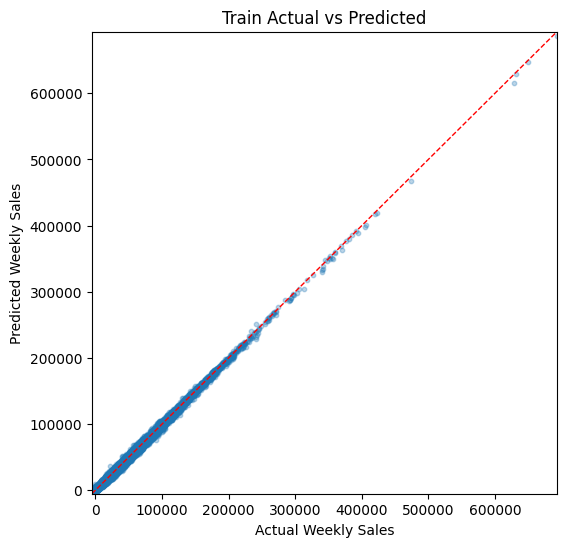

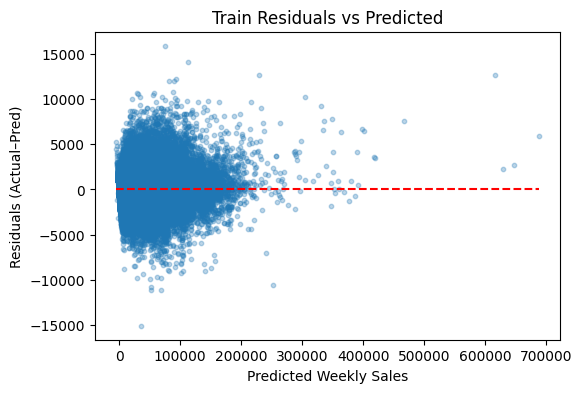

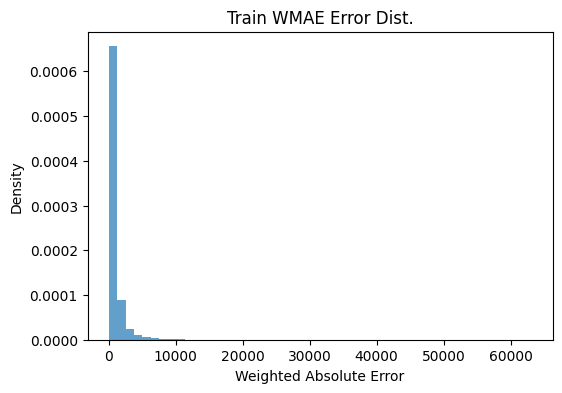

[DEBUG test] y has 0 non-finite values
[DEBUG test] preds has 0 non-finite values
[DEBUG test] w has 0 non-finite values
[DEBUG test] w unique values: [1 5]
[TEST] WMAE=3026.6993  MAE=2951.3393  RMSE=5510.4983  R2=0.9377


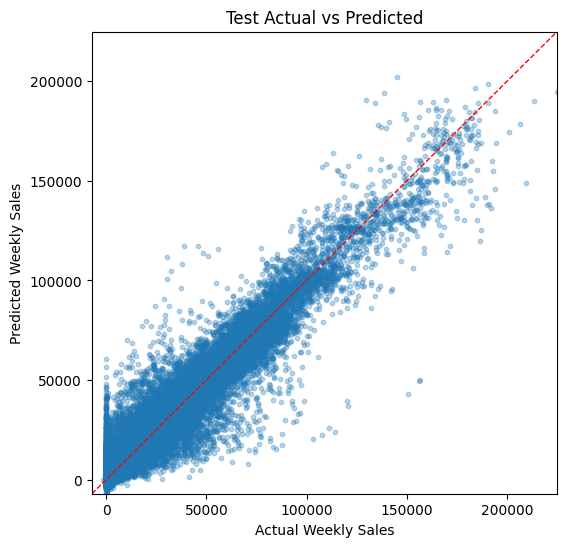

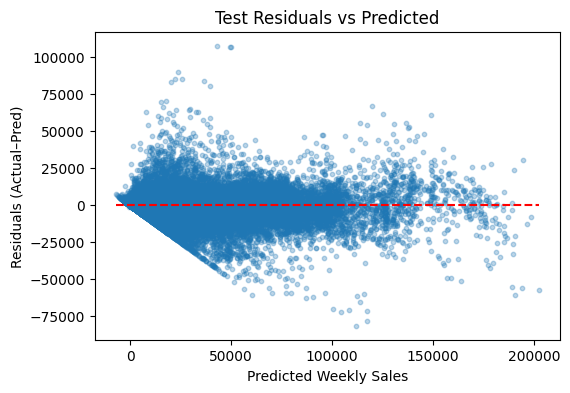

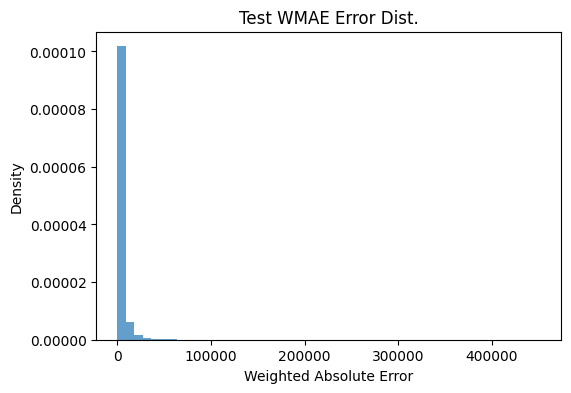

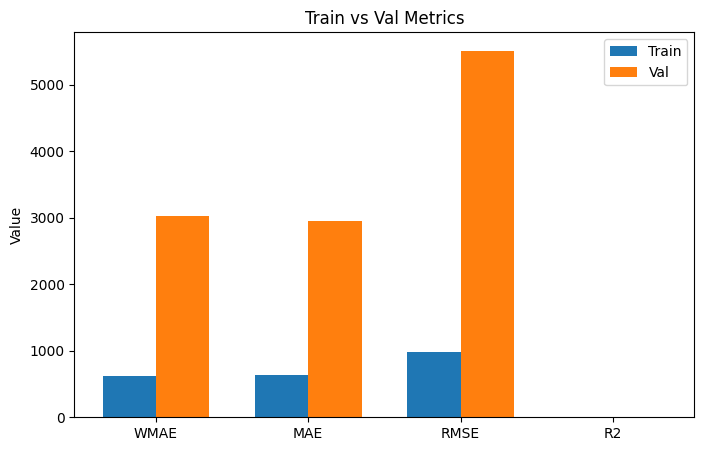

🏁 Done—overfitting deltas: {'delta_WMAE': np.float64(-2406.1529548040003), 'delta_MAE': -2316.0720605638817, 'delta_RMSE': np.float64(-4532.971488508382), 'delta_R2': 0.060468195258427726}
🏃 View run XGB_test at: https://dagshub.com/nkhar21/ML_Final_Project.mlflow/#/experiments/7/runs/b37b7fddcd10418abd7527ba0648a19a
🧪 View experiment at: https://dagshub.com/nkhar21/ML_Final_Project.mlflow/#/experiments/7


In [ ]:
import mlflow
import mlflow.xgboost
import xgboost as xgb

mlflow.set_experiment(experiment_name)

with mlflow.start_run(run_name="XGB_test"):
    log_xgb_params(model)

    model.fit(X_train, y_train)

    train_metrics = evaluate_and_plot(model, X_train, y_train, w_train, split="train")
    test_metrics  = evaluate_and_plot(model, X_test,  y_test,  w_test,  split="test")
    plot_overfitting(train_metrics, test_metrics)


# training 2 - lag fe

In [ ]:
from sklearn.pipeline import Pipeline

features_interp = TrendInterpolator().fit_transform(features)
cleaning_pipeline = Pipeline([
    ("merge",       BaseMerger(features_interp, stores)),
    ("fill_markdowns", MarkdownFiller()),
    ("encode",      CategoricalEncoder())
])

lagger = ImprovedLagFeatureTransformer()
stater = StatisticalSalesFeatures()

df_clean = cleaning_pipeline.fit_transform(train)
df_clean_train, df_clean_test = split_sales_data(df_clean)

df_lagged_train = lagger.fit_transform(df_clean_train)
df_lagged_test = lagger.transform(df_clean_test)

# df_stater_train = stater.fit_transform(df_clean_train)
# df_stater_test = stater.transform(df_clean_test)

df_lagged_train.shape, df_lagged_test.shape, df_lagged_train.columns, df_lagged_test.columns

((311960, 26),
 (109610, 26),
 Index(['Store', 'Dept', 'Date', 'Weekly_Sales', 'IsHoliday', 'Temperature',
        'Fuel_Price', 'MarkDown1', 'MarkDown2', 'MarkDown3', 'MarkDown4',
        'MarkDown5', 'CPI', 'Unemployment', 'Type', 'Size', 'lag_1', 'lag_2',
        'lag_3', 'lag_5', 'lag_26', 'lag_52', 'rolling_mean_4',
        'rolling_mean_8', 'ewm_4', 'ewm_8'],
       dtype='object'),
 Index(['Store', 'Dept', 'Date', 'Weekly_Sales', 'IsHoliday', 'Temperature',
        'Fuel_Price', 'MarkDown1', 'MarkDown2', 'MarkDown3', 'MarkDown4',
        'MarkDown5', 'CPI', 'Unemployment', 'Type', 'Size', 'lag_1', 'lag_2',
        'lag_3', 'lag_5', 'lag_26', 'lag_52', 'rolling_mean_4',
        'rolling_mean_8', 'ewm_4', 'ewm_8'],
       dtype='object'))

In [ ]:
X_train = df_lagged_train.drop(['Weekly_Sales', 'Date'], axis=1)
X_test  = df_lagged_test.drop(['Weekly_Sales', 'Date'], axis=1)
y_train  = df_lagged_train['Weekly_Sales']
y_test   = df_lagged_test['Weekly_Sales']

In [ ]:
import xgboost as xgb
model = xgb.XGBRegressor(
    n_estimators=2000,
    max_depth=10,
    learning_rate=0.1,
    subsample=0.8,
    colsample_bytree=0.8,
    gamma=0,
    reg_alpha=0,
    reg_lambda=1,
    objective="reg:squarederror",
    random_state=42,
    n_jobs=-1,
)

[TRAIN] WMAE=43.2734  MAE=45.5920  RMSE=64.2479  R2=1.0000


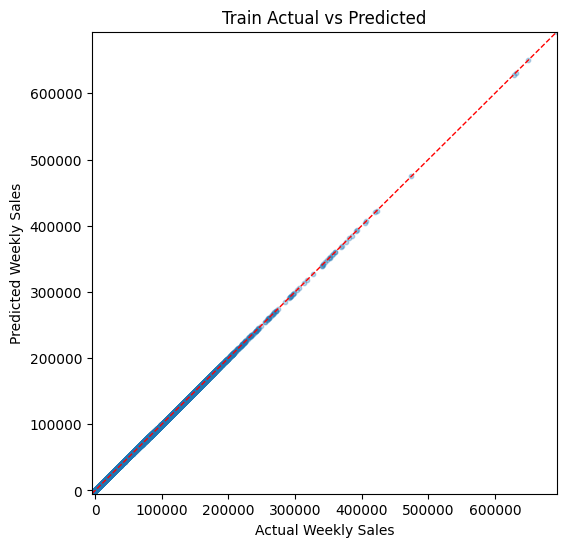

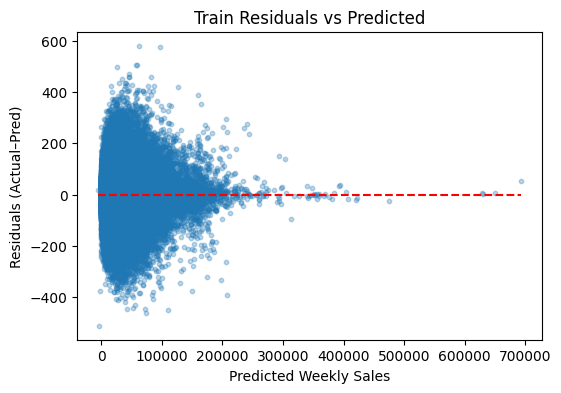

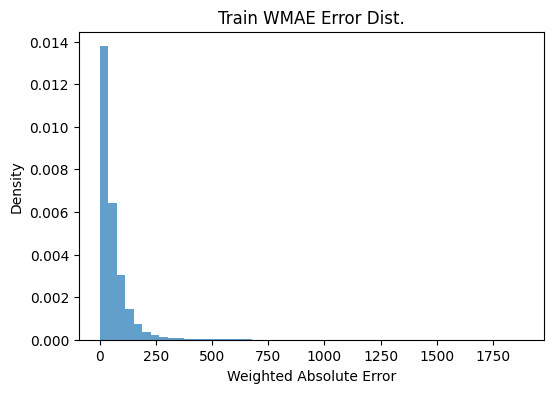

[TEST] WMAE=454.8395  MAE=457.5246  RMSE=1499.4362  R2=0.9954


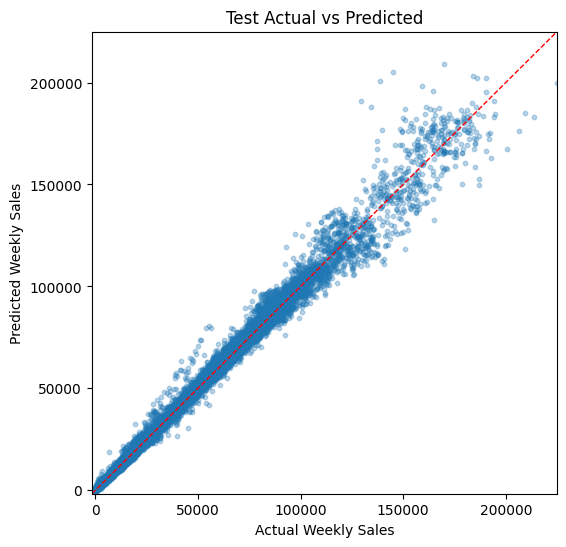

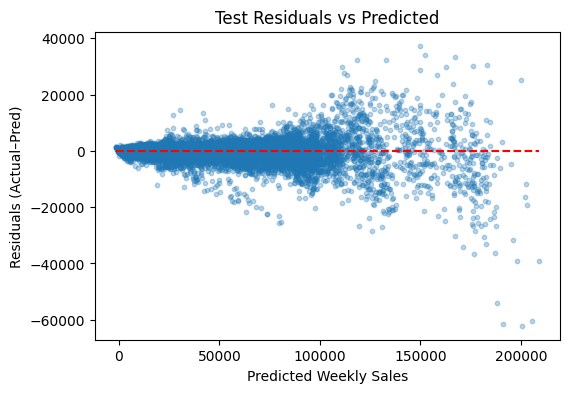

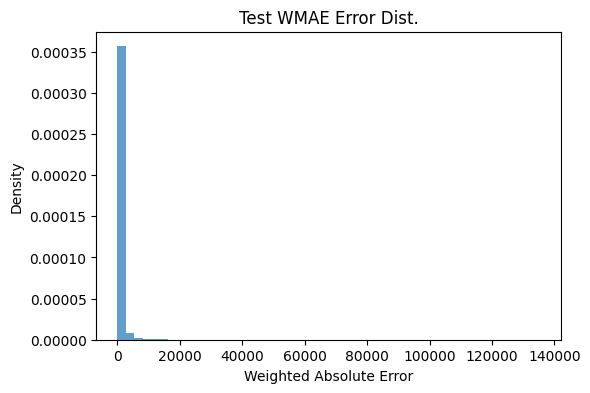

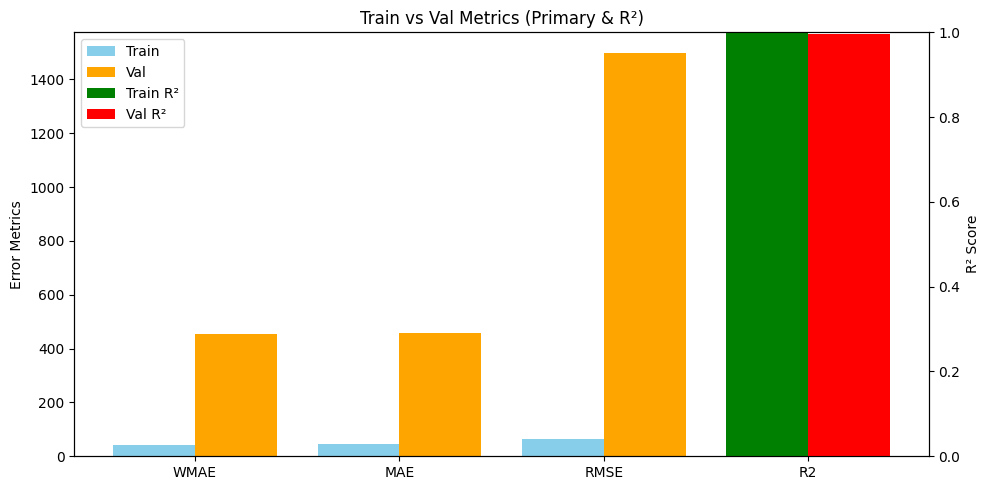

🏃 View run XGB_lag_fe at: https://dagshub.com/nkhar21/ML_Final_Project.mlflow/#/experiments/7/runs/a6f820c34da441bbba447d103a7fec13
🧪 View experiment at: https://dagshub.com/nkhar21/ML_Final_Project.mlflow/#/experiments/7


In [ ]:
import mlflow
import mlflow.xgboost
import xgboost as xgb

mlflow.set_experiment(experiment_name)

with mlflow.start_run(run_name="XGB_lag_fe"):  # forget to change
    log_xgb_params(model)

    model.fit(X_train, y_train)

    train_metrics = evaluate_and_plot(model, X_train, y_train, w_train, split="train")
    test_metrics  = evaluate_and_plot(model, X_test,  y_test,  w_test,  split="test")
    plot_overfitting(train_metrics, test_metrics)


# training 3 - seasonal fe

In [ ]:
X_train = seasoner.fit_transform(df_train)
X_test  = seasoner.transform(df_test)
X_train = X_train.drop(['Weekly_Sales', 'Date'], axis=1)
X_test  = X_test.drop(['Weekly_Sales', 'Date'], axis=1)

In [ ]:
import xgboost as xgb
model = xgb.XGBRegressor(
    n_estimators=2000,
    max_depth=10,
    learning_rate=0.1,
    subsample=0.8,
    colsample_bytree=0.8,
    gamma=0,
    reg_alpha=0,
    reg_lambda=1,
    objective="reg:squarederror",
    random_state=42,
    n_jobs=-1,
)

[TRAIN] WMAE=448.8011  MAE=454.1078  RMSE=670.9908  R2=0.9991


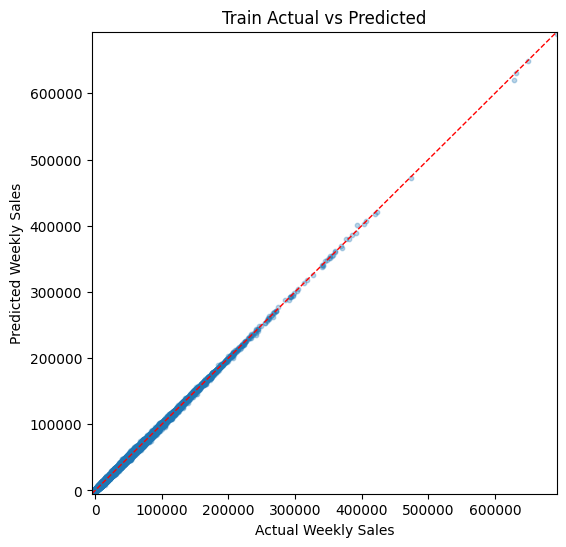

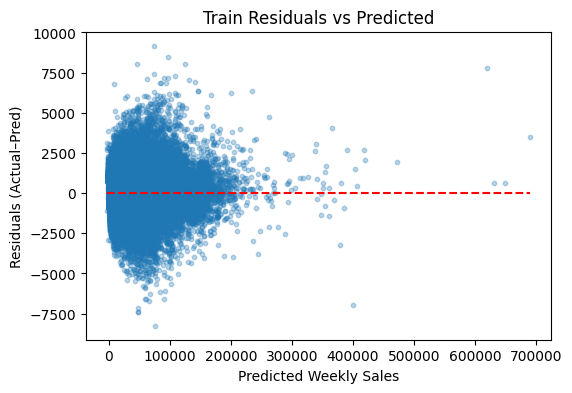

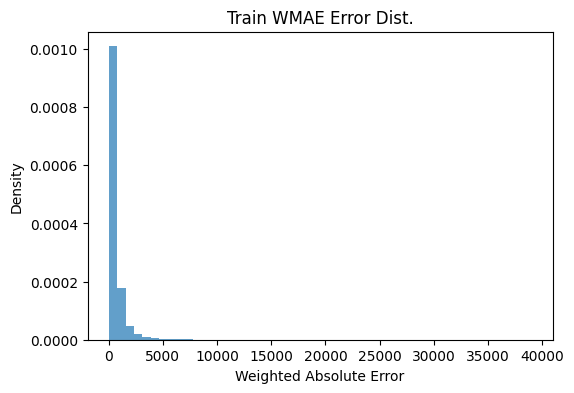

[TEST] WMAE=2090.7656  MAE=2067.3033  RMSE=3804.3841  R2=0.9703


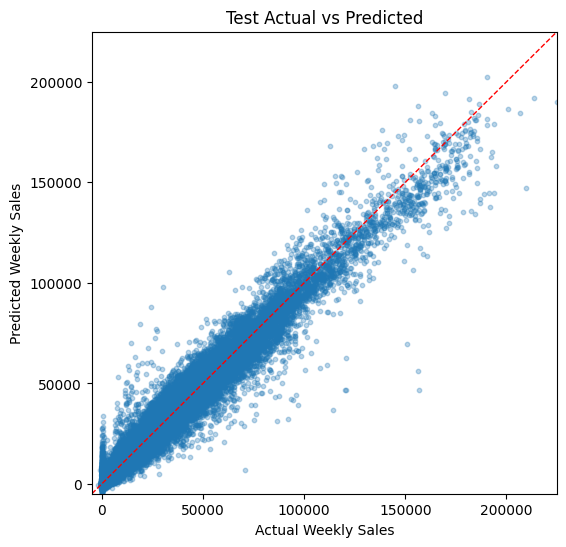

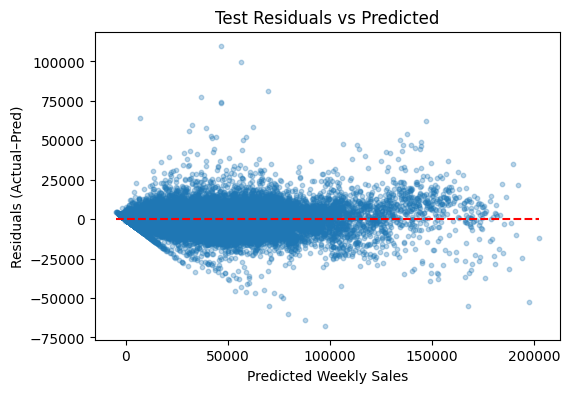

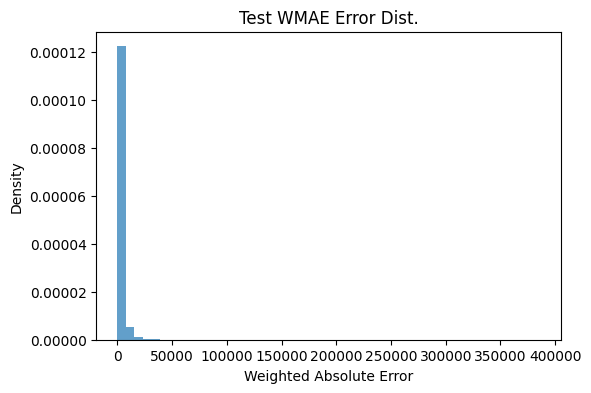

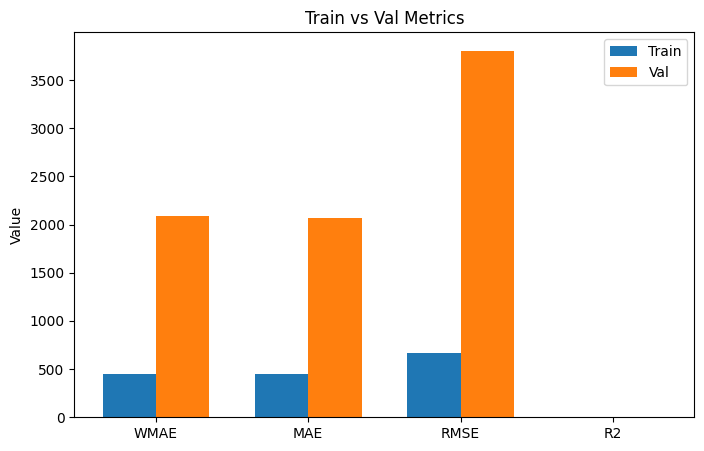

🏃 View run XGB_seasonal_fe at: https://dagshub.com/nkhar21/ML_Final_Project.mlflow/#/experiments/7/runs/aafd6b7586f849648b991985e71a05ca
🧪 View experiment at: https://dagshub.com/nkhar21/ML_Final_Project.mlflow/#/experiments/7


In [ ]:
import mlflow
import mlflow.xgboost
import xgboost as xgb

mlflow.set_experiment(experiment_name)

with mlflow.start_run(run_name="XGB_seasonal_fe"):
    log_xgb_params(model)

    model.fit(X_train, y_train)

    train_metrics = evaluate_and_plot(model, X_train, y_train, w_train, split="train")
    test_metrics  = evaluate_and_plot(model, X_test,  y_test,  w_test,  split="test")
    plot_overfitting(train_metrics, test_metrics)


# training 4 - statistical fe

In [ ]:
X_train = stater.fit_transform(df_train)
X_test  = stater.transform(df_test)
X_train = X_train.drop(['Weekly_Sales', 'Date'], axis=1)
X_test  = X_test.drop(['Weekly_Sales', 'Date'], axis=1)

In [ ]:
import xgboost as xgb
model = xgb.XGBRegressor(
    n_estimators=2000,
    max_depth=10,
    learning_rate=0.1,
    subsample=0.8,
    colsample_bytree=0.8,
    gamma=0,
    reg_alpha=0,
    reg_lambda=1,
    objective="reg:squarederror",
    random_state=42,
    n_jobs=-1,
)

[TRAIN] WMAE=330.0726  MAE=343.9712  RMSE=497.0932  R2=0.9995


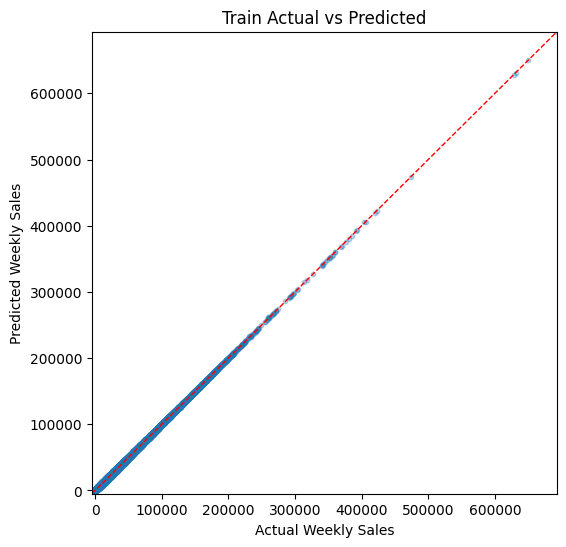

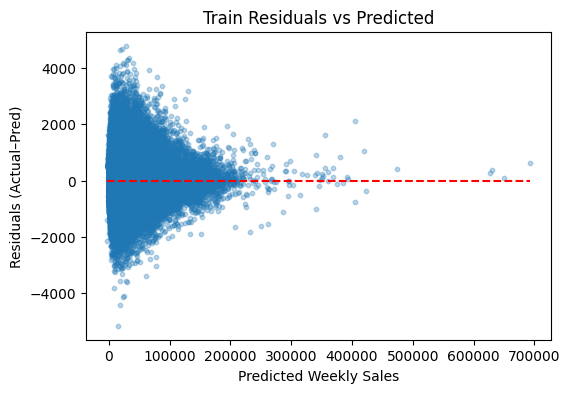

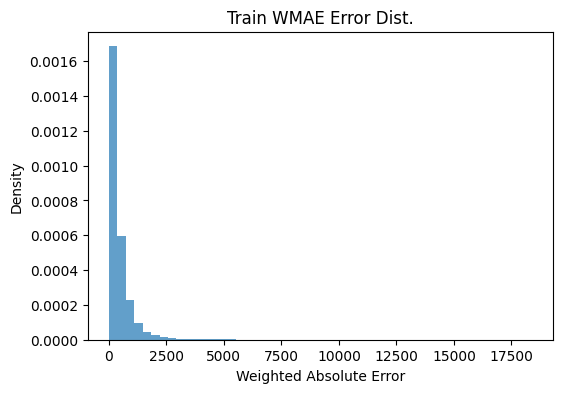

[TEST] WMAE=2771.7729  MAE=2693.1862  RMSE=5339.5392  R2=0.9415


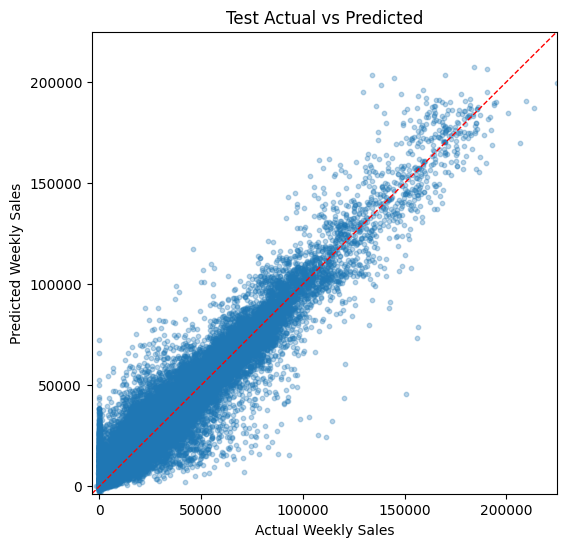

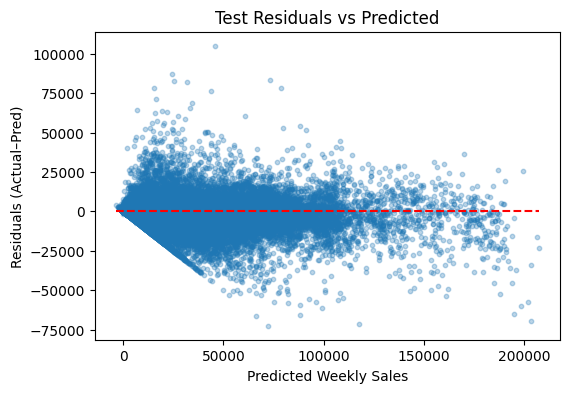

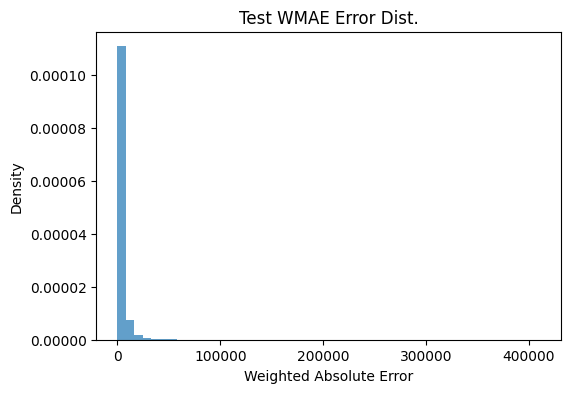

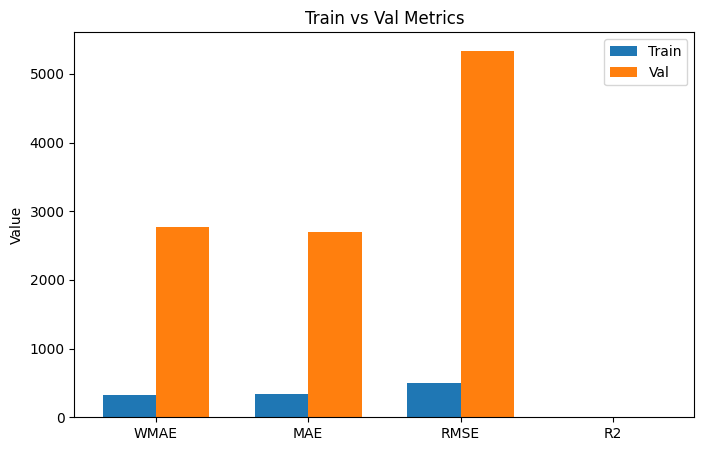

🏃 View run XGB_statistical_fe at: https://dagshub.com/nkhar21/ML_Final_Project.mlflow/#/experiments/7/runs/86d3ed281a0e4fe0b2a41329af980ef3
🧪 View experiment at: https://dagshub.com/nkhar21/ML_Final_Project.mlflow/#/experiments/7


In [ ]:
import mlflow
import mlflow.xgboost
import xgboost as xgb

mlflow.set_experiment(experiment_name)

with mlflow.start_run(run_name="XGB_statistical_fe"):
    log_xgb_params(model)

    model.fit(X_train, y_train)

    train_metrics = evaluate_and_plot(model, X_train, y_train, w_train, split="train")
    test_metrics  = evaluate_and_plot(model, X_test,  y_test,  w_test,  split="test")
    plot_overfitting(train_metrics, test_metrics)


# training 5 - economical fe

In [ ]:
X_train = econ.fit_transform(df_train)
X_test  = econ.transform(df_test)
X_train = X_train.drop(['Weekly_Sales', 'Date'], axis=1)
X_test  = X_test.drop(['Weekly_Sales', 'Date'], axis=1)

In [ ]:
import xgboost as xgb
model = xgb.XGBRegressor(
    n_estimators=2000,
    max_depth=10,
    learning_rate=0.1,
    subsample=0.8,
    colsample_bytree=0.8,
    gamma=0,
    reg_alpha=0,
    reg_lambda=1,
    objective="reg:squarederror",
    random_state=42,
    n_jobs=-1,
)

[TRAIN] WMAE=617.1205  MAE=628.5450  RMSE=958.4486  R2=0.9983


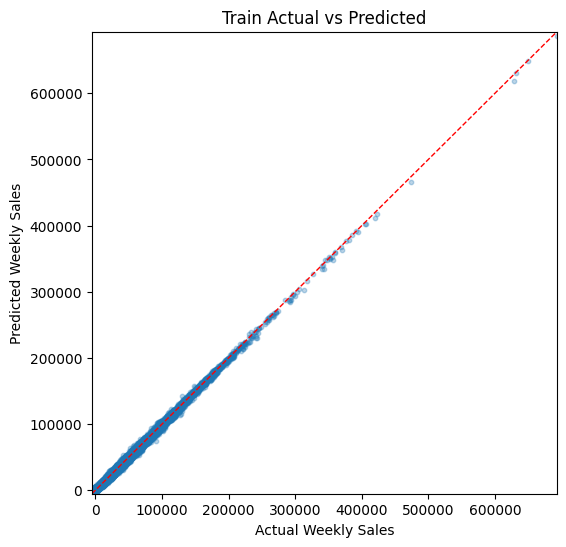

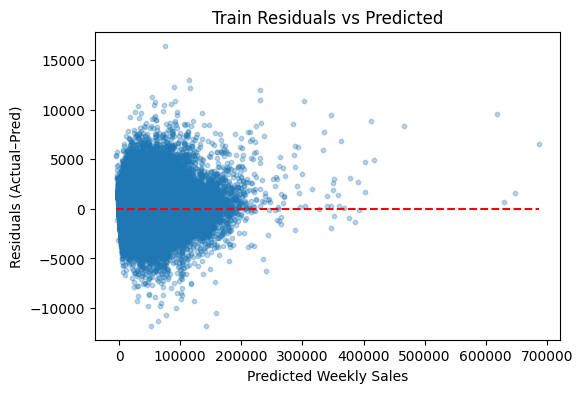

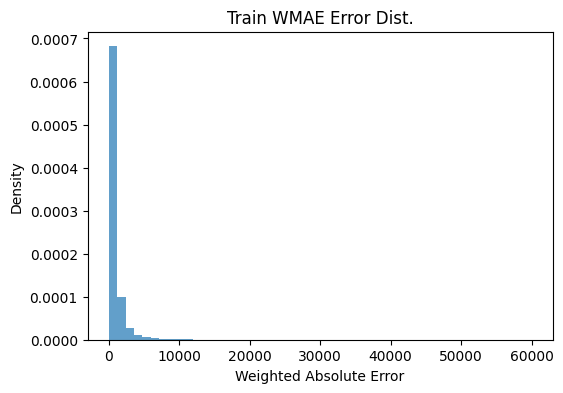

[TEST] WMAE=3203.2226  MAE=3108.1392  RMSE=5740.9252  R2=0.9324


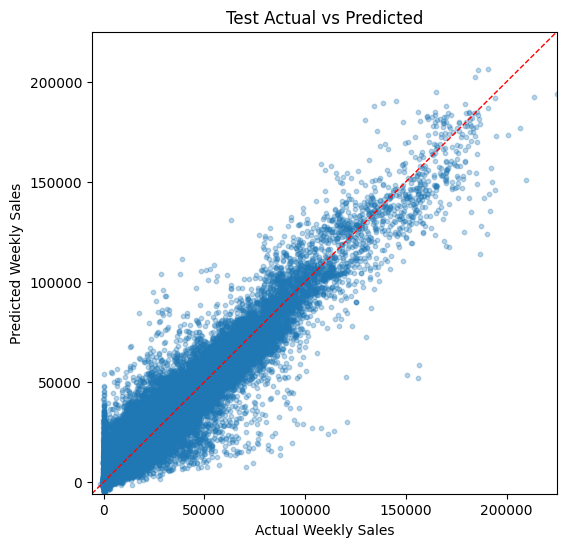

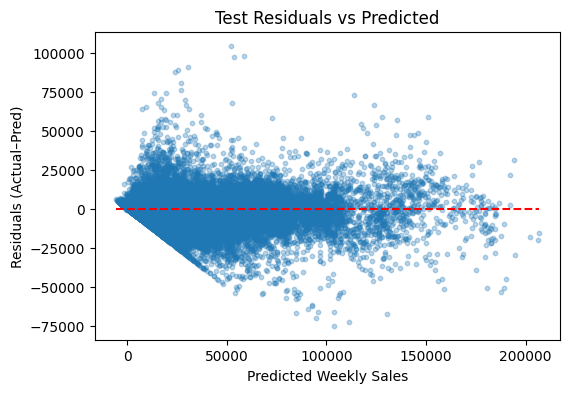

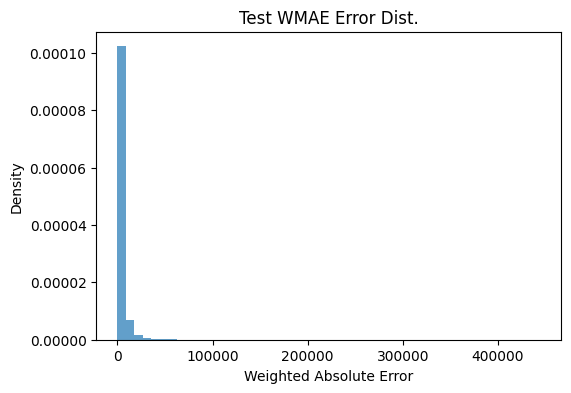

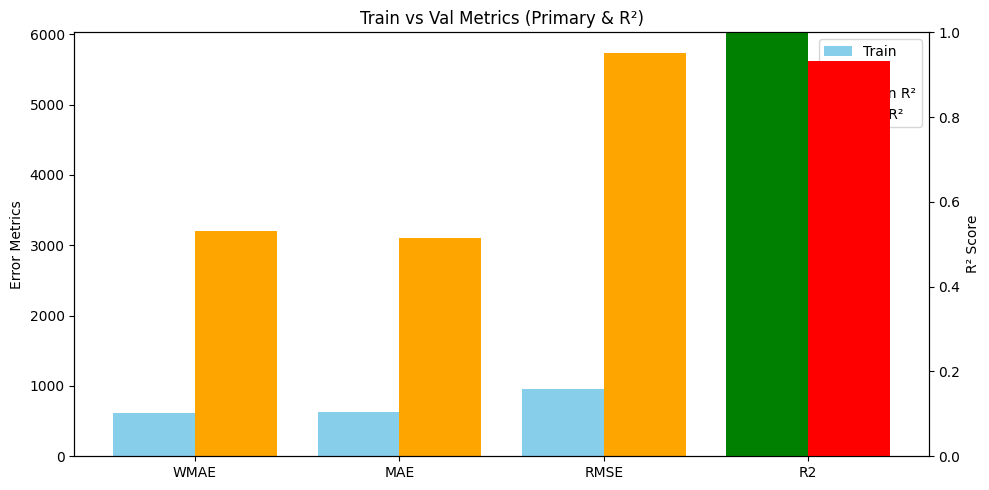

🏃 View run XGB_economical_fe at: https://dagshub.com/nkhar21/ML_Final_Project.mlflow/#/experiments/7/runs/2772ce2f026b44348209a3527702a58c
🧪 View experiment at: https://dagshub.com/nkhar21/ML_Final_Project.mlflow/#/experiments/7


In [ ]:
mlflow.set_experiment(experiment_name)

with mlflow.start_run(run_name="XGB_economical_fe"):
    log_xgb_params(model)

    model.fit(X_train, y_train)

    train_metrics = evaluate_and_plot(model, X_train, y_train, w_train, split="train")
    test_metrics  = evaluate_and_plot(model, X_test,  y_test,  w_test,  split="test")
    plot_overfitting(train_metrics, test_metrics)

In [ ]:
X_train.columns

Index(['Store', 'Dept', 'IsHoliday', 'Temperature', 'Fuel_Price', 'MarkDown1',
       'MarkDown2', 'MarkDown3', 'MarkDown4', 'MarkDown5', 'CPI',
       'Unemployment', 'Type', 'Size', 'fuel_price_low', 'fuel_price_high',
       'fuel_size_interaction', 'economic_pressure', 'purchasing_power',
       'total_markdown', 'markdown_count', 'avg_markdown',
       'holiday_markdown_boost'],
      dtype='object')

# rfe for economical features

In [ ]:
from sklearn.feature_selection import RFECV

estimator = xgb.XGBRegressor(
    n_estimators=200,
    max_depth=6,
    learning_rate=0.1,
    subsample=0.8,
    colsample_bytree=0.8,
    objective="reg:squarederror",
    random_state=42,
    n_jobs=-1,
)

selector = RFECV(
    estimator=estimator,
    step=1,
    cv=5,
    scoring="neg_mean_absolute_error",
    n_jobs=-1,
    min_features_to_select=1,
)

selector.fit(X_train, y_train)

feature_ranking = pd.DataFrame({
    "feature": X_train.columns,
    "ranking": selector.ranking_,
    "support": selector.support_
}).sort_values("ranking")

print(feature_ranking)

plt.figure(figsize=(8, 5))
plt.plot(
    np.arange(1, len(selector.grid_scores_) + 1),
    -selector.grid_scores_,  # negate because scores are negative MAE
    marker="o"
)
plt.xlabel("Number of features selected")
plt.ylabel("Mean Absolute Error (CV avg)")
plt.title("RFECV: MAE vs #features")
plt.grid(True)
plt.show()


                   feature  ranking  support
0                    Store        1     True
1                     Dept        1     True
2                IsHoliday        1     True
3              Temperature        1     True
4               Fuel_Price        1     True
5                MarkDown1        1     True
6                MarkDown2        1     True
7                MarkDown3        1     True
8                MarkDown4        1     True
9                MarkDown5        1     True
10                     CPI        1     True
11            Unemployment        1     True
12                    Type        1     True
13                    Size        1     True
17       economic_pressure        1     True
16   fuel_size_interaction        1     True
21            avg_markdown        1     True
22  holiday_markdown_boost        1     True
18        purchasing_power        1     True
19          total_markdown        1     True
20          markdown_count        2    False
14        

AttributeError: 'RFECV' object has no attribute 'grid_scores_'

<Figure size 800x500 with 0 Axes>

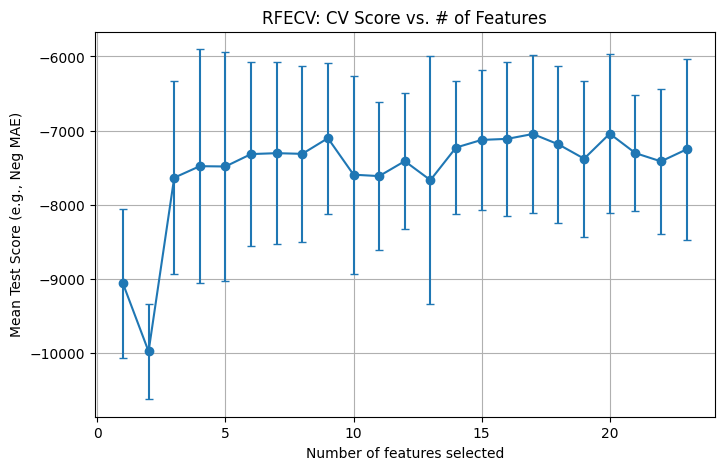

In [ ]:
n_features = selector.cv_results_["n_features"].astype(int)
mean_scores = selector.cv_results_["mean_test_score"]
std_scores = selector.cv_results_["std_test_score"]

plt.figure(figsize=(8, 5))
plt.errorbar(
    x=n_features,
    y=mean_scores,
    yerr=std_scores,
    marker="o",
    capsize=3
)
plt.xlabel("Number of features selected")
plt.ylabel("Mean Test Score (e.g., Neg MAE)")
plt.title("RFECV: CV Score vs. # of Features")
plt.grid(True)
plt.show()


# trianing 6 - tuning rl, ne, md 1

In [ ]:
df_final_train, df_final_test = split_sales_data(df_final)

X_train = df_final_train.drop(['Weekly_Sales', 'Date'], axis=1)
X_test  = df_final_test.drop(['Weekly_Sales', 'Date'], axis=1)

X_train.shape, X_test.shape

((311960, 58), (109610, 58))

In [ ]:
ne_md_lr = [(200, 8, 0.1), (500, 8, 0.09), (1000, 8, 0.07), (2000, 8, 0.07), (2000, 9, 0.07),
            (2500, 7, 0.06), (2500, 8, 0.05), (3000, 9, 0.06), (4000, 8, 0.05), (4000, 7, 0.04),
            (3500, 6, 0.05), (3500, 7, 0.04)]

mlflow.set_experiment("Training_XGB")

best_wmae = float("inf")
best_params = None
best_model  = None


=== Training tuning_ne200_md8_lr0p1 ===
[TRAIN] WMAE=428.6631  MAE=410.2290  RMSE=749.8149  R2=0.9989


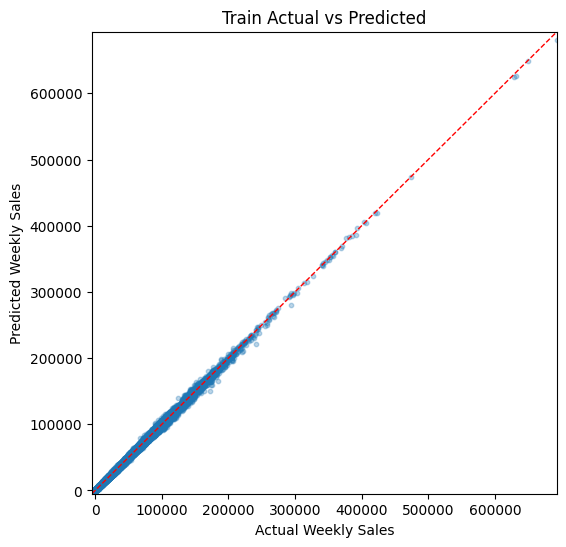

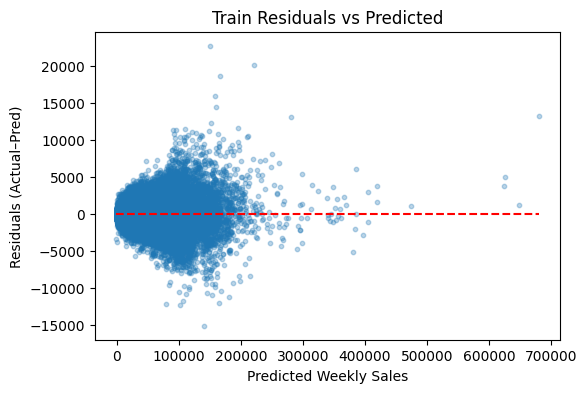

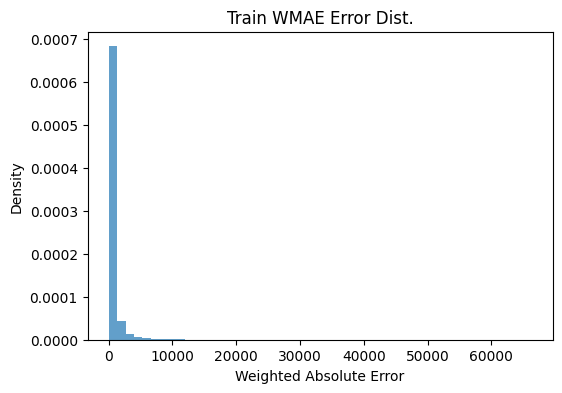

[TEST] WMAE=486.6071  MAE=483.2617  RMSE=1209.1267  R2=0.9970


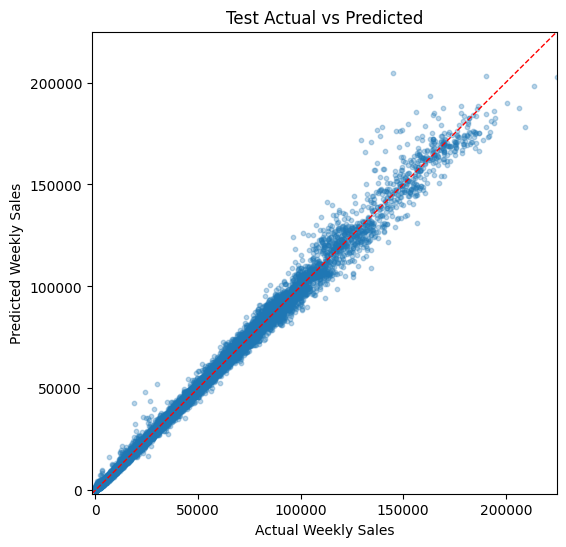

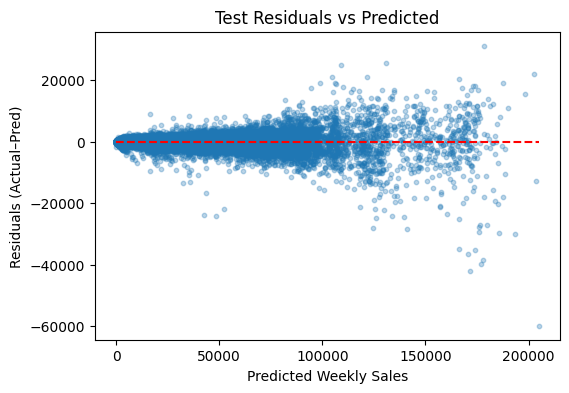

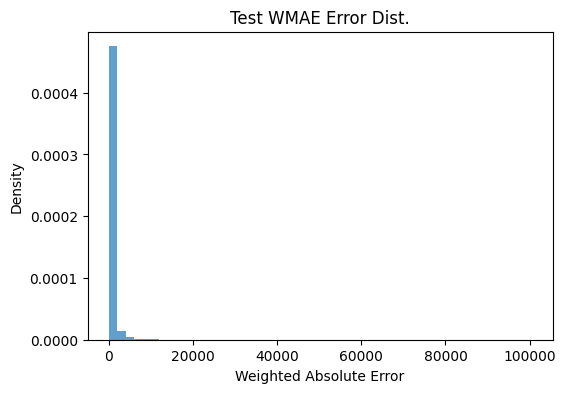

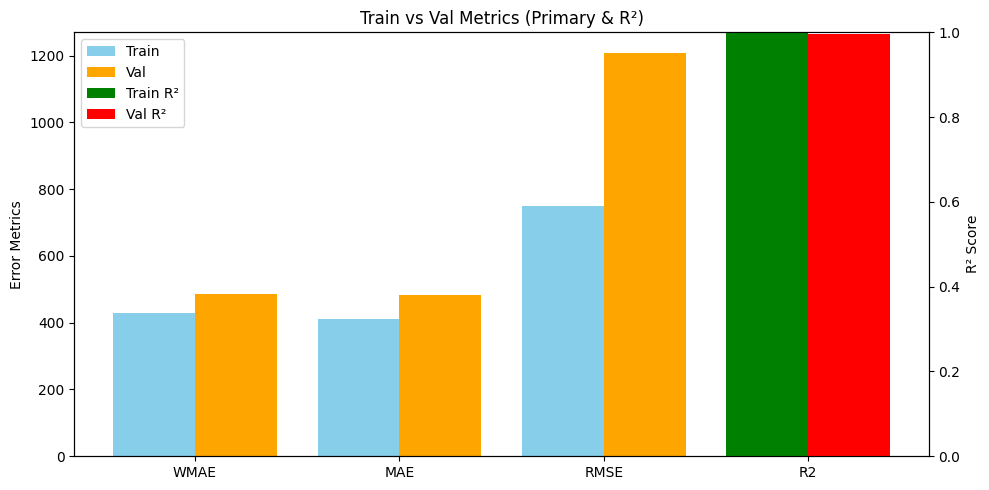

→ test WMAE = 486.6071
🏃 View run tuning_ne200_md8_lr0p1 at: https://dagshub.com/nkhar21/ML_Final_Project.mlflow/#/experiments/7/runs/6442c9dce90145b88107da4b063d8b27
🧪 View experiment at: https://dagshub.com/nkhar21/ML_Final_Project.mlflow/#/experiments/7

=== Training tuning_ne500_md8_lr0p09 ===
[TRAIN] WMAE=284.2039  MAE=280.2318  RMSE=485.0455  R2=0.9996


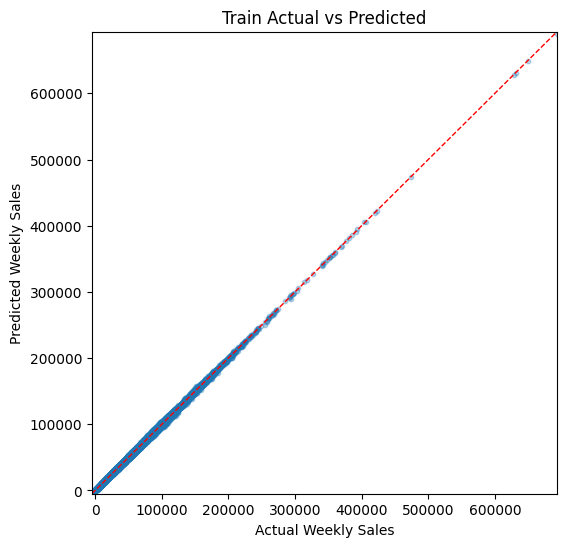

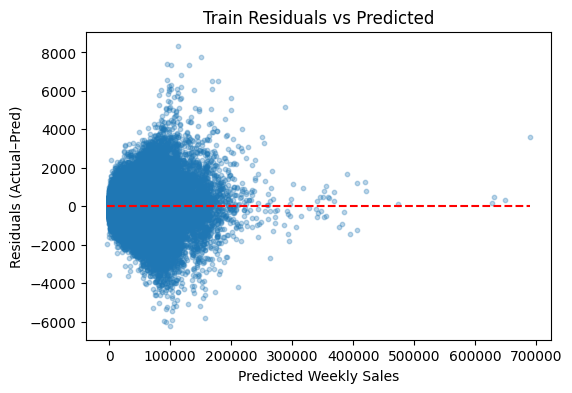

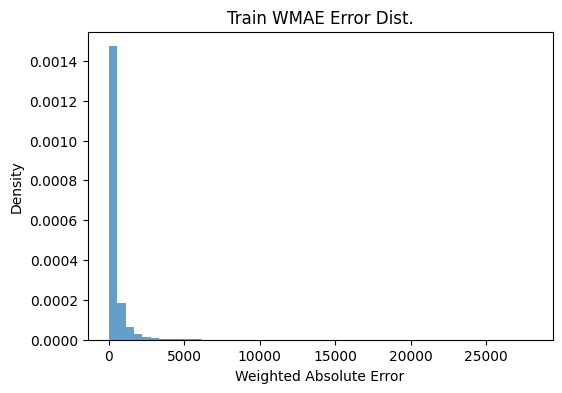

[TEST] WMAE=428.2520  MAE=420.3729  RMSE=1213.0760  R2=0.9970


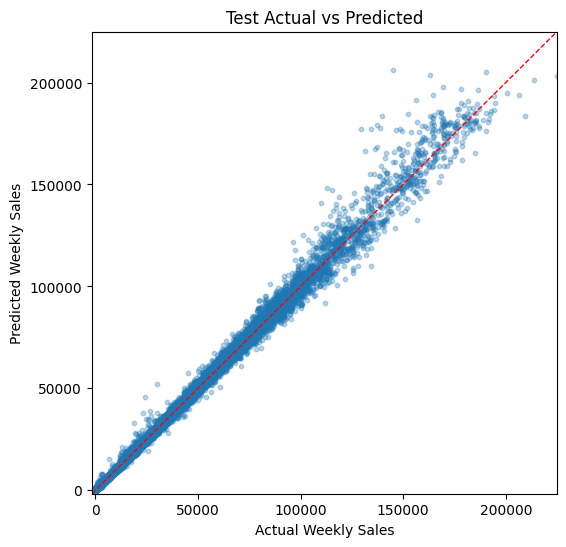

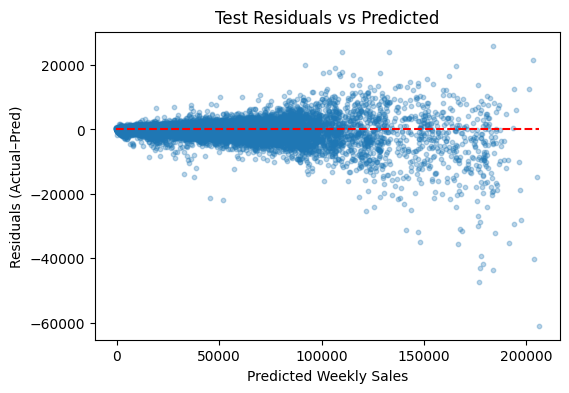

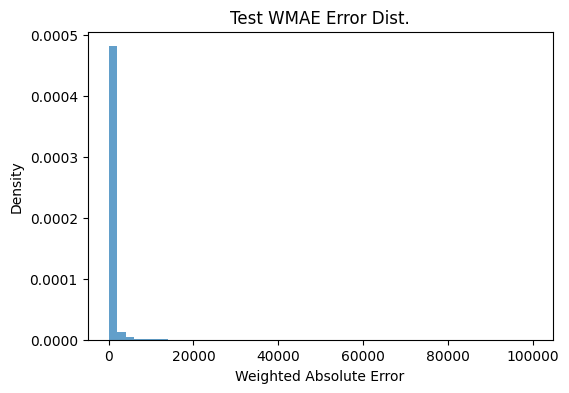

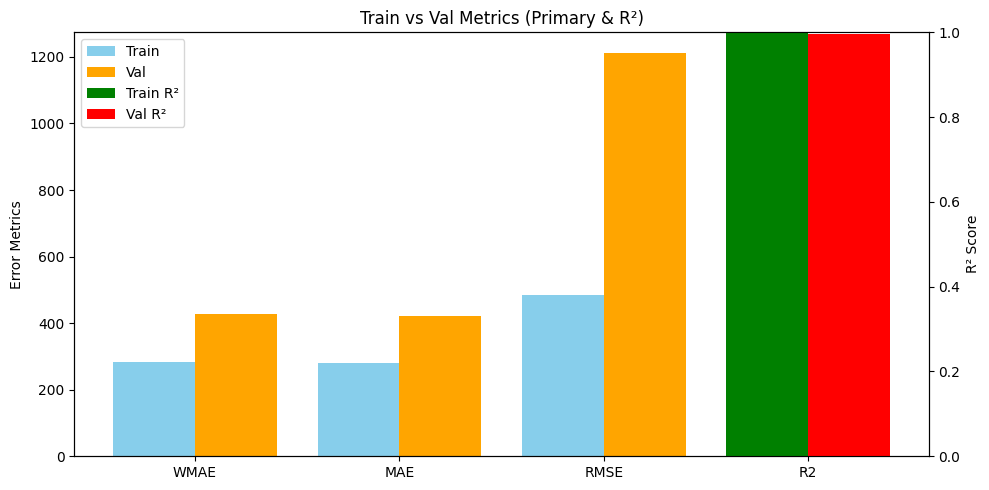

→ test WMAE = 428.2520
🏃 View run tuning_ne500_md8_lr0p09 at: https://dagshub.com/nkhar21/ML_Final_Project.mlflow/#/experiments/7/runs/ca18ae08b0da47ce8e8a4acab77b106d
🧪 View experiment at: https://dagshub.com/nkhar21/ML_Final_Project.mlflow/#/experiments/7

=== Training tuning_ne1000_md8_lr0p07 ===
[TRAIN] WMAE=219.0628  MAE=219.8882  RMSE=368.6820  R2=0.9997


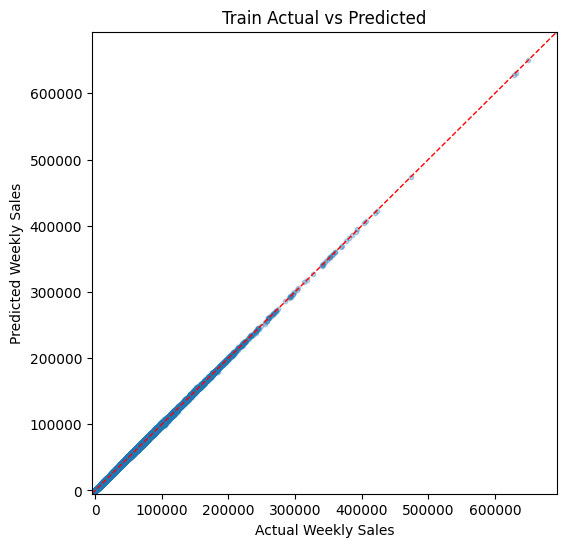

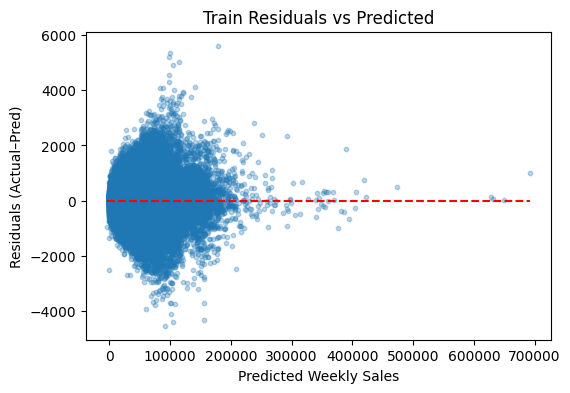

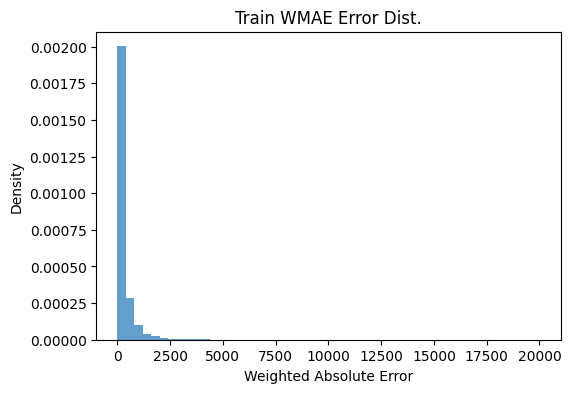

[TEST] WMAE=389.0160  MAE=382.1562  RMSE=1152.6642  R2=0.9973


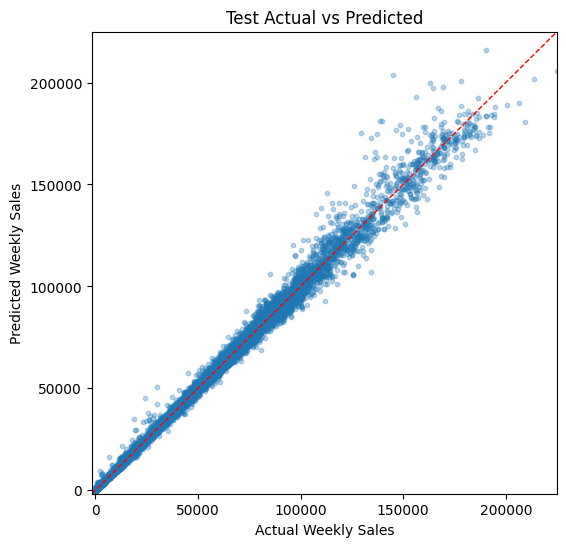

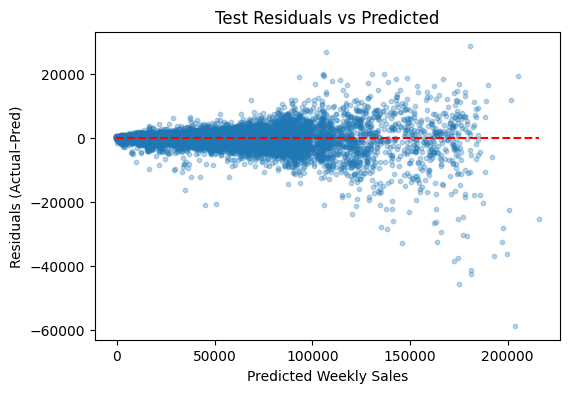

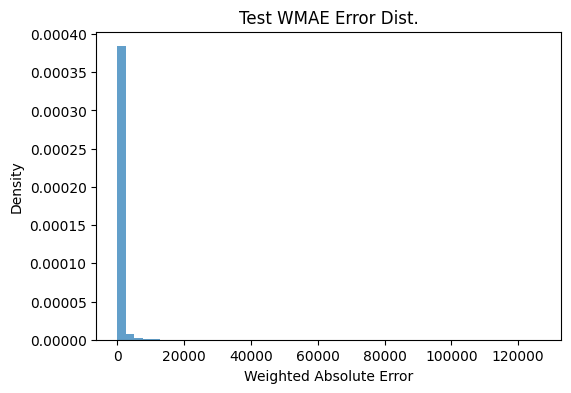

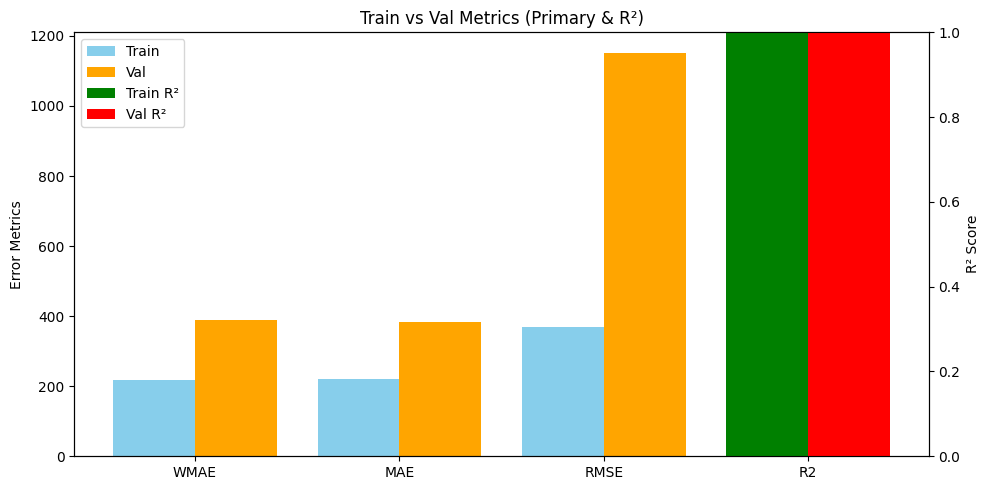

→ test WMAE = 389.0160
🏃 View run tuning_ne1000_md8_lr0p07 at: https://dagshub.com/nkhar21/ML_Final_Project.mlflow/#/experiments/7/runs/c00fffd63ea34032822a12ae05dd90ab
🧪 View experiment at: https://dagshub.com/nkhar21/ML_Final_Project.mlflow/#/experiments/7

=== Training tuning_ne2000_md8_lr0p07 ===
[TRAIN] WMAE=141.3517  MAE=144.3450  RMSE=221.7425  R2=0.9999


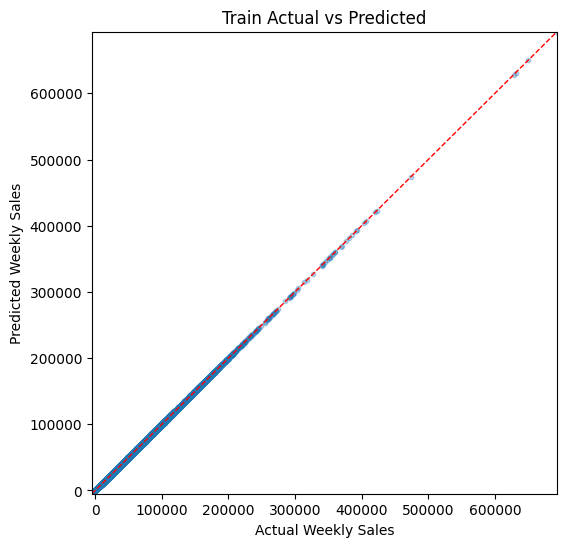

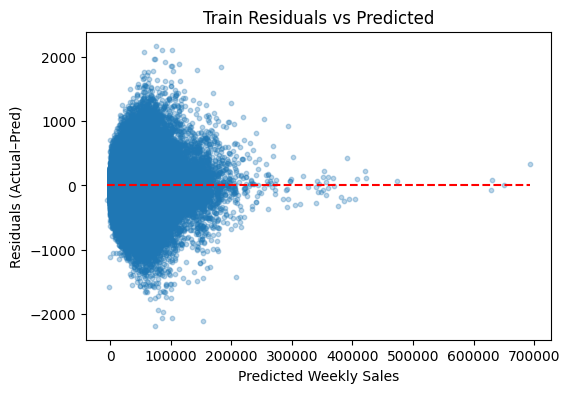

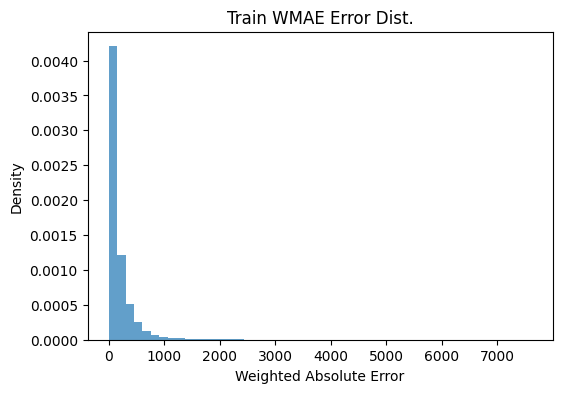

[TEST] WMAE=370.3730  MAE=363.6408  RMSE=1151.3138  R2=0.9973


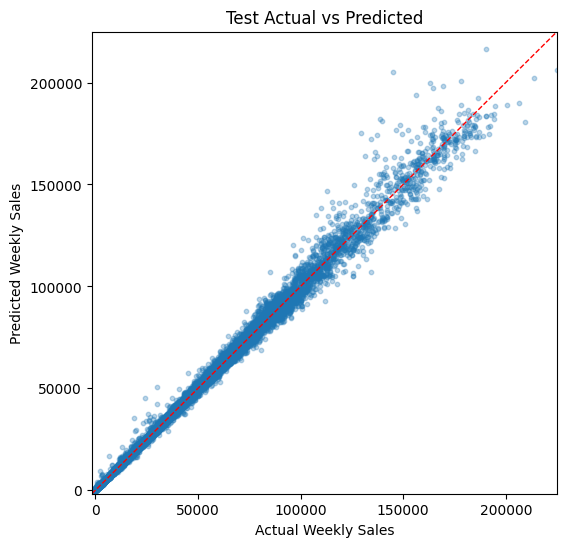

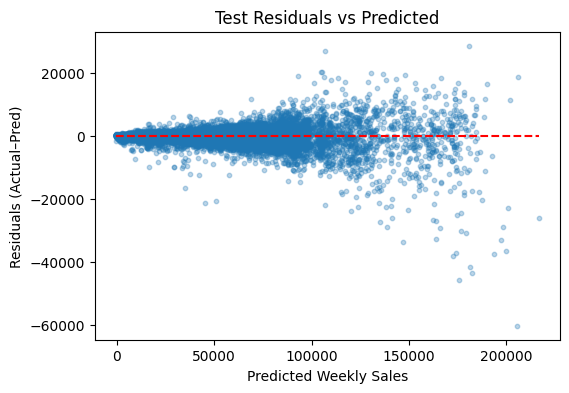

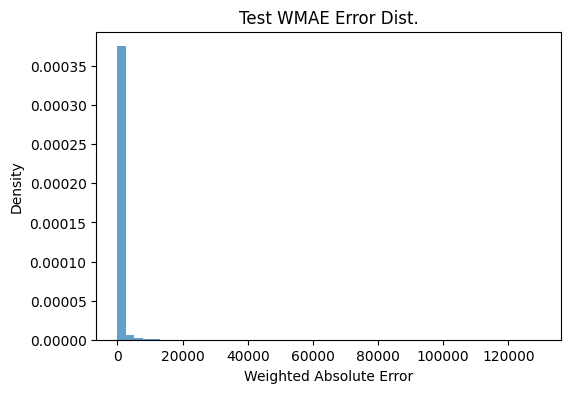

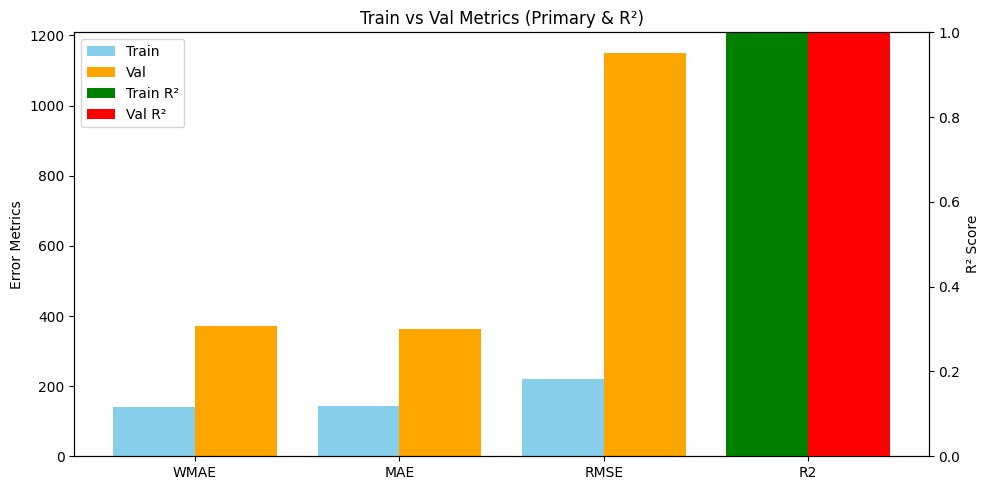

→ test WMAE = 370.3730
🏃 View run tuning_ne2000_md8_lr0p07 at: https://dagshub.com/nkhar21/ML_Final_Project.mlflow/#/experiments/7/runs/253fb521c5f94cccb1307b575f6eafc0
🧪 View experiment at: https://dagshub.com/nkhar21/ML_Final_Project.mlflow/#/experiments/7

=== Training tuning_ne2000_md9_lr0p07 ===
[TRAIN] WMAE=93.2671  MAE=96.4698  RMSE=140.2062  R2=1.0000


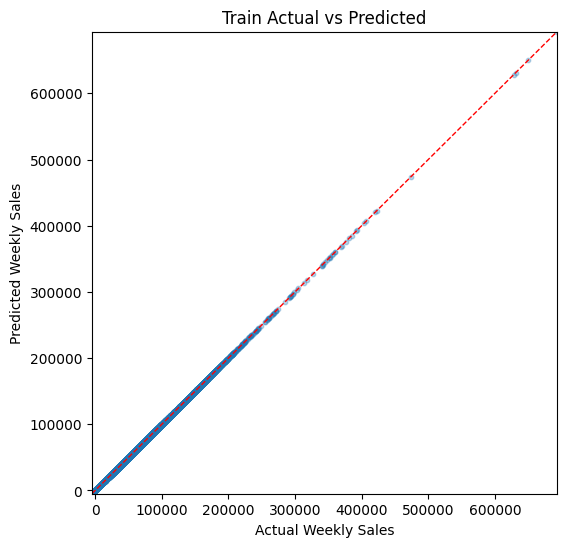

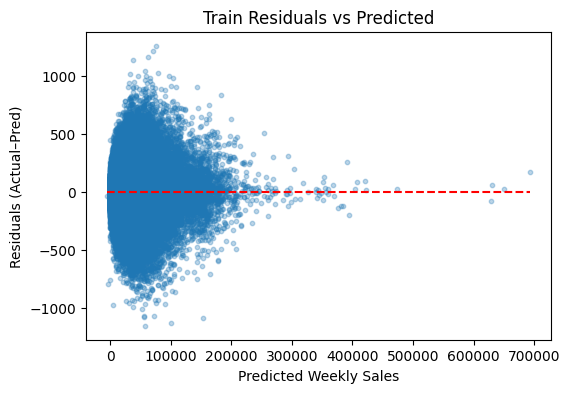

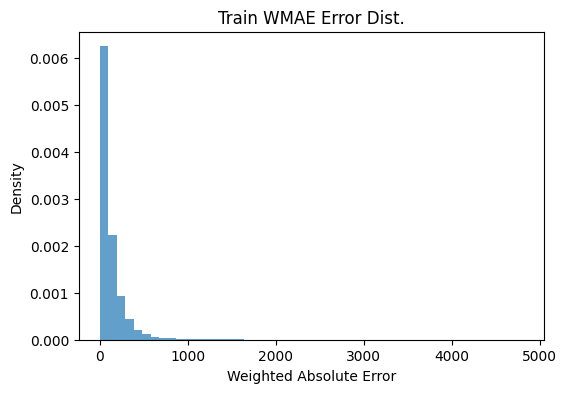

[TEST] WMAE=364.2409  MAE=360.7394  RMSE=1140.6255  R2=0.9973


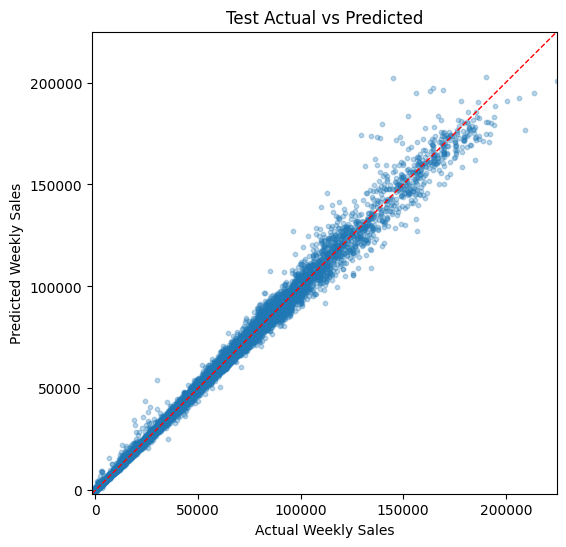

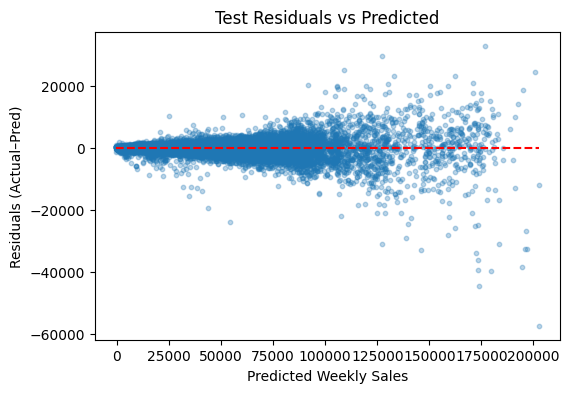

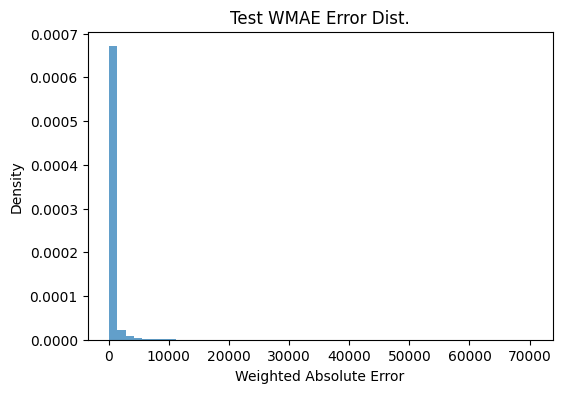

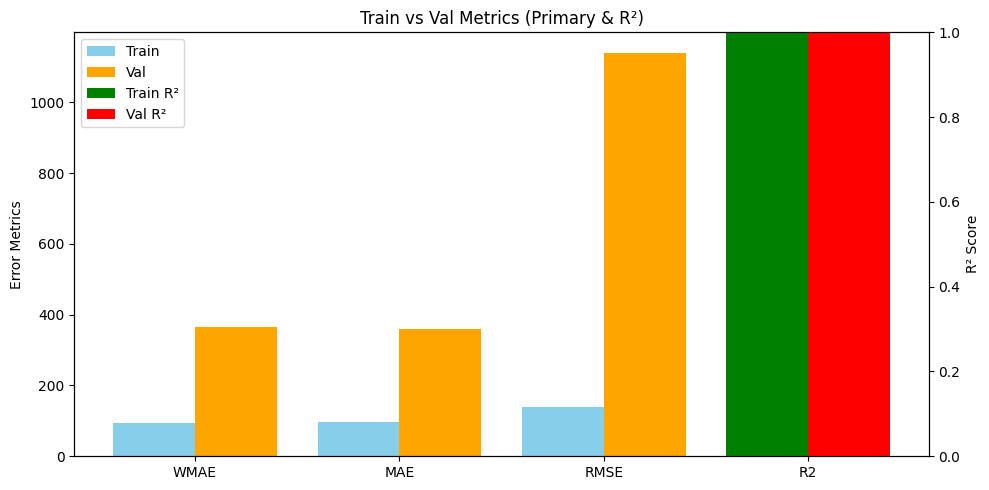

→ test WMAE = 364.2409
🏃 View run tuning_ne2000_md9_lr0p07 at: https://dagshub.com/nkhar21/ML_Final_Project.mlflow/#/experiments/7/runs/c270410c80bd47e2b95fa46af4de6b54
🧪 View experiment at: https://dagshub.com/nkhar21/ML_Final_Project.mlflow/#/experiments/7

=== Training tuning_ne2500_md7_lr0p06 ===
[TRAIN] WMAE=189.7990  MAE=190.9470  RMSE=310.7196  R2=0.9998


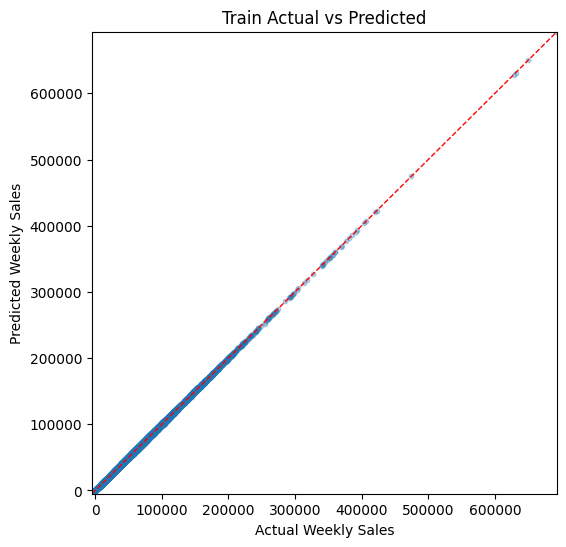

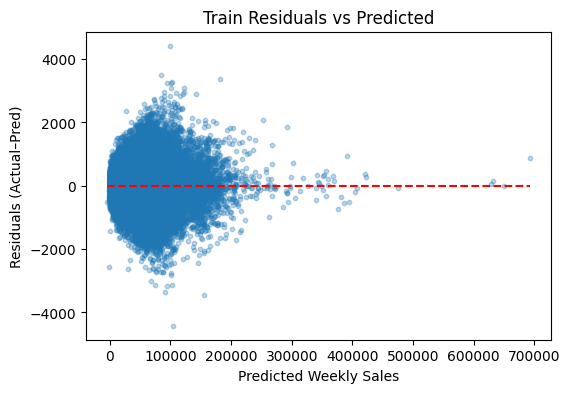

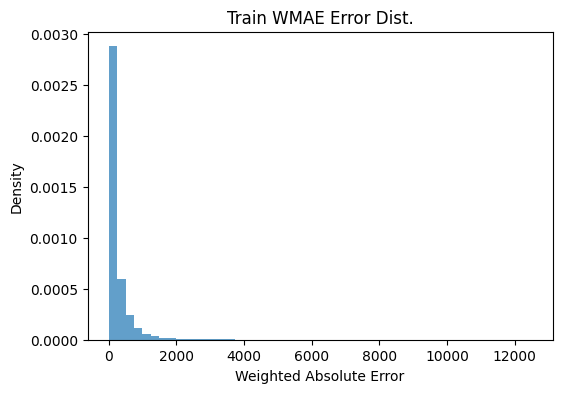

[TEST] WMAE=380.5014  MAE=373.5150  RMSE=1165.4640  R2=0.9972


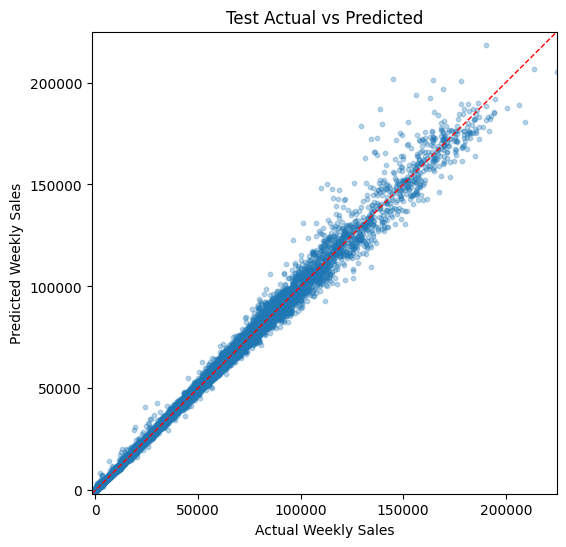

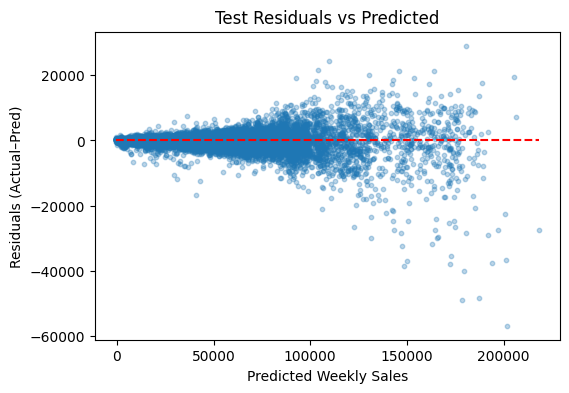

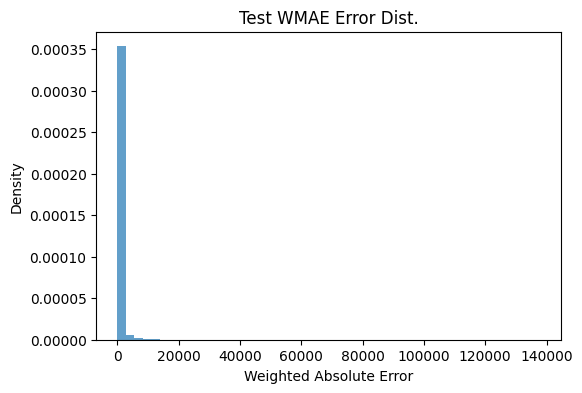

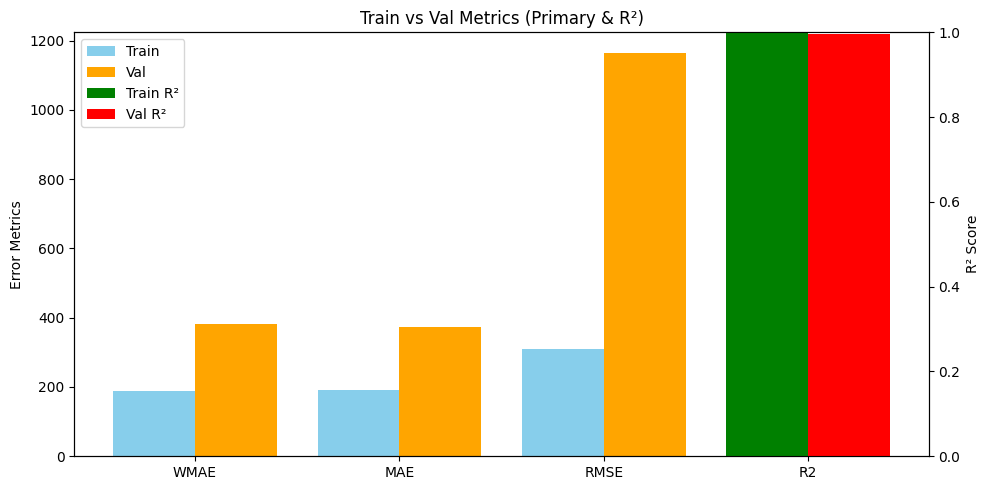

→ test WMAE = 380.5014
🏃 View run tuning_ne2500_md7_lr0p06 at: https://dagshub.com/nkhar21/ML_Final_Project.mlflow/#/experiments/7/runs/af65c6dfce634302a8951e2d314b9f1d
🧪 View experiment at: https://dagshub.com/nkhar21/ML_Final_Project.mlflow/#/experiments/7

=== Training tuning_ne2500_md8_lr0p05 ===
[TRAIN] WMAE=148.6515  MAE=151.4041  RMSE=236.8919  R2=0.9999


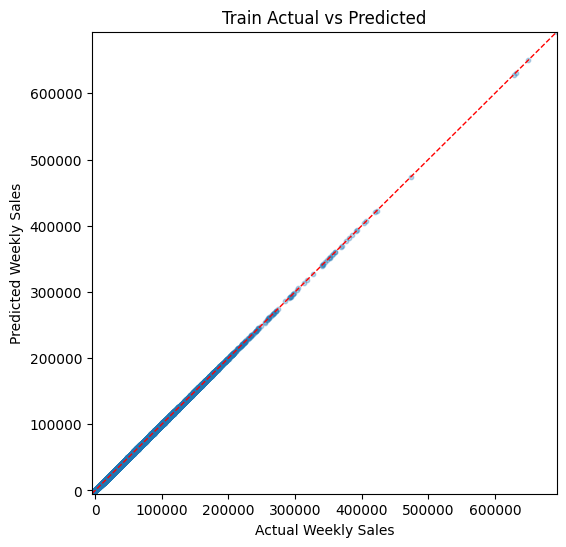

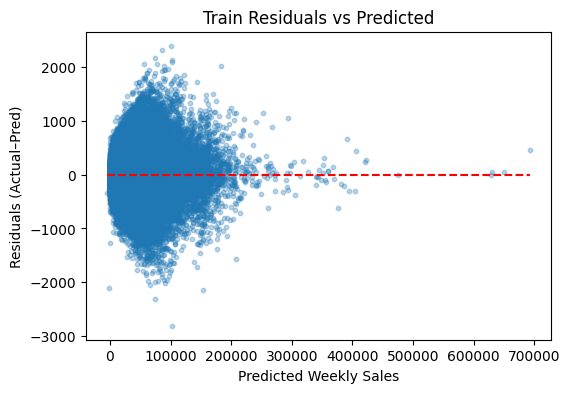

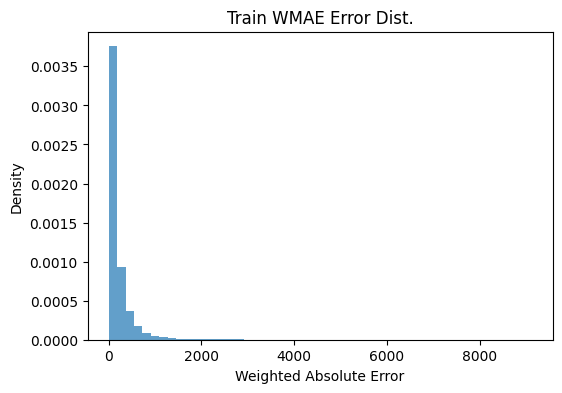

[TEST] WMAE=366.0931  MAE=359.7219  RMSE=1116.3483  R2=0.9974


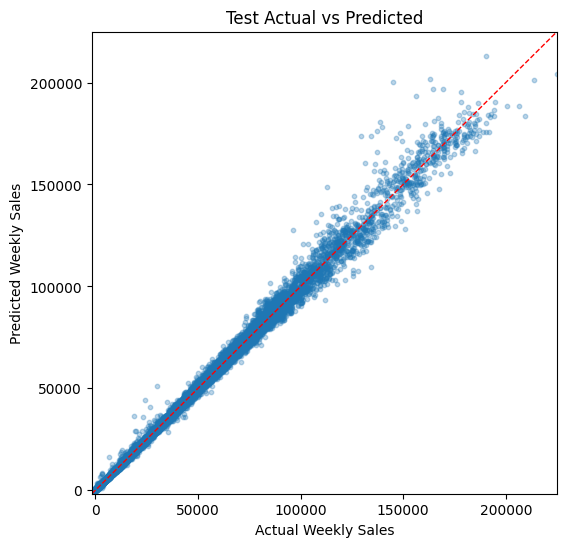

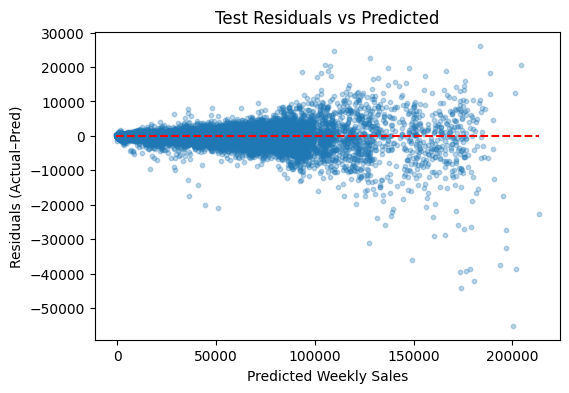

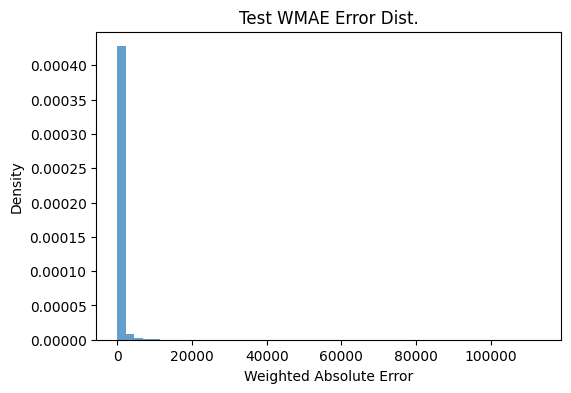

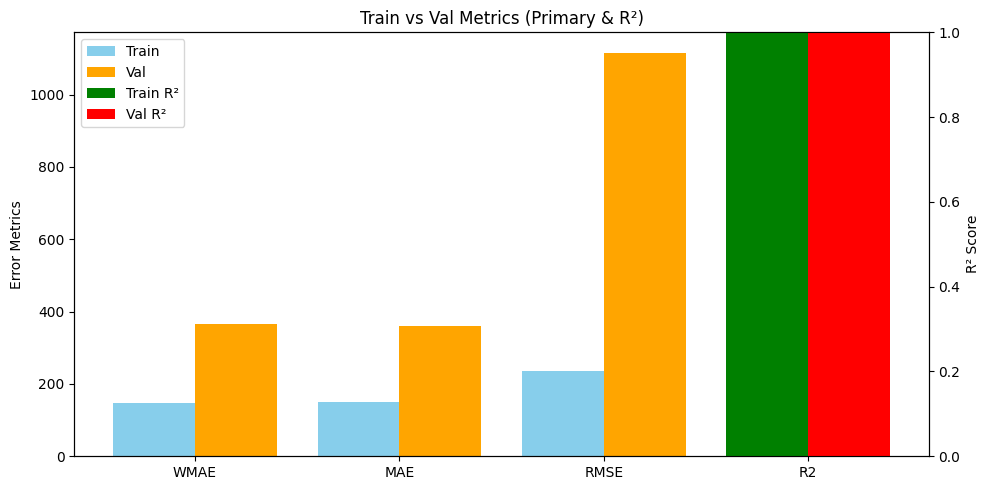

→ test WMAE = 366.0931
🏃 View run tuning_ne2500_md8_lr0p05 at: https://dagshub.com/nkhar21/ML_Final_Project.mlflow/#/experiments/7/runs/8bb382da049d4754a2b3955b25720321
🧪 View experiment at: https://dagshub.com/nkhar21/ML_Final_Project.mlflow/#/experiments/7

=== Training tuning_ne3000_md9_lr0p06 ===
[TRAIN] WMAE=72.2175  MAE=75.1714  RMSE=106.5152  R2=1.0000


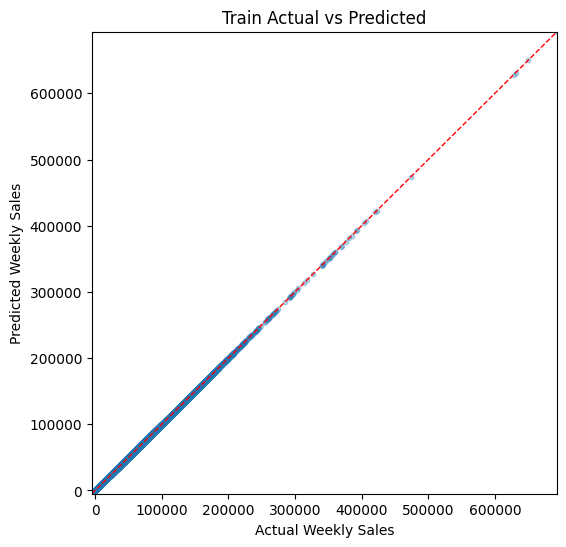

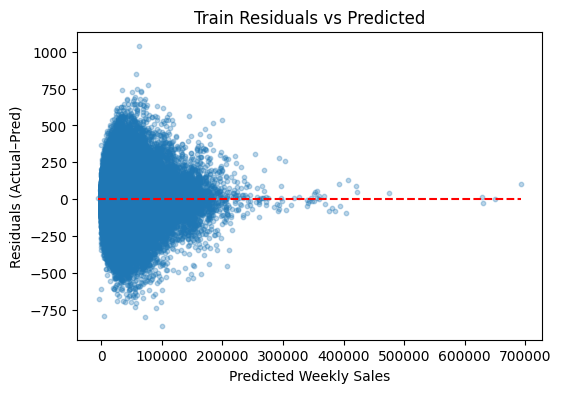

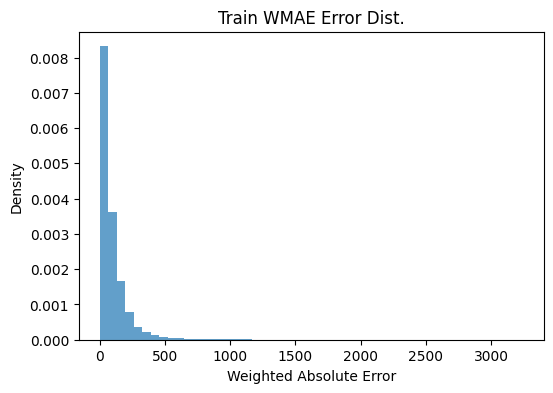

[TEST] WMAE=360.1172  MAE=355.2218  RMSE=1118.4146  R2=0.9974


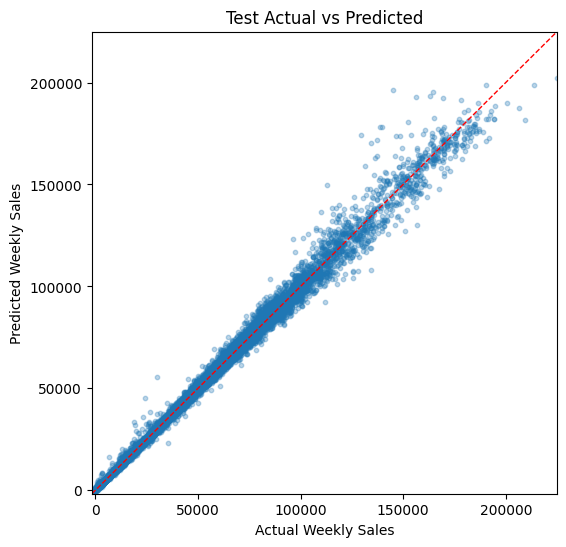

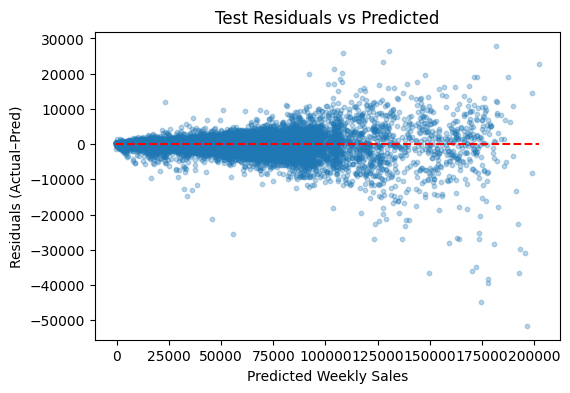

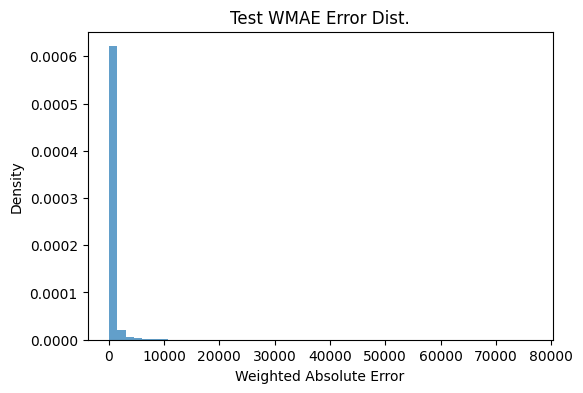

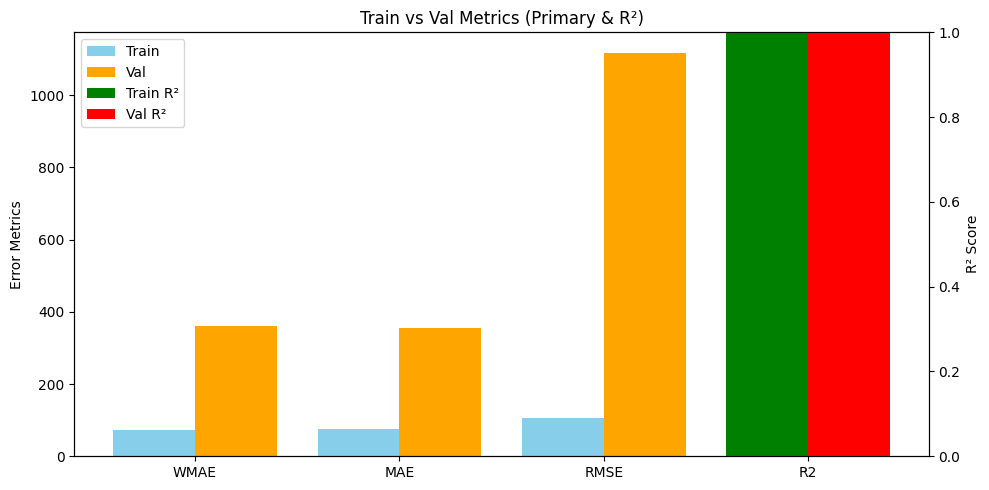

→ test WMAE = 360.1172
🏃 View run tuning_ne3000_md9_lr0p06 at: https://dagshub.com/nkhar21/ML_Final_Project.mlflow/#/experiments/7/runs/dc945a0216cf4be58605ecb73478d0e8
🧪 View experiment at: https://dagshub.com/nkhar21/ML_Final_Project.mlflow/#/experiments/7

=== Training tuning_ne4000_md8_lr0p05 ===
[TRAIN] WMAE=104.5903  MAE=107.6677  RMSE=158.4513  R2=1.0000


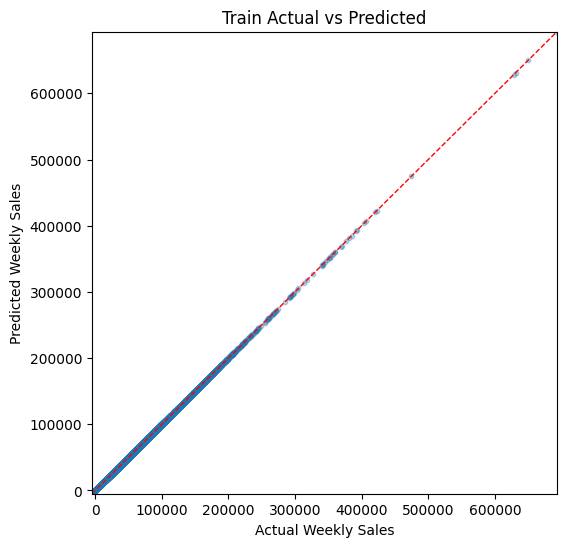

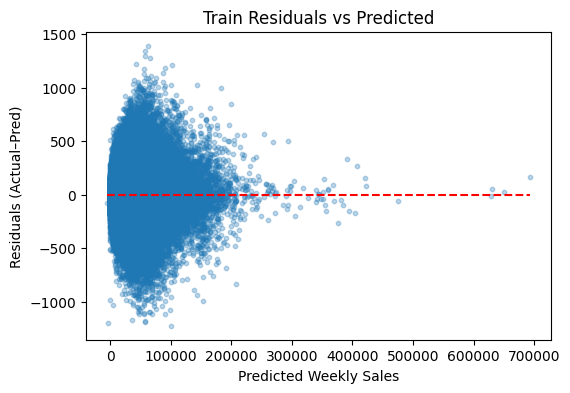

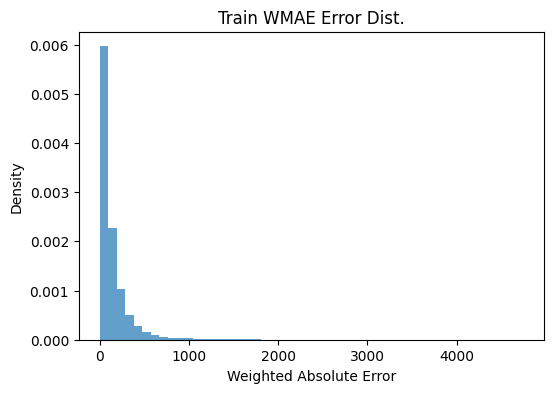

[TEST] WMAE=358.4526  MAE=352.3923  RMSE=1115.4778  R2=0.9974


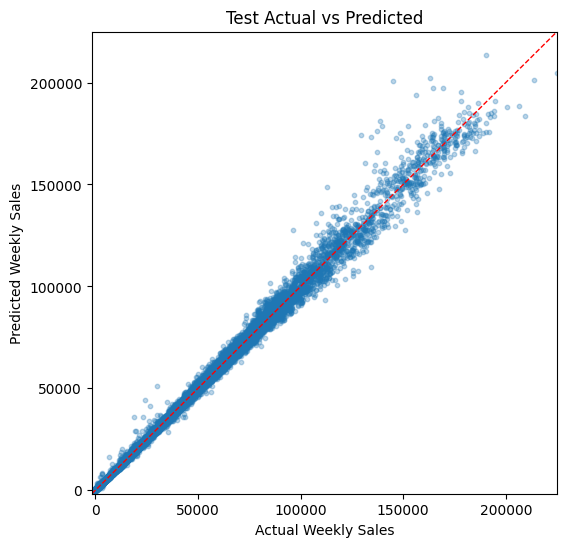

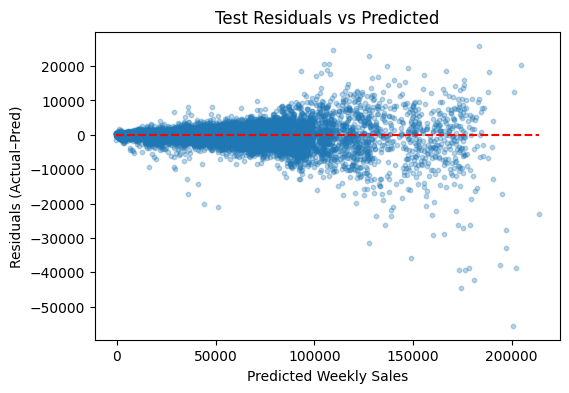

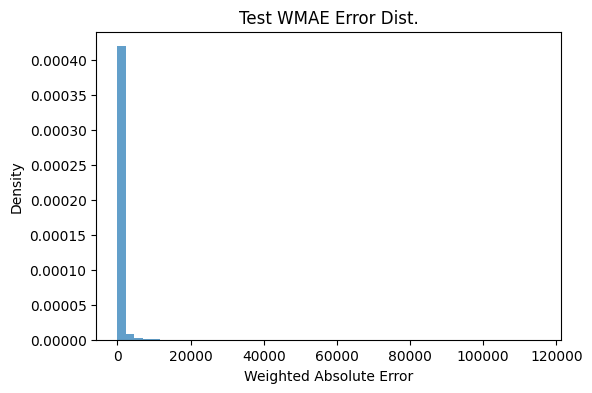

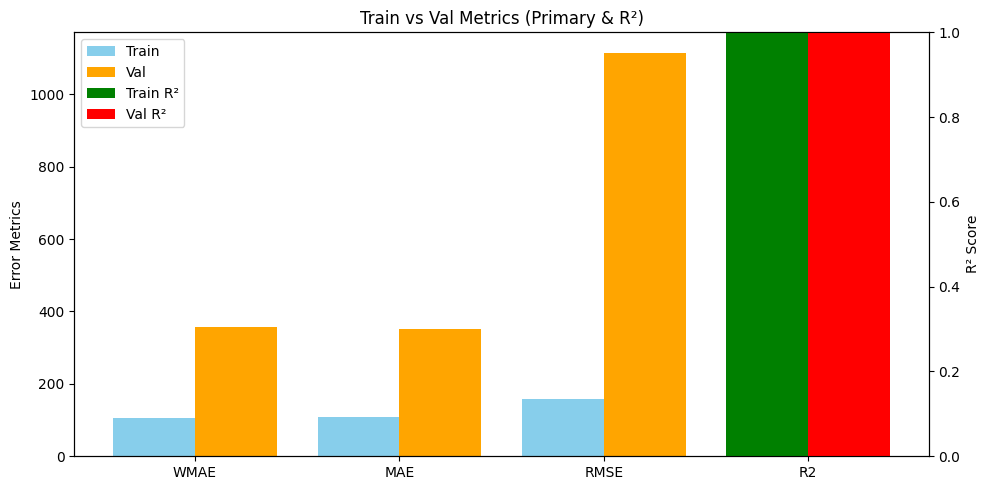

→ test WMAE = 358.4526
🏃 View run tuning_ne4000_md8_lr0p05 at: https://dagshub.com/nkhar21/ML_Final_Project.mlflow/#/experiments/7/runs/affb15866f8b4364884b1cdb796ed61e
🧪 View experiment at: https://dagshub.com/nkhar21/ML_Final_Project.mlflow/#/experiments/7

=== Training tuning_ne4000_md7_lr0p04 ===
[TRAIN] WMAE=178.1660  MAE=180.2843  RMSE=290.5683  R2=0.9998


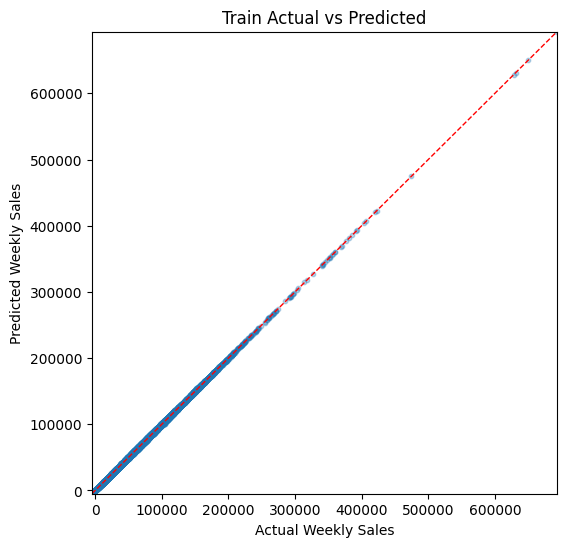

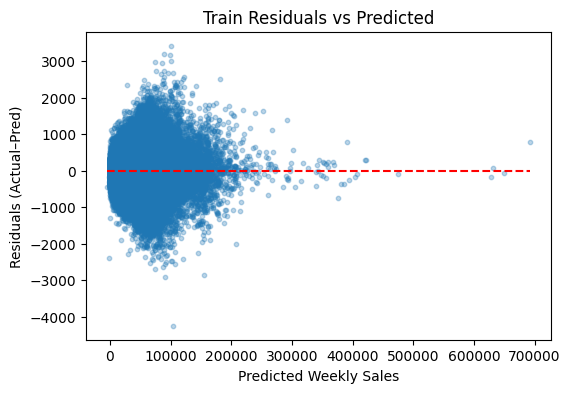

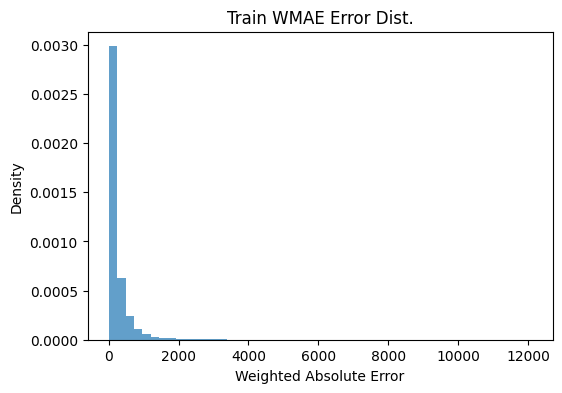

[TEST] WMAE=367.8311  MAE=362.7323  RMSE=1130.5758  R2=0.9974


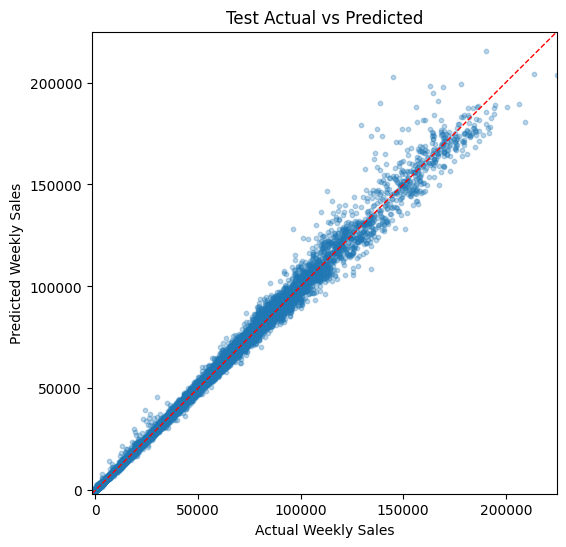

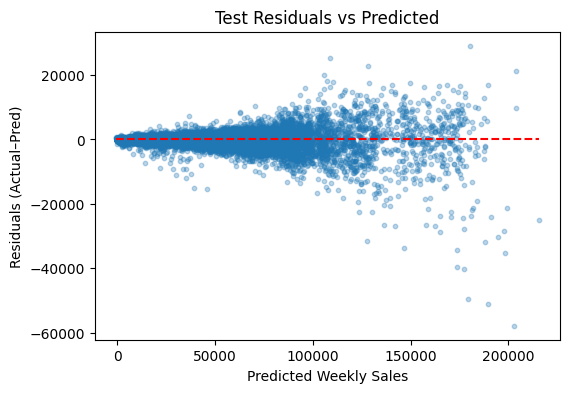

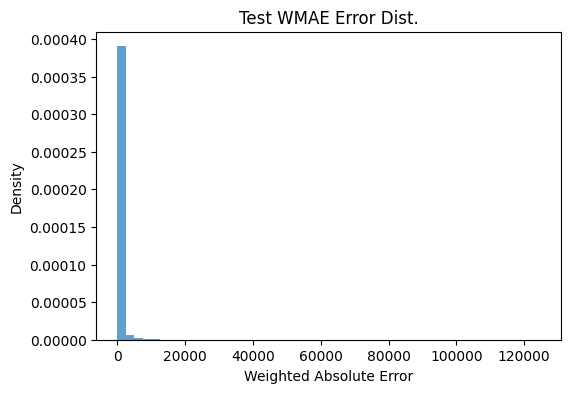

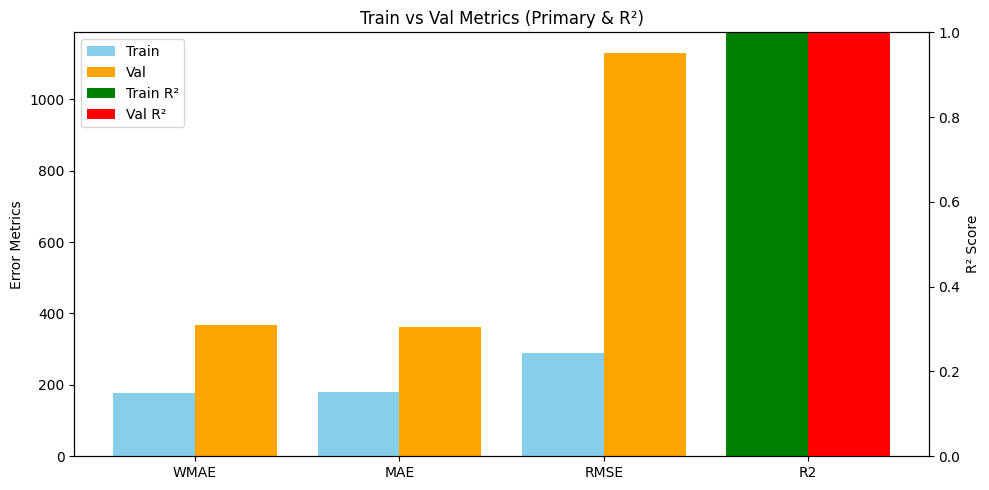

→ test WMAE = 367.8311
🏃 View run tuning_ne4000_md7_lr0p04 at: https://dagshub.com/nkhar21/ML_Final_Project.mlflow/#/experiments/7/runs/d4bed6c8c3ad4b328962cd9573f7cb19
🧪 View experiment at: https://dagshub.com/nkhar21/ML_Final_Project.mlflow/#/experiments/7

=== Training tuning_ne3500_md6_lr0p05 ===
[TRAIN] WMAE=236.8904  MAE=235.3374  RMSE=400.6569  R2=0.9997


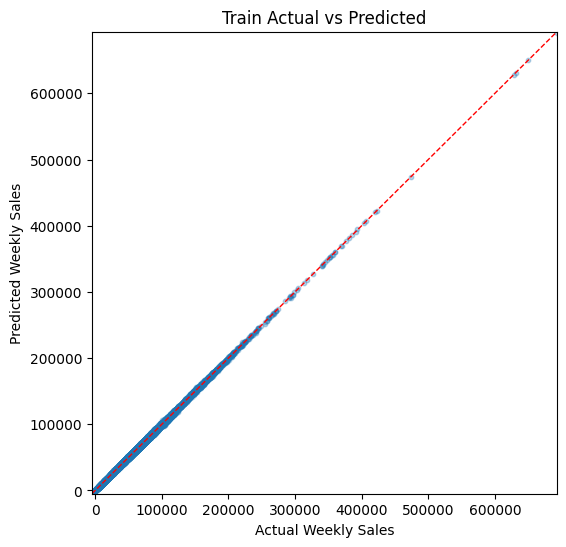

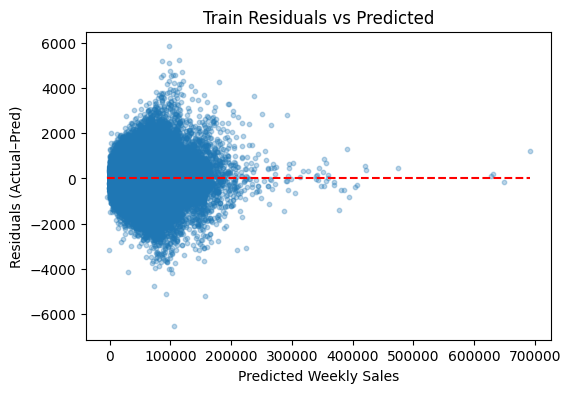

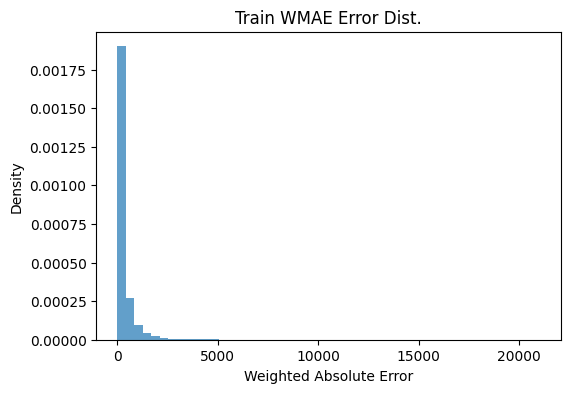

[TEST] WMAE=383.4395  MAE=378.2204  RMSE=1149.1764  R2=0.9973


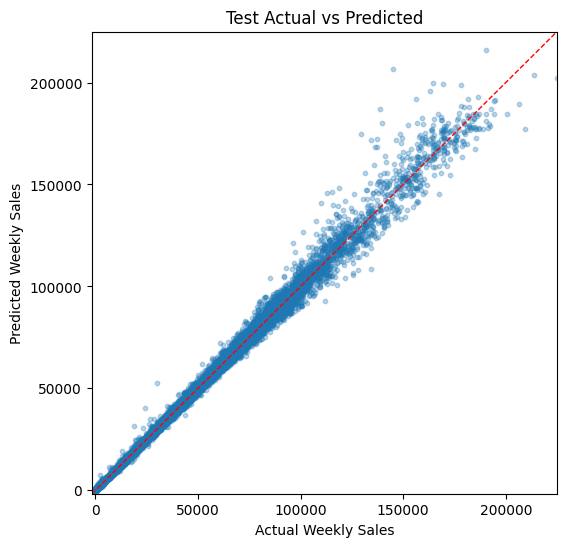

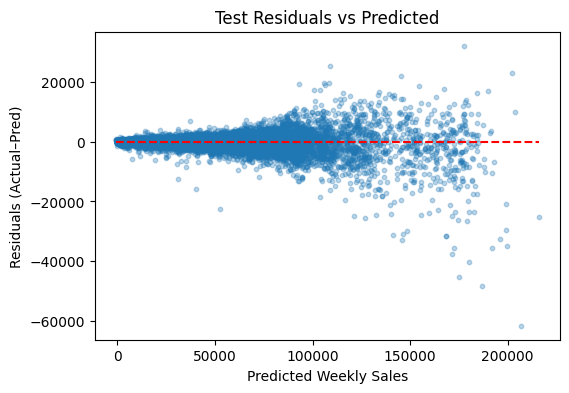

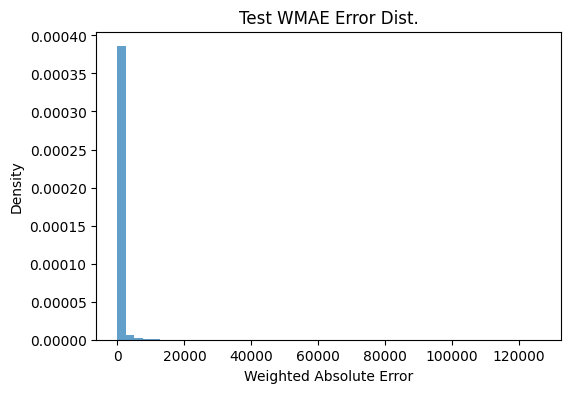

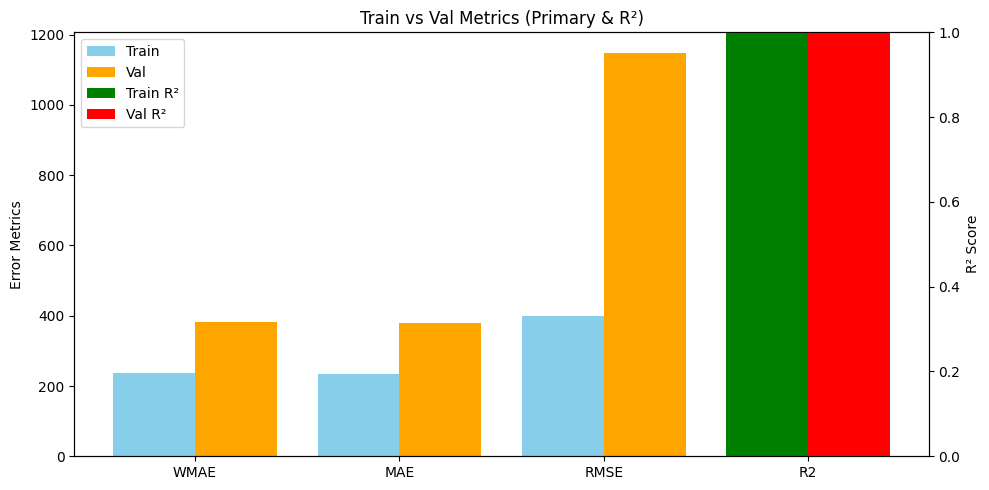

→ test WMAE = 383.4395
🏃 View run tuning_ne3500_md6_lr0p05 at: https://dagshub.com/nkhar21/ML_Final_Project.mlflow/#/experiments/7/runs/679d8f3aaf19456ea272717c0d890c74
🧪 View experiment at: https://dagshub.com/nkhar21/ML_Final_Project.mlflow/#/experiments/7

=== Training tuning_ne3500_md7_lr0p04 ===
[TRAIN] WMAE=192.4562  MAE=194.1414  RMSE=317.2603  R2=0.9998


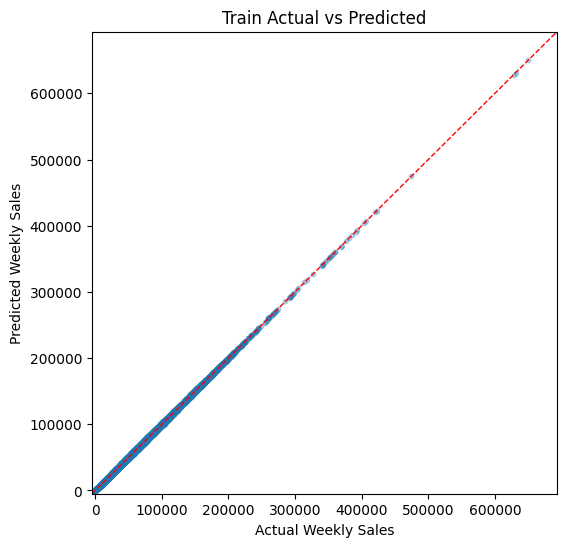

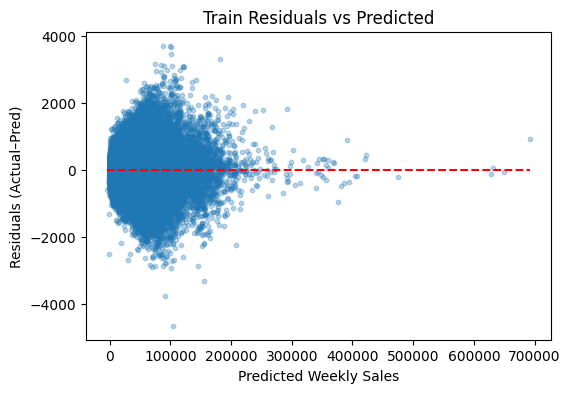

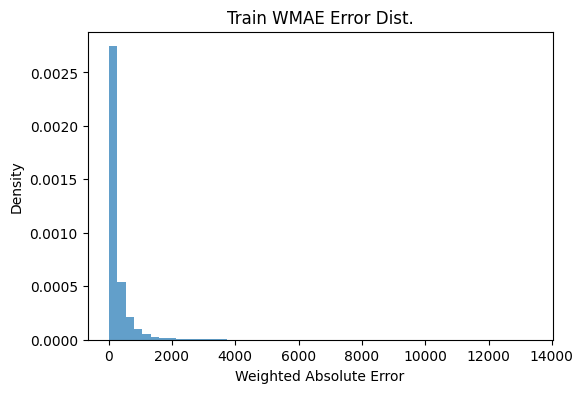

[TEST] WMAE=372.0929  MAE=366.9523  RMSE=1131.4196  R2=0.9974


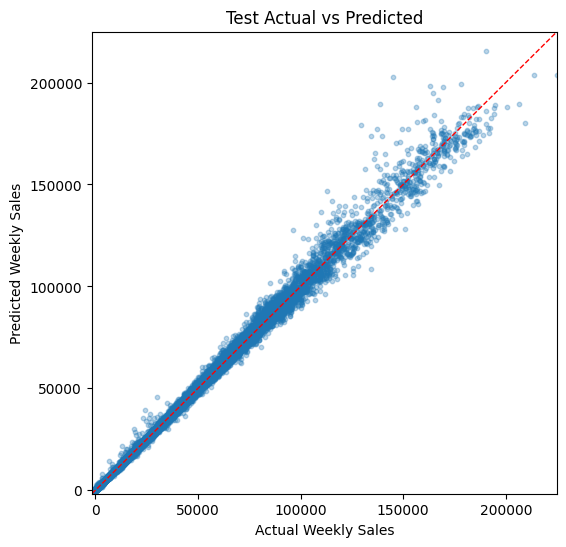

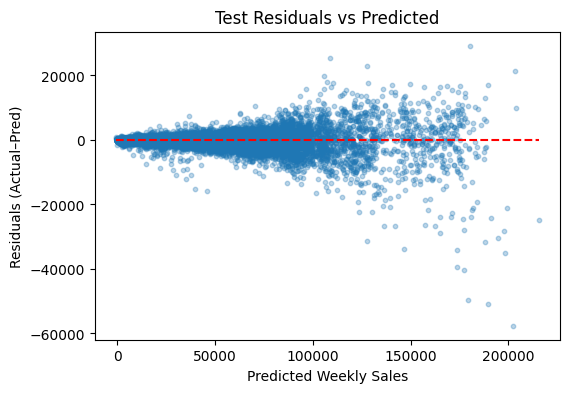

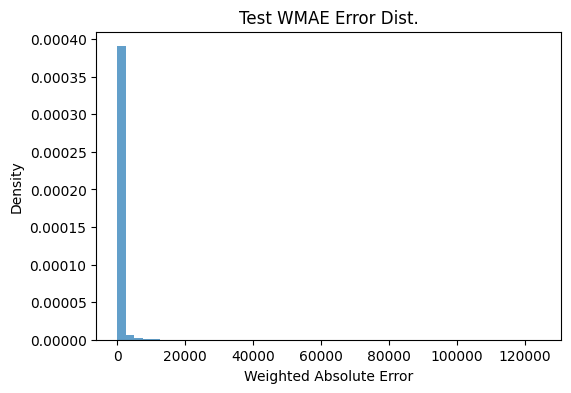

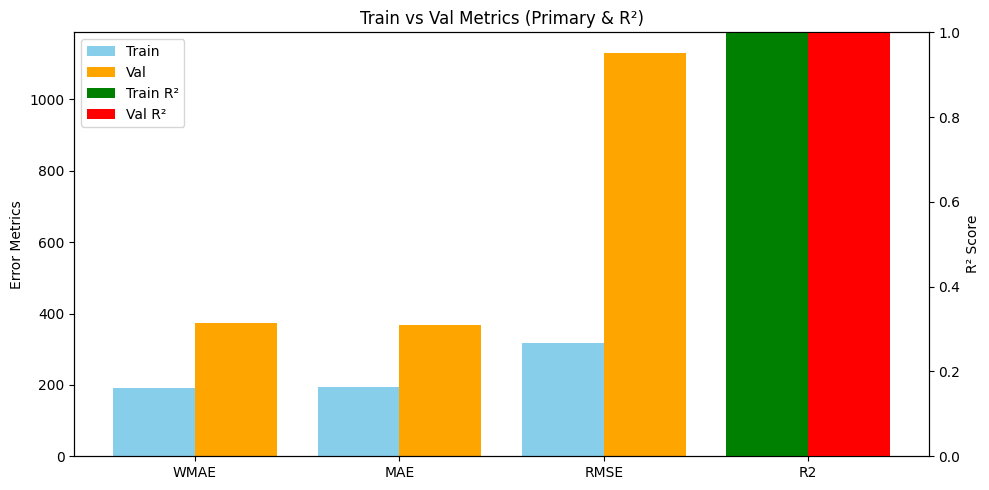

→ test WMAE = 372.0929
🏃 View run tuning_ne3500_md7_lr0p04 at: https://dagshub.com/nkhar21/ML_Final_Project.mlflow/#/experiments/7/runs/94c7825f5fe6428c9f0e5ecf4bc82587
🧪 View experiment at: https://dagshub.com/nkhar21/ML_Final_Project.mlflow/#/experiments/7


In [ ]:
import mlflow
import mlflow.xgboost
import pickle
import numpy as np
import xgboost as xgb
from datetime import datetime

for ne, md, lr in ne_md_lr:
    run_name = f"tuning_ne{ne}_md{md}_lr{lr}".replace('.', 'p')
    print(f"\n=== Training {run_name} ===")

    with mlflow.start_run(run_name=run_name):
        # instantiate
        model = xgb.XGBRegressor(
            n_estimators   = ne,
            max_depth      = md,
            learning_rate  = lr,
            subsample      = 0.8,
            colsample_bytree=0.8,
            gamma          = 0,
            reg_alpha      = 0,
            reg_lambda     = 1,
            objective      = "reg:squarederror",
            random_state   = 42,
            n_jobs         = -1,
        )
        log_xgb_params(model)

        model.fit(X_train, y_train)

        train_metrics = evaluate_and_plot(model, X_train, y_train, w_train, split="train")
        test_metrics  = evaluate_and_plot(model, X_test,  y_test,  w_test,  split="test")

        plot_overfitting(train_metrics, test_metrics)

        test_wmae = test_metrics["WMAE"]
        if test_wmae < best_wmae:
            best_wmae  = test_wmae
            best_params = {"n_estimators": ne, "max_depth": md, "learning_rate": lr}
            best_model  = model

        print(f"→ test WMAE = {test_wmae:.4f}")


In [ ]:
import pickle
if best_model is not None:
    print("\n✅ Best model:", best_params, "with WMAE =", best_wmae)


✅ Best model: {'n_estimators': 4000, 'max_depth': 8, 'learning_rate': 0.05} with WMAE = 358.4526417334793


# trianing 6 - tuning rl, ne, md 2

In [ ]:
df_final_train, df_final_test = split_sales_data(df_final)

X_train = df_final_train.drop(['Weekly_Sales', 'Date'], axis=1)
X_test  = df_final_test.drop(['Weekly_Sales', 'Date'], axis=1)

X_train.shape, X_test.shape

((311960, 58), (109610, 58))

In [ ]:
ne_md_lr = [(4000, 8, 0.05), (4000, 9, 0.03), (5000, 8, 0.05),
            (5000, 9, 0.03), (6000, 8, 0.05), (6000, 9, 0.02),]

mlflow.set_experiment("Training_XGB")

best_wmae = float("inf")
best_params = None
best_model  = None

In [ ]:
!pip install xgboost --upgrade


=== Training tuning_again_ne4000_md8_lr0p05 ===
[TRAIN] WMAE=104.1999  MAE=107.4993  RMSE=157.9328  R2=1.0000


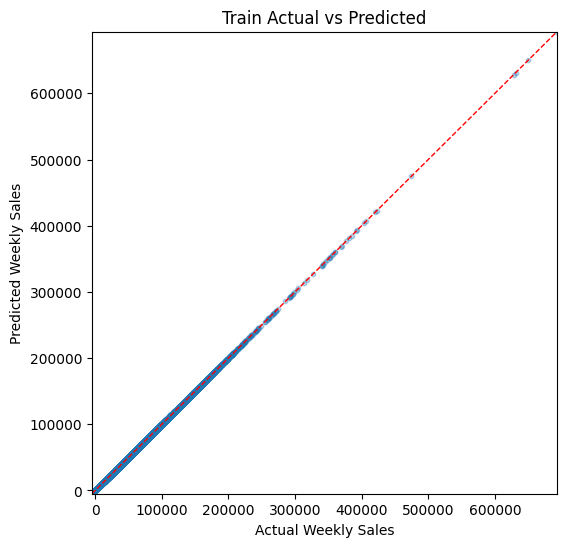

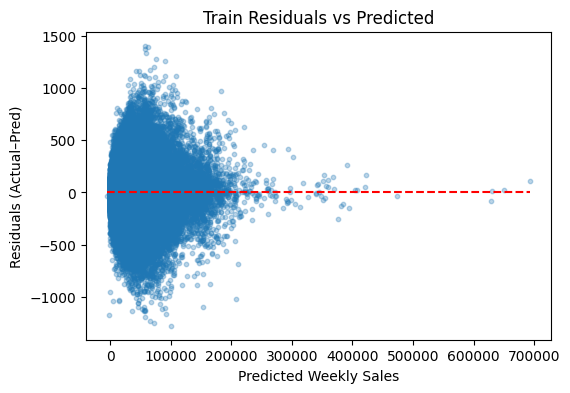

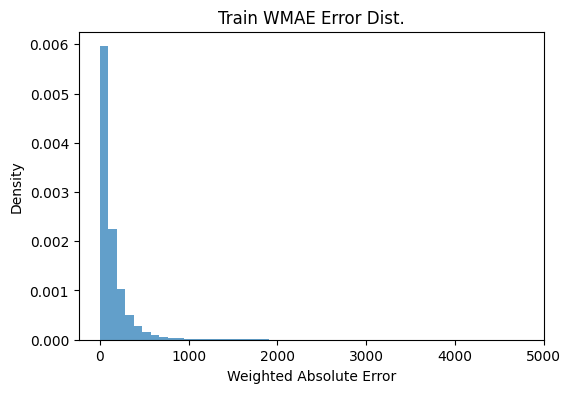

[TEST] WMAE=361.5467  MAE=356.5523  RMSE=1115.6854  R2=0.9974


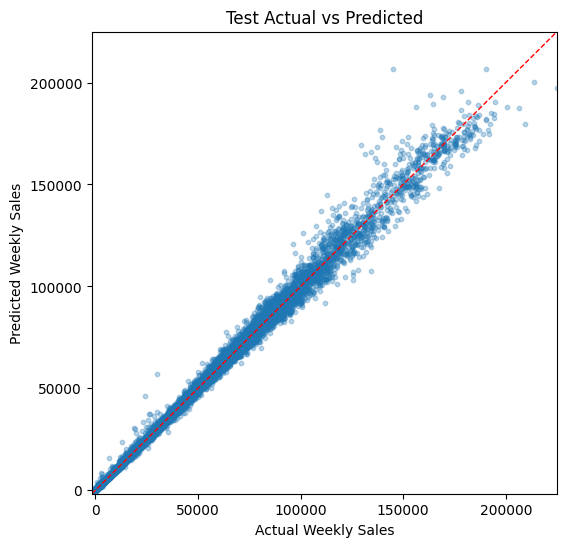

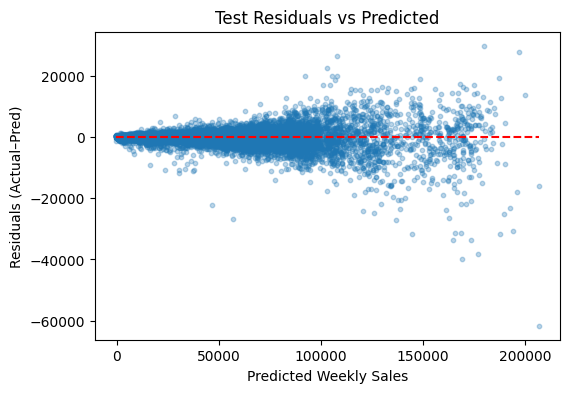

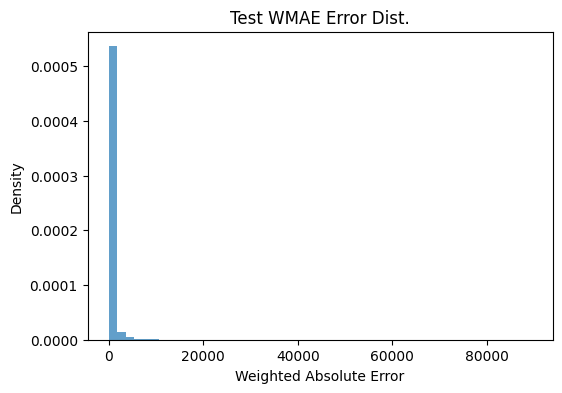

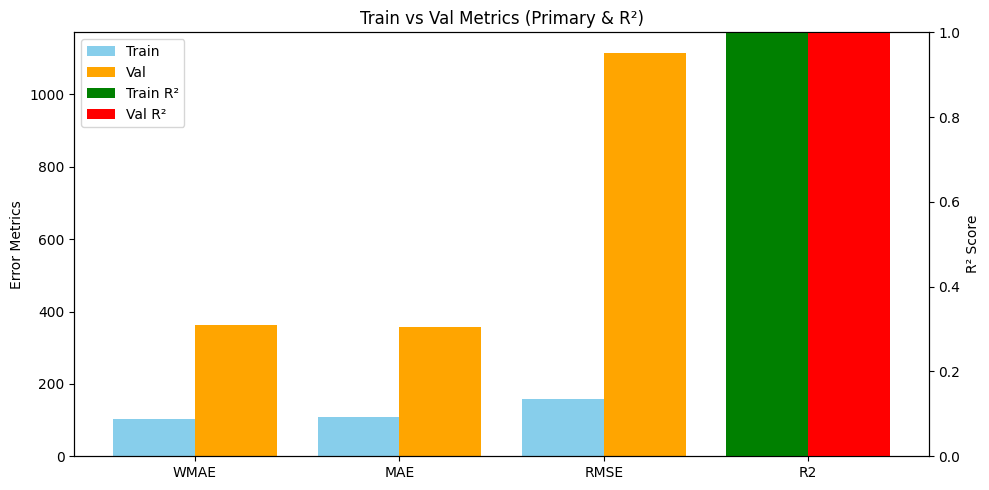

→ test WMAE = 361.5467
🏃 View run tuning_again_ne4000_md8_lr0p05 at: https://dagshub.com/nkhar21/ML_Final_Project.mlflow/#/experiments/7/runs/126f151e8d594f2e9321a1d1acaa7295
🧪 View experiment at: https://dagshub.com/nkhar21/ML_Final_Project.mlflow/#/experiments/7

=== Training tuning_again_ne4000_md9_lr0p03 ===
[TRAIN] WMAE=101.1042  MAE=105.1352  RMSE=155.8496  R2=1.0000


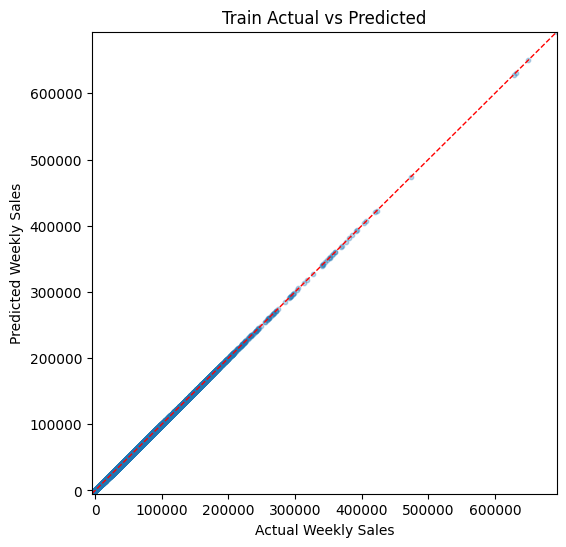

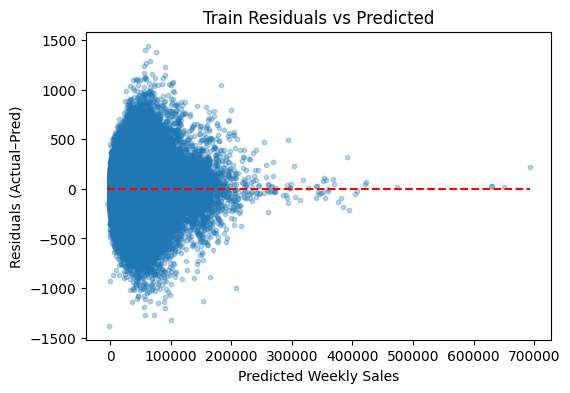

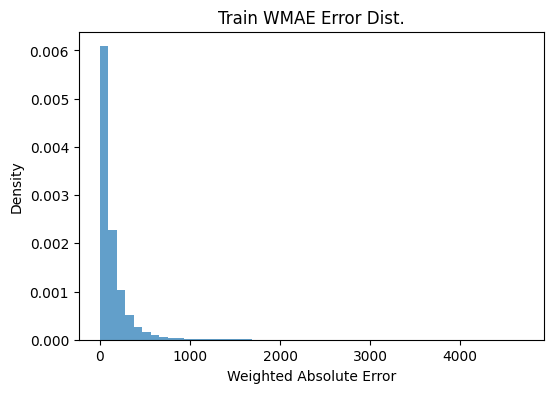

[TEST] WMAE=354.5650  MAE=349.1475  RMSE=1084.5083  R2=0.9976


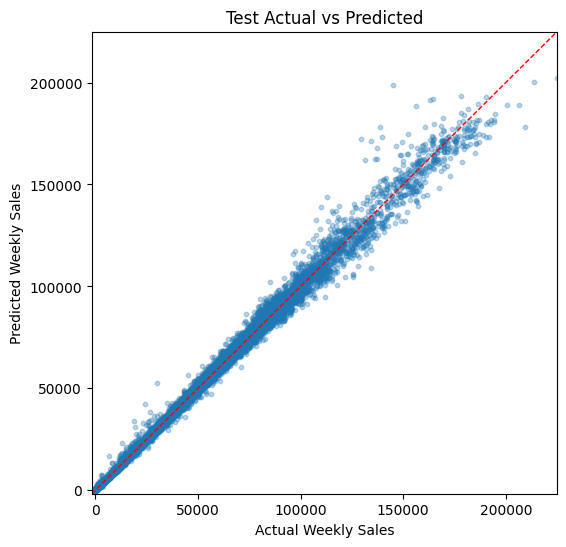

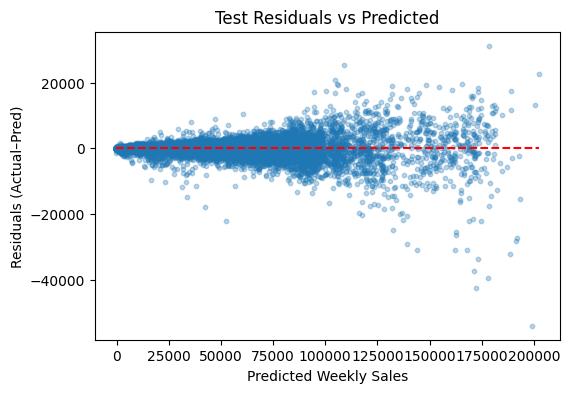

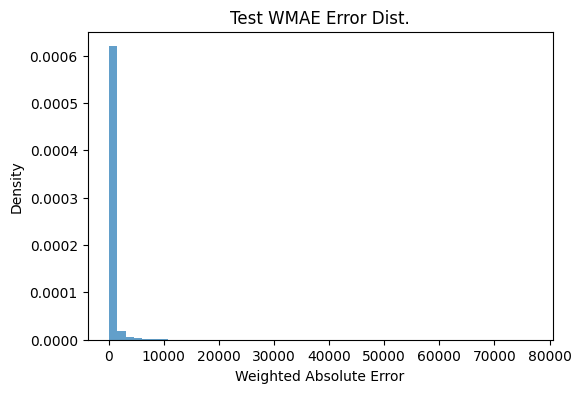

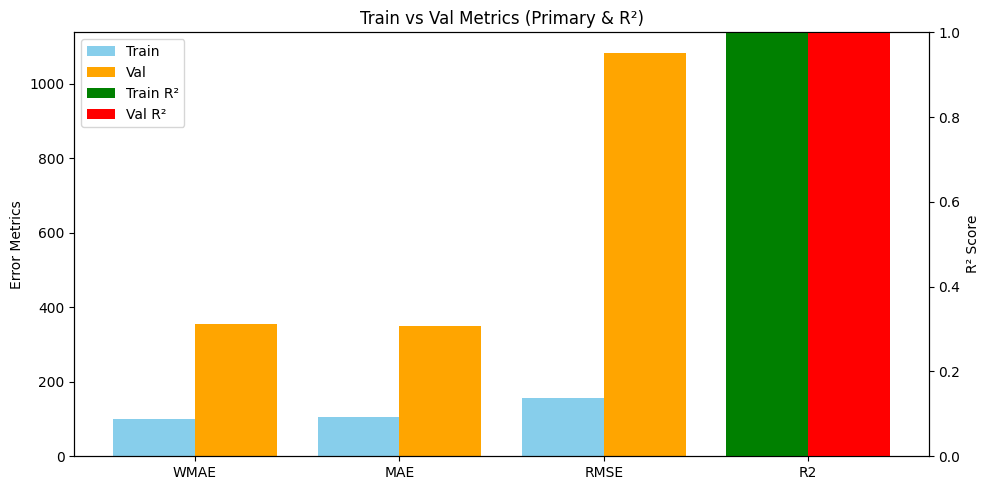

→ test WMAE = 354.5650
🏃 View run tuning_again_ne4000_md9_lr0p03 at: https://dagshub.com/nkhar21/ML_Final_Project.mlflow/#/experiments/7/runs/8d17702aea604e7cb90b6b9e76c7185b
🧪 View experiment at: https://dagshub.com/nkhar21/ML_Final_Project.mlflow/#/experiments/7

=== Training tuning_again_ne5000_md8_lr0p05 ===
[TRAIN] WMAE=85.8812  MAE=88.8642  RMSE=127.3645  R2=1.0000


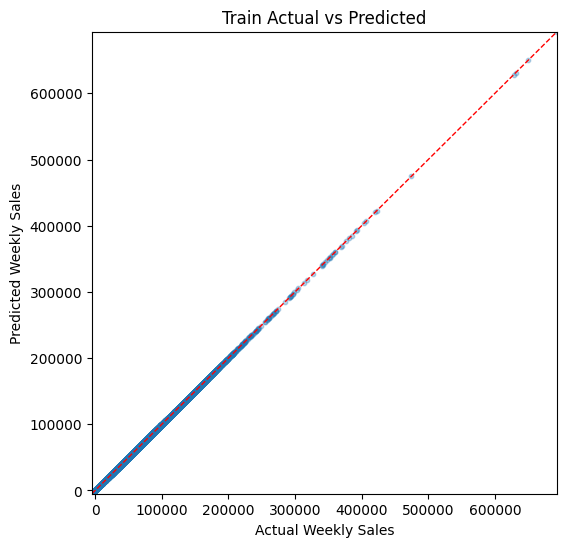

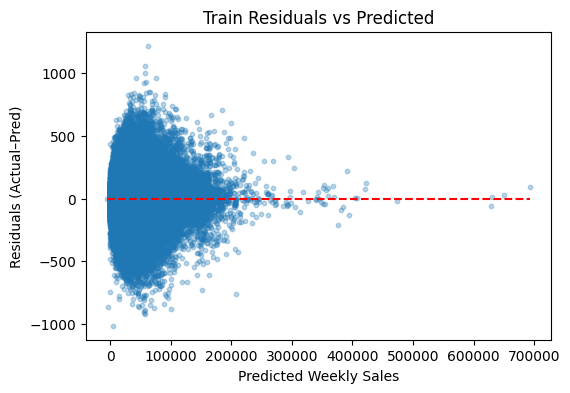

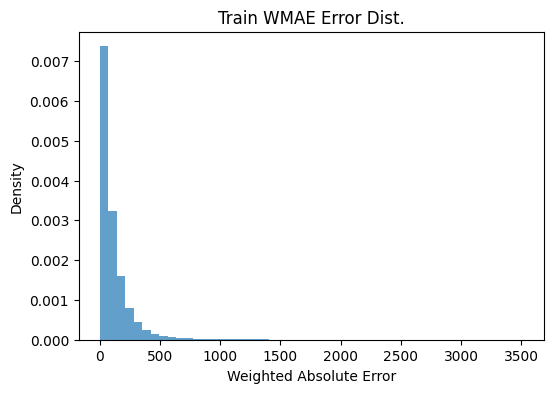

[TEST] WMAE=359.2609  MAE=354.3448  RMSE=1115.3077  R2=0.9974


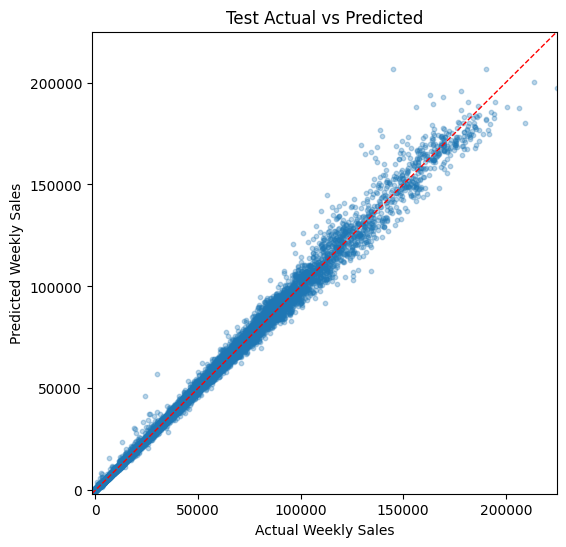

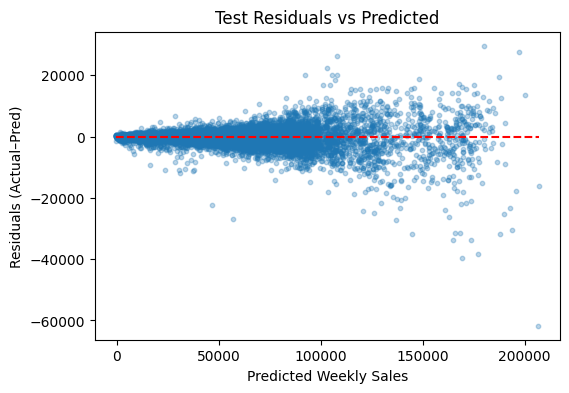

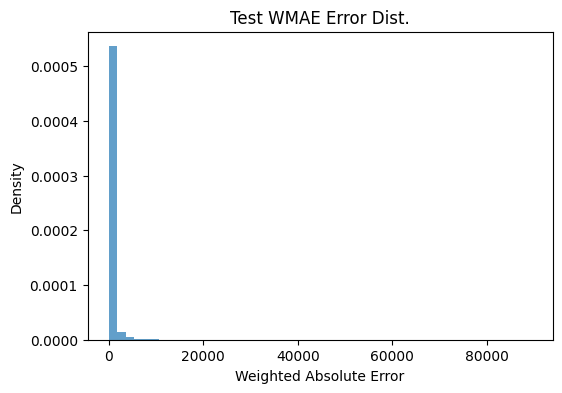

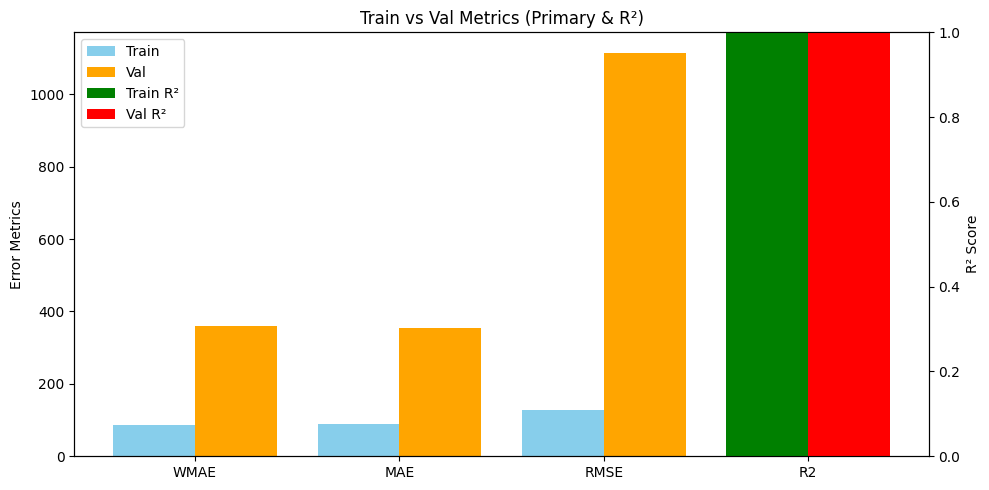

→ test WMAE = 359.2609
🏃 View run tuning_again_ne5000_md8_lr0p05 at: https://dagshub.com/nkhar21/ML_Final_Project.mlflow/#/experiments/7/runs/8455ba5e4093401598339ccdcff5978f
🧪 View experiment at: https://dagshub.com/nkhar21/ML_Final_Project.mlflow/#/experiments/7

=== Training tuning_again_ne5000_md9_lr0p03 ===
[TRAIN] WMAE=82.5485  MAE=86.0536  RMSE=123.9937  R2=1.0000


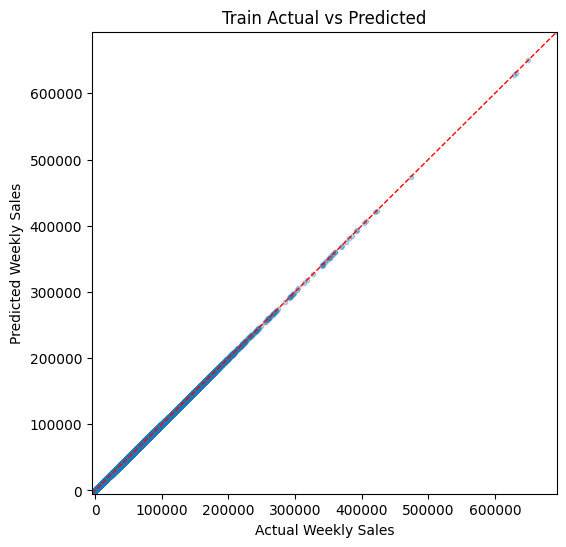

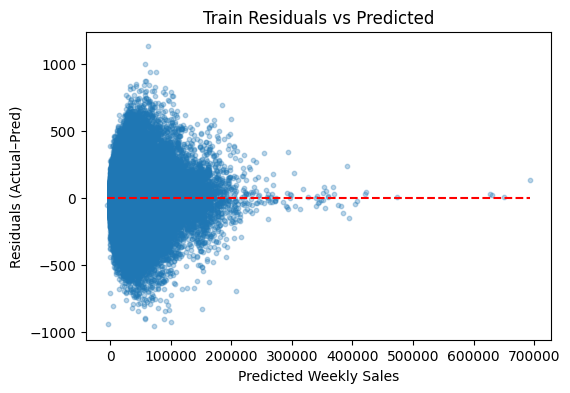

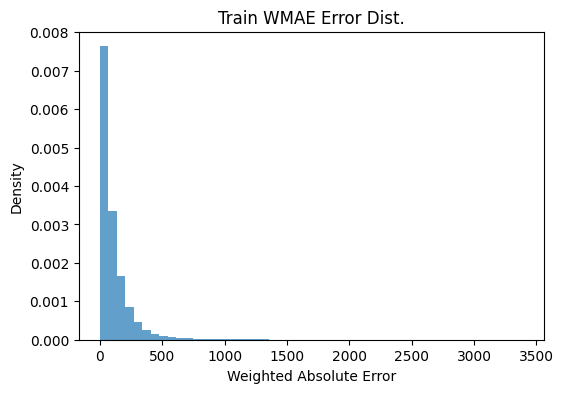

[TEST] WMAE=352.1848  MAE=346.9125  RMSE=1084.2777  R2=0.9976


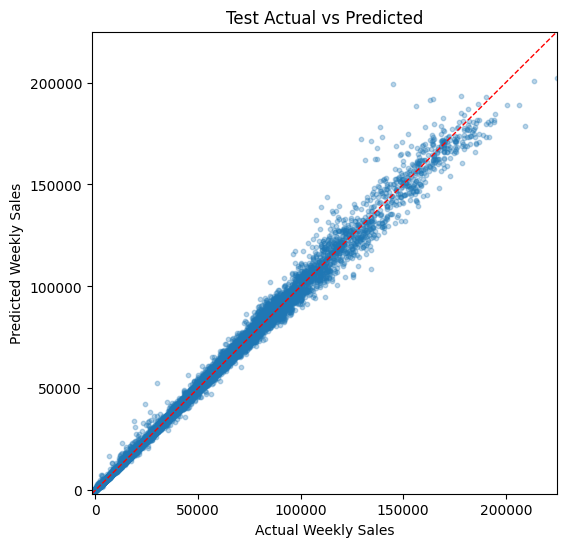

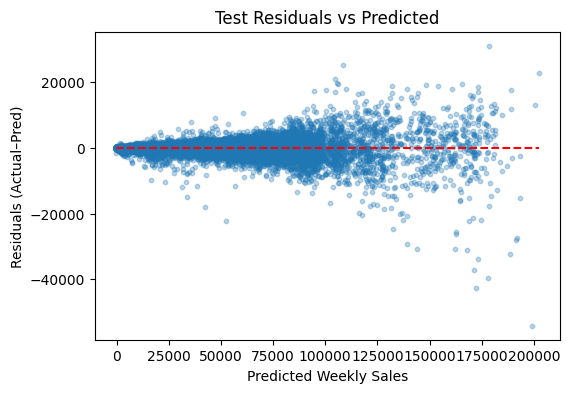

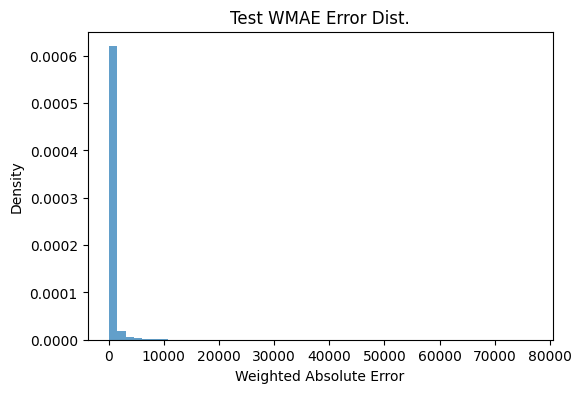

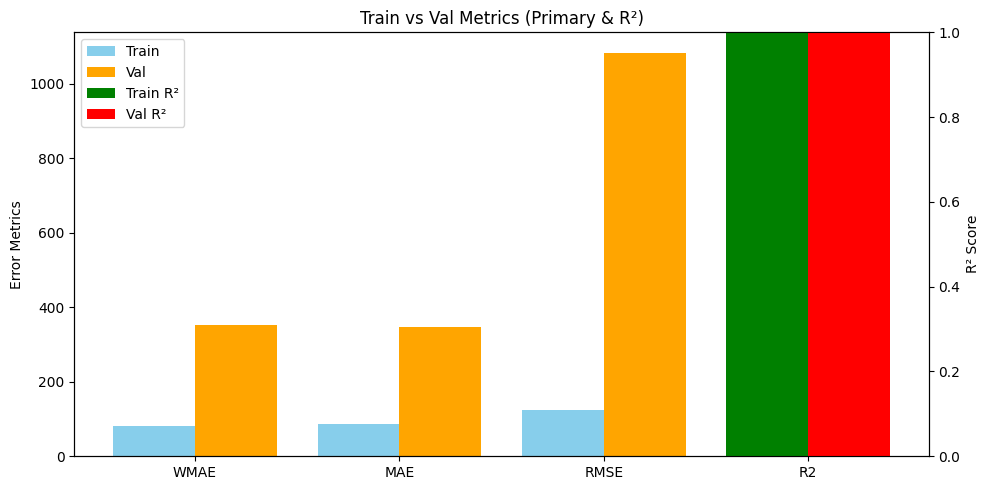

→ test WMAE = 352.1848
🏃 View run tuning_again_ne5000_md9_lr0p03 at: https://dagshub.com/nkhar21/ML_Final_Project.mlflow/#/experiments/7/runs/9a73fa1fe9ee4550938c8e6b0a2a888f
🧪 View experiment at: https://dagshub.com/nkhar21/ML_Final_Project.mlflow/#/experiments/7

=== Training tuning_again_ne6000_md8_lr0p05 ===
[TRAIN] WMAE=72.0151  MAE=74.7918  RMSE=105.3841  R2=1.0000


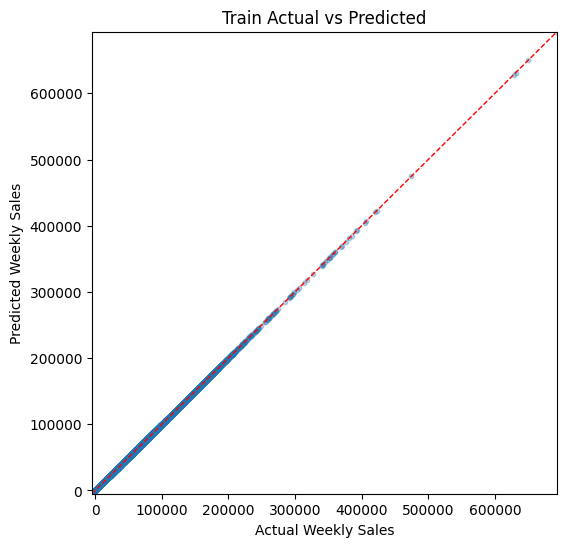

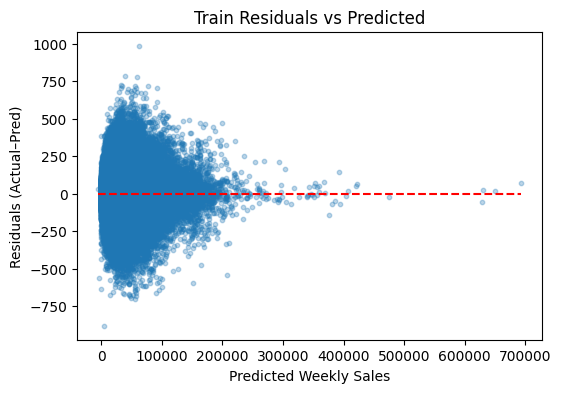

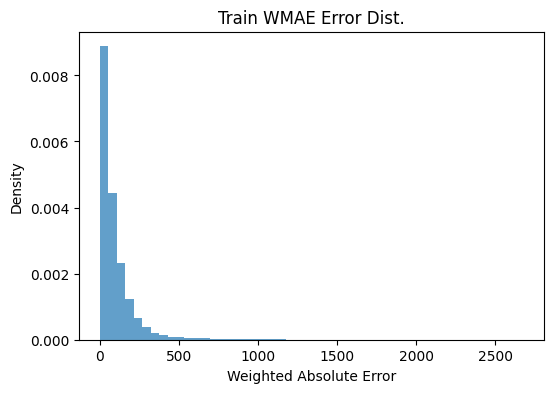

[TEST] WMAE=357.7157  MAE=353.0434  RMSE=1115.1146  R2=0.9974


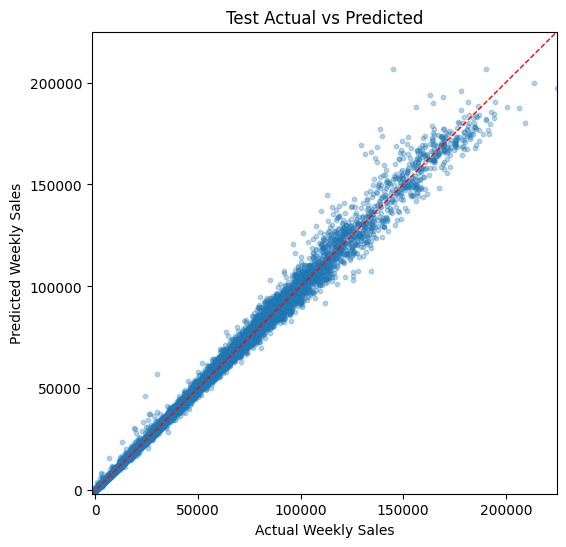

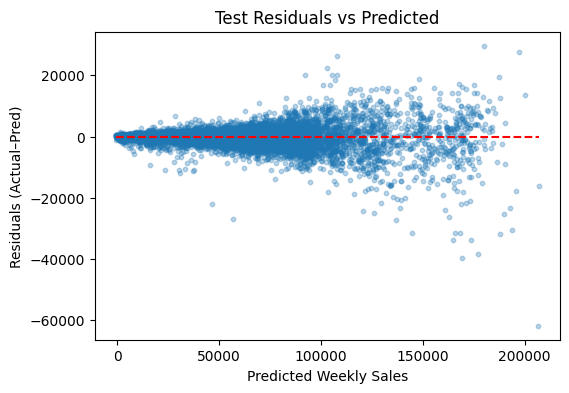

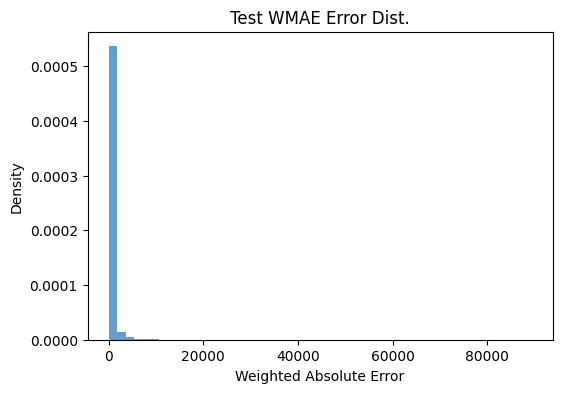

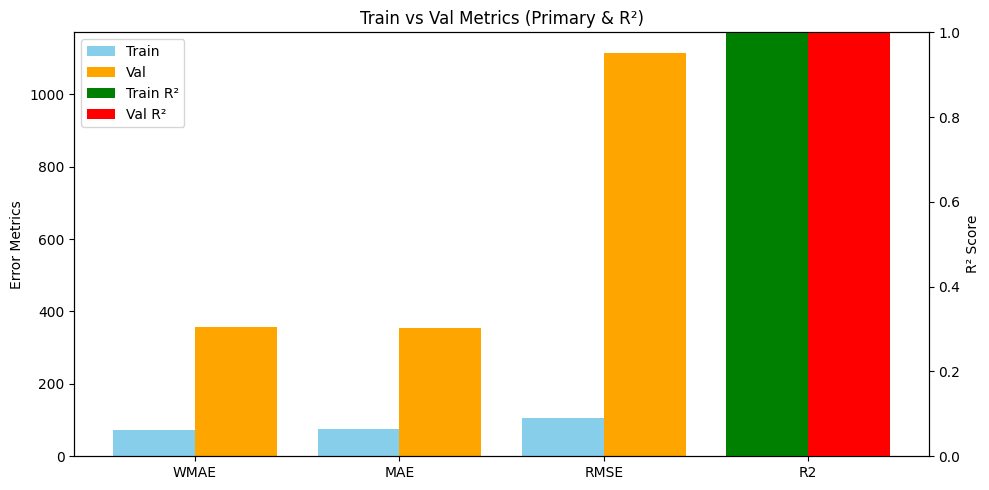

→ test WMAE = 357.7157
🏃 View run tuning_again_ne6000_md8_lr0p05 at: https://dagshub.com/nkhar21/ML_Final_Project.mlflow/#/experiments/7/runs/405481aa4ac34283b2db267c6b888a25
🧪 View experiment at: https://dagshub.com/nkhar21/ML_Final_Project.mlflow/#/experiments/7

=== Training tuning_again_ne6000_md9_lr0p02 ===
[TRAIN] WMAE=99.6510  MAE=103.5607  RMSE=153.2699  R2=1.0000


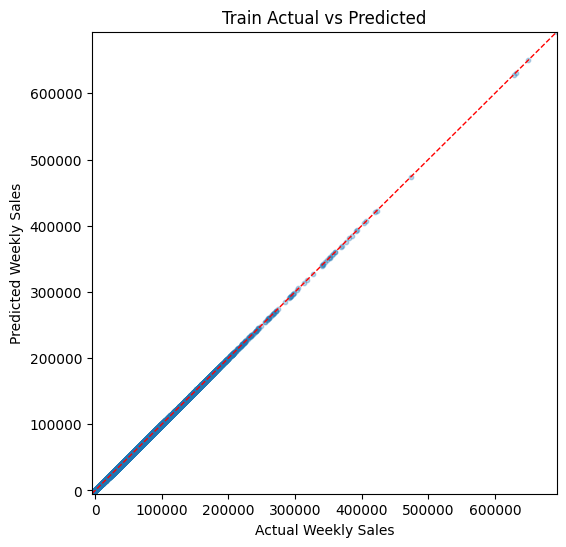

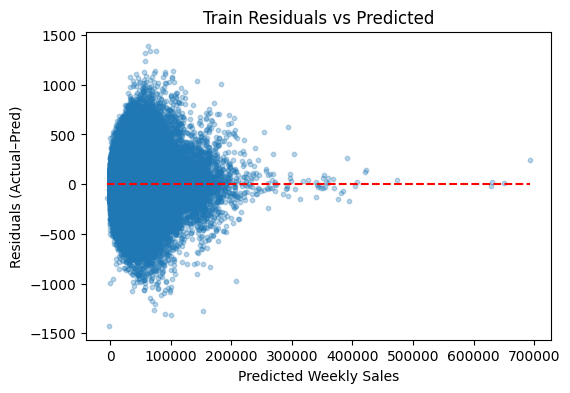

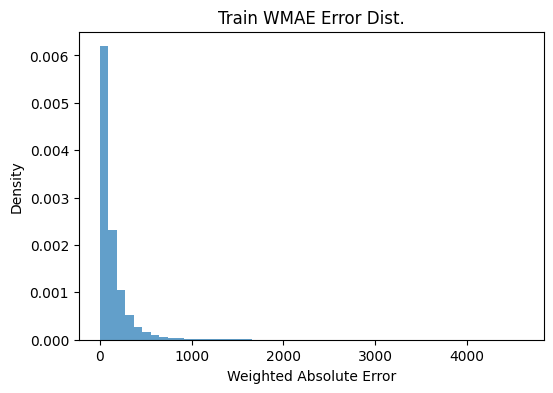

[TEST] WMAE=353.7020  MAE=346.4706  RMSE=1091.7305  R2=0.9976


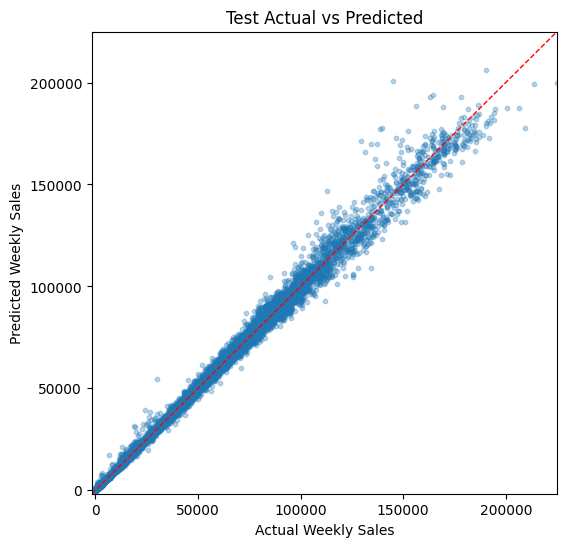

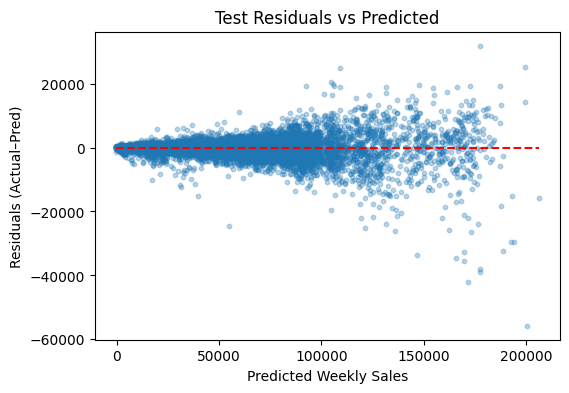

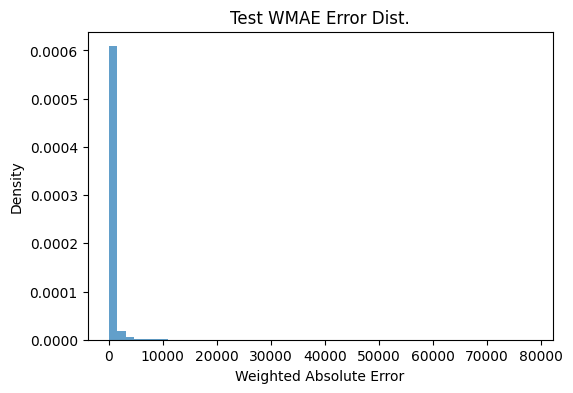

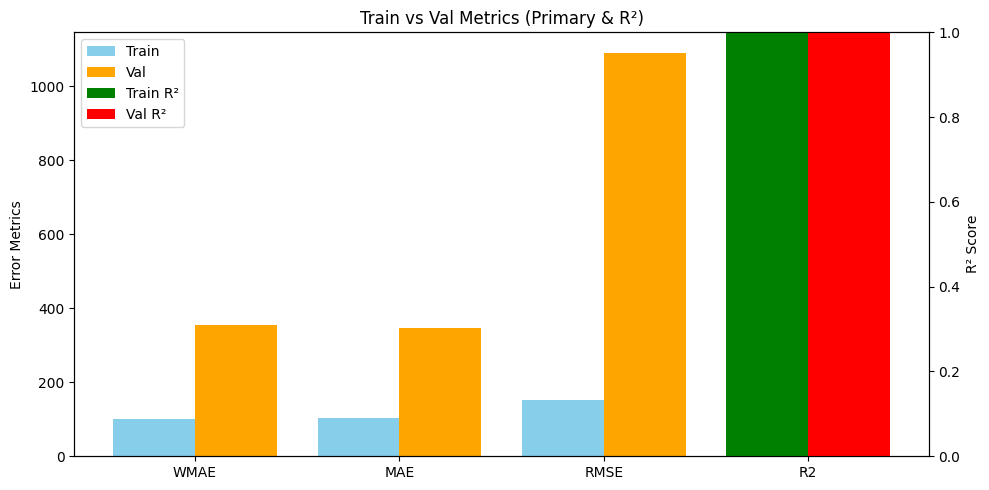

→ test WMAE = 353.7020
🏃 View run tuning_again_ne6000_md9_lr0p02 at: https://dagshub.com/nkhar21/ML_Final_Project.mlflow/#/experiments/7/runs/1e9c43f010b24da0b31efd4d52700e96
🧪 View experiment at: https://dagshub.com/nkhar21/ML_Final_Project.mlflow/#/experiments/7


In [ ]:
import mlflow
import mlflow.xgboost
import pickle
import numpy as np
import xgboost as xgb
from datetime import datetime

for ne, md, lr in ne_md_lr:
    run_name = f"tuning_again_ne{ne}_md{md}_lr{lr}".replace('.', 'p')
    print(f"\n=== Training {run_name} ===")

    with mlflow.start_run(run_name=run_name):
        # instantiate
        model = xgb.XGBRegressor(
            n_estimators   = ne,
            max_depth      = md,
            learning_rate  = lr,
            subsample      = 0.8,
            colsample_bytree=0.8,
            gamma          = 0,
            reg_alpha      = 0,
            reg_lambda     = 1,
            objective      = "reg:squarederror",
            random_state   = 42,
            n_jobs         = -1,
            device         = "cuda"   # <- GPU acceleration
        )
        log_xgb_params(model)

        model.fit(X_train, y_train)

        train_metrics = evaluate_and_plot(model, X_train, y_train, w_train, split="train")
        test_metrics  = evaluate_and_plot(model, X_test,  y_test,  w_test,  split="test")

        plot_overfitting(train_metrics, test_metrics)

        test_wmae = test_metrics["WMAE"]
        if test_wmae < best_wmae:
            best_wmae  = test_wmae
            best_params = {"n_estimators": ne, "max_depth": md, "learning_rate": lr}
            best_model  = model

        print(f"→ test WMAE = {test_wmae:.4f}")

# training 6 - tuning rl, ne, md 3


=== Training tuninggg_ne8000_md8_lr0p01__ ===
[TRAIN] WMAE=188.6252  MAE=191.3735  RMSE=315.6446  R2=0.9998


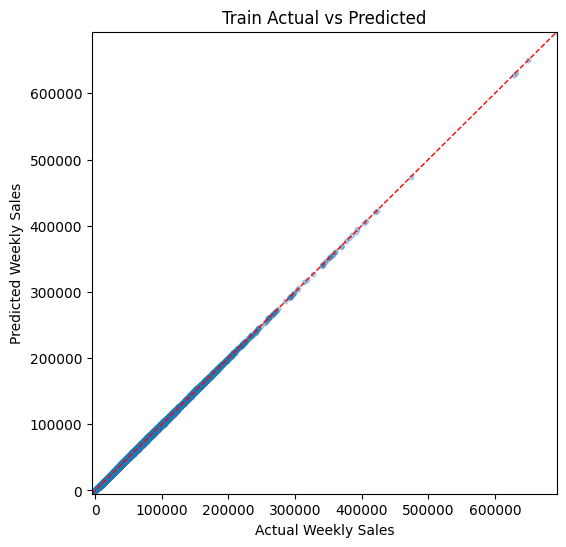

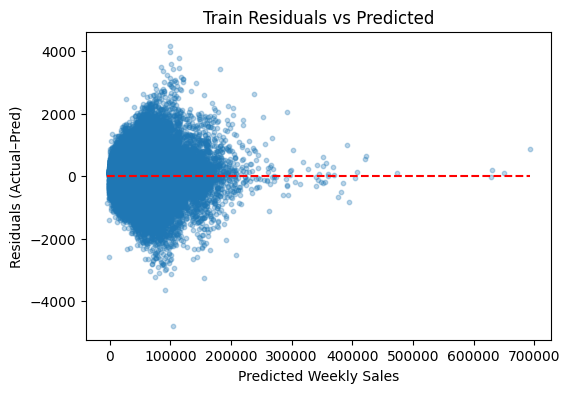

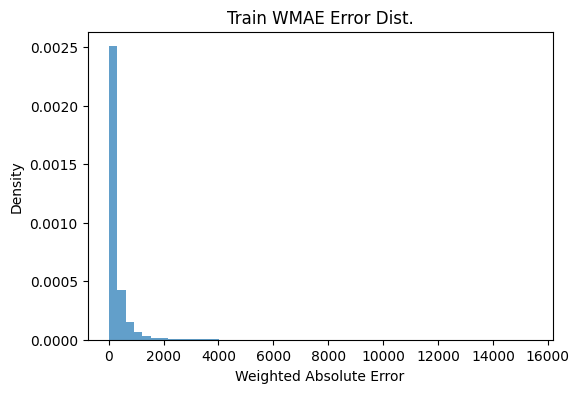

[TEST] WMAE=367.1471  MAE=360.6817  RMSE=1104.6737  R2=0.9975


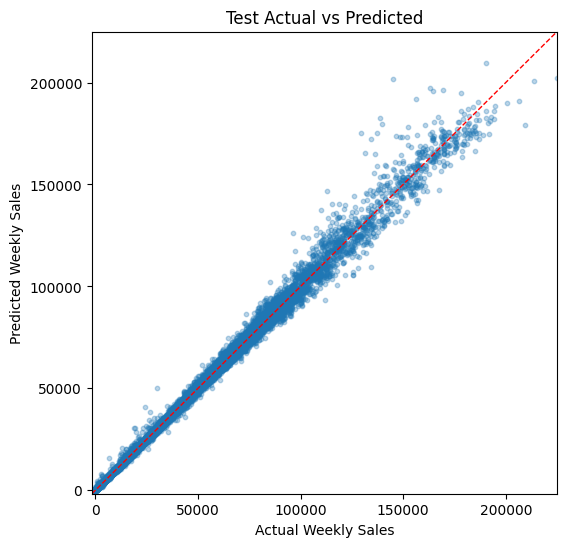

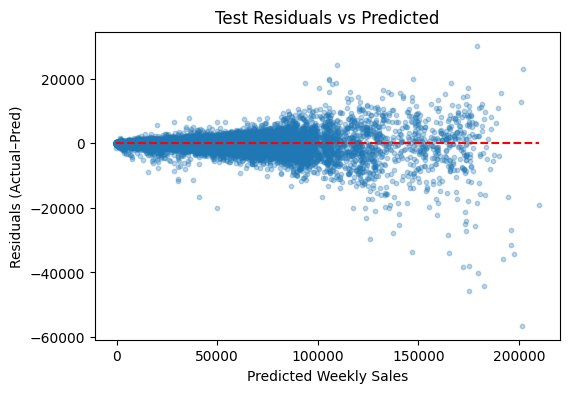

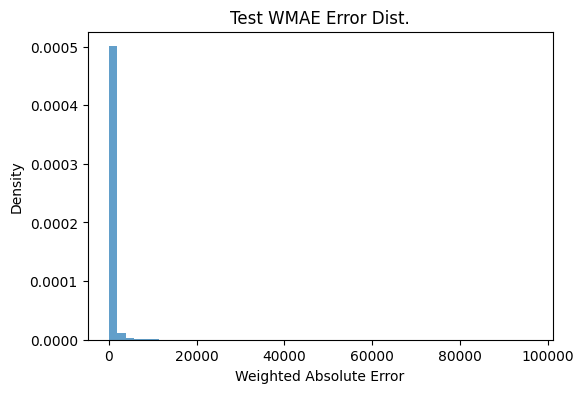

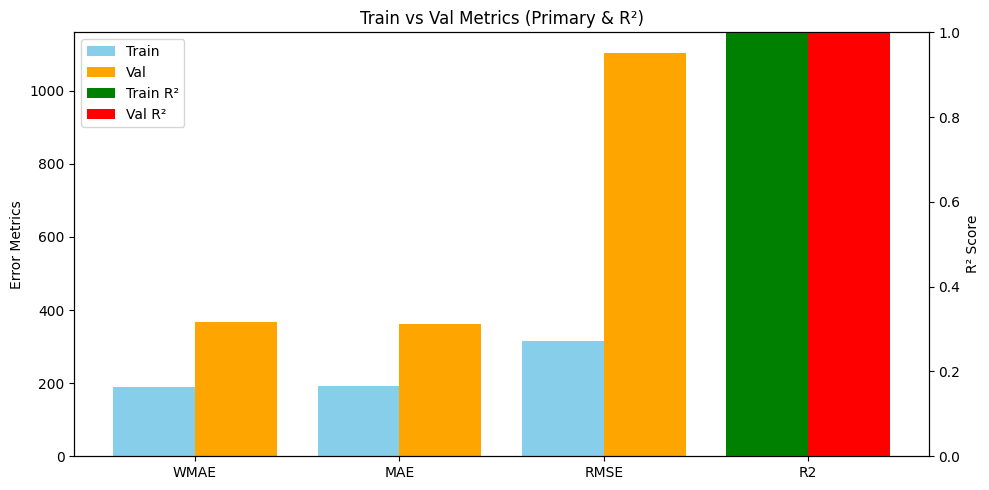

→ test WMAE = 367.1471
🏃 View run tuninggg_ne8000_md8_lr0p01__ at: https://dagshub.com/nkhar21/ML_Final_Project.mlflow/#/experiments/7/runs/bf73a5f7e36e49a4b41554a0c804ce6f
🧪 View experiment at: https://dagshub.com/nkhar21/ML_Final_Project.mlflow/#/experiments/7

=== Training tuninggg_ne8000_md10_lr0p005__ ===
[TRAIN] WMAE=162.2834  MAE=165.2485  RMSE=265.6925  R2=0.9999


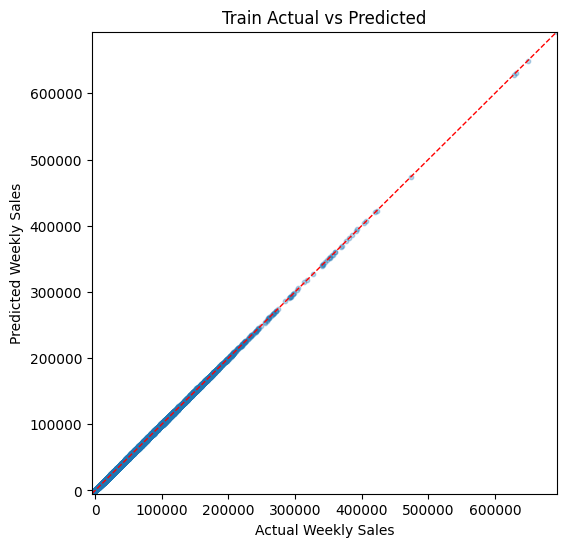

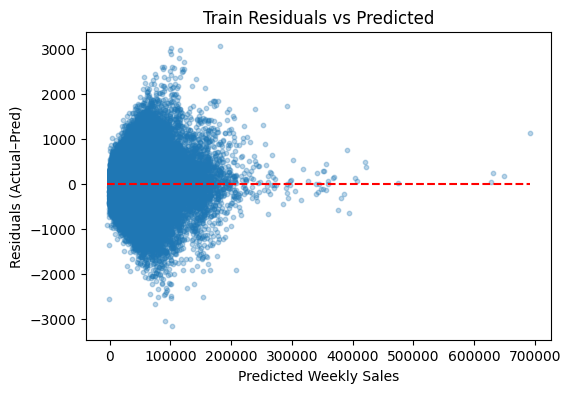

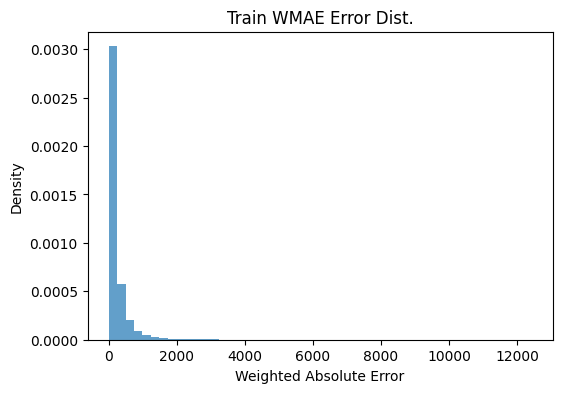

[TEST] WMAE=361.0837  MAE=357.4507  RMSE=1084.6054  R2=0.9976


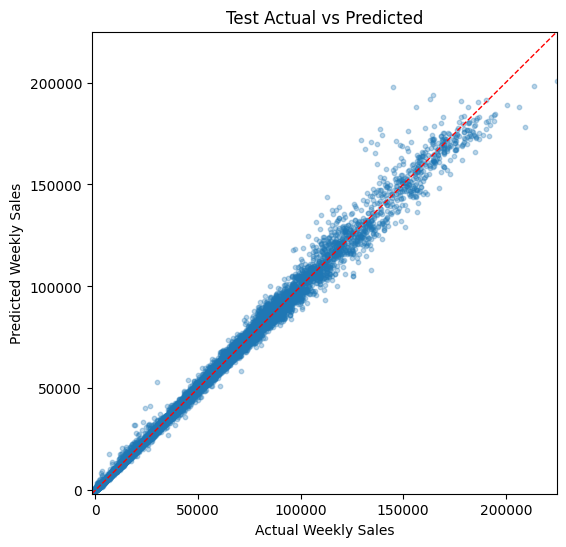

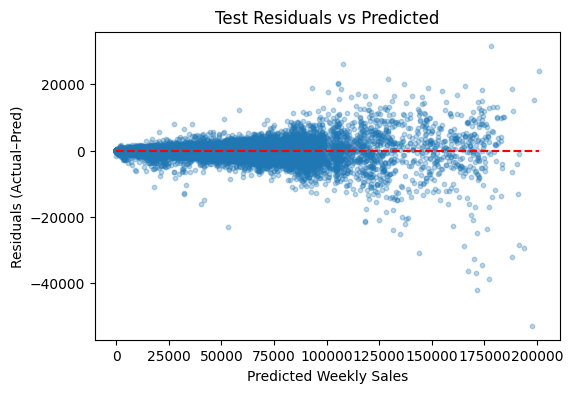

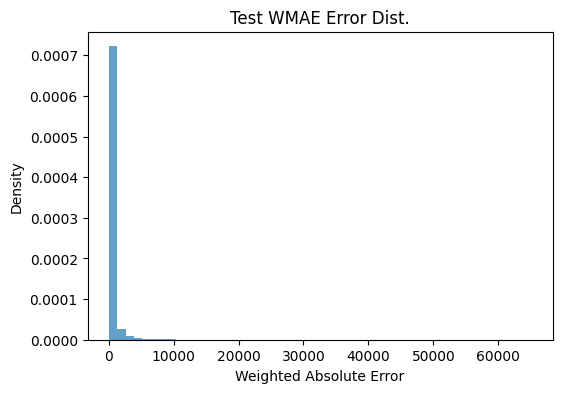

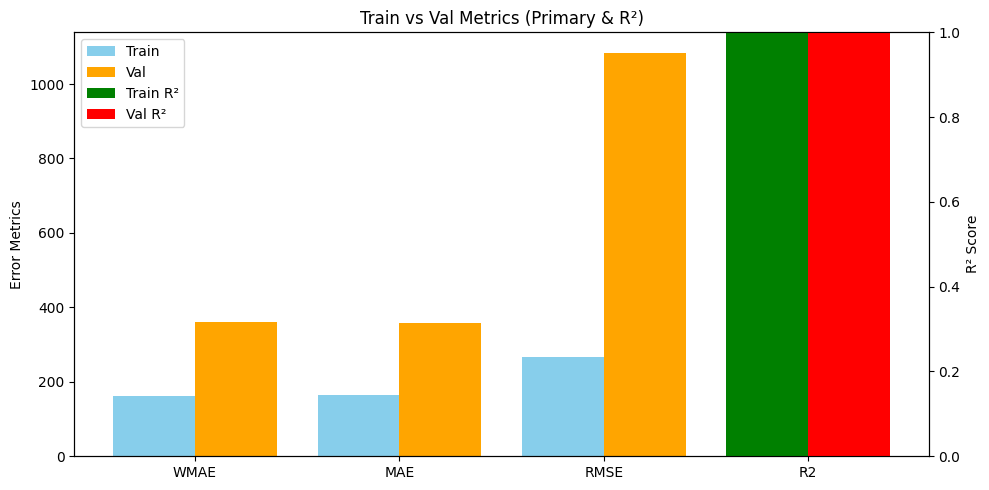

→ test WMAE = 361.0837
🏃 View run tuninggg_ne8000_md10_lr0p005__ at: https://dagshub.com/nkhar21/ML_Final_Project.mlflow/#/experiments/7/runs/e49da0d34c684bd796ba345b632963cb
🧪 View experiment at: https://dagshub.com/nkhar21/ML_Final_Project.mlflow/#/experiments/7

=== Training tuninggg_ne10000_md10_lr0p004__ ===
[TRAIN] WMAE=162.5428  MAE=165.4295  RMSE=266.2973  R2=0.9999


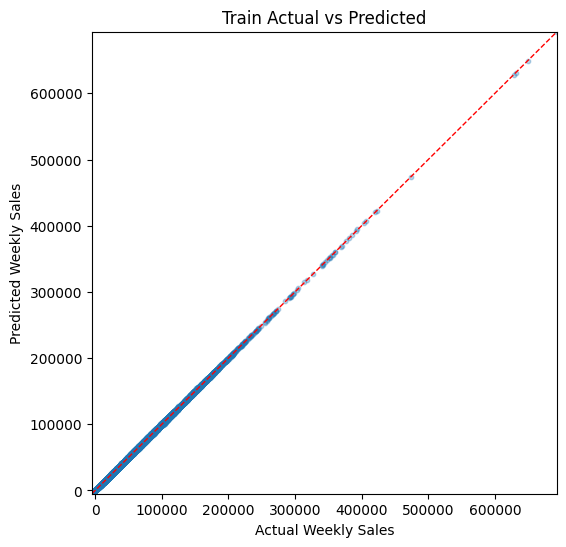

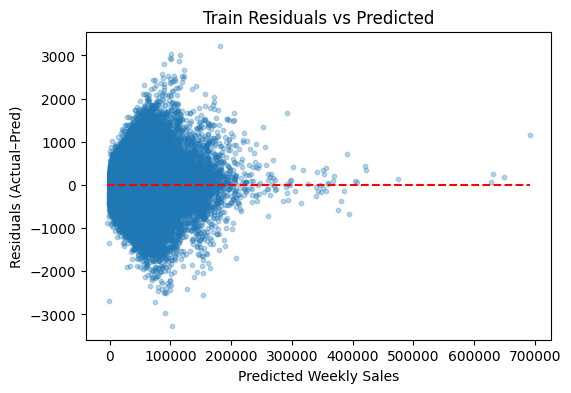

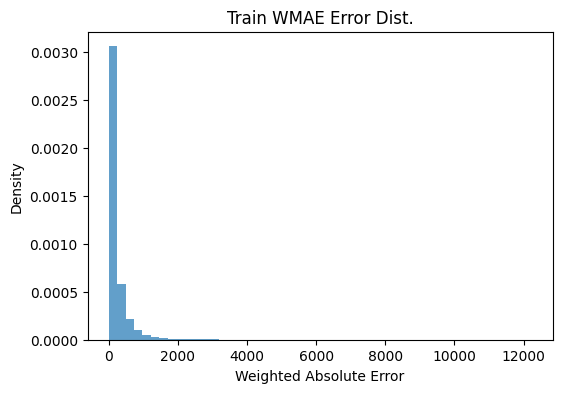

[TEST] WMAE=360.2094  MAE=357.2658  RMSE=1085.5804  R2=0.9976


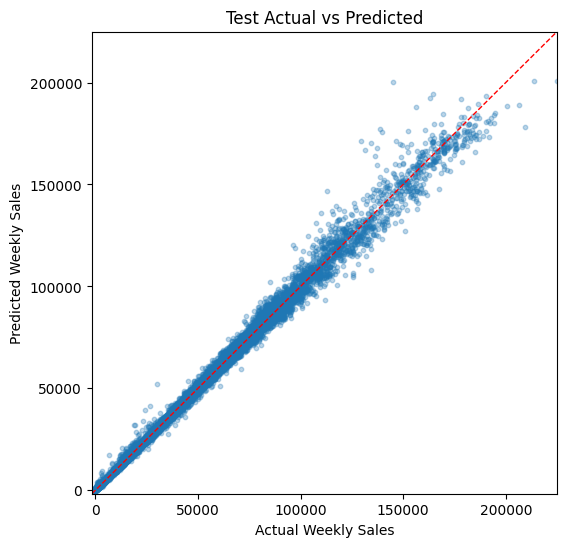

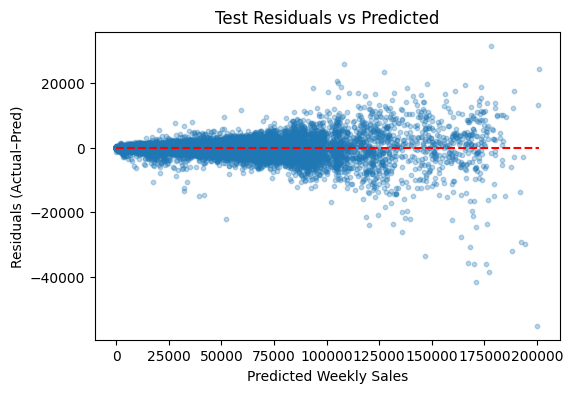

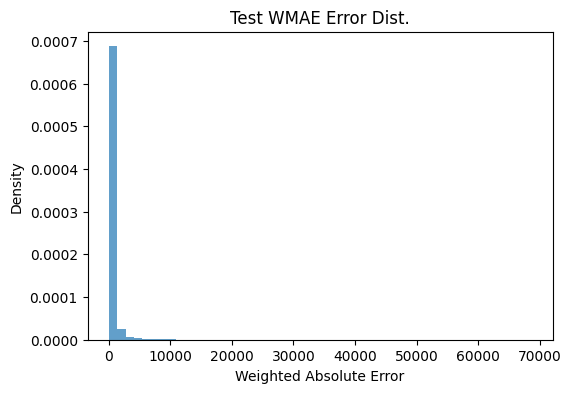

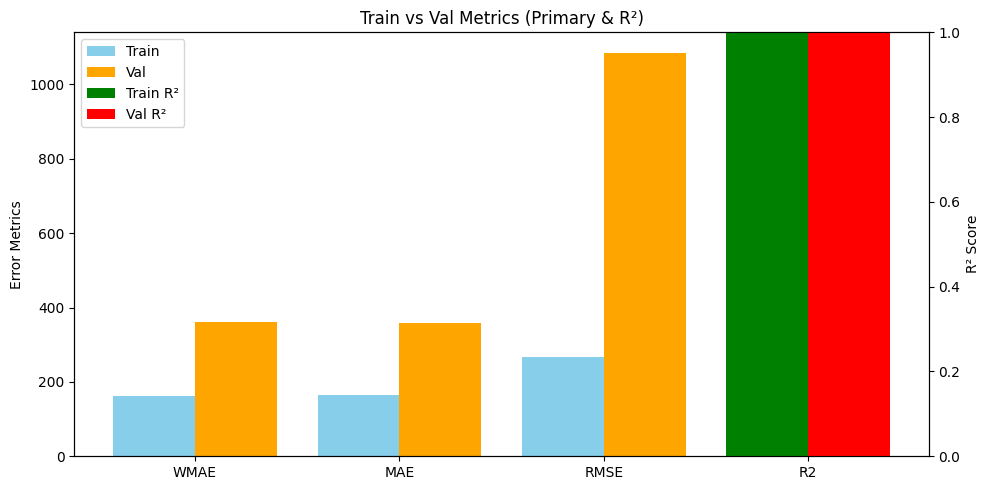

→ test WMAE = 360.2094
🏃 View run tuninggg_ne10000_md10_lr0p004__ at: https://dagshub.com/nkhar21/ML_Final_Project.mlflow/#/experiments/7/runs/a7e789e2122846359304281df5279119
🧪 View experiment at: https://dagshub.com/nkhar21/ML_Final_Project.mlflow/#/experiments/7

=== Training tuninggg_ne10000_md7_lr0p01__ ===
[TRAIN] WMAE=224.9950  MAE=226.0618  RMSE=382.8808  R2=0.9997


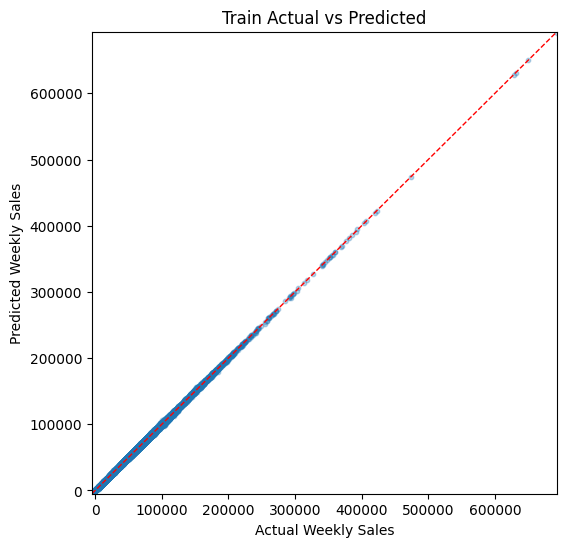

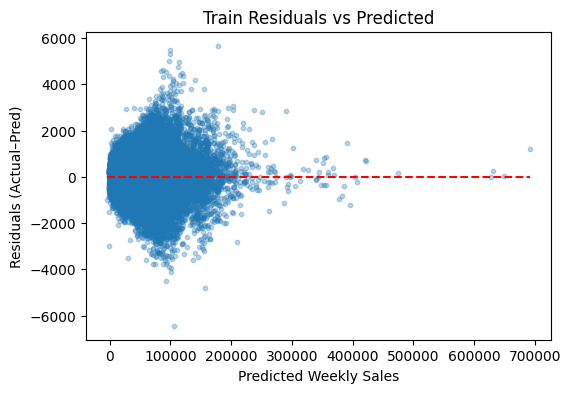

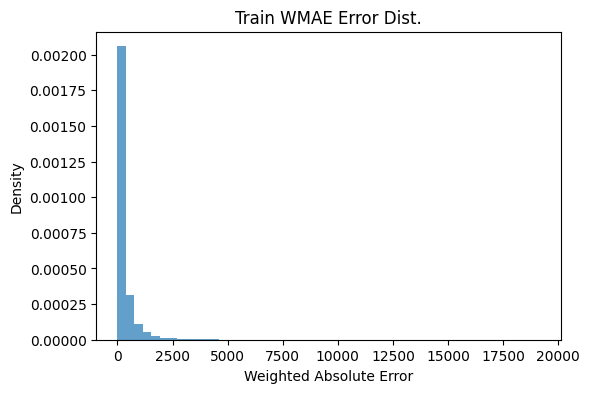

[TEST] WMAE=377.0263  MAE=370.4263  RMSE=1110.7717  R2=0.9975


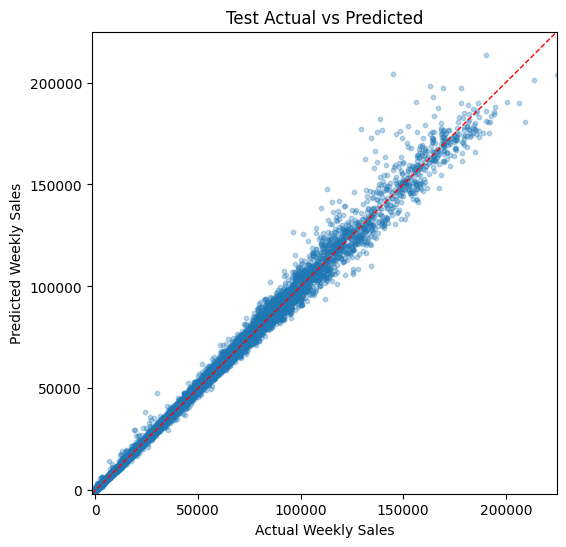

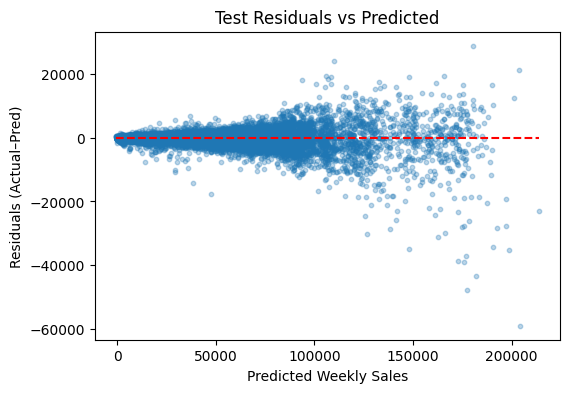

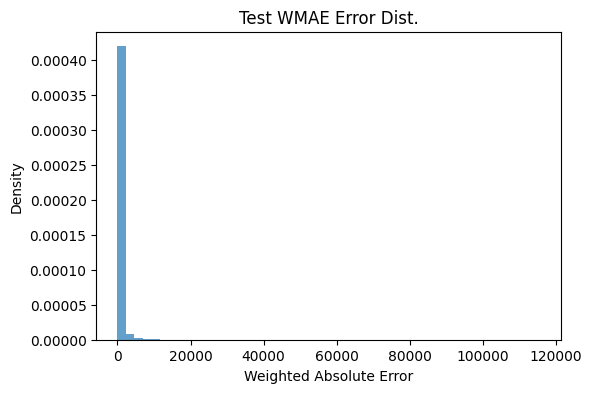

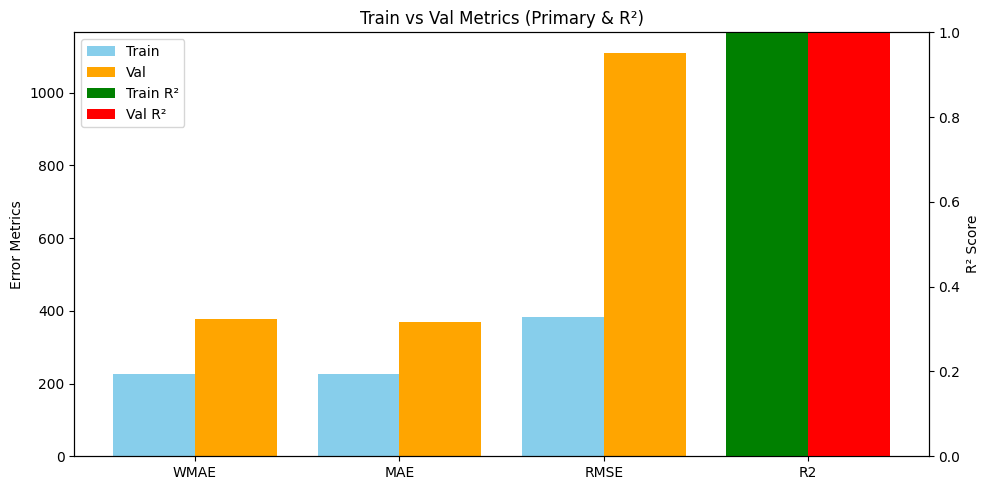

→ test WMAE = 377.0263
🏃 View run tuninggg_ne10000_md7_lr0p01__ at: https://dagshub.com/nkhar21/ML_Final_Project.mlflow/#/experiments/7/runs/a3360185746f42e0a3db212d5856266e
🧪 View experiment at: https://dagshub.com/nkhar21/ML_Final_Project.mlflow/#/experiments/7

=== Training tuninggg_ne6000_md8_lr0p01__ ===
[TRAIN] WMAE=223.5936  MAE=224.9434  RMSE=382.0892  R2=0.9997


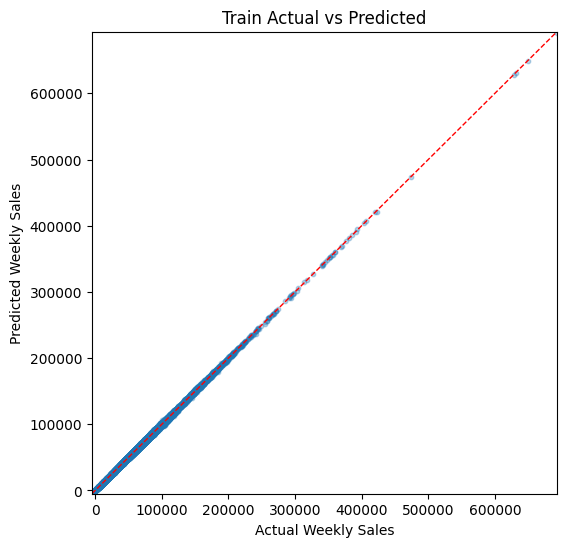

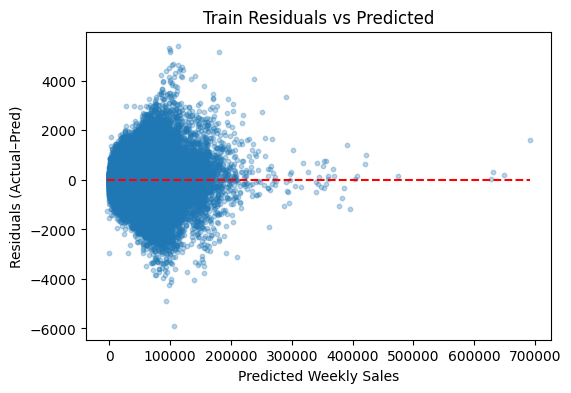

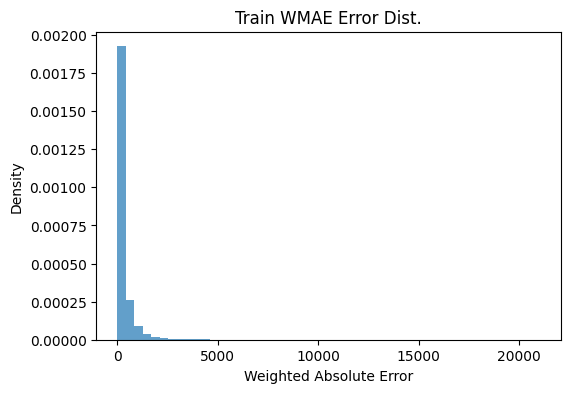

[TEST] WMAE=379.4652  MAE=373.2737  RMSE=1109.7085  R2=0.9975


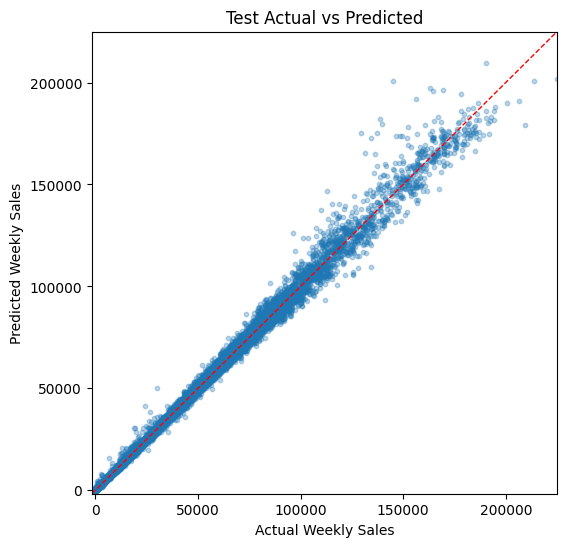

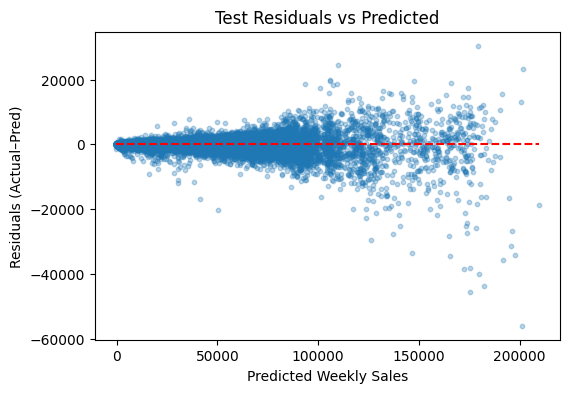

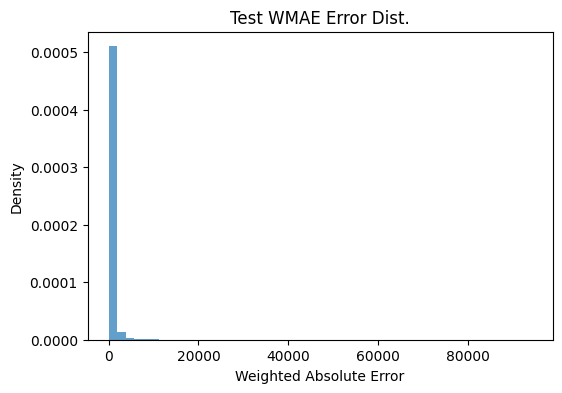

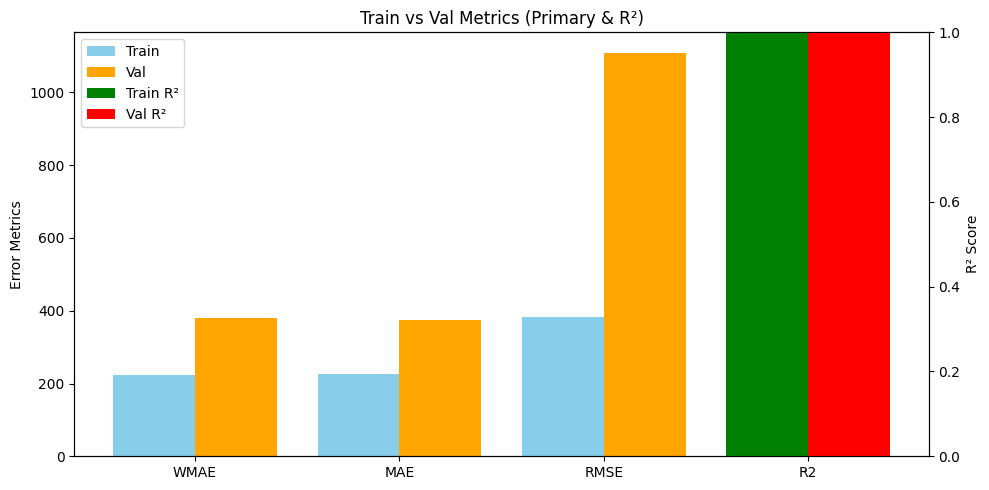

→ test WMAE = 379.4652
🏃 View run tuninggg_ne6000_md8_lr0p01__ at: https://dagshub.com/nkhar21/ML_Final_Project.mlflow/#/experiments/7/runs/65027b196257486dbd8e312fa0796438
🧪 View experiment at: https://dagshub.com/nkhar21/ML_Final_Project.mlflow/#/experiments/7

=== Training tuninggg_ne5500_md9_lr0p01__ ===
[TRAIN] WMAE=175.8502  MAE=179.2033  RMSE=292.1907  R2=0.9998


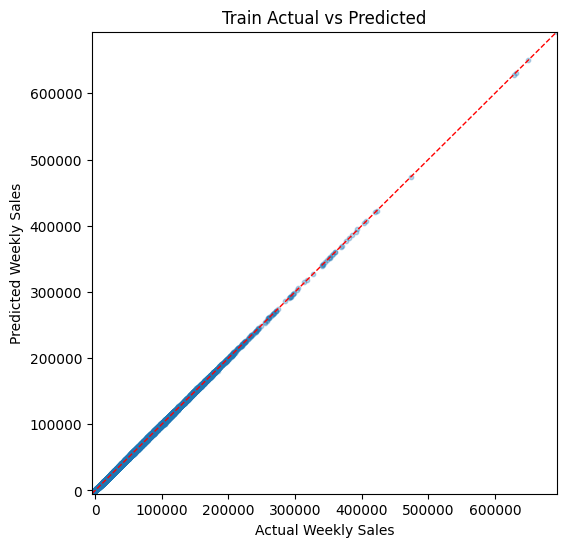

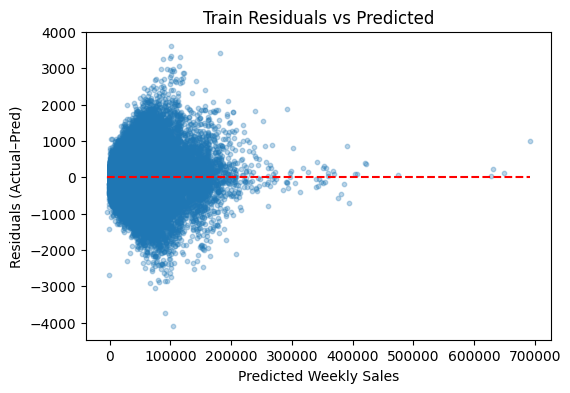

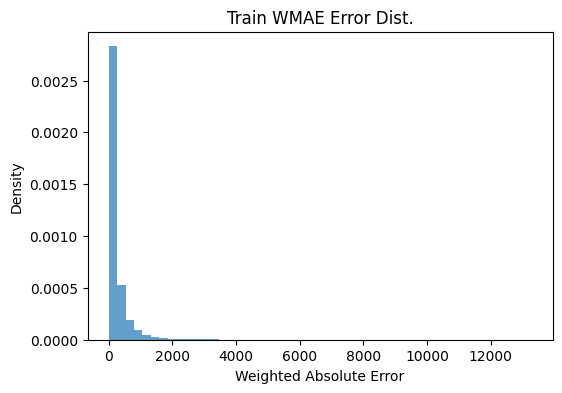

[TEST] WMAE=365.4374  MAE=359.1667  RMSE=1090.1730  R2=0.9976


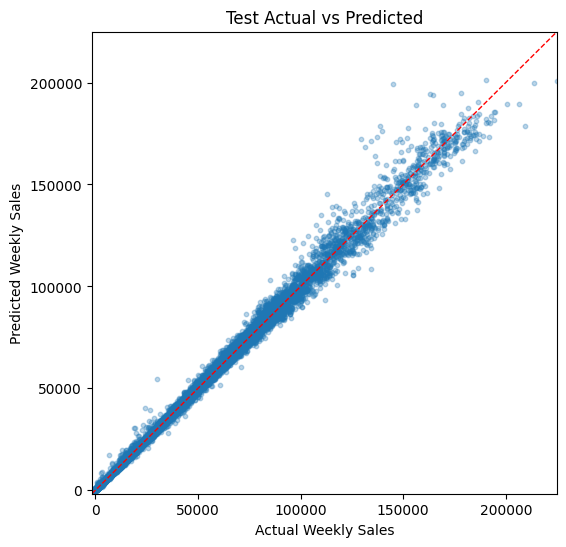

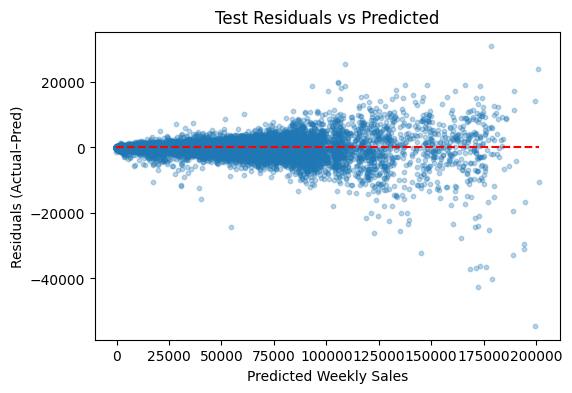

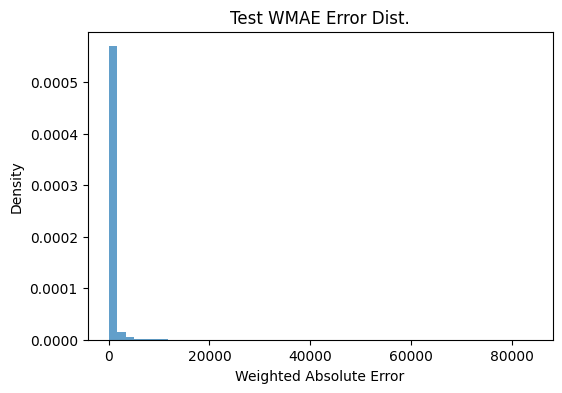

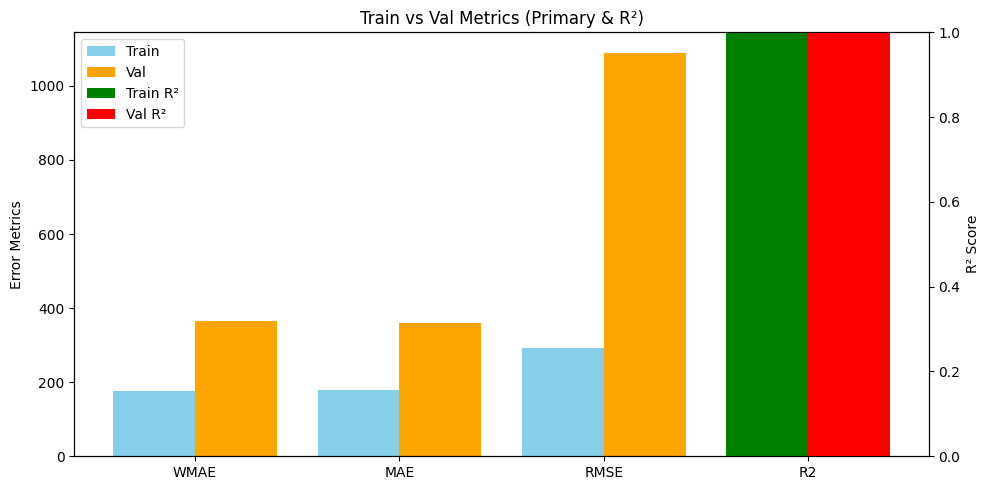

→ test WMAE = 365.4374
🏃 View run tuninggg_ne5500_md9_lr0p01__ at: https://dagshub.com/nkhar21/ML_Final_Project.mlflow/#/experiments/7/runs/029d420d696448449a37ac7c1709baf4
🧪 View experiment at: https://dagshub.com/nkhar21/ML_Final_Project.mlflow/#/experiments/7


In [ ]:
ne_md_lr = [(8000, 8, 0.01), (8000, 10, 0.005), (10000, 10, 0.004),
            (10000, 7, 0.01), (6000, 8, 0.01), (5500, 9, 0.01),]

mlflow.end_run()
mlflow.set_experiment("Training_XGB")

best_wmae = float("inf")
best_params = None
best_model  = None

import mlflow
import mlflow.xgboost
import pickle
import numpy as np
import xgboost as xgb
from datetime import datetime


for ne, md, lr in ne_md_lr:
    run_name = f"tuninggg_ne{ne}_md{md}_lr{lr}__".replace('.', 'p')
    print(f"\n=== Training {run_name} ===")

    with mlflow.start_run(run_name=run_name):
        # instantiate
        model = xgb.XGBRegressor(
            n_estimators   = ne,
            max_depth      = md,
            learning_rate  = lr,
            subsample      = 0.8,
            colsample_bytree=0.8,
            gamma          = 0,
            reg_alpha      = 0,
            reg_lambda     = 1,
            objective      = "reg:squarederror",
            random_state   = 42,
            n_jobs         = -1,
            device         = "cuda"   # <- GPU acceleration
        )
        log_xgb_params(model)

        model.fit(X_train, y_train)

        train_metrics = evaluate_and_plot(model, X_train, y_train, w_train, split="train")
        test_metrics  = evaluate_and_plot(model, X_test,  y_test,  w_test,  split="test")

        plot_overfitting(train_metrics, test_metrics)

        test_wmae = test_metrics["WMAE"]
        if test_wmae < best_wmae:
            best_wmae  = test_wmae
            best_params = {"n_estimators": ne, "max_depth": md, "learning_rate": lr}
            best_model  = model

        print(f"→ test WMAE = {test_wmae:.4f}")



✅ Best model: {'n_estimators': 10000, 'max_depth': 10, 'learning_rate': 0.004} with WMAE = 360.2093855166538
[TEST] WMAE=360.2094  MAE=357.2658  RMSE=1085.5804  R2=0.9976


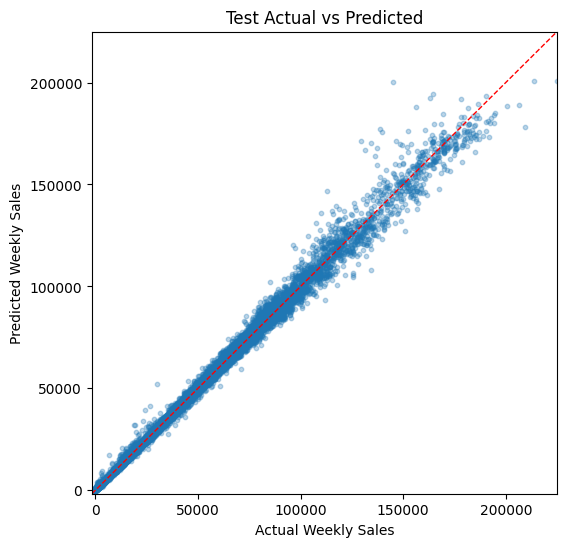

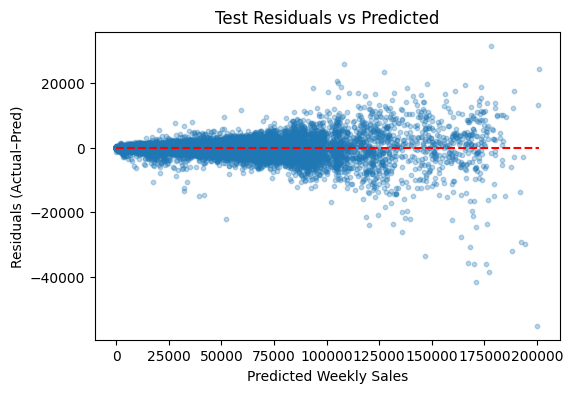

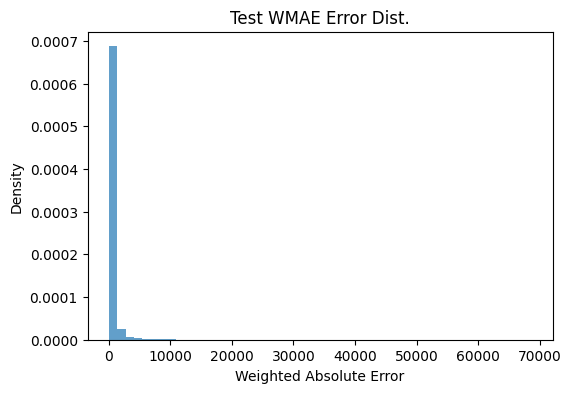

In [ ]:
if best_model is not None:
    print("\n✅ Best model:", best_params, "with WMAE =", best_wmae)
    best_test_metrics = evaluate_and_plot(best_model, X_test, y_test, w_test, split="test")

# training 7 - tuning cs, ss 1


=== Training tuning_ss0.7_cs0.7 ===
[TRAIN] WMAE=87.3112  MAE=90.3682  RMSE=129.8193  R2=1.0000


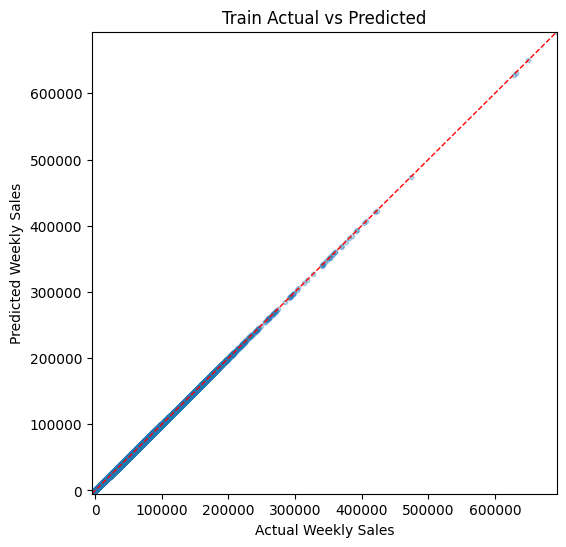

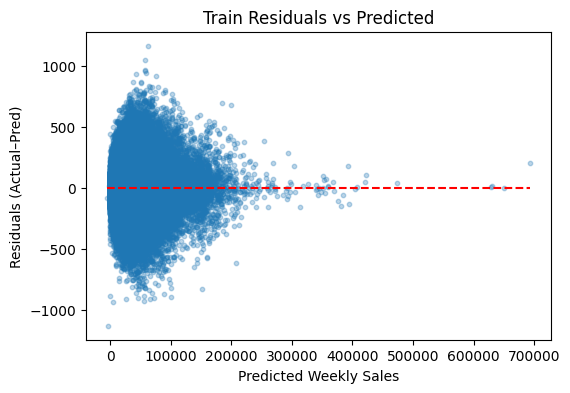

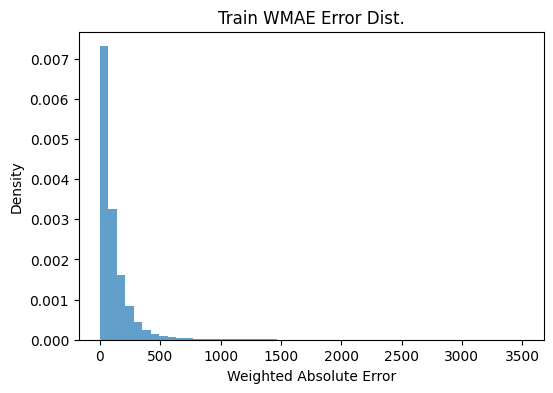

[TEST] WMAE=357.3008  MAE=352.1252  RMSE=1116.5000  R2=0.9974


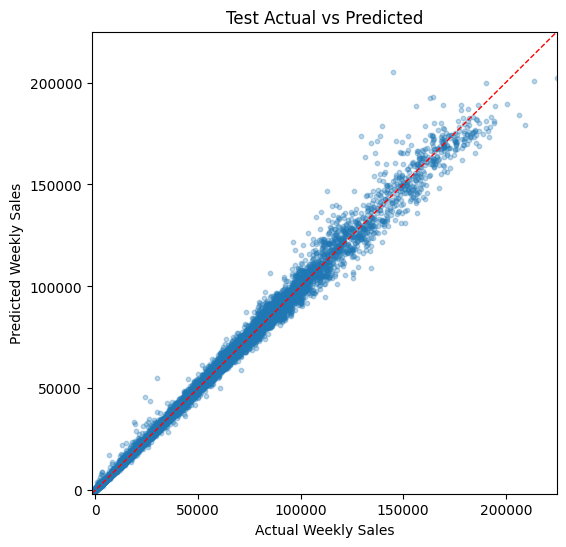

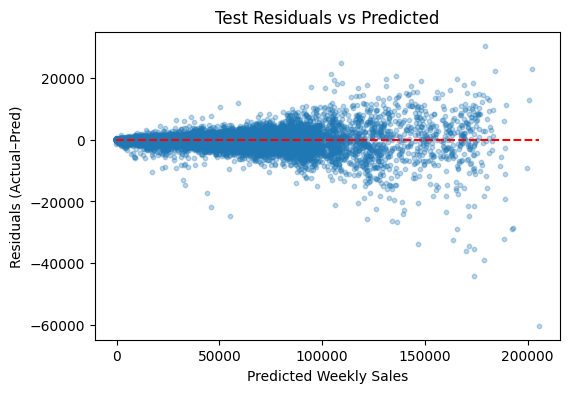

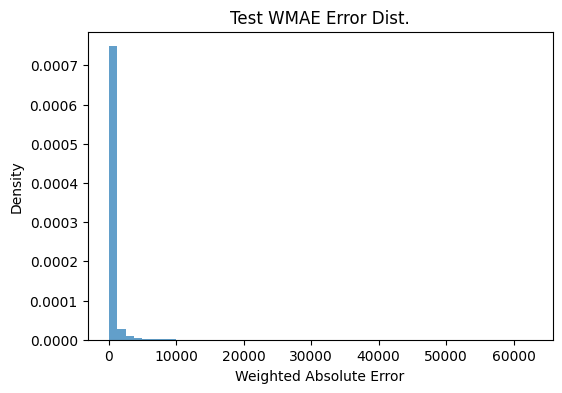

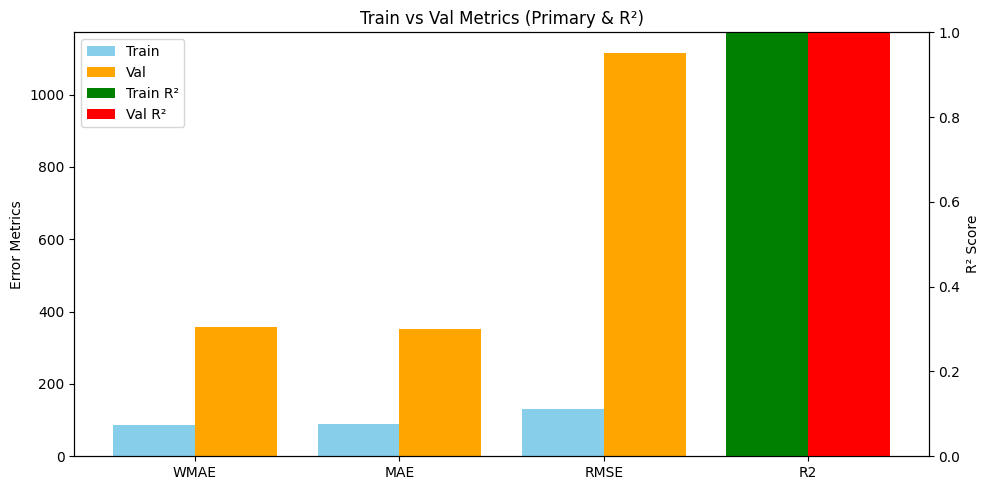

→ test WMAE = 357.3008
🏃 View run tuning_ss0.7_cs0.7 at: https://dagshub.com/nkhar21/ML_Final_Project.mlflow/#/experiments/7/runs/4260fed140204e1fa95b75910a3d6718
🧪 View experiment at: https://dagshub.com/nkhar21/ML_Final_Project.mlflow/#/experiments/7

=== Training tuning_ss0.6_cs0.6 ===
[TRAIN] WMAE=95.0510  MAE=97.7896  RMSE=140.9018  R2=1.0000


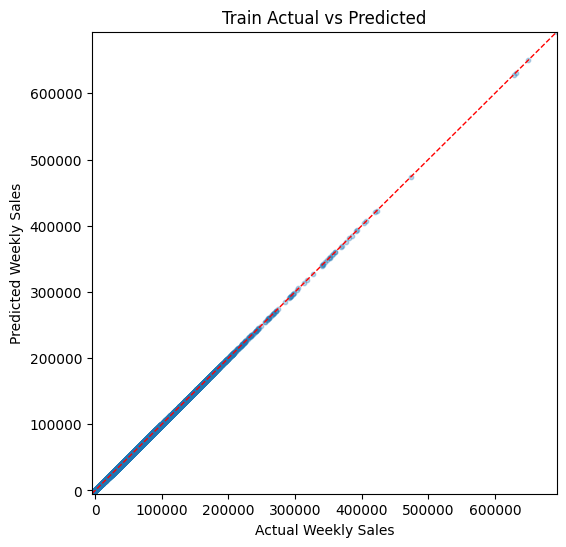

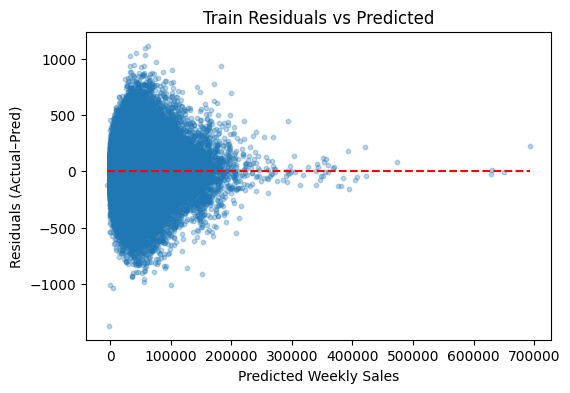

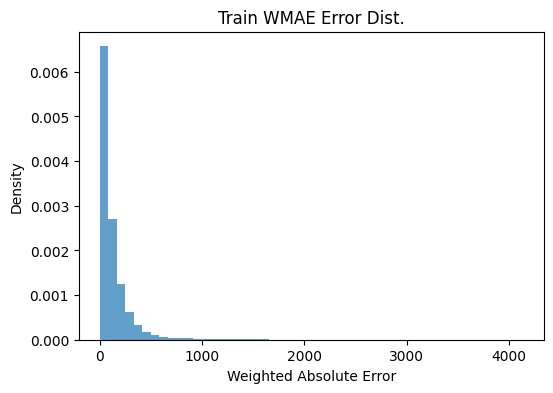

[TEST] WMAE=365.2088  MAE=360.0009  RMSE=1152.9698  R2=0.9973


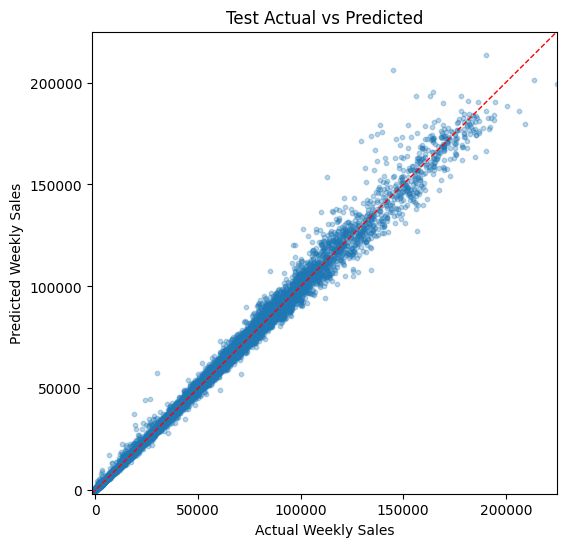

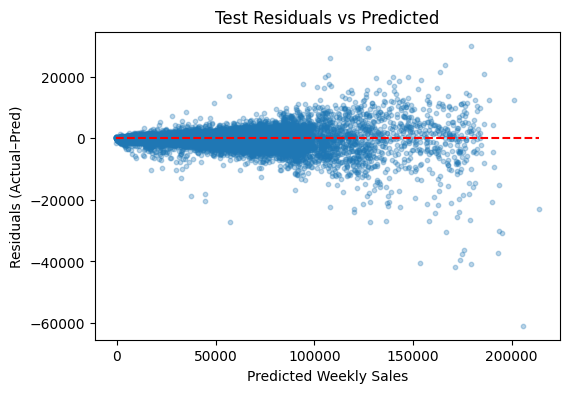

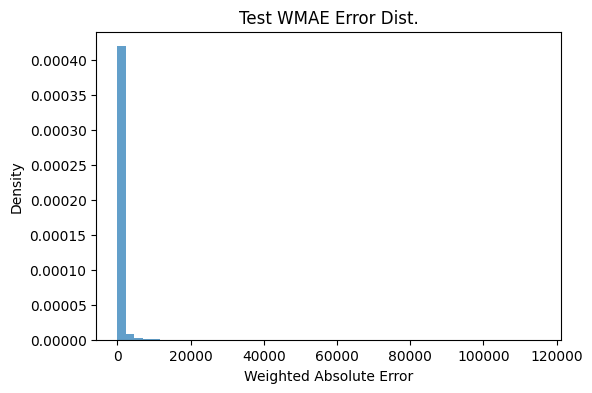

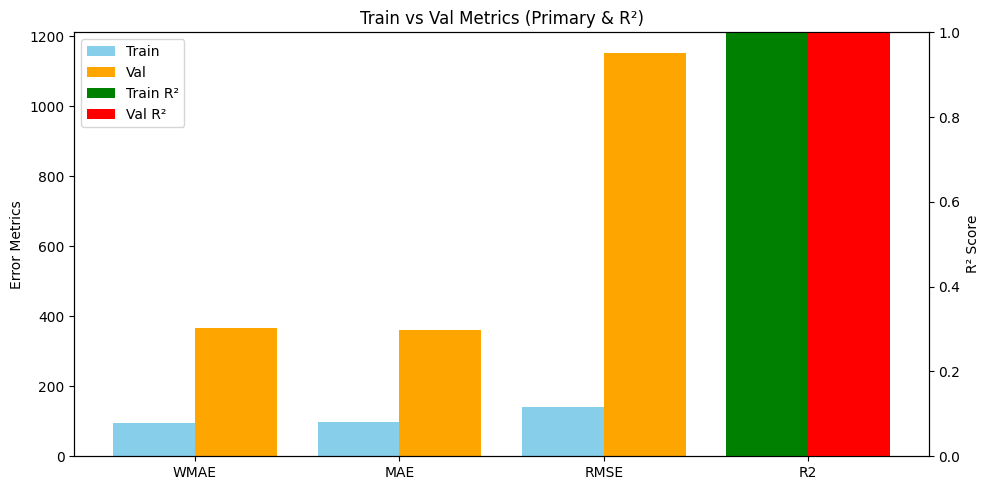

→ test WMAE = 365.2088
🏃 View run tuning_ss0.6_cs0.6 at: https://dagshub.com/nkhar21/ML_Final_Project.mlflow/#/experiments/7/runs/daef9a69b8d142c989a5a95e90931560
🧪 View experiment at: https://dagshub.com/nkhar21/ML_Final_Project.mlflow/#/experiments/7

=== Training tuning_ss0.6_cs0.7 ===
[TRAIN] WMAE=92.4670  MAE=95.0065  RMSE=136.1243  R2=1.0000


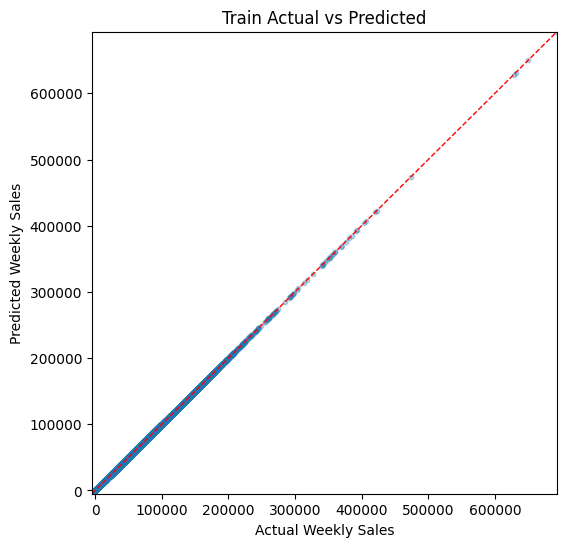

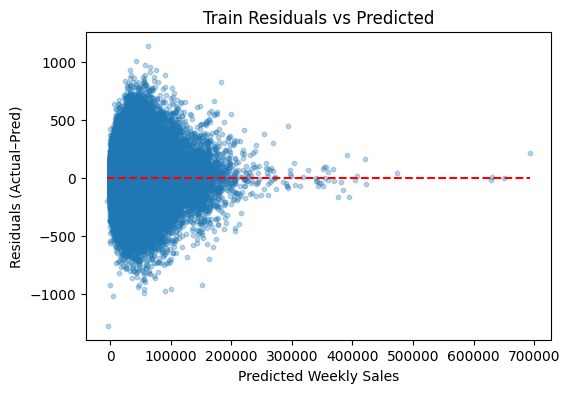

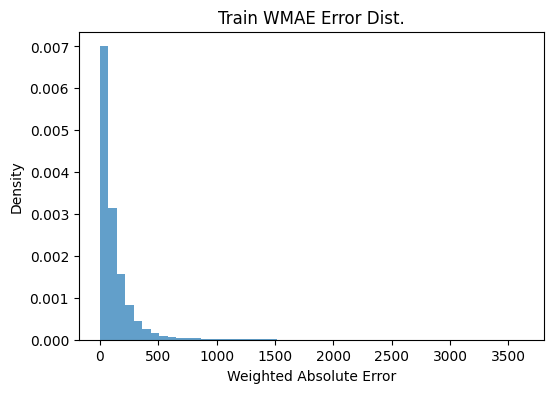

[TEST] WMAE=356.3296  MAE=351.7883  RMSE=1113.6099  R2=0.9975


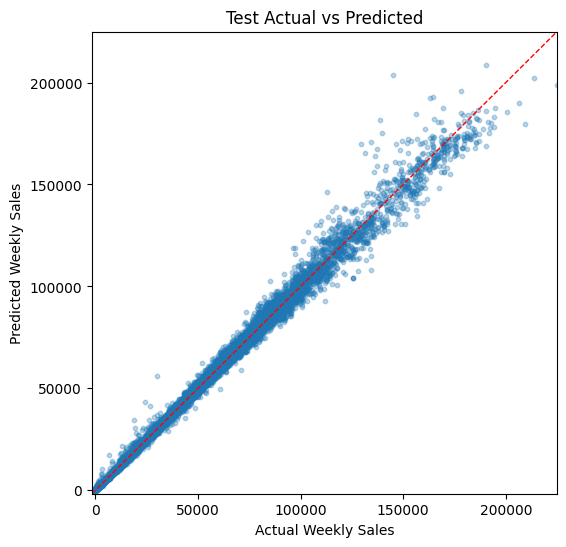

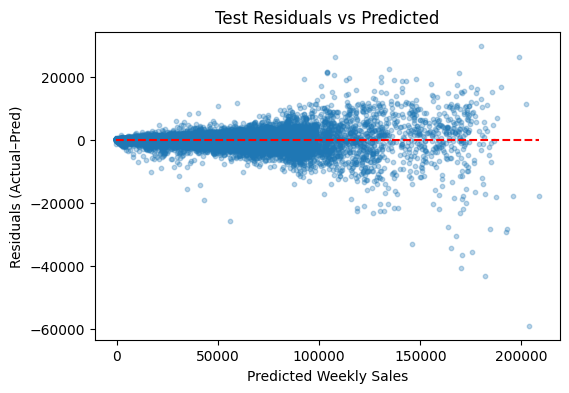

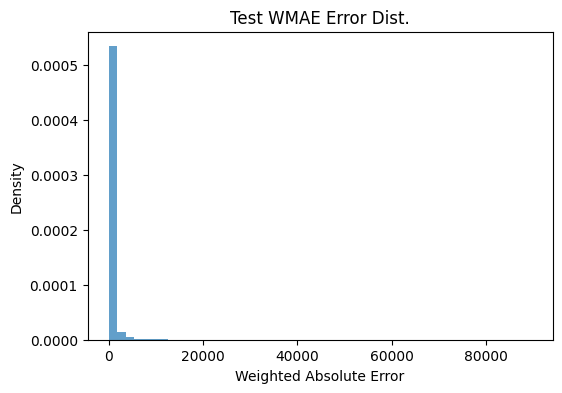

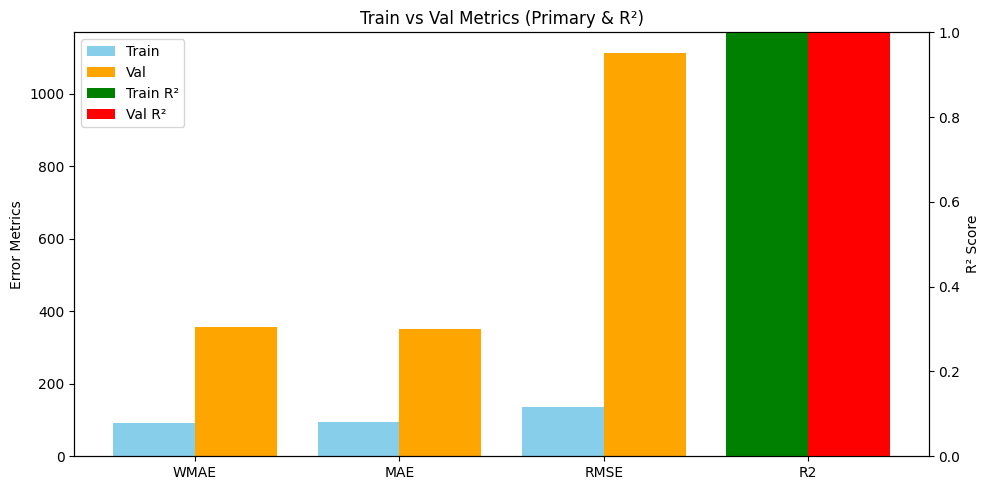

→ test WMAE = 356.3296
🏃 View run tuning_ss0.6_cs0.7 at: https://dagshub.com/nkhar21/ML_Final_Project.mlflow/#/experiments/7/runs/22ef7d77e0ce441f94ff3714bc3e0c5f
🧪 View experiment at: https://dagshub.com/nkhar21/ML_Final_Project.mlflow/#/experiments/7

=== Training tuning_ss0.7_cs0.6 ===
[TRAIN] WMAE=89.4618  MAE=92.5250  RMSE=133.6157  R2=1.0000


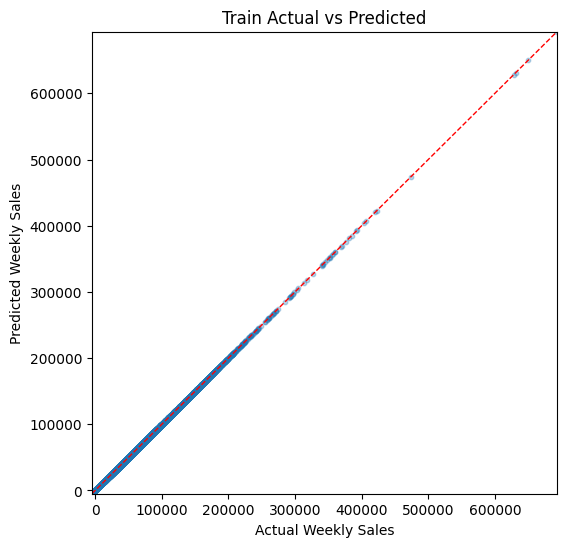

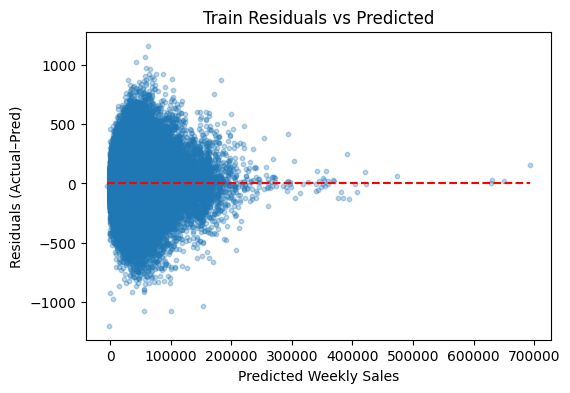

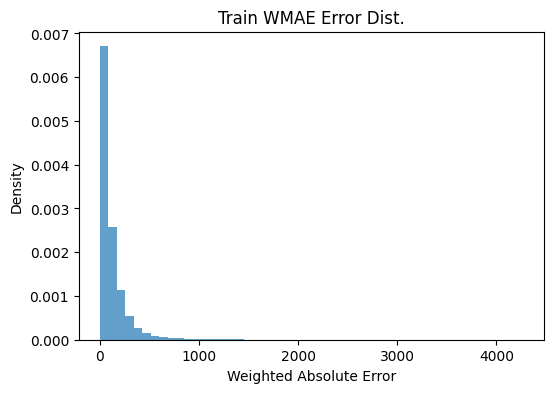

[TEST] WMAE=361.8973  MAE=356.7647  RMSE=1125.2284  R2=0.9974


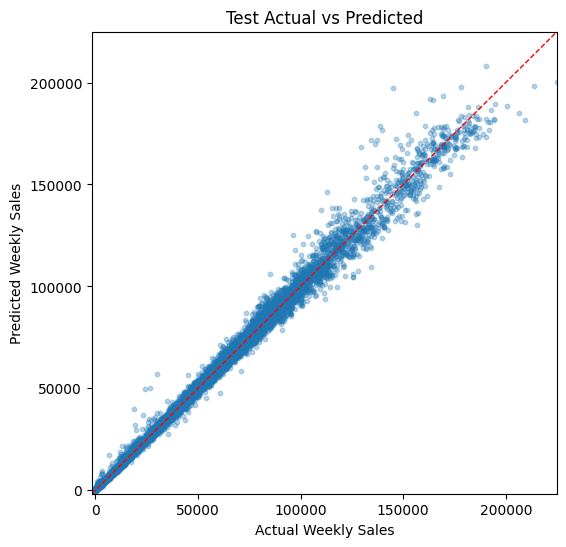

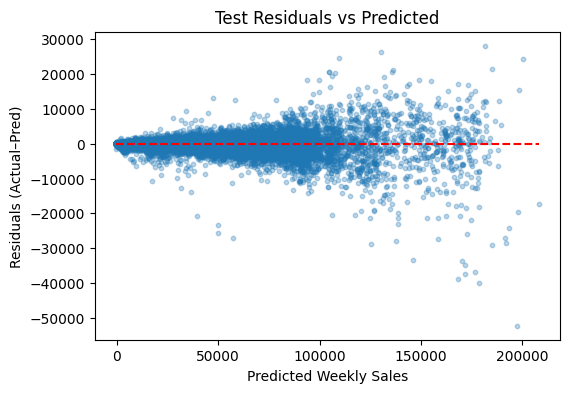

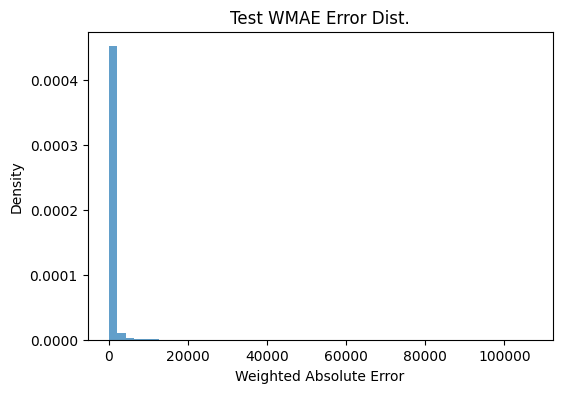

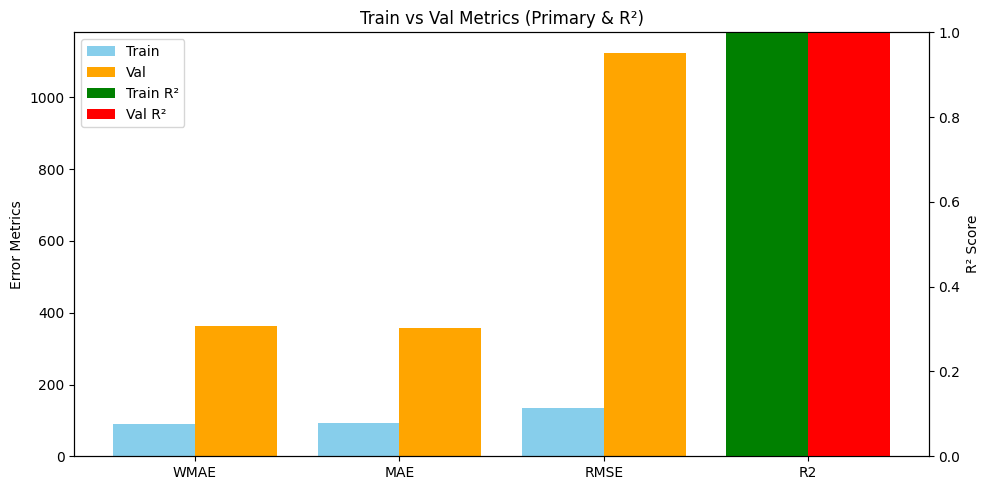

→ test WMAE = 361.8973
🏃 View run tuning_ss0.7_cs0.6 at: https://dagshub.com/nkhar21/ML_Final_Project.mlflow/#/experiments/7/runs/0114cf4ef16241f19284a8e2ac90aadf
🧪 View experiment at: https://dagshub.com/nkhar21/ML_Final_Project.mlflow/#/experiments/7

✅ Best model: {'n_estimators': 5000, 'max_depth': 9, 'learning_rate': 0.03} with WMAE = 356.32962968798876
[TEST] WMAE=356.3296  MAE=351.7883  RMSE=1113.6099  R2=0.9975


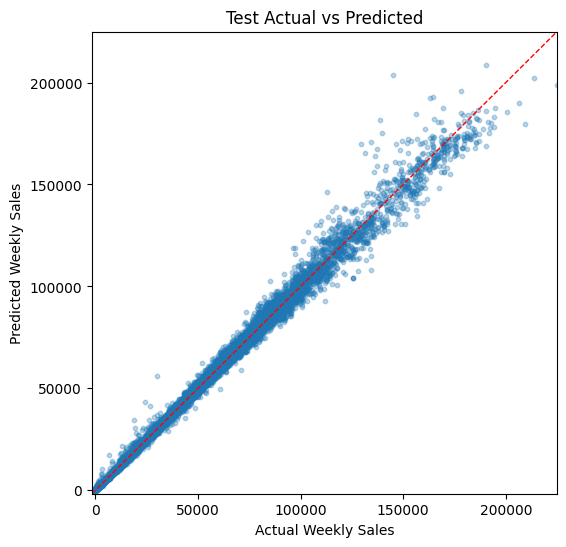

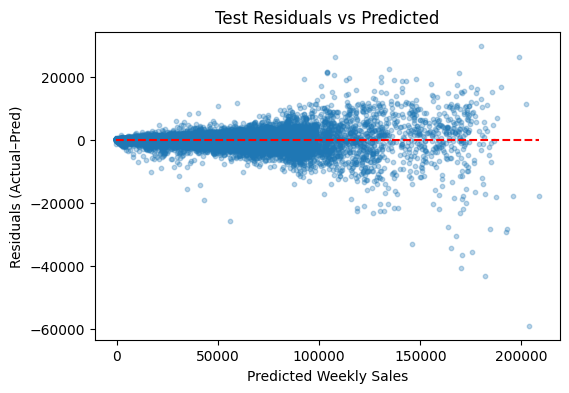

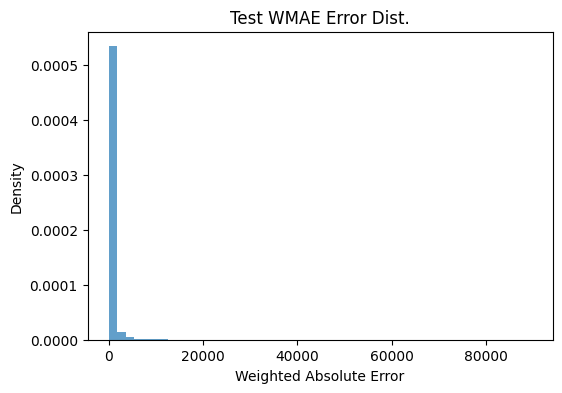

In [ ]:
ne = 5000
md = 9
lr = 0.03

ss_cs = [(0.7, 0.7), (.6,.6), (.6,.7), (.7, .6)]

mlflow.end_run()
mlflow.set_experiment("Training_XGB")

best_wmae = float("inf")
best_params = None
best_model  = None

import mlflow
import mlflow.xgboost
import pickle
import numpy as np
import xgboost as xgb
from datetime import datetime


for ss, cs in ss_cs:
    run_name = f"tuning_ss{ss}_cs{cs}"
    print(f"\n=== Training {run_name} ===")

    with mlflow.start_run(run_name=run_name):
        # instantiate
        model = xgb.XGBRegressor(
            n_estimators   = ne,
            max_depth      = md,
            learning_rate  = lr,
            subsample      = ss,
            colsample_bytree=cs,
            gamma          = 0,
            reg_alpha      = 0,
            reg_lambda     = 1,
            objective      = "reg:squarederror",
            random_state   = 42,
            n_jobs         = -1,
            device         = "cuda"   # <- GPU acceleration
        )
        log_xgb_params(model)

        model.fit(X_train, y_train)

        train_metrics = evaluate_and_plot(model, X_train, y_train, w_train, split="train")
        test_metrics  = evaluate_and_plot(model, X_test,  y_test,  w_test,  split="test")

        plot_overfitting(train_metrics, test_metrics)

        test_wmae = test_metrics["WMAE"]
        if test_wmae < best_wmae:
            best_wmae  = test_wmae
            best_params = {"n_estimators": ne, "max_depth": md, "learning_rate": lr}
            best_model  = model

        print(f"→ test WMAE = {test_wmae:.4f}")

if best_model is not None:
    print("\n✅ Best model:", best_params, "with WMAE =", best_wmae)
    best_test_metrics = evaluate_and_plot(best_model, X_test, y_test, w_test, split="test")


# training 7 - tuning cs, ss 2


=== Training tuning_ss0.8_cs0.9 ===
[TRAIN] WMAE=82.3280  MAE=85.5935  RMSE=122.7102  R2=1.0000


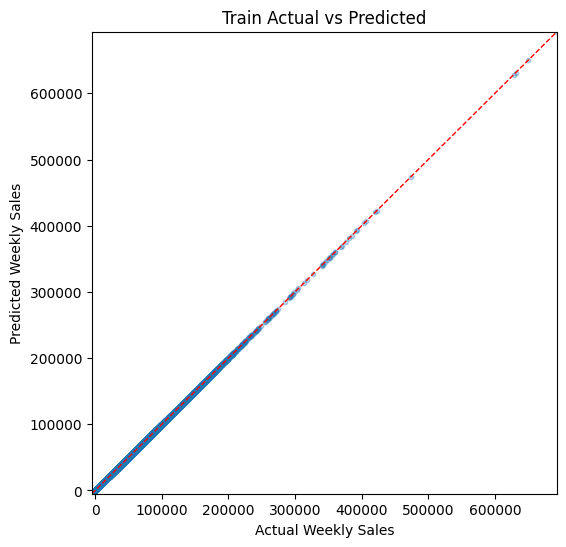

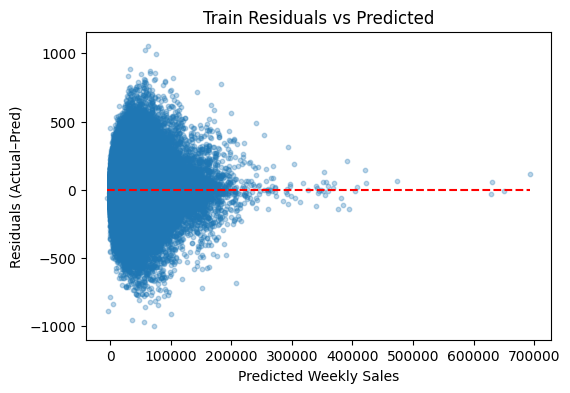

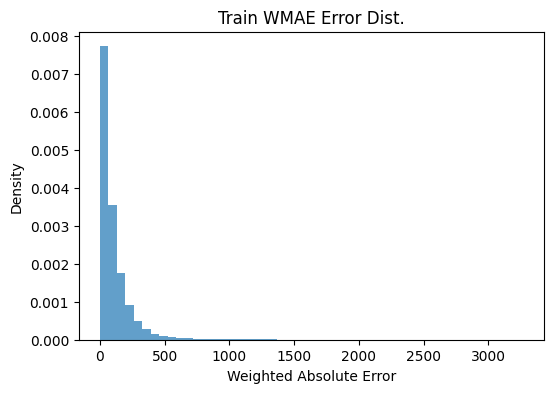

[TEST] WMAE=347.8975  MAE=343.6892  RMSE=1079.2475  R2=0.9976


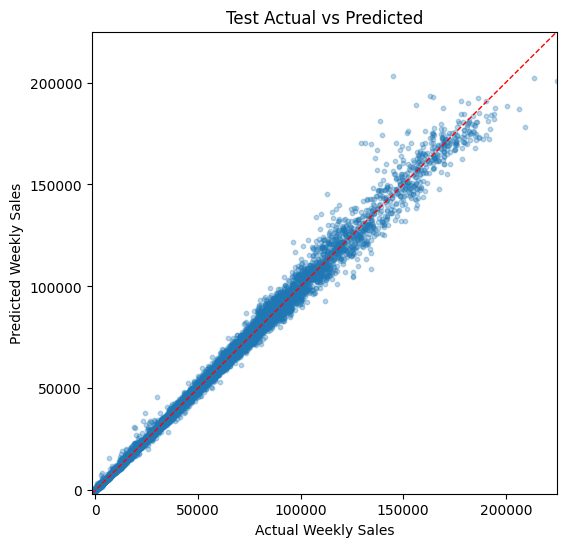

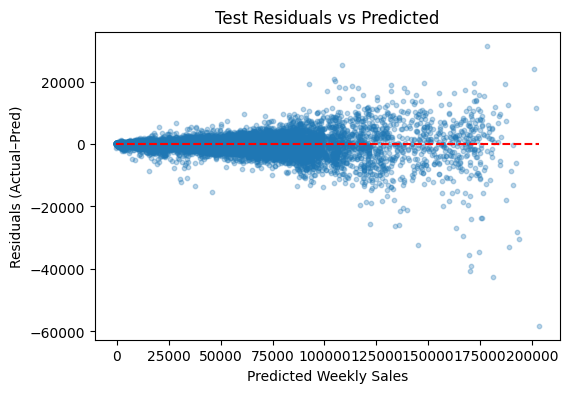

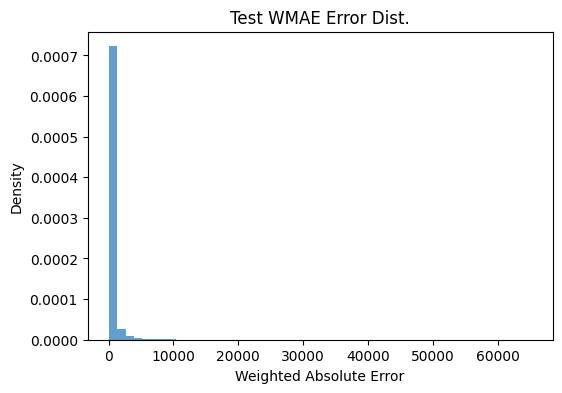

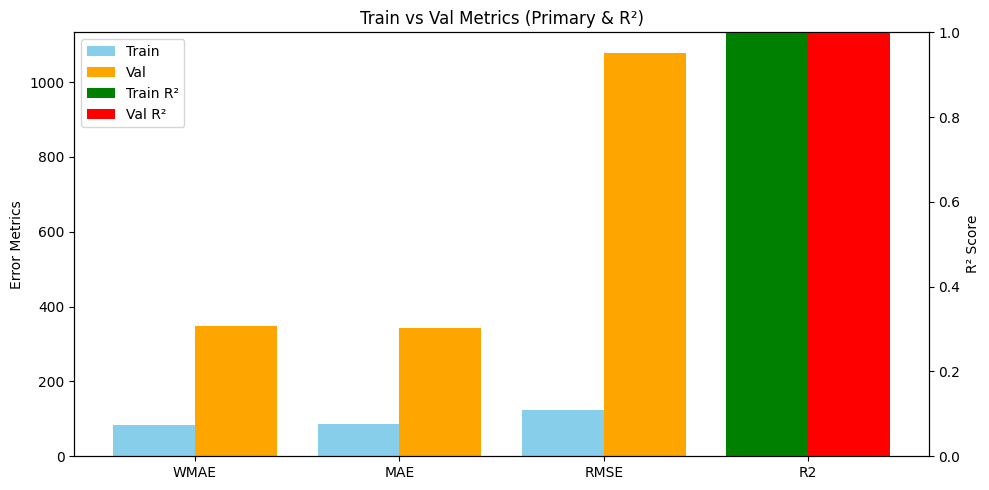

→ test WMAE = 347.8975
🏃 View run tuning_ss0.8_cs0.9 at: https://dagshub.com/nkhar21/ML_Final_Project.mlflow/#/experiments/7/runs/6904d96d745445f2a3564f96b02212c6
🧪 View experiment at: https://dagshub.com/nkhar21/ML_Final_Project.mlflow/#/experiments/7

=== Training tuning_ss0.9_cs0.8 ===
[TRAIN] WMAE=80.4386  MAE=84.6917  RMSE=124.0077  R2=1.0000


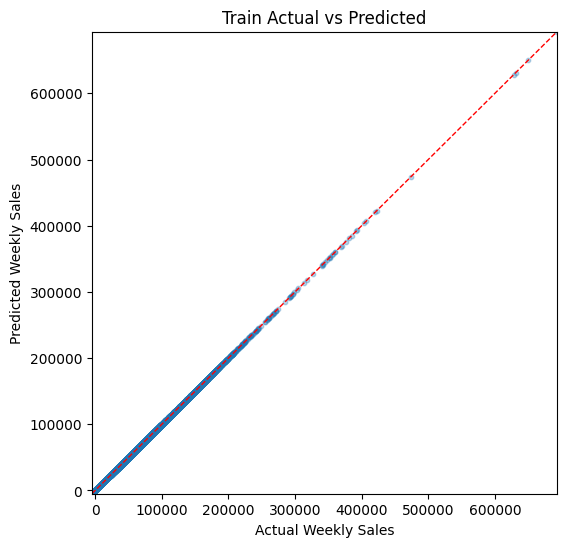

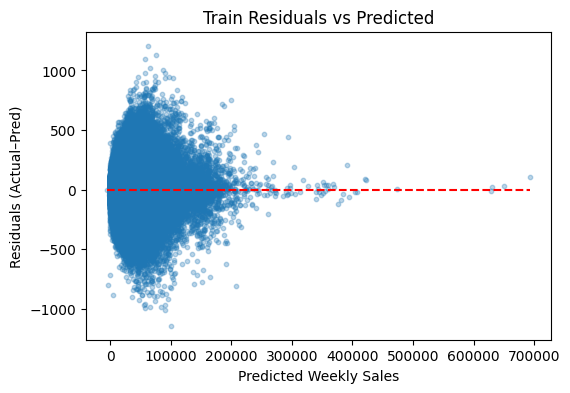

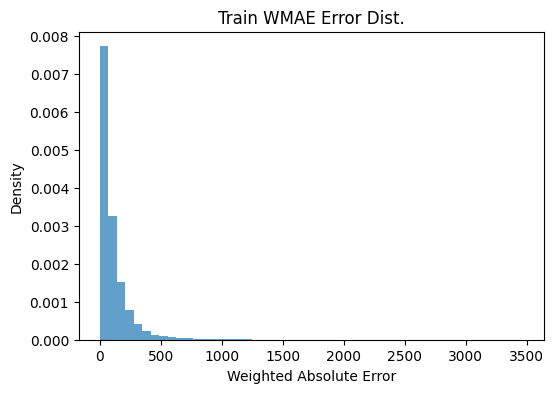

[TEST] WMAE=354.1875  MAE=349.1748  RMSE=1115.6756  R2=0.9974


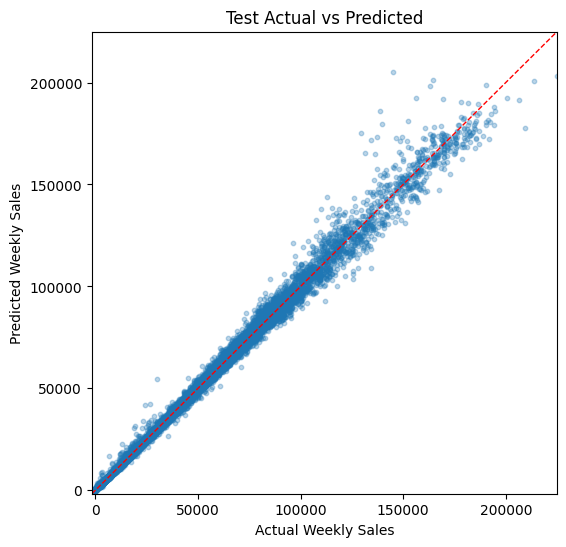

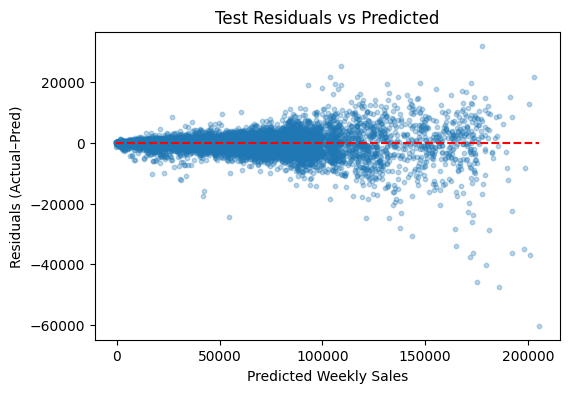

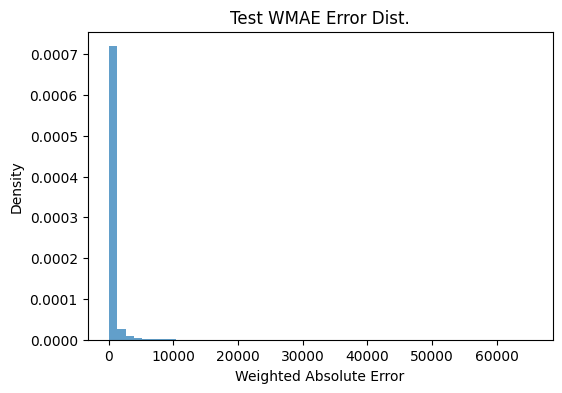

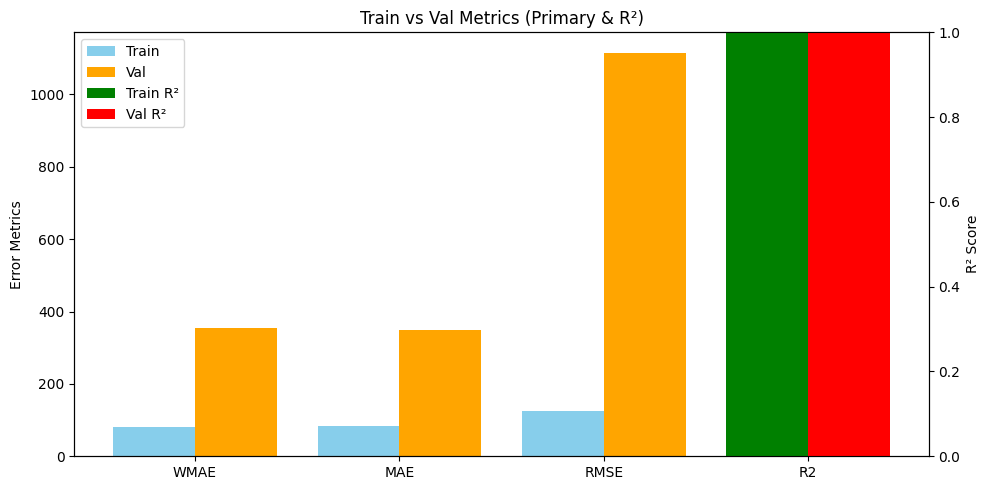

→ test WMAE = 354.1875
🏃 View run tuning_ss0.9_cs0.8 at: https://dagshub.com/nkhar21/ML_Final_Project.mlflow/#/experiments/7/runs/65aeb9322dc24c80ae3c67fb02eb0180
🧪 View experiment at: https://dagshub.com/nkhar21/ML_Final_Project.mlflow/#/experiments/7

=== Training tuning_ss1_cs1 ===
[TRAIN] WMAE=85.1739  MAE=90.9628  RMSE=142.2008  R2=1.0000


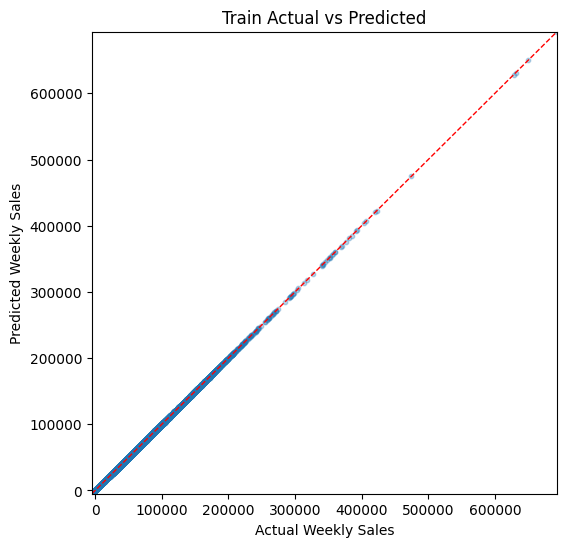

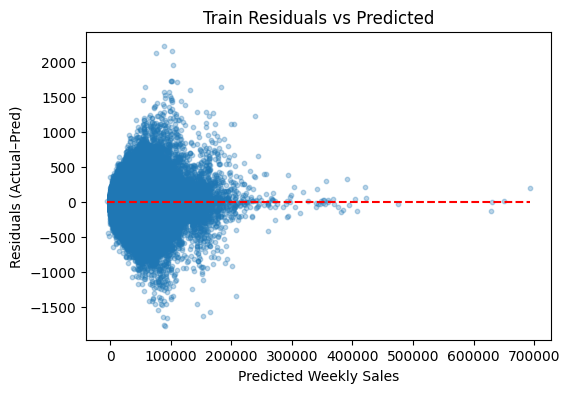

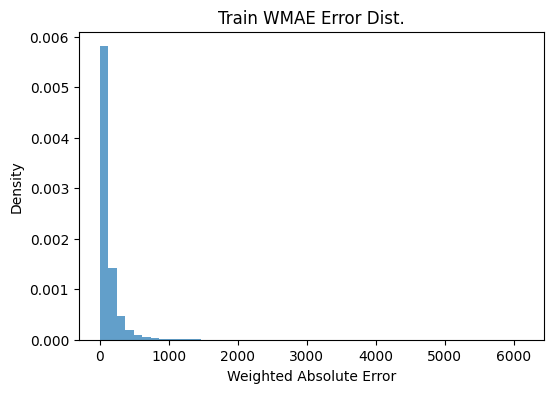

[TEST] WMAE=354.9590  MAE=352.7920  RMSE=1132.6219  R2=0.9974


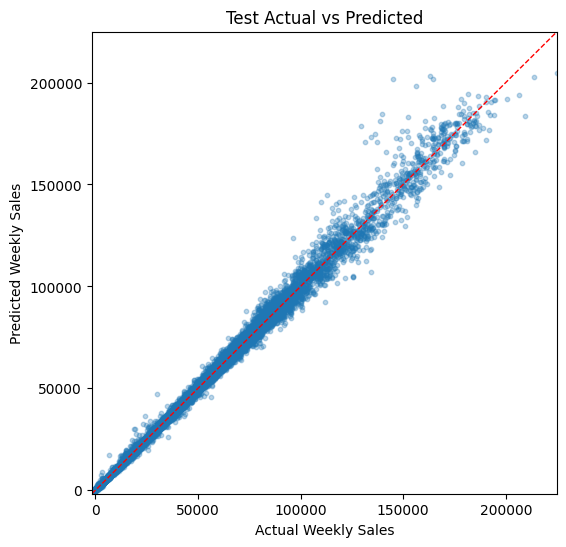

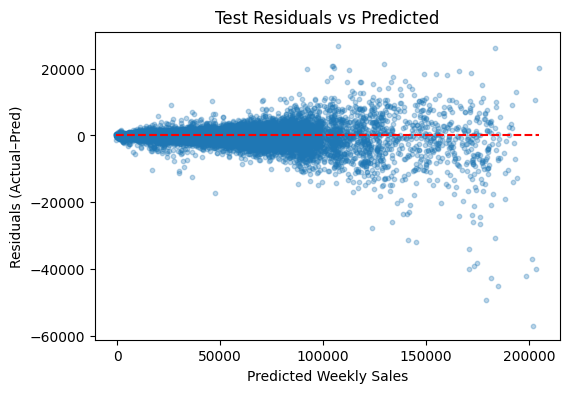

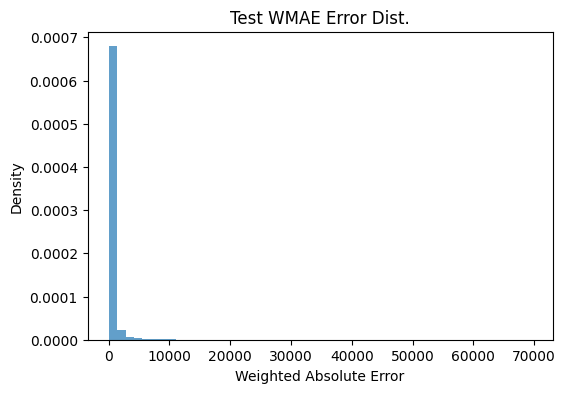

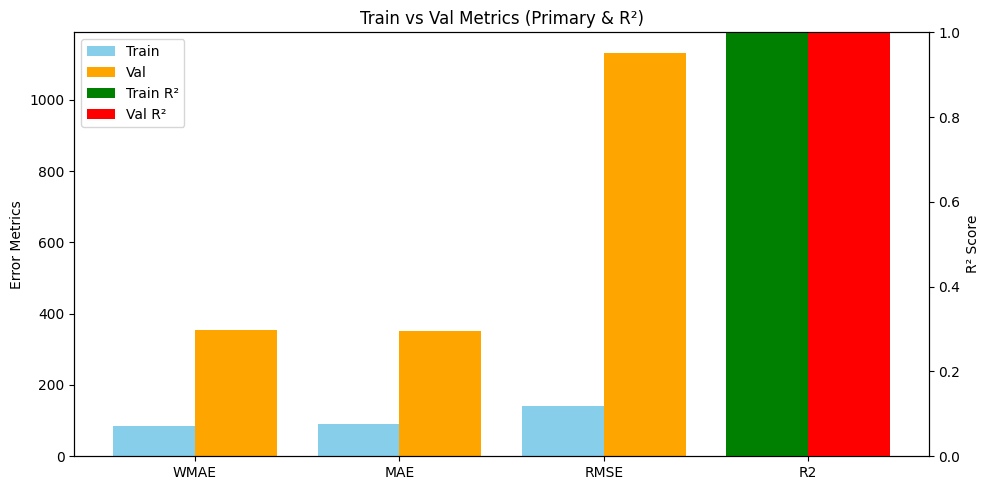

→ test WMAE = 354.9590
🏃 View run tuning_ss1_cs1 at: https://dagshub.com/nkhar21/ML_Final_Project.mlflow/#/experiments/7/runs/40e09692156f47f1af494ceaba6de01c
🧪 View experiment at: https://dagshub.com/nkhar21/ML_Final_Project.mlflow/#/experiments/7

=== Training tuning_ss1_cs0.9 ===
[TRAIN] WMAE=84.5959  MAE=90.4770  RMSE=143.0116  R2=1.0000


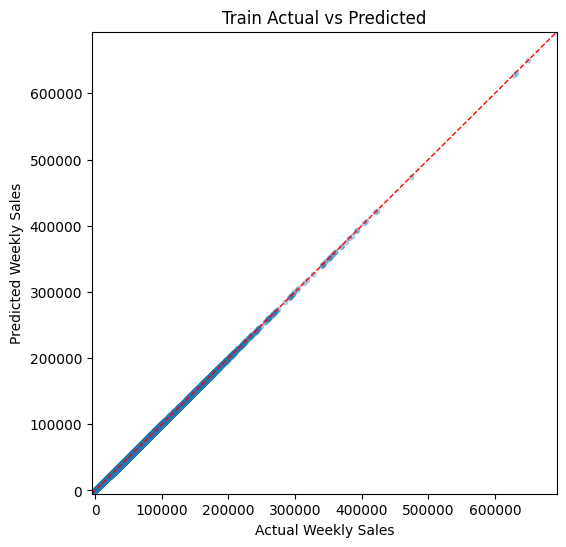

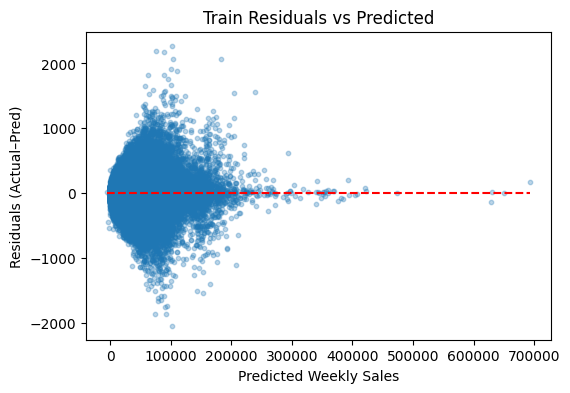

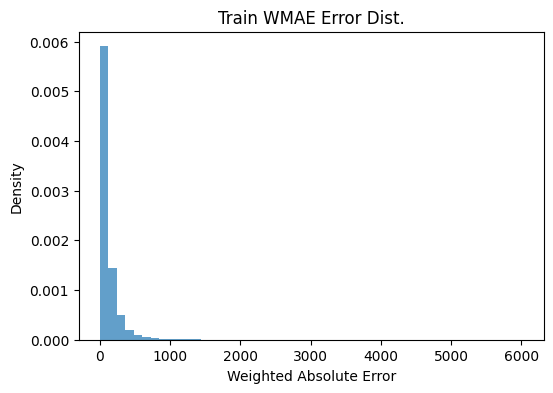

[TEST] WMAE=354.5494  MAE=348.9442  RMSE=1107.9373  R2=0.9975


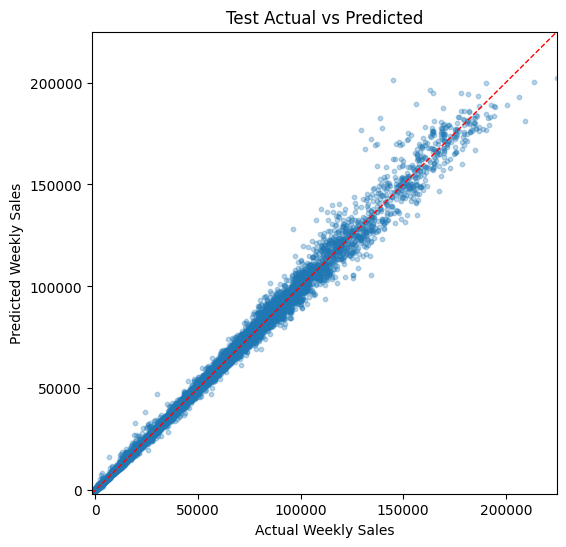

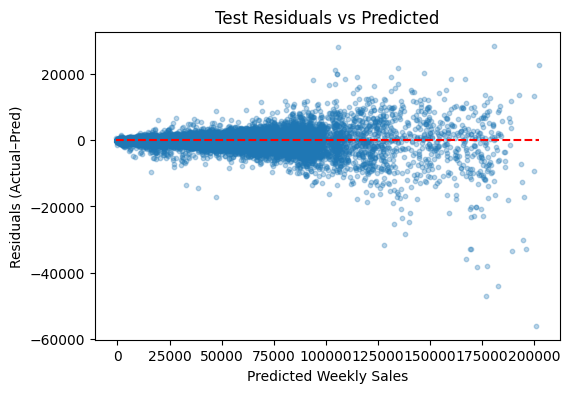

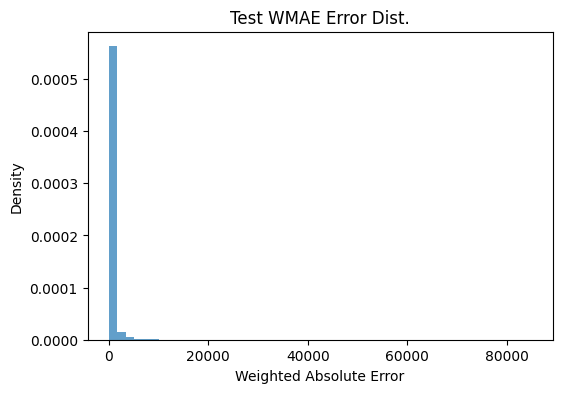

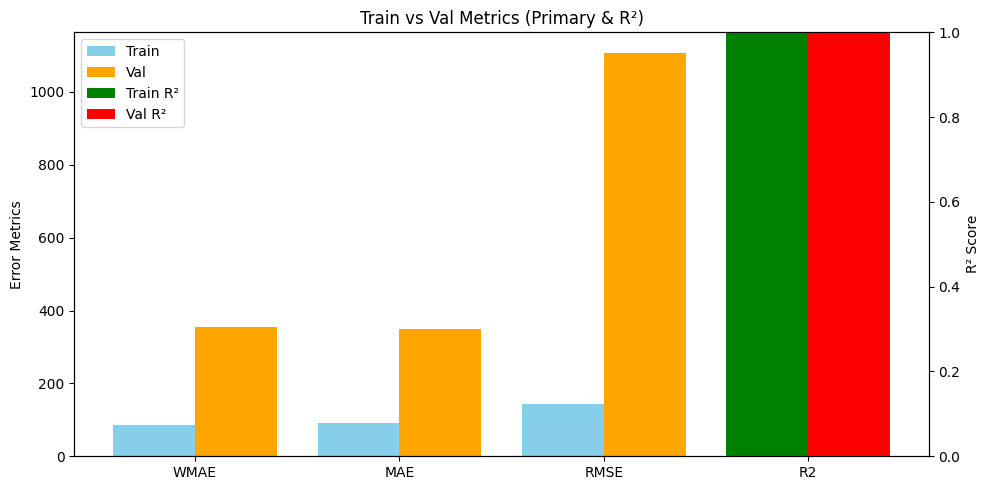

→ test WMAE = 354.5494
🏃 View run tuning_ss1_cs0.9 at: https://dagshub.com/nkhar21/ML_Final_Project.mlflow/#/experiments/7/runs/ff34012592a643e99d53cbfb0d60cca8
🧪 View experiment at: https://dagshub.com/nkhar21/ML_Final_Project.mlflow/#/experiments/7

✅ Best model: {'n_estimators': 5000, 'max_depth': 9, 'learning_rate': 0.03} with WMAE = 347.89747330222156
[TEST] WMAE=347.8975  MAE=343.6892  RMSE=1079.2475  R2=0.9976


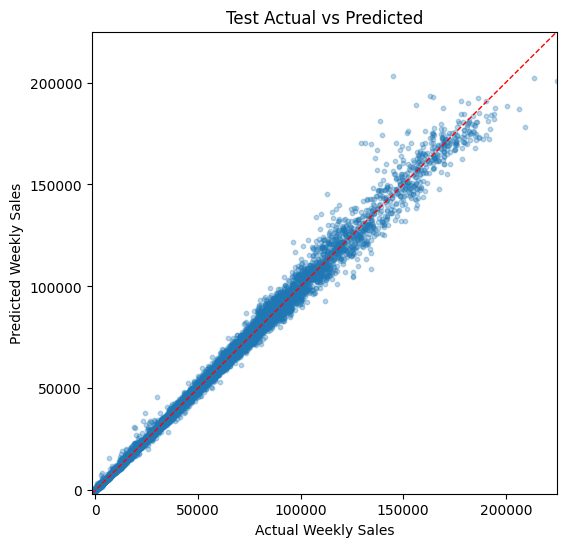

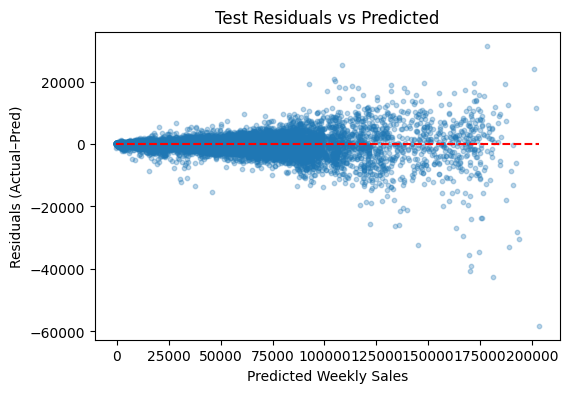

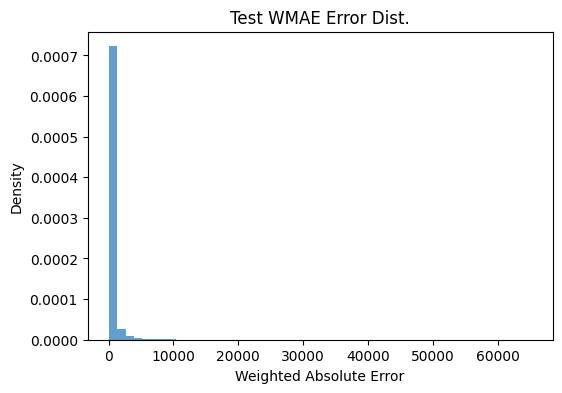

In [ ]:
ne = 5000
md = 9
lr = 0.03

ss_cs = [(0.8, 0.9), (.9,.8), (1,1), (1, .9)]

mlflow.end_run()
mlflow.set_experiment("Training_XGB")

best_wmae = float("inf")
best_params = None
best_model  = None

import mlflow
import mlflow.xgboost
import pickle
import numpy as np
import xgboost as xgb
from datetime import datetime


for ss, cs in ss_cs:
    run_name = f"tuning_ss{ss}_cs{cs}"
    print(f"\n=== Training {run_name} ===")

    with mlflow.start_run(run_name=run_name):
        # instantiate
        model = xgb.XGBRegressor(
            n_estimators   = ne,
            max_depth      = md,
            learning_rate  = lr,
            subsample      = ss,
            colsample_bytree=cs,
            gamma          = 0,
            reg_alpha      = 0,
            reg_lambda     = 1,
            objective      = "reg:squarederror",
            random_state   = 42,
            n_jobs         = -1,
            device         = "cuda"   # <- GPU acceleration
        )
        log_xgb_params(model)

        model.fit(X_train, y_train)

        train_metrics = evaluate_and_plot(model, X_train, y_train, w_train, split="train")
        test_metrics  = evaluate_and_plot(model, X_test,  y_test,  w_test,  split="test")

        plot_overfitting(train_metrics, test_metrics)

        test_wmae = test_metrics["WMAE"]
        if test_wmae < best_wmae:
            best_wmae  = test_wmae
            best_params = {"n_estimators": ne, "max_depth": md, "learning_rate": lr}
            best_model  = model

        print(f"→ test WMAE = {test_wmae:.4f}")

if best_model is not None:
    print("\n✅ Best model:", best_params, "with WMAE =", best_wmae)
    best_test_metrics = evaluate_and_plot(best_model, X_test, y_test, w_test, split="test")


# training 8 - tuning gamma, alpha, lambda


=== Training tuning_gamma0_alpha0_lambda0.5 ===
[TRAIN] WMAE=79.4833  MAE=83.5365  RMSE=120.6464  R2=1.0000


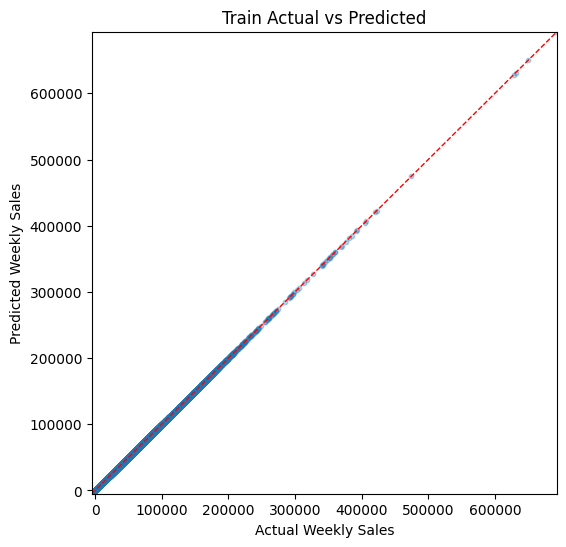

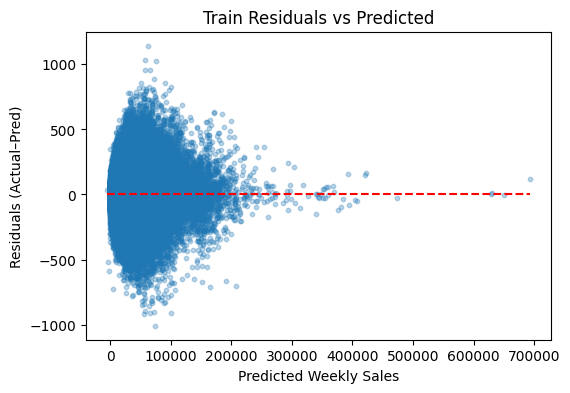

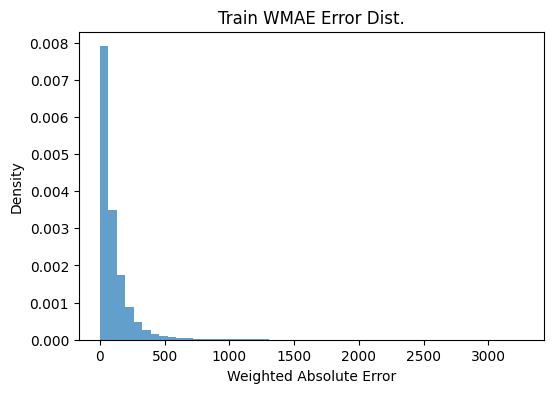

[TEST] WMAE=355.6656  MAE=349.7869  RMSE=1110.2563  R2=0.9975


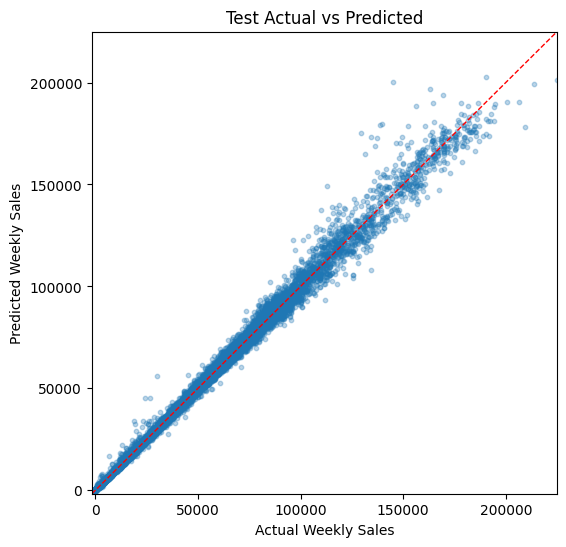

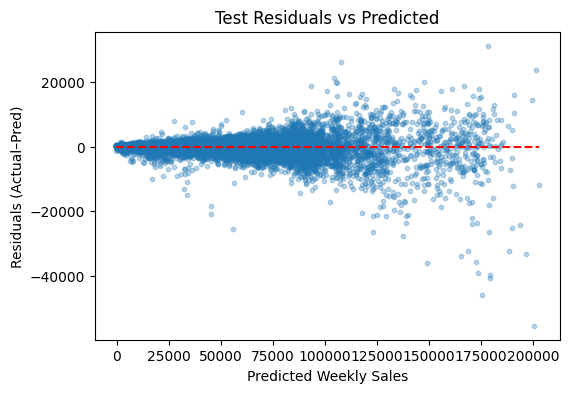

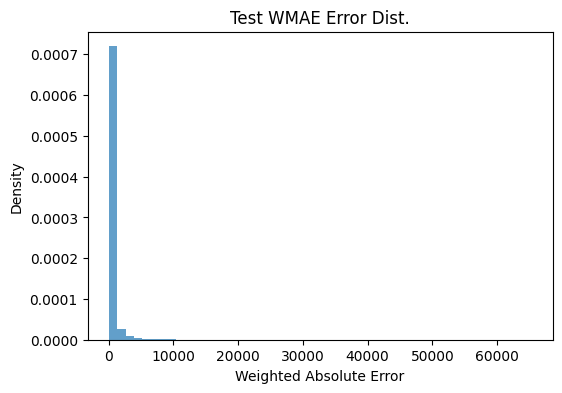

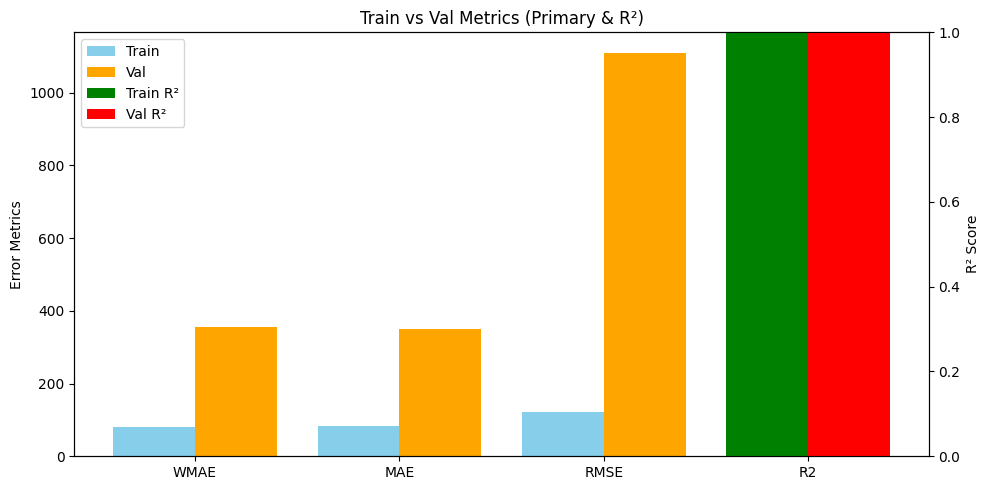

→ test WMAE = 355.6656
🏃 View run tuning_gamma0_alpha0_lambda0.5 at: https://dagshub.com/nkhar21/ML_Final_Project.mlflow/#/experiments/7/runs/b0b50378f01d46728752ed69043bca20
🧪 View experiment at: https://dagshub.com/nkhar21/ML_Final_Project.mlflow/#/experiments/7

=== Training tuning_gamma1_alpha0_lambda1 ===
[TRAIN] WMAE=80.7095  MAE=84.9432  RMSE=124.4385  R2=1.0000


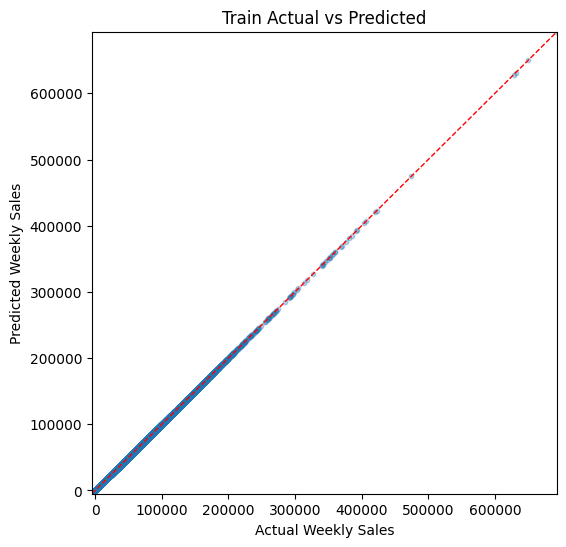

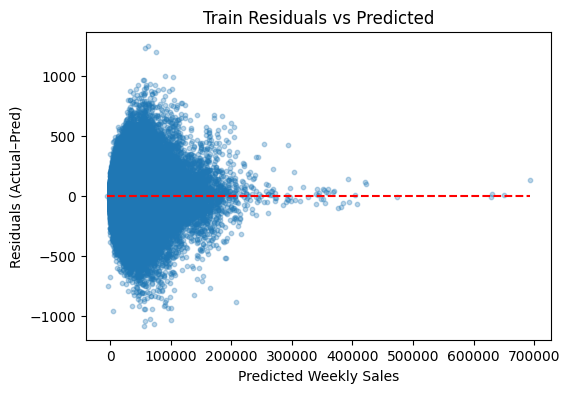

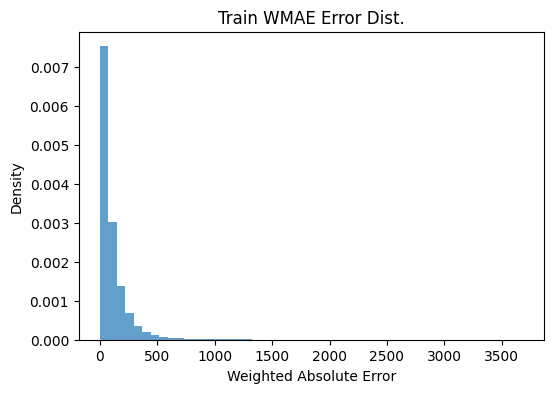

[TEST] WMAE=355.1782  MAE=349.7601  RMSE=1117.4376  R2=0.9974


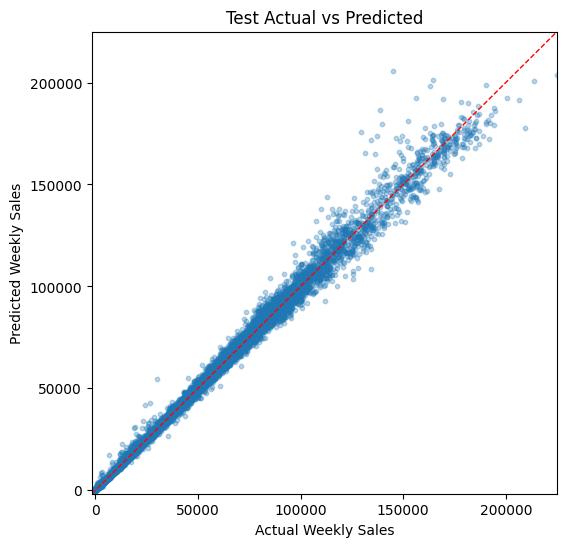

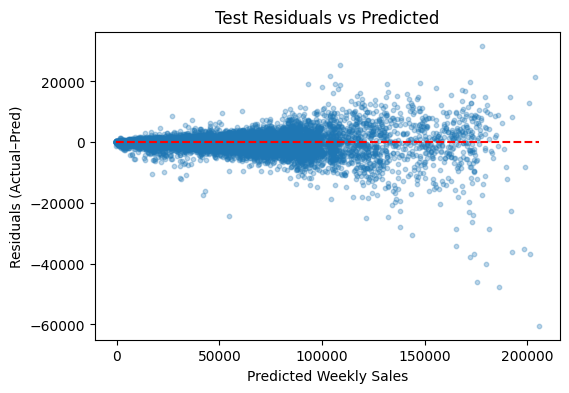

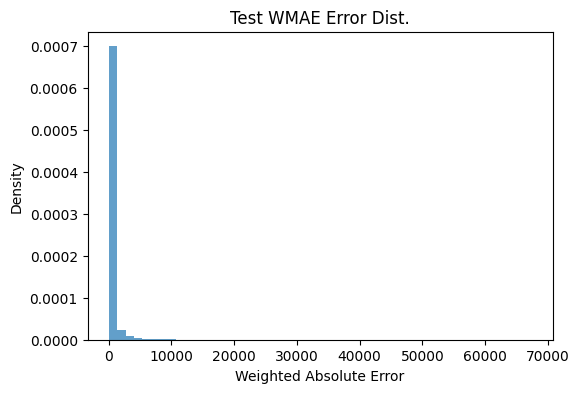

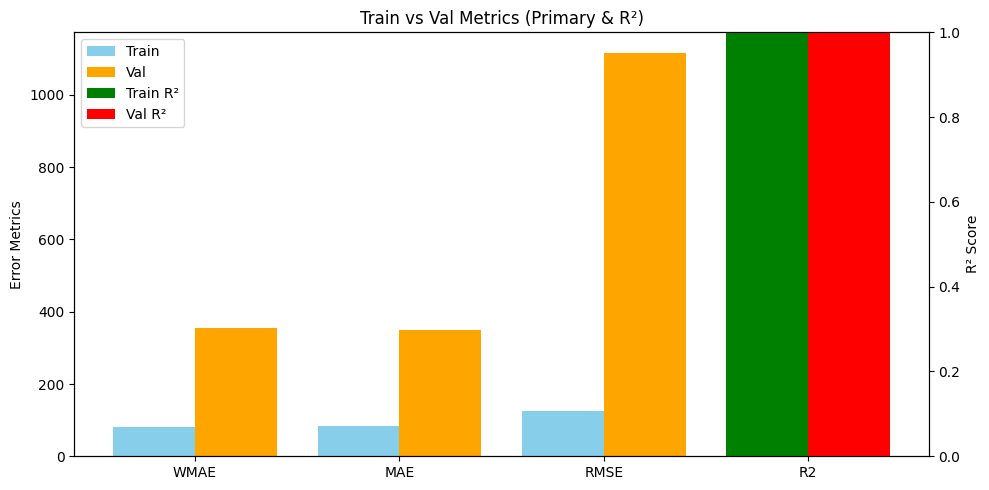

→ test WMAE = 355.1782
🏃 View run tuning_gamma1_alpha0_lambda1 at: https://dagshub.com/nkhar21/ML_Final_Project.mlflow/#/experiments/7/runs/2b7a768462a841b0a333ba58478864dd
🧪 View experiment at: https://dagshub.com/nkhar21/ML_Final_Project.mlflow/#/experiments/7

=== Training tuning_gamma5_alpha0_lambda0.5 ===
[TRAIN] WMAE=79.5346  MAE=83.5603  RMSE=120.8621  R2=1.0000


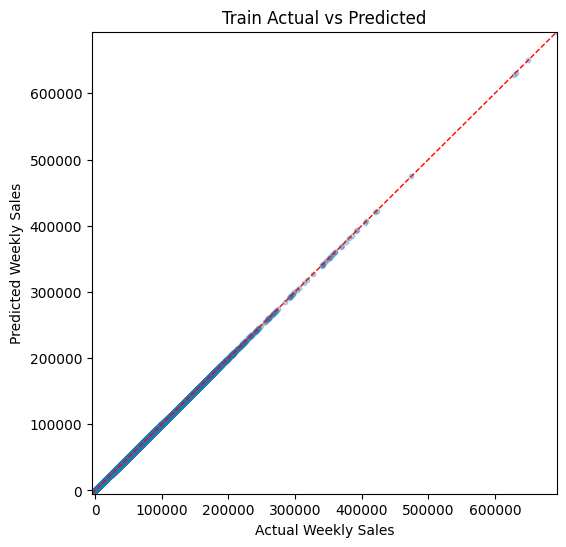

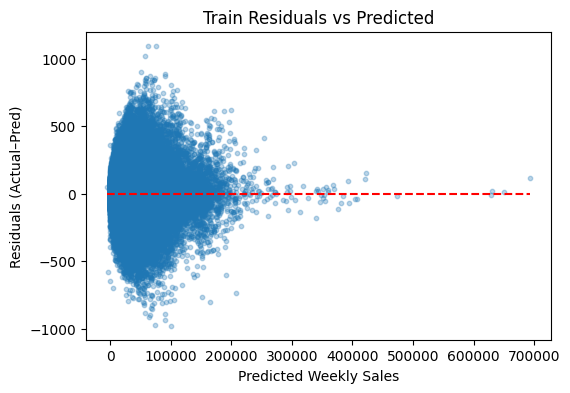

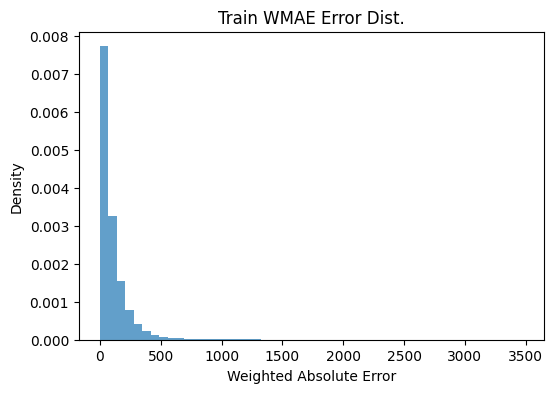

[TEST] WMAE=355.1557  MAE=349.4945  RMSE=1110.5594  R2=0.9975


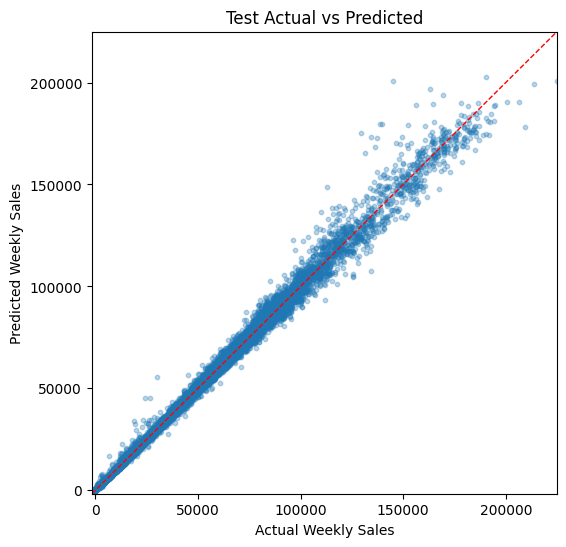

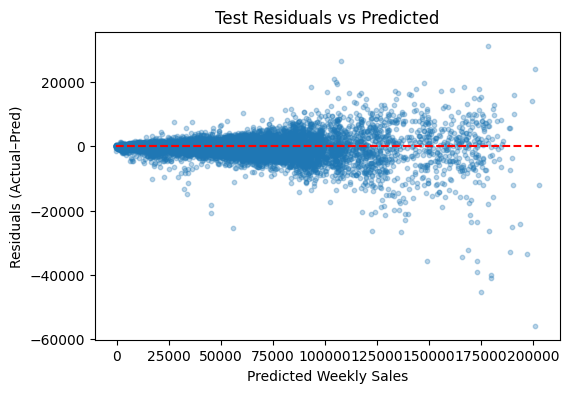

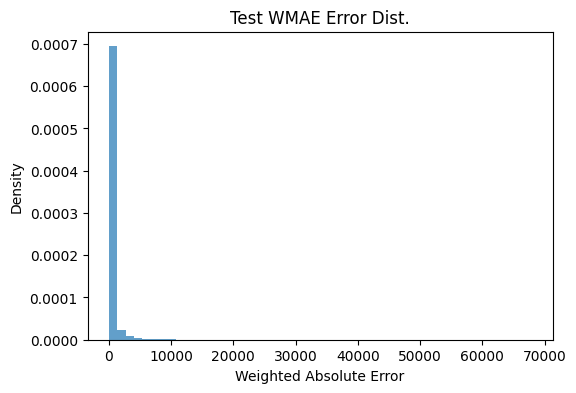

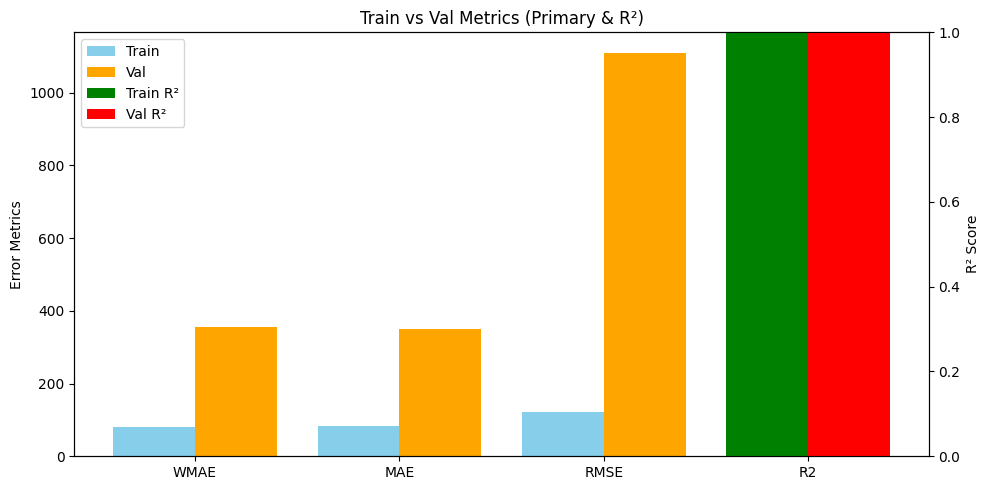

→ test WMAE = 355.1557
🏃 View run tuning_gamma5_alpha0_lambda0.5 at: https://dagshub.com/nkhar21/ML_Final_Project.mlflow/#/experiments/7/runs/79a1c192f52e45a99f38c6d54d1a1d80
🧪 View experiment at: https://dagshub.com/nkhar21/ML_Final_Project.mlflow/#/experiments/7

=== Training tuning_gamma10_alpha0_lambda0.5 ===
[TRAIN] WMAE=79.4355  MAE=83.5786  RMSE=120.6453  R2=1.0000


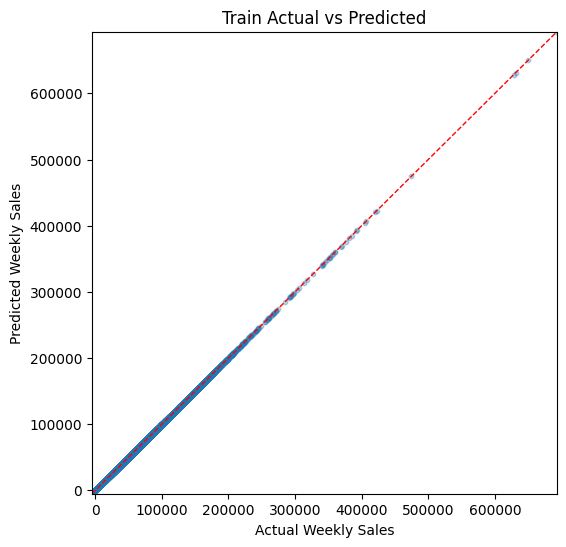

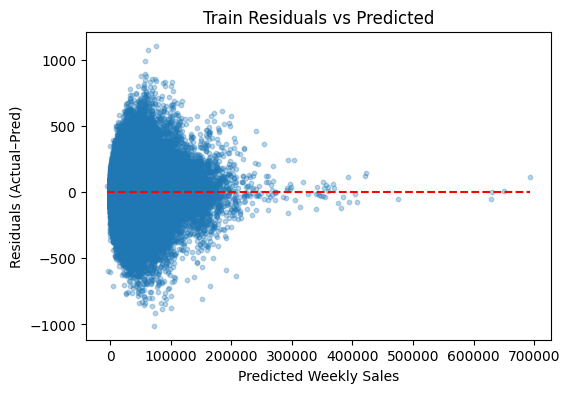

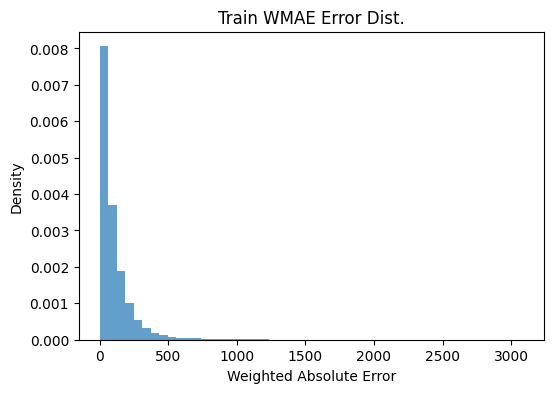

[TEST] WMAE=355.1542  MAE=349.5963  RMSE=1110.6054  R2=0.9975


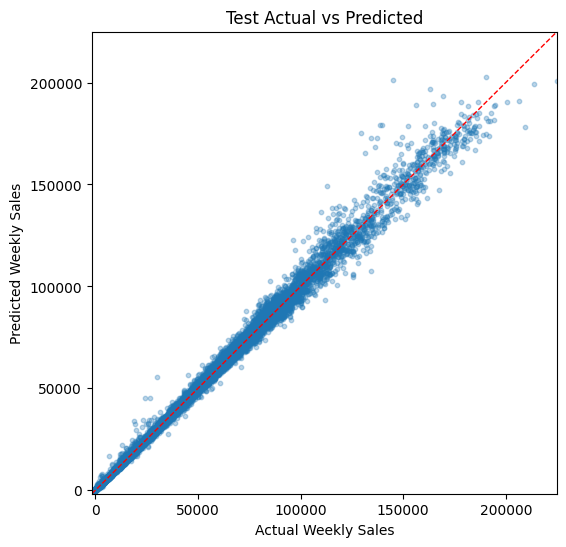

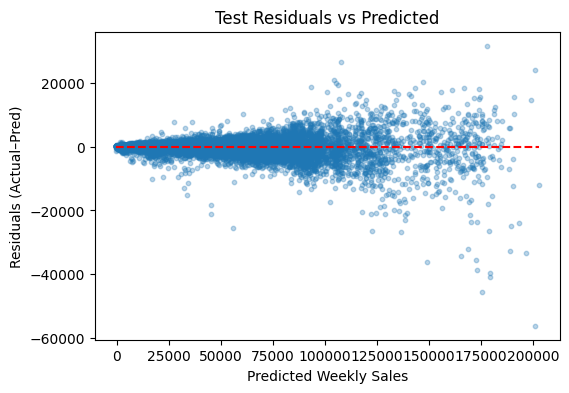

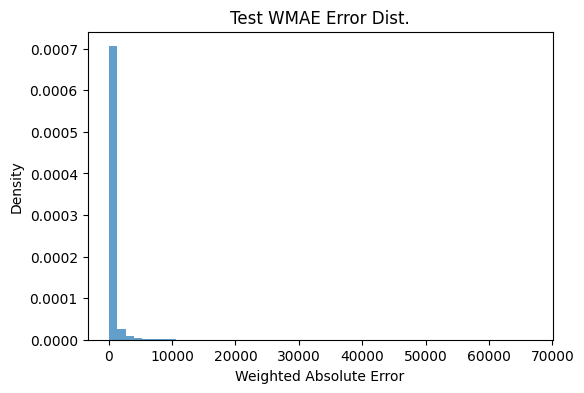

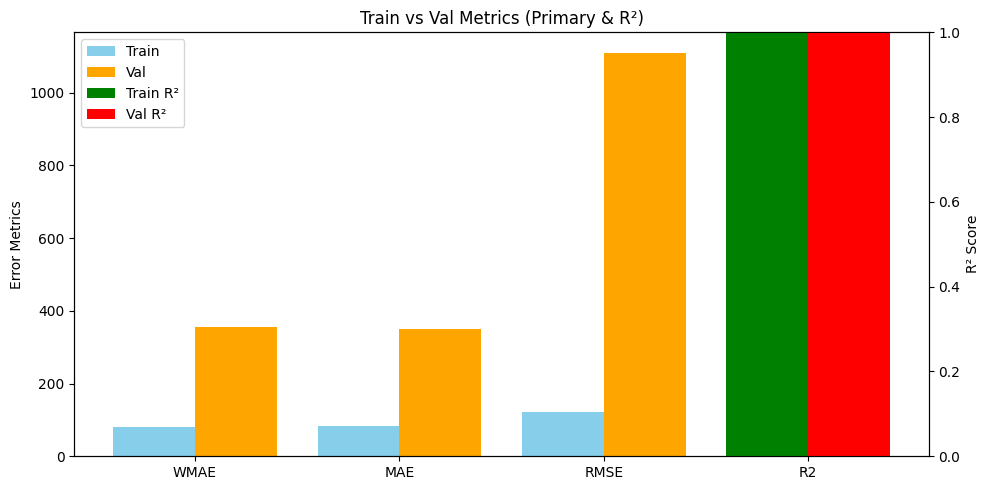

→ test WMAE = 355.1542
🏃 View run tuning_gamma10_alpha0_lambda0.5 at: https://dagshub.com/nkhar21/ML_Final_Project.mlflow/#/experiments/7/runs/0ed7ab5fe8084405bcac69f78e144644
🧪 View experiment at: https://dagshub.com/nkhar21/ML_Final_Project.mlflow/#/experiments/7

=== Training tuning_gamma0_alpha1_lambda5 ===
[TRAIN] WMAE=92.8885  MAE=96.9155  RMSE=148.0429  R2=1.0000


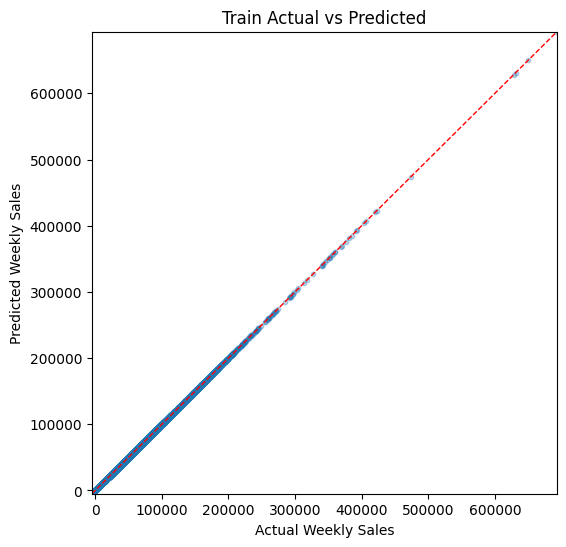

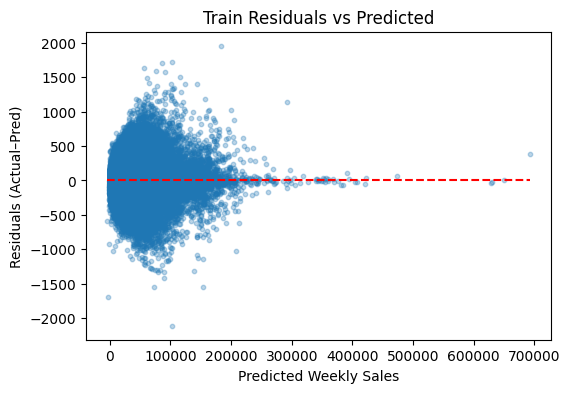

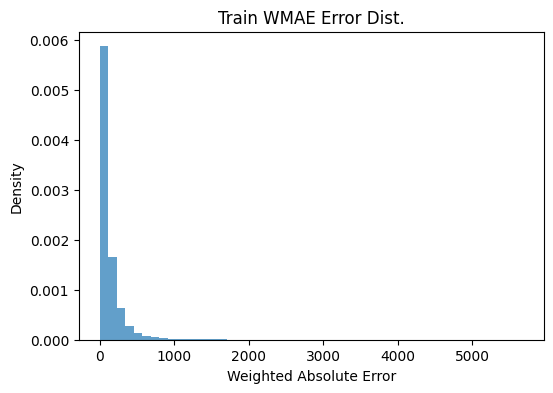

[TEST] WMAE=351.1223  MAE=345.5431  RMSE=1076.2955  R2=0.9976


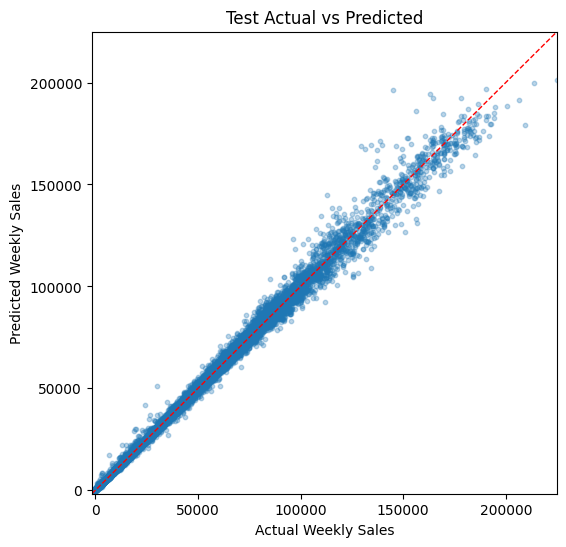

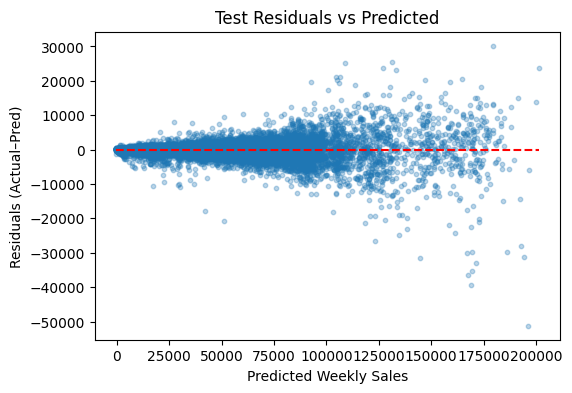

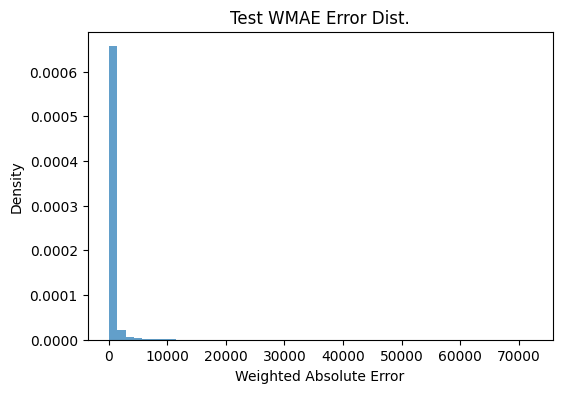

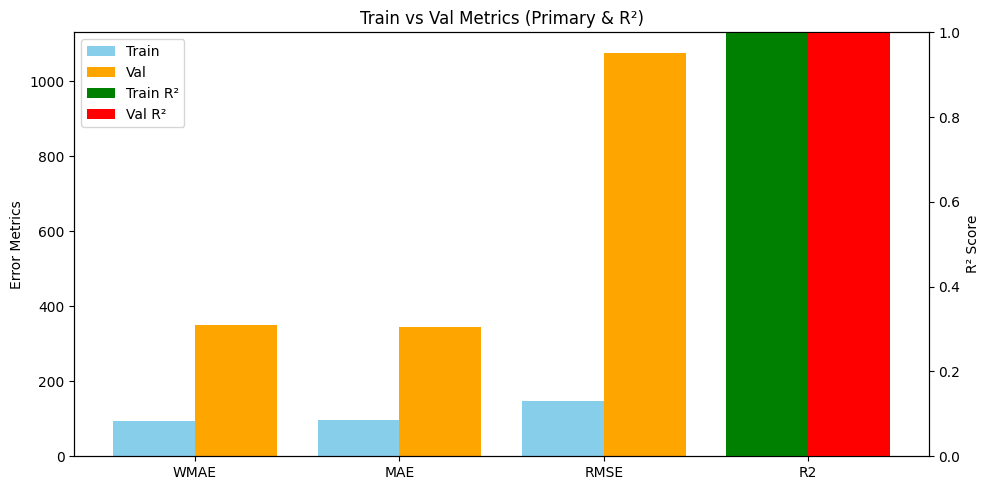

→ test WMAE = 351.1223
🏃 View run tuning_gamma0_alpha1_lambda5 at: https://dagshub.com/nkhar21/ML_Final_Project.mlflow/#/experiments/7/runs/1faf7c29f6d9457b8680286988bb5cf8
🧪 View experiment at: https://dagshub.com/nkhar21/ML_Final_Project.mlflow/#/experiments/7

=== Training tuning_gamma1_alpha1_lambda5 ===
[TRAIN] WMAE=93.0620  MAE=96.9705  RMSE=148.1274  R2=1.0000


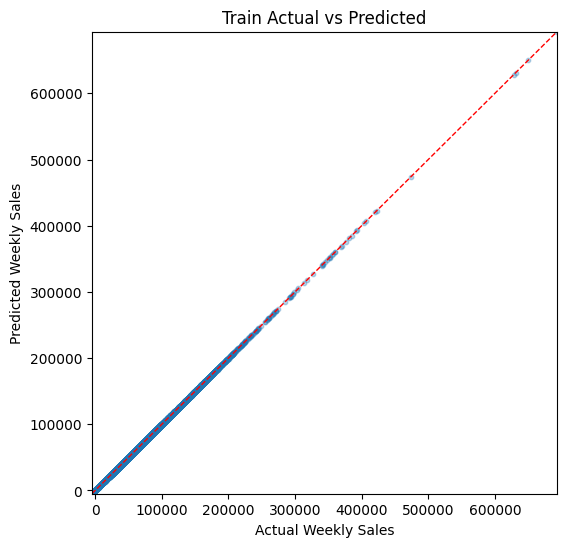

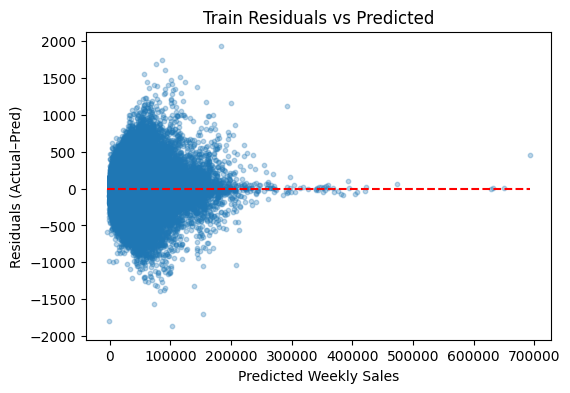

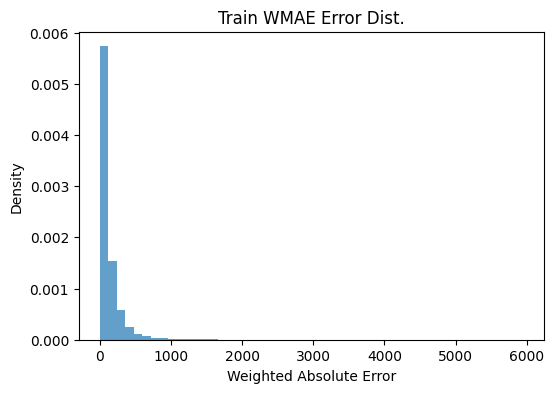

[TEST] WMAE=351.1615  MAE=345.4201  RMSE=1076.1071  R2=0.9976


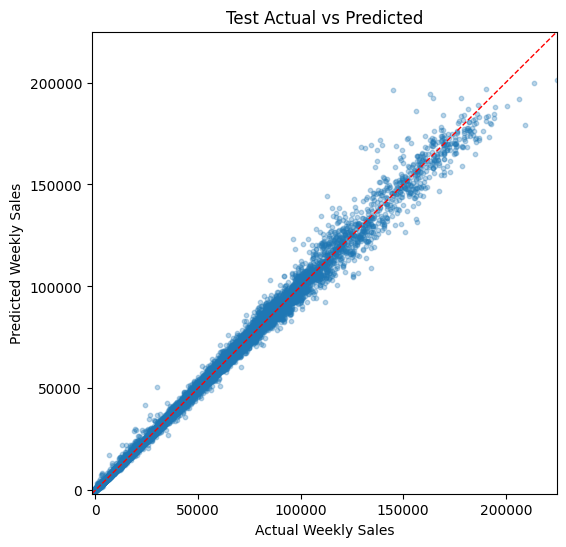

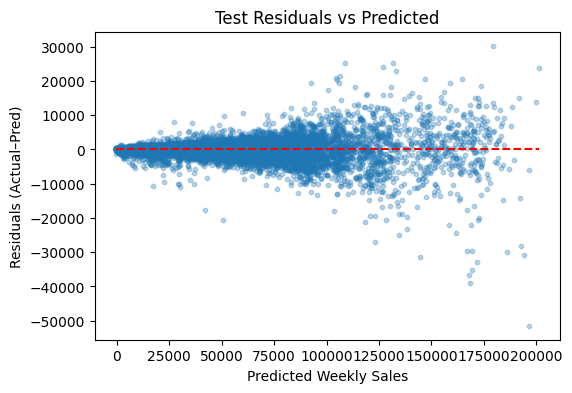

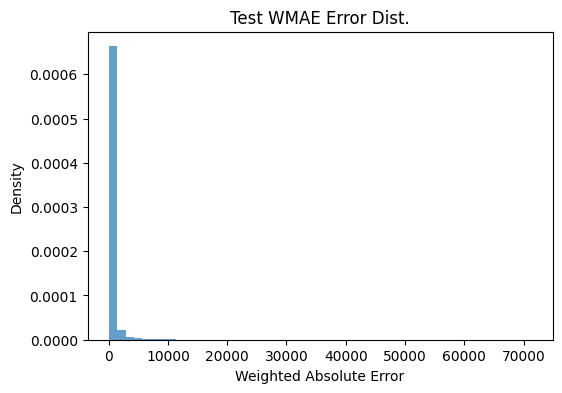

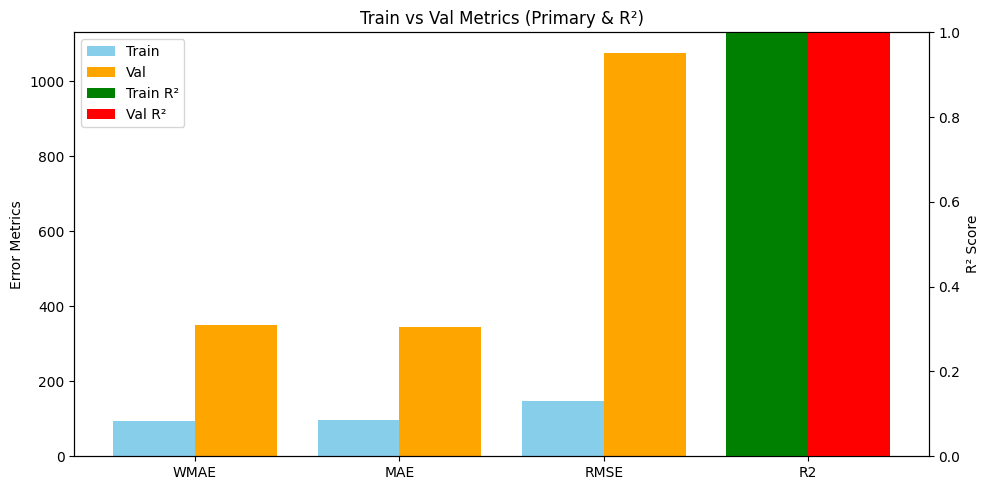

→ test WMAE = 351.1615
🏃 View run tuning_gamma1_alpha1_lambda5 at: https://dagshub.com/nkhar21/ML_Final_Project.mlflow/#/experiments/7/runs/357357594e8c4bb98219e54275fbdc38
🧪 View experiment at: https://dagshub.com/nkhar21/ML_Final_Project.mlflow/#/experiments/7

=== Training tuning_gamma5_alpha1_lambda5 ===
[TRAIN] WMAE=92.6842  MAE=96.7648  RMSE=147.8914  R2=1.0000


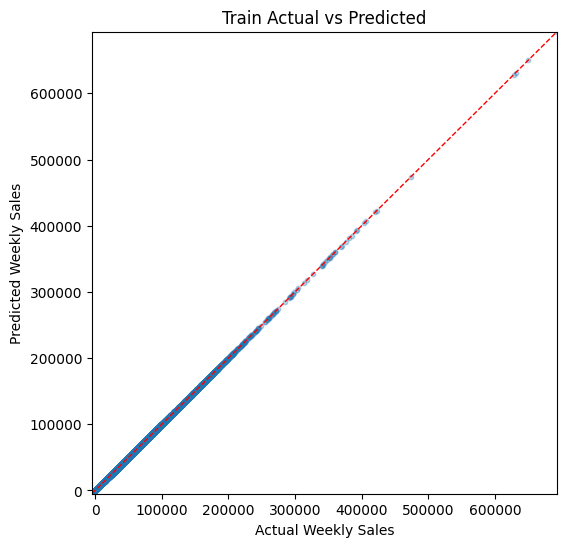

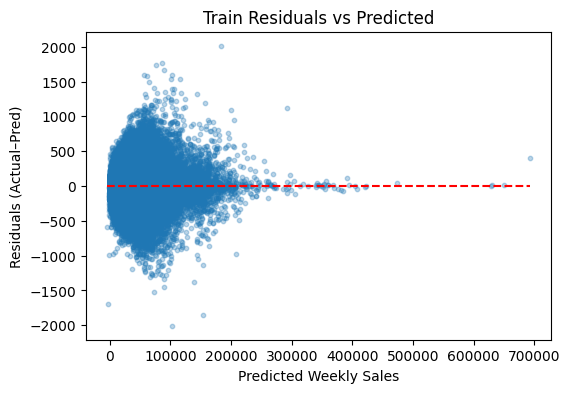

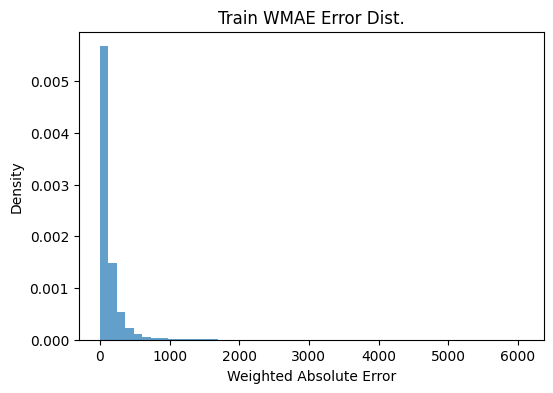

[TEST] WMAE=351.2712  MAE=345.2132  RMSE=1075.7091  R2=0.9976


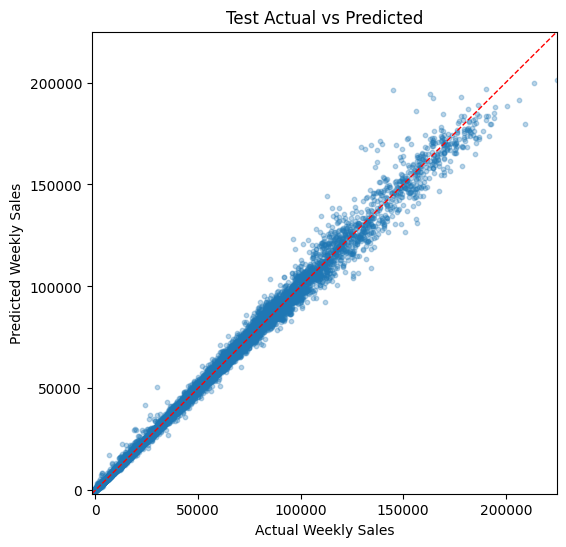

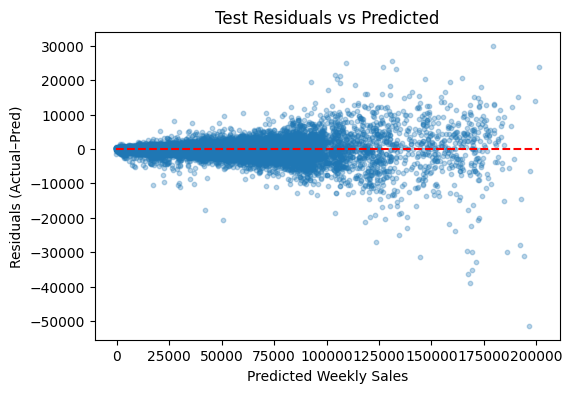

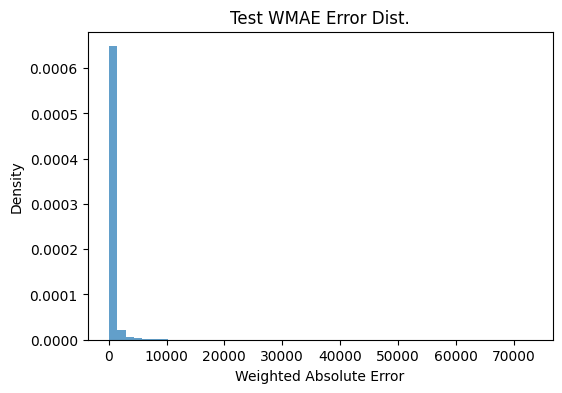

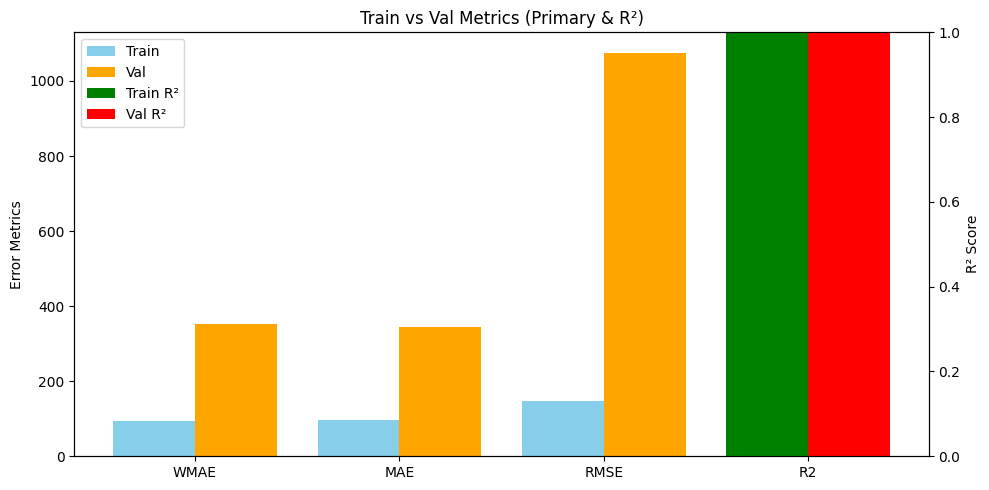

→ test WMAE = 351.2712
🏃 View run tuning_gamma5_alpha1_lambda5 at: https://dagshub.com/nkhar21/ML_Final_Project.mlflow/#/experiments/7/runs/7a2e32e5ade94e39a1888314f8858925
🧪 View experiment at: https://dagshub.com/nkhar21/ML_Final_Project.mlflow/#/experiments/7

=== Training tuning_gamma10_alpha0.5_lambda1 ===
[TRAIN] WMAE=80.7837  MAE=85.0805  RMSE=124.6087  R2=1.0000


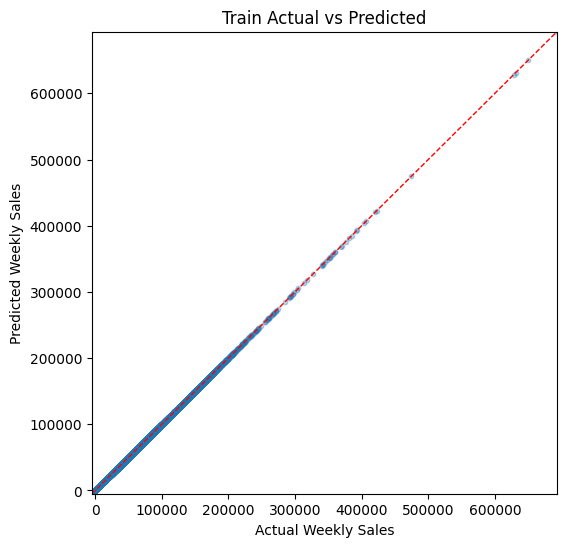

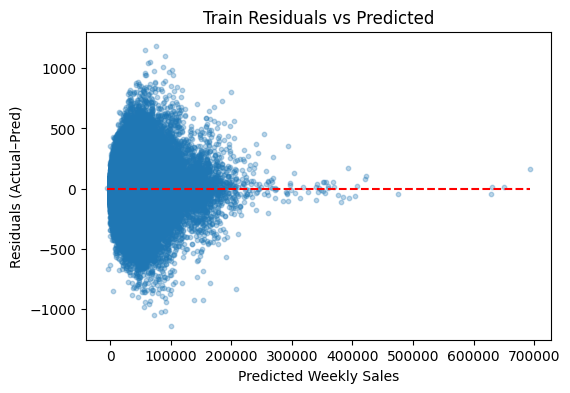

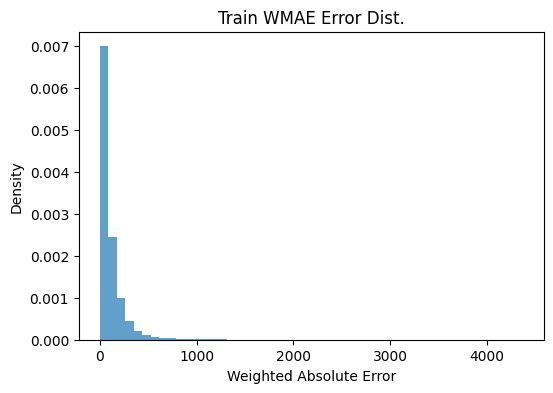

[TEST] WMAE=356.9289  MAE=349.6559  RMSE=1112.1181  R2=0.9975


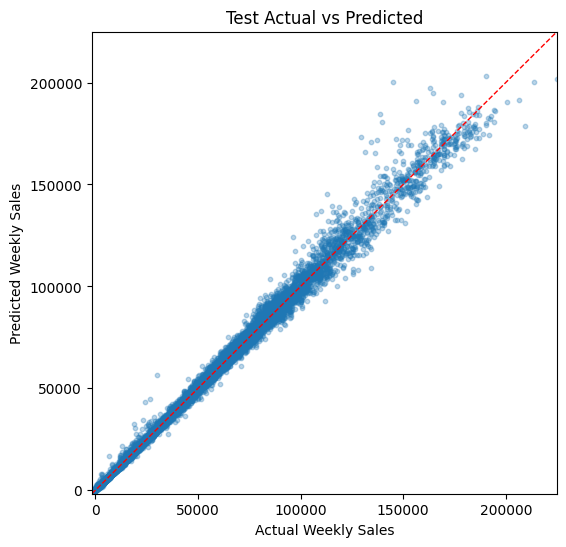

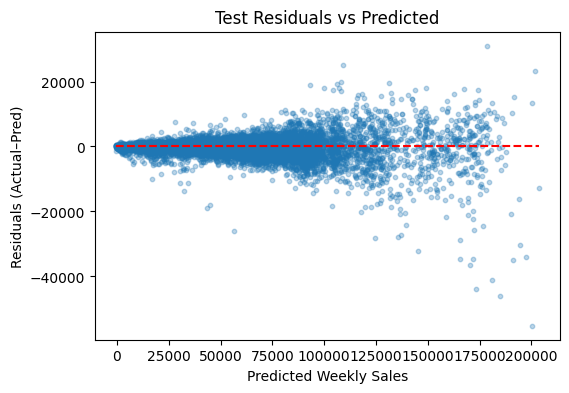

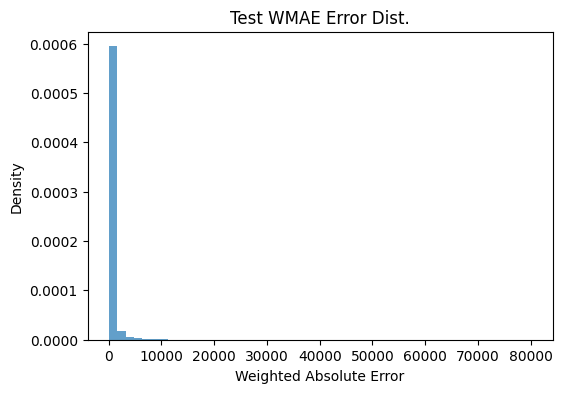

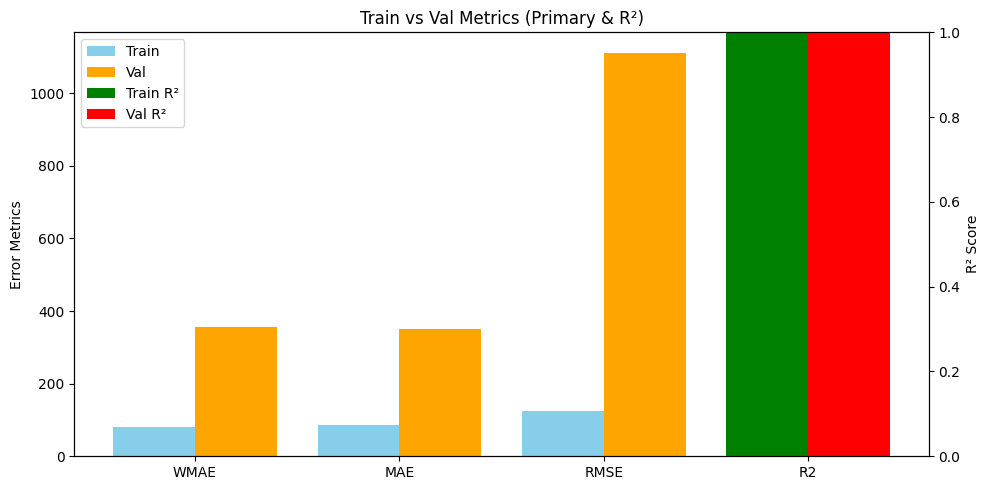

→ test WMAE = 356.9289
🏃 View run tuning_gamma10_alpha0.5_lambda1 at: https://dagshub.com/nkhar21/ML_Final_Project.mlflow/#/experiments/7/runs/ee77b77428864574a82f2abeee1093aa
🧪 View experiment at: https://dagshub.com/nkhar21/ML_Final_Project.mlflow/#/experiments/7

=== Training tuning_gamma0_alpha10_lambda10 ===
[TRAIN] WMAE=104.4574  MAE=108.4545  RMSE=169.2113  R2=0.9999


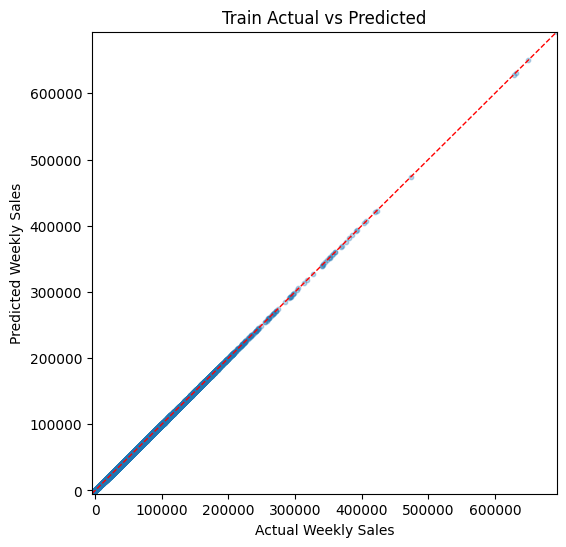

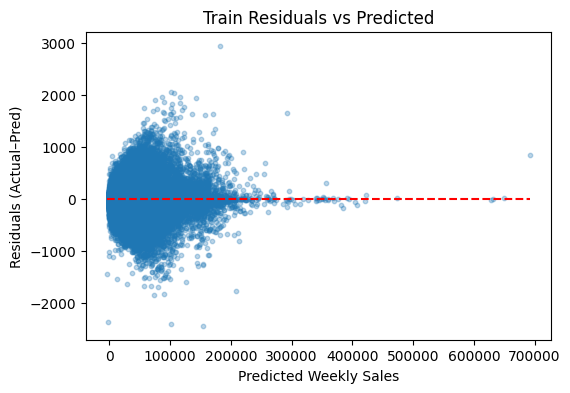

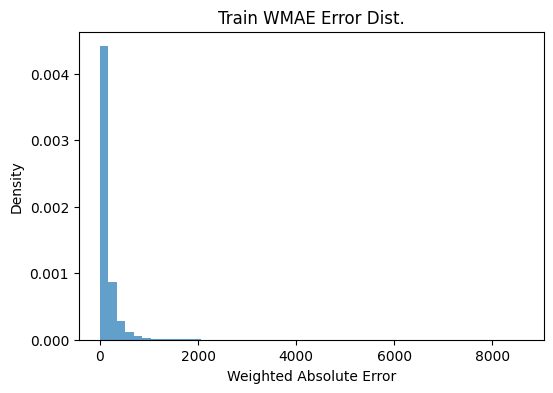

[TEST] WMAE=352.0262  MAE=346.4580  RMSE=1073.3541  R2=0.9976


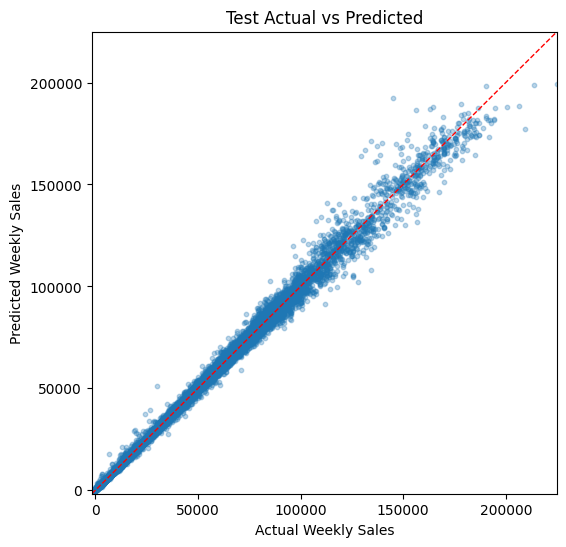

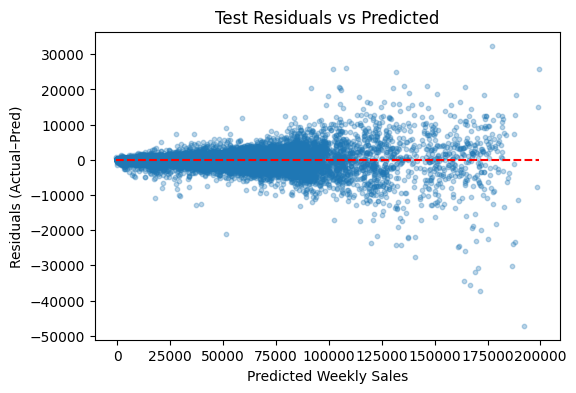

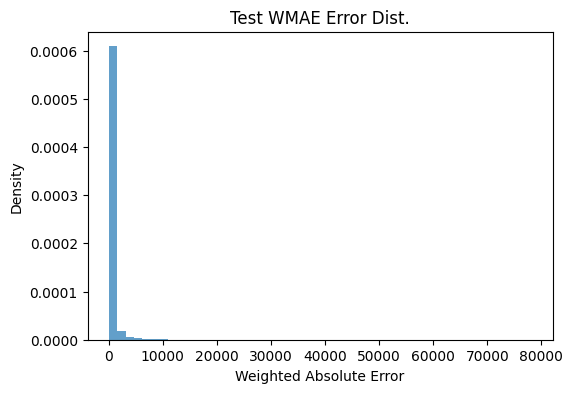

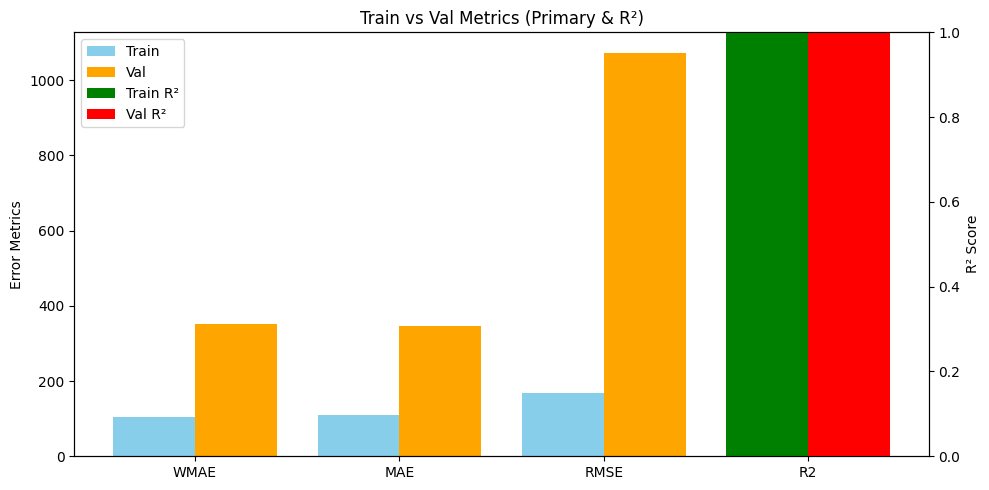

→ test WMAE = 352.0262
🏃 View run tuning_gamma0_alpha10_lambda10 at: https://dagshub.com/nkhar21/ML_Final_Project.mlflow/#/experiments/7/runs/e6575813e08749b1809376ed3505e786
🧪 View experiment at: https://dagshub.com/nkhar21/ML_Final_Project.mlflow/#/experiments/7

=== Training tuning_gamma1_alpha10_lambda10 ===
[TRAIN] WMAE=104.3411  MAE=108.3813  RMSE=169.2082  R2=0.9999


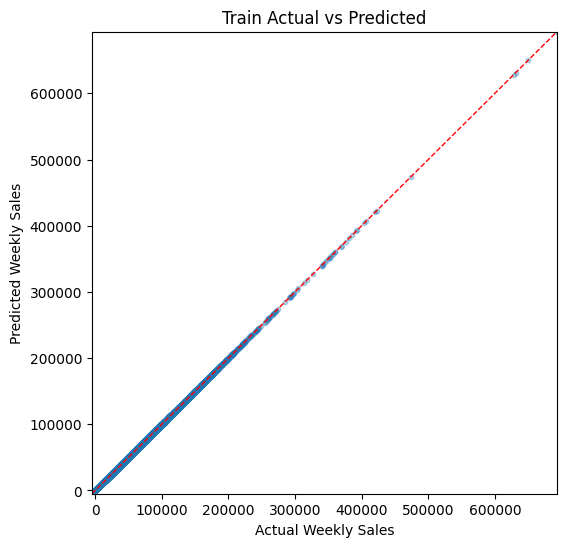

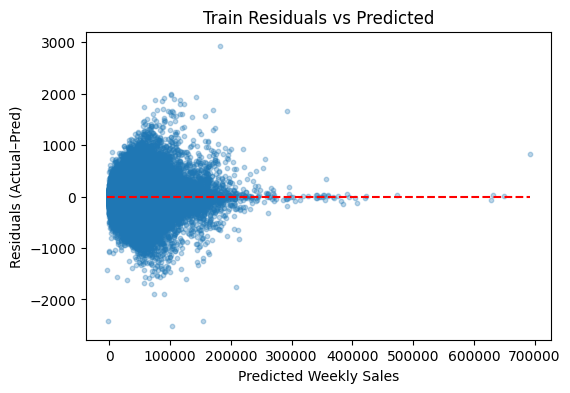

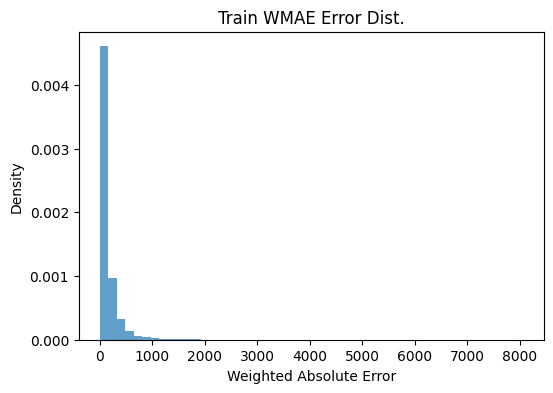

[TEST] WMAE=352.2282  MAE=346.4941  RMSE=1072.7734  R2=0.9976


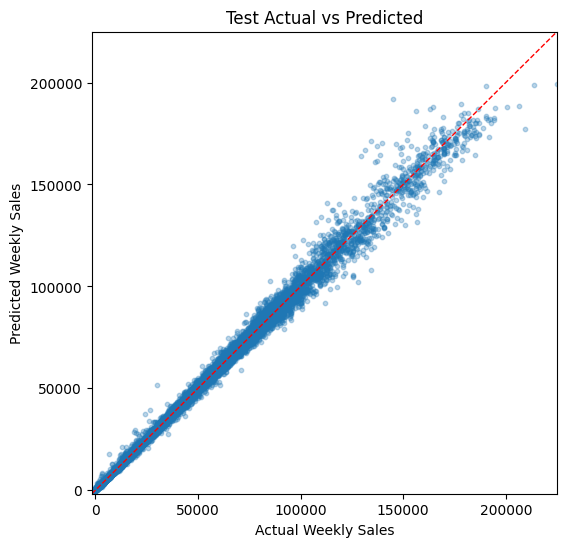

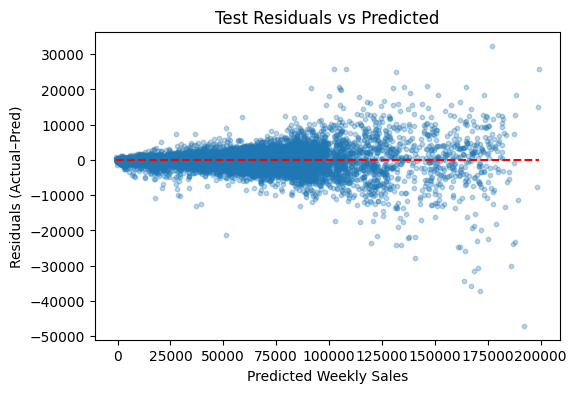

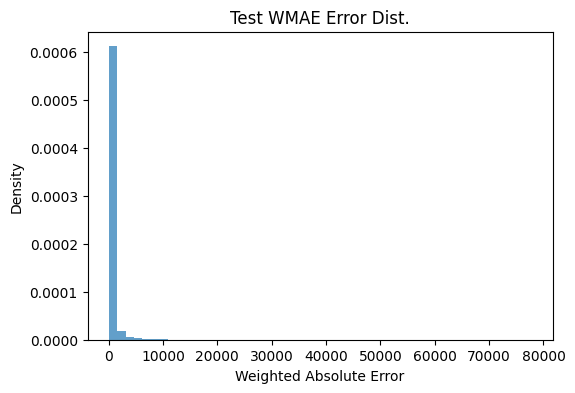

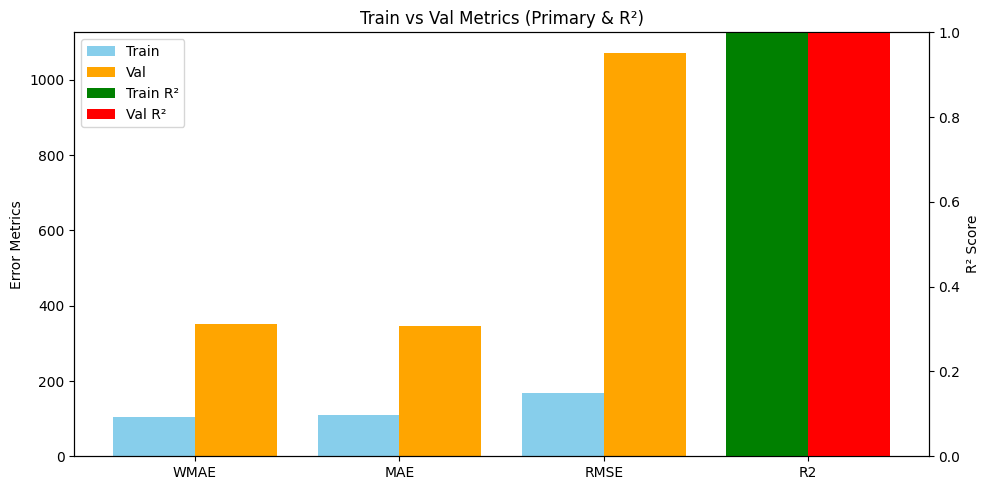

→ test WMAE = 352.2282
🏃 View run tuning_gamma1_alpha10_lambda10 at: https://dagshub.com/nkhar21/ML_Final_Project.mlflow/#/experiments/7/runs/3297812f4ceb4805a86b8830fef3ac31
🧪 View experiment at: https://dagshub.com/nkhar21/ML_Final_Project.mlflow/#/experiments/7

=== Training tuning_gamma5_alpha10_lambda10 ===
[TRAIN] WMAE=104.5010  MAE=108.3886  RMSE=168.9706  R2=0.9999


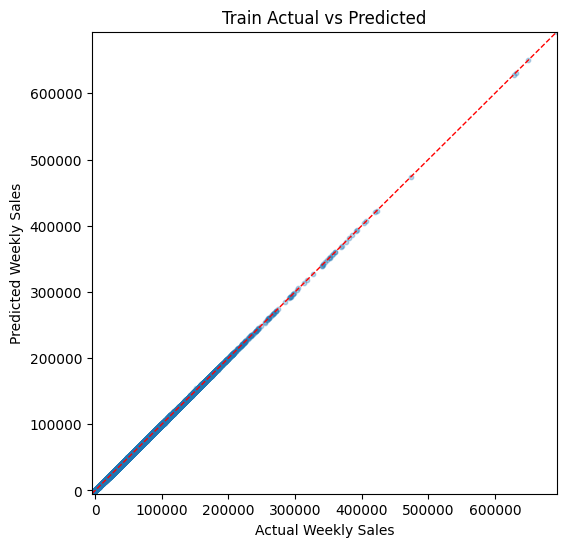

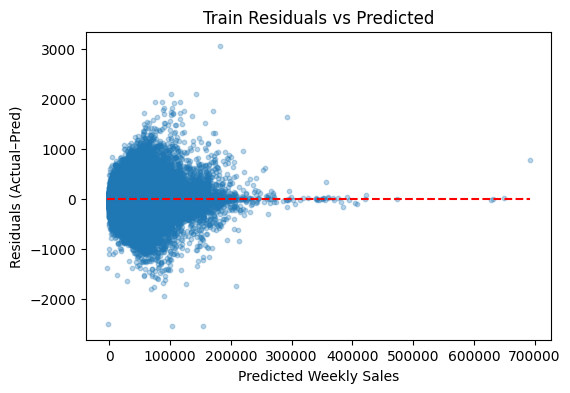

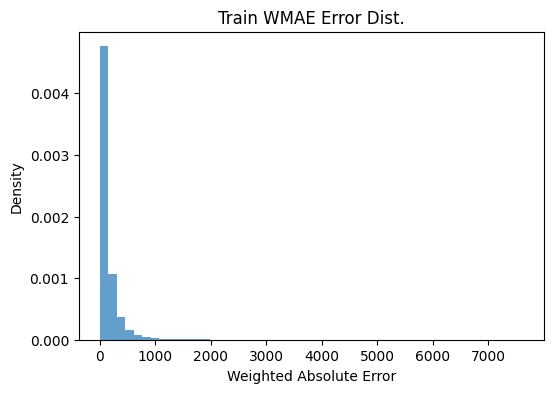

[TEST] WMAE=351.3946  MAE=346.1712  RMSE=1073.7696  R2=0.9976


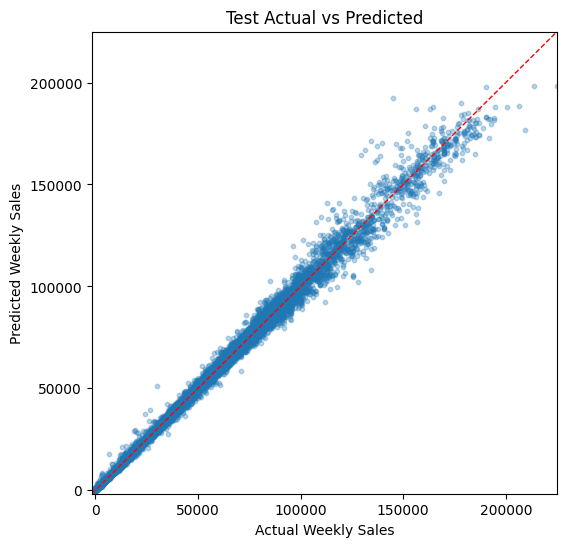

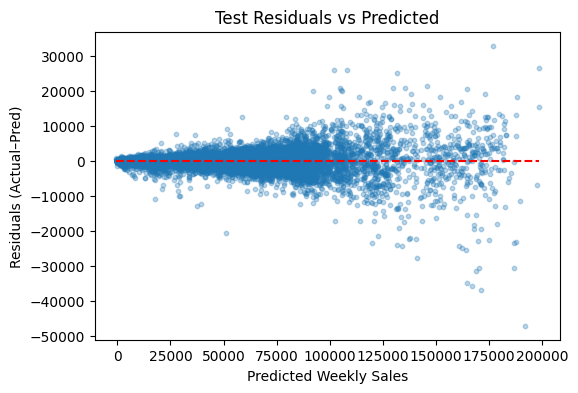

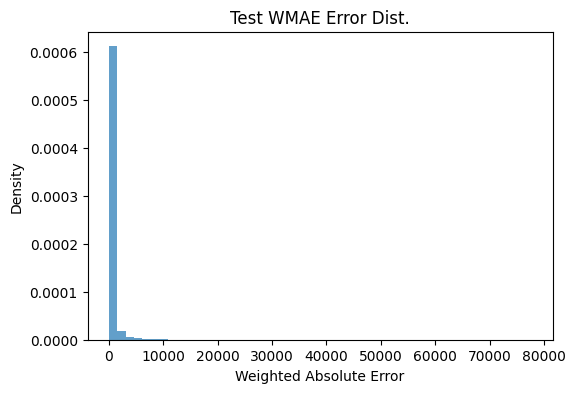

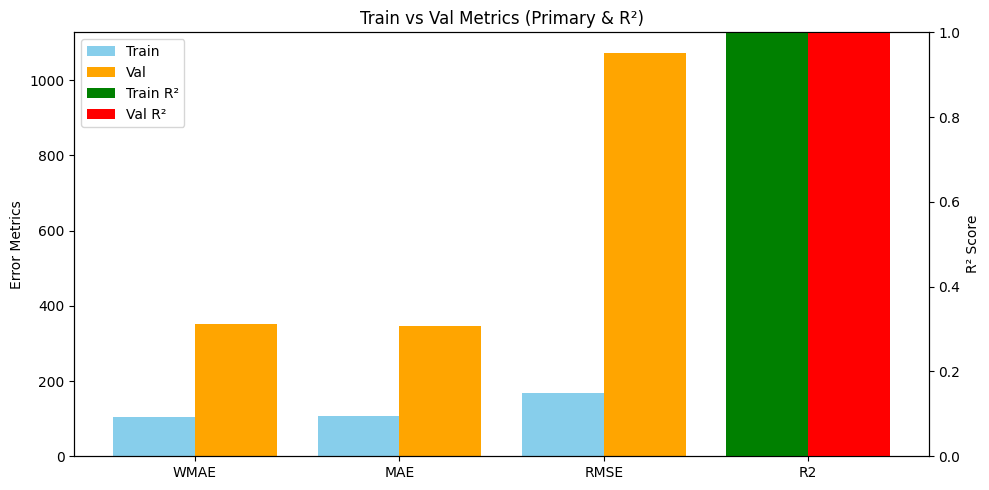

→ test WMAE = 351.3946
🏃 View run tuning_gamma5_alpha10_lambda10 at: https://dagshub.com/nkhar21/ML_Final_Project.mlflow/#/experiments/7/runs/3999fd82294d43d7b196947934ac8a8d
🧪 View experiment at: https://dagshub.com/nkhar21/ML_Final_Project.mlflow/#/experiments/7

=== Training tuning_gamma10_alpha0.5_lambda10 ===
[TRAIN] WMAE=104.3487  MAE=108.3213  RMSE=169.1204  R2=0.9999


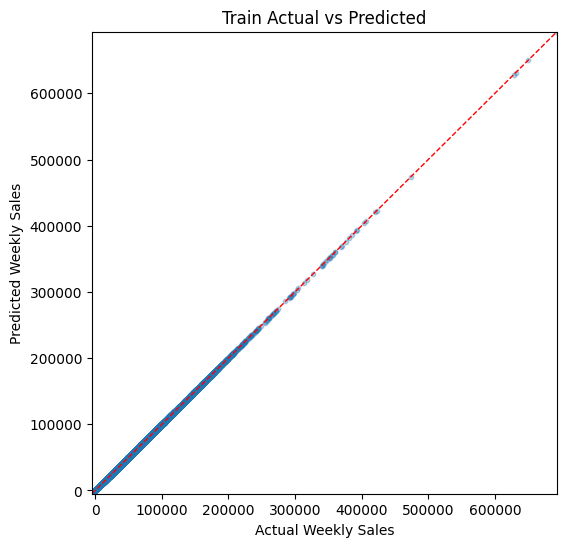

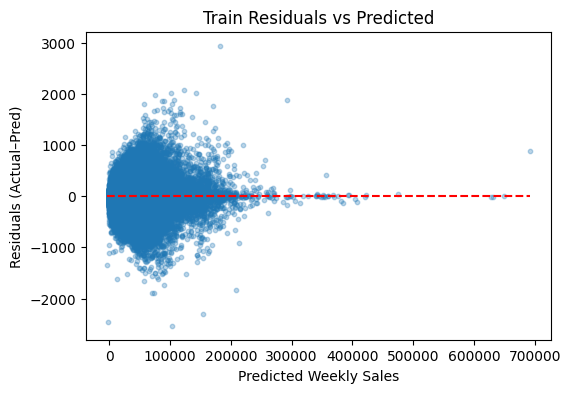

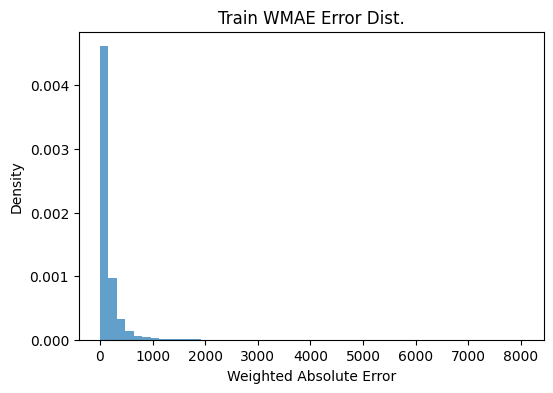

[TEST] WMAE=352.5532  MAE=346.8736  RMSE=1077.5173  R2=0.9976


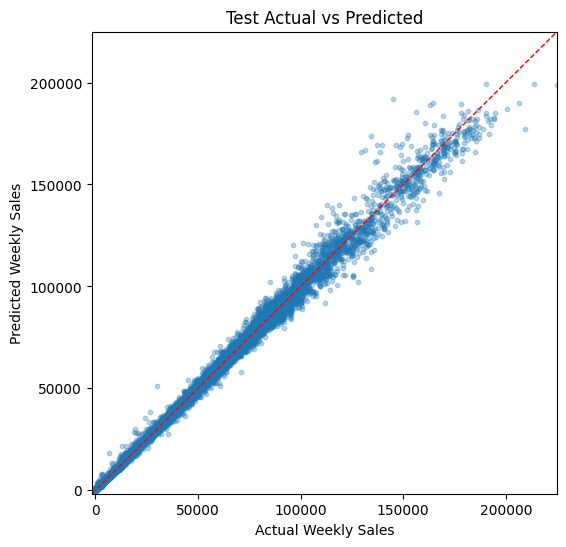

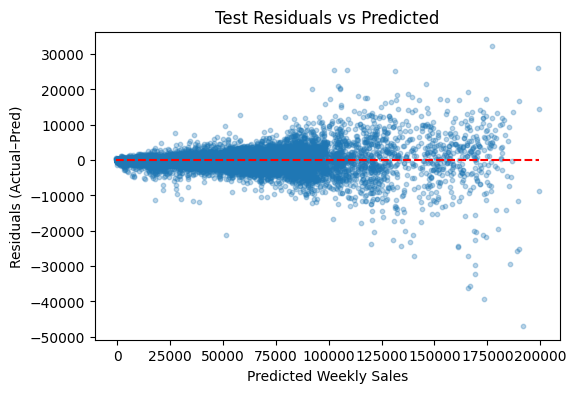

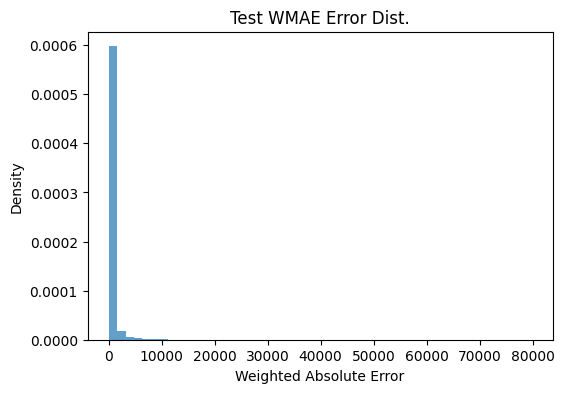

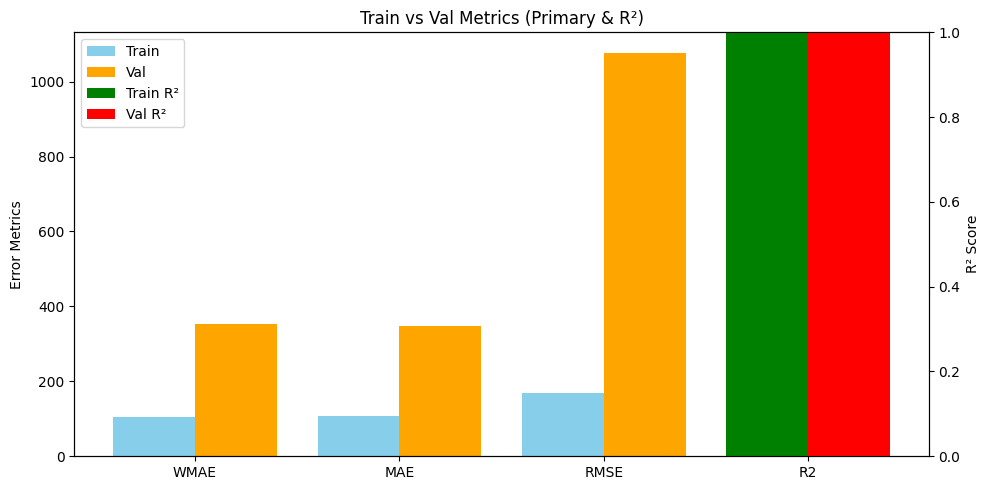

→ test WMAE = 352.5532
🏃 View run tuning_gamma10_alpha0.5_lambda10 at: https://dagshub.com/nkhar21/ML_Final_Project.mlflow/#/experiments/7/runs/a653e62646b645f0b22bb1cd658f4fdb
🧪 View experiment at: https://dagshub.com/nkhar21/ML_Final_Project.mlflow/#/experiments/7

✅ Best model: {'n_estimators': 5000, 'max_depth': 9, 'learning_rate': 0.03} with WMAE = 351.1222761749363
[TEST] WMAE=351.1223  MAE=345.5431  RMSE=1076.2955  R2=0.9976


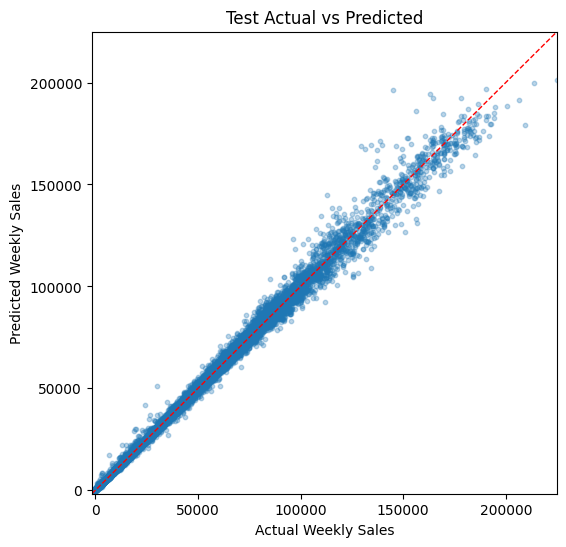

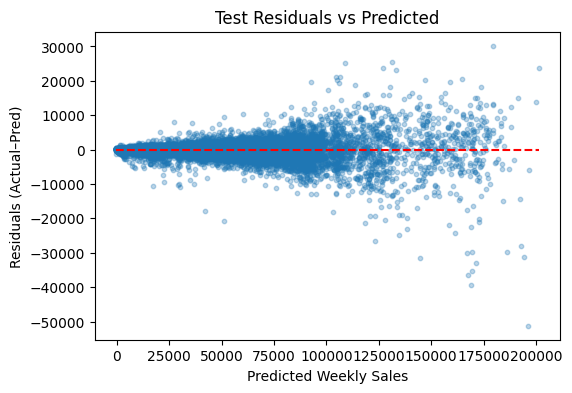

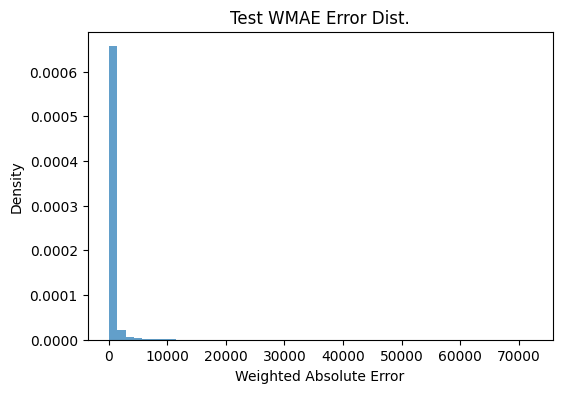

In [ ]:
ne = 5000
md = 9
lr = 0.03
ss = 0.9
cs = 0.8

g_a_l = [(0, 0, 0.5), (1, 0, 1), (5, 0, 0.5), (10, 0, 0.5),
         (0, 1, 5), (1, 1, 5), (5, 1, 5), (10, .5, 1),
         (0, 10, 10), (1, 10, 10), (5, 10, 10), (10, .5, 10)]

mlflow.end_run()
mlflow.set_experiment("Training_XGB")

best_wmae = float("inf")
best_params = None
best_model  = None

import mlflow
import mlflow.xgboost
import pickle
import numpy as np
import xgboost as xgb
from datetime import datetime


for g, a, l in g_a_l:
    run_name = f"tuning_gamma{g}_alpha{a}_lambda{l}"
    print(f"\n=== Training {run_name} ===")

    with mlflow.start_run(run_name=run_name):
        # instantiate
        model = xgb.XGBRegressor(
            n_estimators   = ne,
            max_depth      = md,
            learning_rate  = lr,
            subsample      = ss,
            colsample_bytree=cs,
            gamma          = g,
            reg_alpha      = a,
            reg_lambda     = l,
            objective      = "reg:squarederror",
            random_state   = 42,
            n_jobs         = -1,
            device         = "cuda"   # <- GPU acceleration
        )
        log_xgb_params(model)

        model.fit(X_train, y_train)

        train_metrics = evaluate_and_plot(model, X_train, y_train, w_train, split="train")
        test_metrics  = evaluate_and_plot(model, X_test,  y_test,  w_test,  split="test")

        plot_overfitting(train_metrics, test_metrics)

        test_wmae = test_metrics["WMAE"]
        if test_wmae < best_wmae:
            best_wmae  = test_wmae
            best_params = {"n_estimators": ne, "max_depth": md, "learning_rate": lr}
            best_model  = model

        print(f"→ test WMAE = {test_wmae:.4f}")

if best_model is not None:
    print("\n✅ Best model:", best_params, "with WMAE =", best_wmae)
    best_test_metrics = evaluate_and_plot(best_model, X_test, y_test, w_test, split="test")



# early stopping

In [ ]:
df_final_train_1, df_final_test_1 = split_sales_data(df_final)

X_train_1 = df_final_train_1.drop(['Weekly_Sales', 'Date'], axis=1)
X_test_1  = df_final_test_1.drop(['Weekly_Sales', 'Date'], axis=1)
y_train_1  = df_train['Weekly_Sales']
y_test_1   = df_test['Weekly_Sales']

w_train = df_train["IsHoliday"].map({1: 5, 0: 1}).values
w_test = df_test["IsHoliday"].map({1: 5, 0: 1}).values

In [ ]:
gamma       = 0
reg_alpha   = 1
reg_lambda  = 5
n_estimators= 5000
max_depth   = 9
learning_rate = 0.03
subsample     = 0.9
colsample_bytree = 0.8

early_stop_rounds = 50

import xgboost as xgb
best_model = xgb.XGBRegressor(
    n_estimators=n_estimators,
    max_depth=max_depth,
    learning_rate=learning_rate,
    subsample=subsample,
    colsample_bytree=colsample_bytree,
    gamma=gamma,
    reg_alpha=reg_alpha,
    reg_lambda=reg_lambda,
    objective="reg:squarederror",
    random_state=42,
    n_jobs=-1,
    device = "cuda",
    early_stopping_rounds=early_stop_rounds,
)

[TRAIN] WMAE=92.4737  MAE=96.5087  RMSE=147.3722  R2=1.0000


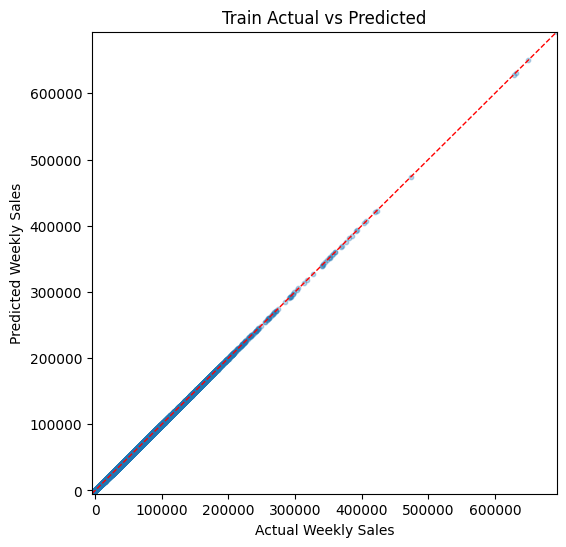

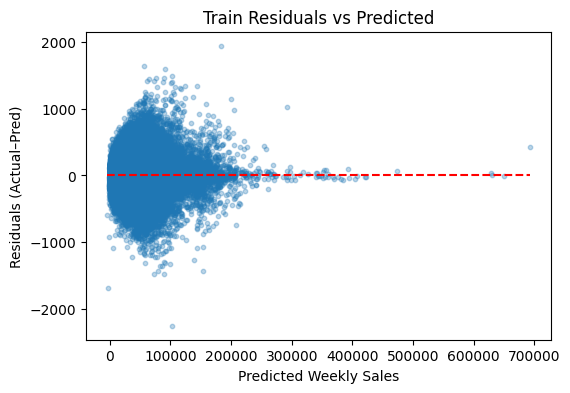

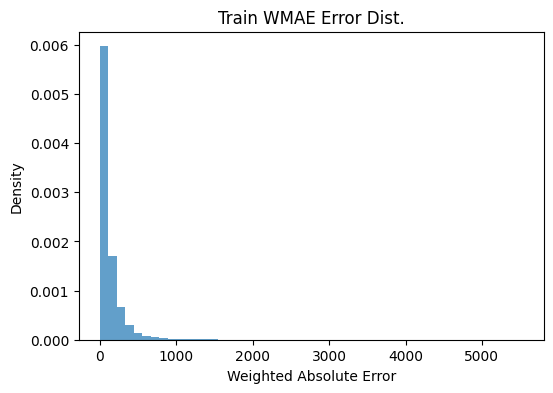

[TEST] WMAE=355.6555  MAE=349.7686  RMSE=1091.1082  R2=0.9976


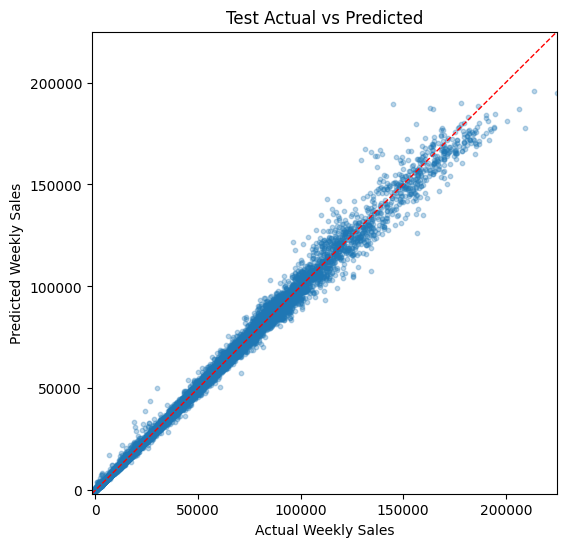

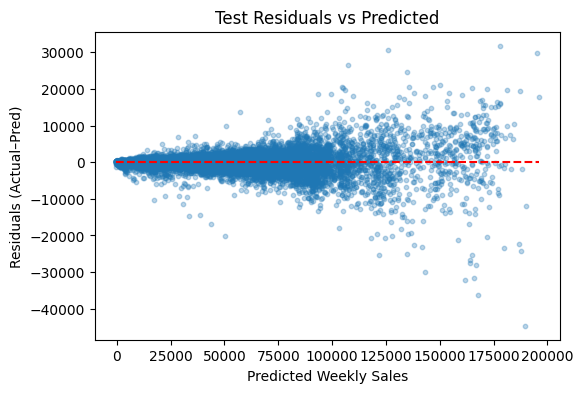

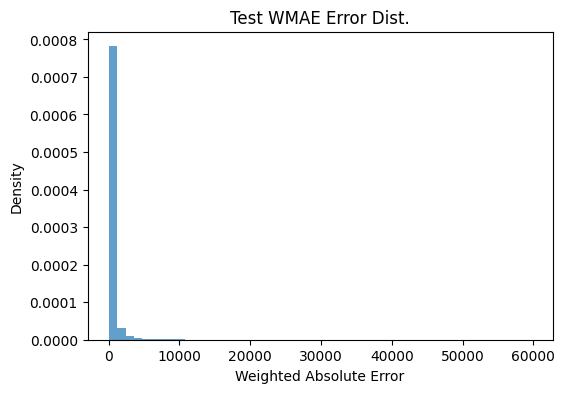

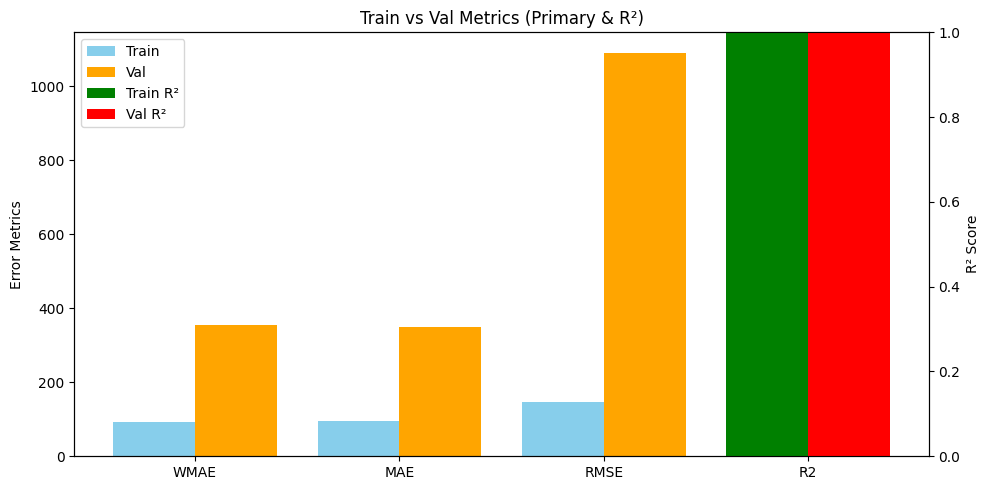

2025/07/25 15:19:18 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.


🏃 View run XGB_final_run at: https://dagshub.com/nkhar21/ML_Final_Project.mlflow/#/experiments/7/runs/e9462d36b32b4bc8a9808569209fb027
🧪 View experiment at: https://dagshub.com/nkhar21/ML_Final_Project.mlflow/#/experiments/7


RestException: INTERNAL_ERROR: Response: {'error': 'unsupported endpoint, please contact support@dagshub.com'}

In [ ]:
mlflow.end_run()
mlflow.set_experiment("Training_XGB")
with mlflow.start_run(run_name="XGB_final_run"):
    mlflow.log_params({
        "n_estimators":       n_estimators,
        "max_depth":          max_depth,
        "learning_rate":      learning_rate,
        "subsample":          subsample,
        "colsample_bytree":   colsample_bytree,
        "gamma":              gamma,
        "reg_alpha":          reg_alpha,
        "reg_lambda":         reg_lambda,
        "early_stopping":     early_stop_rounds,
        "objective":          "reg:squarederror",
        "device":             "cuda"
    })

    model.fit(
        X_train_1, y_train_1,
        eval_set=[(X_test_1, y_test_1)],
        verbose=False,
    )

    train_metrics = evaluate_and_plot(model, X_train_1, y_train_1, w_train, split="train")
    test_metrics  = evaluate_and_plot(model, X_test_1,  y_test_1,  w_test,  split="test")
    plot_overfitting(train_metrics, test_metrics)

    mlflow.xgboost.log_model(best_model, artifact_path="xgb_model")
    print("✅ Best model saved to MLflow under `xgb_model`")

# RFE final

In [ ]:
X_train.columns, X_train.shape, X_test.columns, X_test.shape

(Index(['Store', 'Dept', 'IsHoliday', 'Temperature', 'Fuel_Price', 'MarkDown1',
        'MarkDown2', 'MarkDown3', 'MarkDown4', 'MarkDown5', 'CPI',
        'Unemployment', 'Type', 'Size', 'Day', 'Month', 'Year', 'month_sin',
        'month_cos', 'week_sin', 'week_cos', 'Days_to_Thanksgiving',
        'Days_to_Christmas', 'days_since_thanksgiving', 'days_since_christmas',
        'thanksgiving_period_flag', 'christmas_period_flag',
        'superbowl_period_flag', 'labor_day_period_flag',
        'pre_thanksgiving_intensity', 'pre_christmas_intensity',
        'post_holiday_effect', 'store_mean_sales', 'store_std_sales',
        'store_median_sales', 'dept_mean_sales', 'dept_std_sales',
        'dept_median_sales', 'sd_mean_sales', 'sd_std_sales', 'sd_median_sales',
        'lag_1', 'lag_2', 'lag_3', 'lag_5', 'lag_26', 'lag_52',
        'rolling_mean_4', 'rolling_mean_8', 'ewm_4', 'ewm_8',
        'fuel_size_interaction', 'economic_pressure', 'purchasing_power',
        'total_markdown',

Top 10 features by normalized gain:


,feature,gain,gain_norm
0,ewm_4,1.836176e+11,0.566068
1,rolling_mean_4,3.520271e+10,0.108525
2,thanksgiving_period_flag,3.381114e+10,0.104235
3,lag_52,1.946390e+10,0.060005
4,pre_christmas_intensity,6.831446e+09,0.021060
5,ewm_8,5.313875e+09,0.016382
6,post_holiday_effect,4.072575e+09,0.012555
7,IsHoliday,3.351510e+09,0.010332
8,sd_std_sales,2.886767e+09,0.008900
9,MarkDown3,2.635862e+09,0.008126



Bottom 10 features by normalized gain:


,feature,gain,gain_norm
47,Store,185200128.0,0.000571
48,month_cos,175033872.0,0.000540
49,Fuel_Price,172232976.0,0.000531
50,Temperature,161043392.0,0.000496
51,fuel_size_interaction,158741328.0,0.000489
52,Year,119095064.0,0.000367
53,days_since_thanksgiving,92204512.0,0.000284
54,days_since_christmas,88895896.0,0.000274
55,labor_day_period_flag,67496656.0,0.000208
56,markdown_count,35974620.0,0.000111


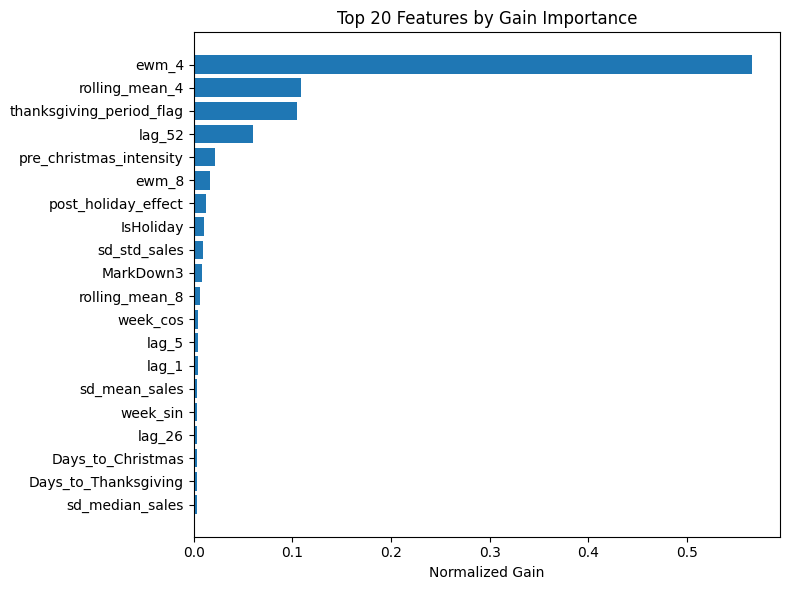

In [ ]:
import pandas as pd
from xgboost import XGBRegressor
import matplotlib.pyplot as plt

# 1) Fit a quick XGB for importance
model = XGBRegressor(
    n_estimators=500,
    max_depth=6,
    learning_rate=0.1,
    subsample=0.8,
    colsample_bytree=0.8,
    objective="reg:squarederror",
    random_state=42,
    device = "cuda",
    n_jobs=-1
)
model.fit(X_train, y_train)

# 2) Pull out gain‐based importances
gain_dict = model.get_booster().get_score(importance_type='gain')
imp_df = (
    pd.DataFrame.from_dict(gain_dict, orient='index', columns=['gain'])
      .sort_values('gain', ascending=False)
      .reset_index()
      .rename(columns={'index':'feature'})
)
imp_df['gain_norm'] = imp_df['gain'] / imp_df['gain'].sum()

# 3) Show top 10 and bottom 10
print("Top 10 features by normalized gain:")
display(imp_df.head(10))

print("\nBottom 10 features by normalized gain:")
display(imp_df.tail(10))

# 4) (Optional) A horizontal barplot of the top 20
plt.figure(figsize=(8,6))
plt.barh(imp_df.head(20)['feature'][::-1],
         imp_df.head(20)['gain_norm'][::-1])
plt.title("Top 20 Features by Gain Importance")
plt.xlabel("Normalized Gain")
plt.tight_layout()
plt.show()


In [ ]:
imp_df[40:]

,feature,gain,gain_norm
40,holiday_markdown_boost,316123616.0,0.000975
41,dept_std_sales,255406528.0,0.000787
42,economic_pressure,249731920.0,0.000770
43,CPI,244570128.0,0.000754
44,store_median_sales,240554368.0,0.000742
45,superbowl_period_flag,232626160.0,0.000717
46,MarkDown4,214550432.0,0.000661
47,Store,185200128.0,0.000571
48,month_cos,175033872.0,0.000540
49,Fuel_Price,172232976.0,0.000531


# Train best model on test set

In [ ]:
from sklearn.pipeline import Pipeline

features_interp = TrendInterpolator().fit_transform(features)
cleaning_pipeline = Pipeline([
    ("merge",       BaseMerger(features_interp, stores)),
    ("fill_markdowns", MarkdownFiller()),
    ("encode",      CategoricalEncoder())
])

fe_full_pipeline = Pipeline([
    ("stats",       StatisticalSalesFeatures()),
    ("seasonal",    AdvancedSeasonalFeatures()),
    ("econ",        EconomicInteractionFeatures()),
    ("lag",         VeryAdvancedLagFeatureEngineer())
])

df_clean_train = cleaning_pipeline.fit_transform(train)
df_final_train = fe_full_pipeline.fit_transform(df_clean_train)

df_clean_train.columns, df_clean_train.shape, df_final_train.columns, df_final_train.shape

(Index(['Store', 'Dept', 'Date', 'Weekly_Sales', 'IsHoliday', 'Temperature',
        'Fuel_Price', 'MarkDown1', 'MarkDown2', 'MarkDown3', 'MarkDown4',
        'MarkDown5', 'CPI', 'Unemployment', 'Type', 'Size'],
       dtype='object'),
 (421570, 16),
 Index(['Store', 'Dept', 'Date', 'Weekly_Sales', 'IsHoliday', 'Temperature',
        'Fuel_Price', 'MarkDown1', 'MarkDown2', 'MarkDown3', 'MarkDown4',
        'MarkDown5', 'CPI', 'Unemployment', 'Type', 'Size', 'store_mean_sales',
        'store_std_sales', 'store_median_sales', 'dept_mean_sales',
        'dept_std_sales', 'dept_median_sales', 'sd_mean_sales', 'sd_std_sales',
        'sd_median_sales', 'Day', 'Month', 'Year', 'month_sin', 'month_cos',
        'week_sin', 'week_cos', 'Days_to_Thanksgiving', 'Days_to_Christmas',
        'days_since_thanksgiving', 'days_since_christmas',
        'thanksgiving_period_flag', 'christmas_period_flag',
        'superbowl_period_flag', 'labor_day_period_flag',
        'pre_thanksgiving_intensity', 

In [ ]:
df_clean_test = cleaning_pipeline.transform(test)
df_final_test = fe_full_pipeline.transform(df_clean_test)

df_clean_test.columns, df_clean_test.shape, df_final_test.columns, df_final_test.shape

/usr/local/lib/python3.11/dist-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(


(Index(['Store', 'Dept', 'Date', 'IsHoliday', 'Temperature', 'Fuel_Price',
        'MarkDown1', 'MarkDown2', 'MarkDown3', 'MarkDown4', 'MarkDown5', 'CPI',
        'Unemployment', 'Type', 'Size'],
       dtype='object'),
 (115064, 15),
 Index(['Store', 'Dept', 'Date', 'IsHoliday', 'Temperature', 'Fuel_Price',
        'MarkDown1', 'MarkDown2', 'MarkDown3', 'MarkDown4', 'MarkDown5', 'CPI',
        'Unemployment', 'Type', 'Size', 'store_mean_sales', 'store_std_sales',
        'store_median_sales', 'dept_mean_sales', 'dept_std_sales',
        'dept_median_sales', 'sd_mean_sales', 'sd_std_sales', 'sd_median_sales',
        'Day', 'Month', 'Year', 'month_sin', 'month_cos', 'week_sin',
        'week_cos', 'Days_to_Thanksgiving', 'Days_to_Christmas',
        'days_since_thanksgiving', 'days_since_christmas',
        'thanksgiving_period_flag', 'christmas_period_flag',
        'superbowl_period_flag', 'labor_day_period_flag',
        'pre_thanksgiving_intensity', 'pre_christmas_intensity',
     

In [ ]:
X_train = df_final_train.drop(['Weekly_Sales', 'Date'], axis=1)
y_train = df_final_train["Weekly_Sales"]
X_test = df_final_test.drop(['Date'], axis=1)
X_train.shape, y_train.shape, X_test.shape

((421570, 75), (421570,), (115064, 75))

In [ ]:
gamma = 0
reg_alpha = 1
reg_lambda = 5
ne = 5000
md = 9
lr = 0.03
ss = 0.9
cs = 0.8

import xgboost as xgb
best_model = xgb.XGBRegressor(
    n_estimators=ne,
    max_depth=md,
    learning_rate=lr,
    subsample=ss,
    colsample_bytree=cs,
    gamma=gamma,
    reg_alpha=reg_alpha,
    reg_lambda=reg_lambda,
    objective="reg:squarederror",
    random_state=42,
    n_jobs=-1,
    device = "cuda",
)
best_model.fit(X_train, y_train)

/usr/local/lib/python3.11/dist-packages/xgboost/training.py:183: UserWarning: [17:45:53] WARNING: /workspace/src/context.cc:49: No visible GPU is found, setting device to CPU.
  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.11/dist-packages/xgboost/training.py:183: UserWarning: [17:45:53] WARNING: /workspace/src/context.cc:203: XGBoost is not compiled with CUDA support.
  bst.update(dtrain, iteration=i, fobj=obj)


XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=0.8, device='cuda', early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             feature_weights=None, gamma=0, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=0.03, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=9,
             max_leaves=None, min_child_weight=None, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=5000,
             n_jobs=-1, num_parallel_tree=None, ...)

# predict and generate submission

In [ ]:
y_test_prediction = best_model.predict(X_test)
submission = pd.DataFrame({
    "Id": test["Store"].astype(str) + "_" +
          test["Dept"].astype(str) + "_" +
          test["Date"].astype(str),
    "Weekly_Sales": y_test_prediction
})
submission.to_csv("xgb_best_submission.csv", index=False)
print("✅ Wrote xgb_best_submission.csv")

✅ Wrote xgb_best_submission.csv
